# Advanced Lane Lines Detection

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Apply a perspective transform to rectify image ("birds-eye view").
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import pickle
import re
import math

%matplotlib inline

In [2]:
### Utility Functions

    
def plot_images(data, layout='row', cols=2, figsize=(20, 12)):
    '''
    Utility function for plotting images
    :param data [(ndarray, string)]: List of data to display, [(image, title)]
    :param layout (string): Layout, row-wise or column-wise
    :param cols (number): Number of columns per row
    :param figsize (number, number): Tuple indicating figure size
    '''
    rows = math.ceil(len(data) / cols)
    f, ax = plt.subplots(figsize=figsize)
    if layout == 'row':
        for idx, d in enumerate(data):
            img, title = d

            plt.subplot(rows, cols, idx+1)
            plt.title(title, fontsize=20)
            plt.axis('off')
            if len(img.shape) == 2:
                plt.imshow(img, cmap='gray')
                
            elif len(img.shape) == 3:
                plt.imshow(img)
                
    elif layout == 'col':
        counter = 0
        for r in range(rows):
            for c in range(cols):
                img, title = data[r + rows*c]
                nb_channels = len(img.shape)
                
                plt.subplot(rows, cols, counter+1)
                plt.title(title, fontsize=20)
                plt.axis('off')
                if len(img.shape) == 2:
                    plt.imshow(img, cmap='gray')
                
                elif len(img.shape) == 3:
                    plt.imshow(img)
              
                counter += 1

    return ax
    

test_img_paths = glob.glob('test_images/test*.jpg')


# List of all demos to visualise
plot_demo = [1, 2, 3, 4, 5, 6, 7, 8]

## 1. Camera Calibration & Distortion correction

Compute the camera calibration matrix and distortion coefficients

In [3]:
def calibrate_camera():
    
    #Computes the camera calibration matrix and distortion coefficients
    #return: Camera calibration matrix and distortion coefficients
    
    
    imgpaths = glob.glob('camera_calibration/calibration*.jpg')
    
    # View a sample calibration image
    %matplotlib inline
    
    image = cv2.imread(imgpaths[0])
    imshape = image.shape[:2] # gets only the (height, width) to be used in the cv2.calibrateCamera()
    
    plt.imshow(image)
    plt.show()
    print('Image shape: {}'.format(image.shape))

    %matplotlib qt
    print()
    print('Calibrating the camera...')
    print()

    objpoints = []
    imgpoints = []

    nx = 9 # Number of inside corners on each row of the chessboard
    ny = 6 # Number of inside corners on each column of the chessboard

    # Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros([ny*nx, 3], dtype=np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    # Iterate over each calibration image and determine the objpoints and imgpoints
    for idx, imgpath in enumerate(imgpaths):
        img = cv2.imread(imgpath)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret:
            img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)

            imgpoints.append(corners)
            objpoints.append(objp)

            cv2.imshow('img', img)
            cv2.waitKey(500)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape[::-1], None, None)
   
    print('Calibration complete!')
    cv2.destroyAllWindows()
    return mtx, dist

# Note: the calibration process only needs to be run once in the absense of the pickled file
# containing the calculated aforementioned params
if os.path.exists('camera_calib.p'):
    with open('camera_calib.p', mode='rb') as f:
        data = pickle.load(f)
        mtx, dist = data['mtx'], data['dist']
        print('Loaded the saved camera calibration matrix & dist coefficients!')
else:
    mtx, dist = calibrate_camera()
    with open('camera_calib.p', mode='wb') as f:
        pickle.dump({'mtx': mtx, 'dist': dist}, f)

def undistort(img, mtx, dist):
    '''
    Undistorts an image
    :param img (ndarray): Image, represented an a numpy array
    :param mtx: Camera calibration matrix
    :param dist: Distortion coeff's
    :return : Undistorted image
    '''
    
    undistort_img = cv2.undistort(img, mtx, dist, None, mtx)
    return undistort_img

Loaded the saved camera calibration matrix & dist coefficients!


### 1.1 Demo

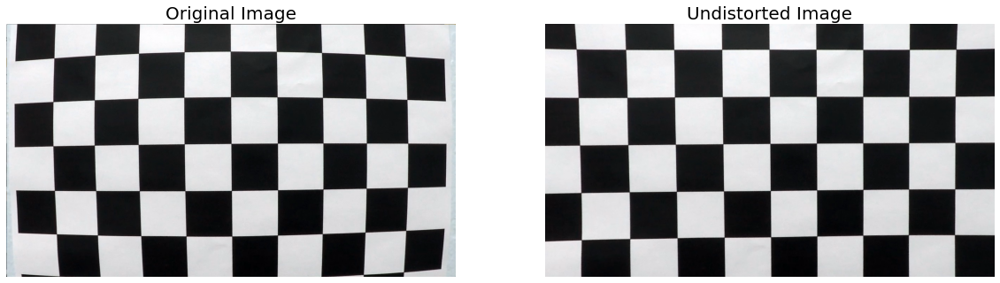

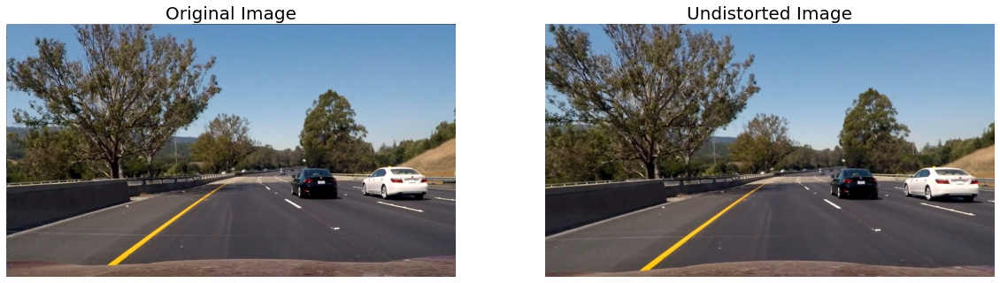

In [4]:
# Undistort a sample camera calibration image and a sample test image

if 1 in plot_demo:
    ccimg = cv2.imread('camera_calibration/calibration1.jpg')
    ccimg_undist = undistort(ccimg, mtx, dist)
    
    plot_images([
        (ccimg, 'Original Image'),
        (ccimg_undist, 'Undistorted Image')
    ])
    
    img_orig = mpimg.imread(test_img_paths[5])
    img = undistort(img_orig, mtx, dist)

    plot_images([
        (img_orig, 'Original Image'),
        (img, 'Undistorted Image')
    ])

## 2. Perspective Transformation

In [5]:
IMG_SHAPE = (720, 1280)

def get_roi(img, vertices):
    '''
    Transforms an image by preserving only the ROI represented by the
    the 'vertices' and removes the remainder of the image by setting the pixel intensity to 0
    :param img (ndarray): Image
    :param vertices (ndarray): Region of Interest of the image
    :return : Modified image
    '''
    
    vertices = np.array(vertices, ndmin=3, dtype=np.int32)
    if len(img.shape) == 3:
        fill_color = (255,) * 3
    else:
        fill_color = 255
            
    mask = np.zeros_like(img)
    mask = cv2.fillPoly(mask, vertices, fill_color)
    return cv2.bitwise_and(img, mask)
    
def warp_image(img, warp_shape, src, dst):
    '''
    Performs perspective transformation (PT)
    :param img (ndarray): Image
    :param warp_shape: Shape of the warped image
    :param src (ndarray): Source points
    :param dst (ndarray): Destination points
    :return : Tuple (Transformed image, PT matrix, PT inverse matrix)
    '''
    
    # Get the perspective transformation matrix and its inverse
    M = cv2.getPerspectiveTransform(src, dst)
    invM = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image
    warped = cv2.warpPerspective(img, M, warp_shape, flags=cv2.INTER_LINEAR)
    return warped, M, invM

def preprocess_image(img, visualise=False):
    '''
    Pre-processes an image. Steps include:
    1. Distortion correction
    2. Perspective Transformation
    3. ROI crop
    
    :param img (ndarray): Original Image
    :param visualise (boolean): Boolean flag for visualisation
    :return : Pre-processed image, (PT matrix, PT inverse matrix)
    '''
    
    ysize = img.shape[0]
    xsize = img.shape[1]
    
    # 1. Distortion correction
    undist = undistort(img, mtx, dist)
    
    # 2. Perspective transformation
    src = np.float32([
        (696,455),    
        (587,455), 
        (235,700),  
        (1075,700)
    ])

    dst = np.float32([
        (xsize - 350, 0),
        (350, 0),
        (350, ysize),
        (xsize - 350, ysize)
    ])

    warped, M, invM = warp_image(undist, (xsize, ysize), src, dst)

    # 3. ROI crop
    vertices = np.array([
        [200, ysize],
        [200, 0],
        [1100, 0],
        [1100, ysize]
    ])

    roi = get_roi(warped, vertices)
    
    # 4. Visualise the transformation
    
    img_ann = np.copy(img)
    roi_copy = np.copy(roi)
        
    cv2.polylines(img_ann, [np.int32(src)], True, (255, 0, 0), 3)
    cv2.polylines(roi_copy, [np.int32(dst)], True, (255, 0, 0), 3)
    
    if visualise:   
        plot_images([
            (img_ann, 'Original Image'),
            (roi_copy, 'Bird\'s Eye View Perspective')
        ])

    return img_ann,roi, (M, invM)

def get_image(img_path, visualise=False):
    '''
    Load an image from the 'img_path' and pre-process it
    :param img_path (string): Image path
    :param visualise (boolean): Boolean flag for visualisation
    :return : Transformed Image, (PT matrix, PT inv matrix)
    '''
    img = mpimg.imread(img_path)
    return preprocess_image(img, visualise=visualise)

### 2.1 Demo

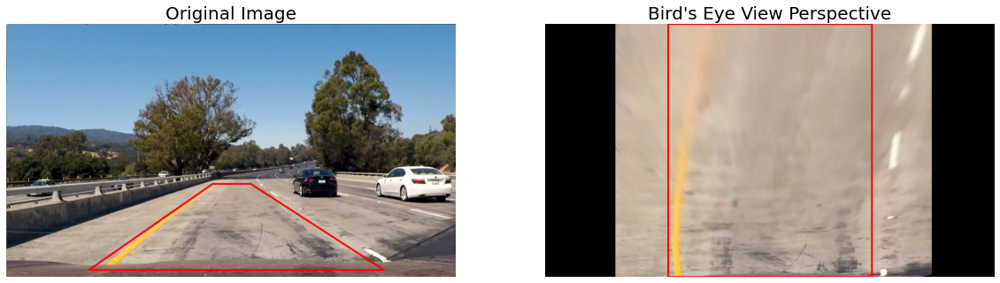

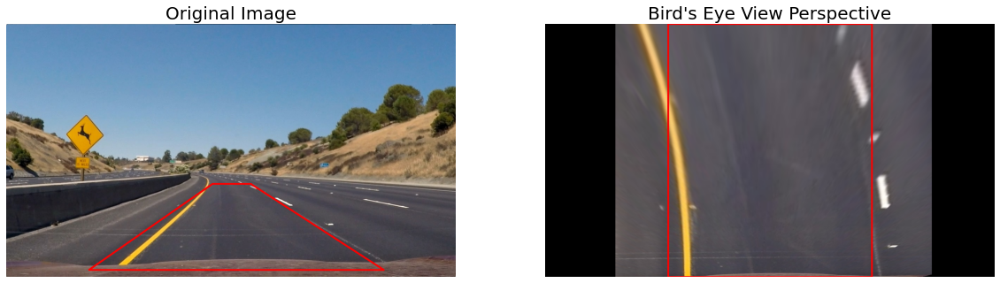

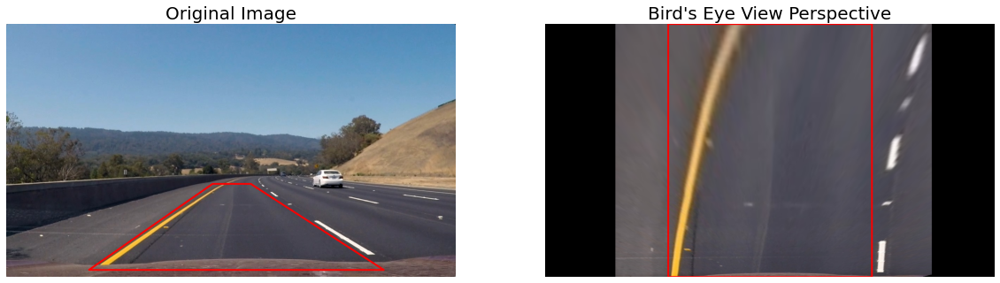

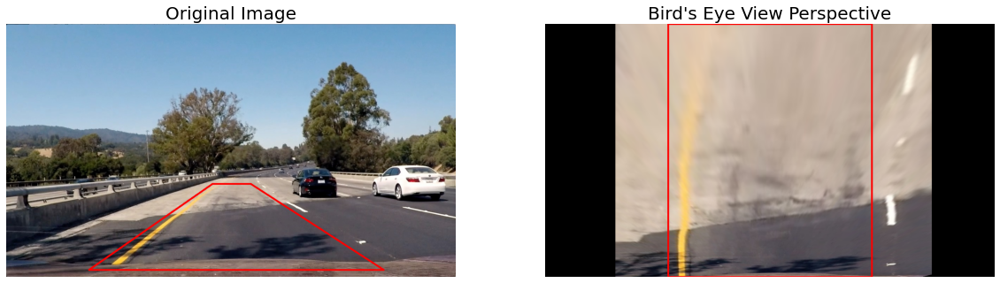

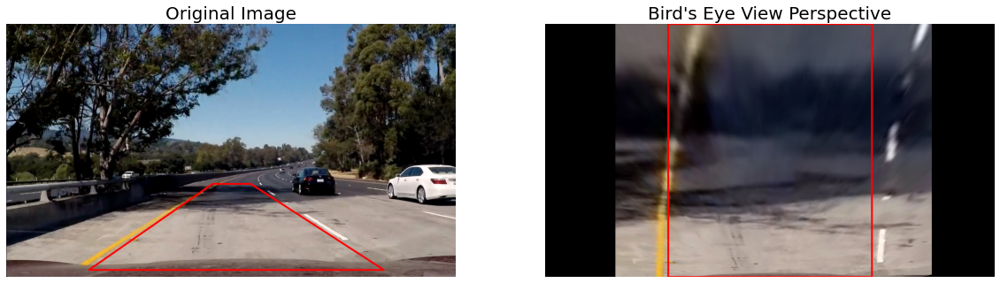

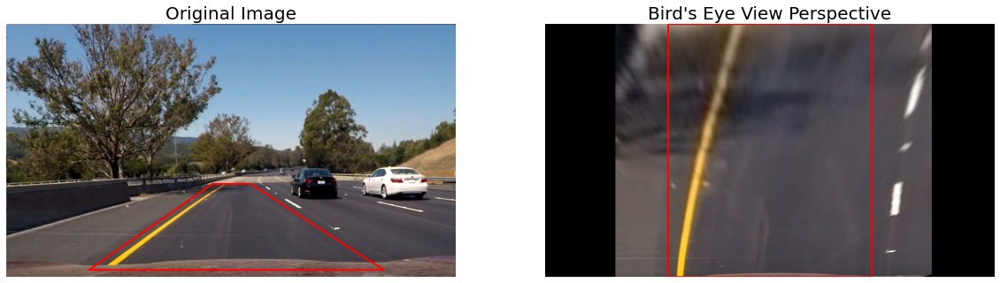

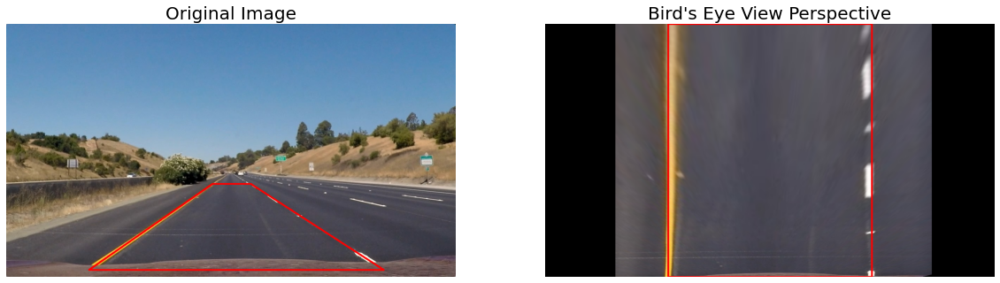

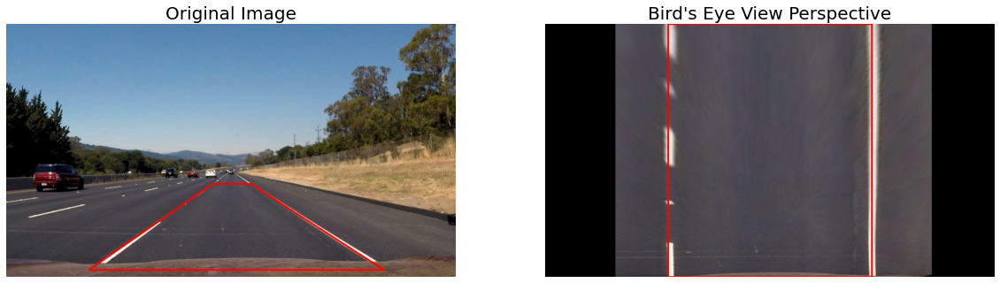

In [6]:
if 2 in plot_demo:
    for path in test_img_paths[:]:
        get_image(path, visualise=True)

## 3. Generate Thresholded Binary image

In [7]:
def binary_threshold(img, low, high):    
    if len(img.shape) == 2:
        output = np.zeros_like(img)
        mask = (img >= low) & (img <= high)
        
    elif len(img.shape) == 3:
        output = np.zeros_like(img[:,:,0])
        mask = (img[:,:,0] >= low[0]) & (img[:,:,0] <= high[0]) \
            & (img[:,:,1] >= low[1]) & (img[:,:,1] <= high[1]) \
            & (img[:,:,2] >= low[2]) & (img[:,:,2] <= high[2])
            
    output[mask] = 1
    return output

def get_binary_image(img, visualise=False):
    """
    Generate a thresholded binary image using transforms from an ensemble of color spaces: 
    LAB (Yellow), HSV (Yellow + White), HLS (Yellow + White), RGB (White) and 
    Adaptive Thresholding ()
    :param img (ndarray): Warped image
    :param visualise (boolean): Boolean flag for visualisation
    :return (ndarray): Thresholded binary image
    """
    
    ### LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    L = lab[:,:,0]
    L_max, L_mean = np.max(L), np.mean(L)
    B = lab[:,:,2]
    B_max, B_mean = np.max(B), np.mean(B)

    # YELLOW
    L_adapt_yellow = max(80, int(L_max * 0.45))
    B_adapt_yellow =  max(int(B_max * 0.70), int(B_mean * 1.2))
    lab_low_yellow = np.array((L_adapt_yellow, 120, B_adapt_yellow))
    lab_high_yellow = np.array((255, 145, 255))

    lab_yellow = binary_threshold(lab, lab_low_yellow, lab_high_yellow)
    lab_binary =lab_yellow
      
    ### HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    H_max, H_mean = np.max(H), np.mean(H)
    S = hsv[:,:,1]
    S_max, S_mean = np.max(S), np.mean(S)
    V = hsv[:,:,2]
    V_max, V_mean = np.max(V), np.mean(V)
    
    # YELLOW
    S_adapt_yellow =  max(int(S_max * 0.25), int(S_mean * 1.75))
    V_adapt_yellow =  max(50, int(V_mean * 1.25))
    hsv_low_yellow = np.array((15, S_adapt_yellow, V_adapt_yellow))
   
    hsv_high_yellow = np.array((30, 255, 255))
    hsv_yellow = binary_threshold(hsv, hsv_low_yellow, hsv_high_yellow)    

    # WHITE
    V_adapt_white = max(150, int(V_max * 0.8),int(V_mean * 1.25))
    hsv_low_white = np.array((0, 0, V_adapt_white))
    hsv_high_white = np.array((255, 40, 220))

    hsv_white = binary_threshold(hsv, hsv_low_white, hsv_high_white)

    hsv_binary = hsv_yellow | hsv_white

    ### HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    L_max, L_mean = np.max(L), np.mean(L)
    S = hls[:,:,2]
    S_max, S_mean = np.max(S), np.mean(S)
 
    # YELLOW
    L_adapt_yellow = max(80, int(L_mean * 1.25))
    S_adapt_yellow = max(int(S_max * 0.25), int(S_mean * 1.75))
    hls_low_yellow = np.array((15, L_adapt_yellow, S_adapt_yellow))
    hls_high_yellow = np.array((30, 255, 255))

    hls_yellow = binary_threshold(hls, hls_low_yellow, hls_high_yellow)
    
    # WHITE
    L_adapt_white =  max(160, int(L_max *0.8),int(L_mean * 1.25))
    hls_low_white = np.array((0, L_adapt_white,  0))
    hls_high_white = np.array((255, 255, 255))

    hls_white = binary_threshold(hls, hls_low_white, hls_high_white)
        
    hls_binary = hls_yellow | hls_white

    ### R color channel (WHITE)
    R = img[:,:,0]
    R_max, R_mean = np.max(R), np.mean(R)
    
    R_low_white = min(max(150, int(R_max * 0.55), int(R_mean * 1.95)),230)
    R_binary = binary_threshold(R, R_low_white, 255)
    
    ### Adaptive thresholding: Gaussian kernel 
    # YELLOW
    
    adapt_yellow_S = cv2.adaptiveThreshold(hls[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -5)
    adapt_yellow_B = cv2.adaptiveThreshold(lab[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -5)
    adapt_yellow = adapt_yellow_S & adapt_yellow_B
    
    # WHITE
    adapt_white_R = cv2.adaptiveThreshold(img[:,:,0], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -27)
    adapt_white_L = cv2.adaptiveThreshold(hsv[:,:,2], 1, \
                                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 161, -27)
    adapt_white = adapt_white_R & adapt_white_L
    
                                                  
    adapt_binary =  adapt_yellow | adapt_white

    ### Ensemble Voting
    combined = np.asarray(R_binary + lab_binary + hls_binary + hsv_binary + adapt_binary, dtype=np.uint8)

    combined[combined < 3] = 0
    combined[combined >= 3] = 1

    if visualise:
        plot_images([
            (img, 'Original'),
            (R_binary, 'R'),
            (hls_binary, 'HLS'),
            (hsv_binary, 'HSV'),
            (lab_binary, 'LAB'),
            (adapt_binary, 'Adaptive Thresh'),
            (combined, 'Combined'),
#             (hls_white, 'hls_white'),
#             (hls_yellow, 'hls yellow'),
#             (lab_white, 'lab white'),
#             (lab_yellow, 'lab yello'),
        ], figsize=(32, 42))

    return  combined

### 3.1 Demo

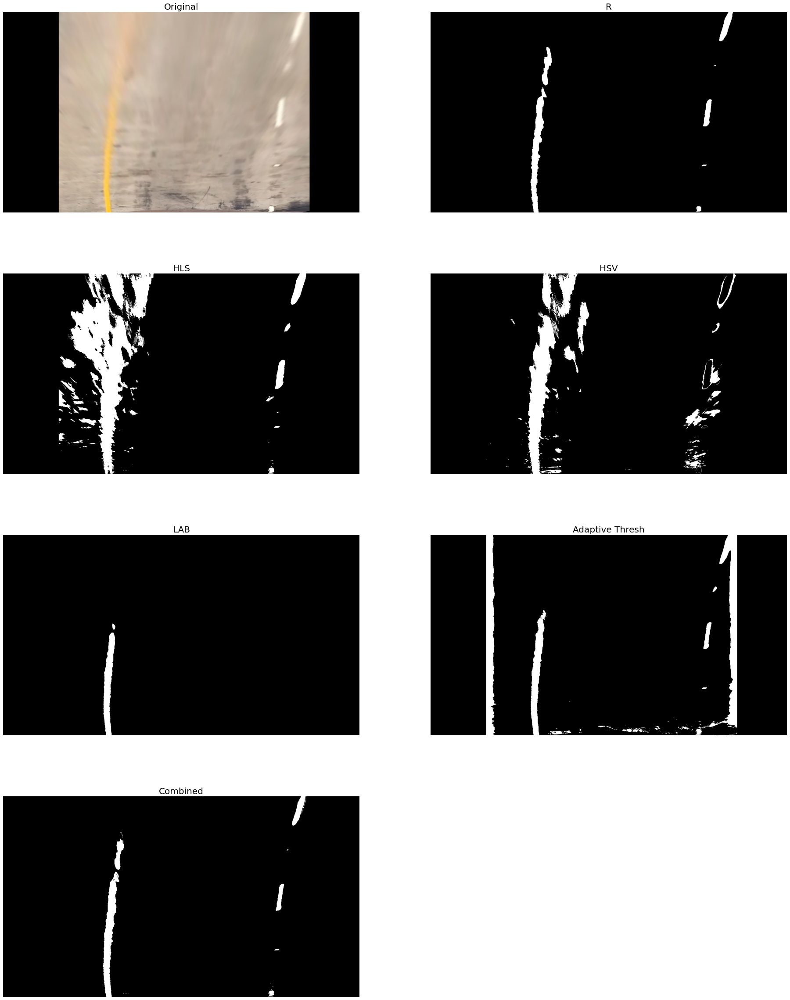

In [9]:
if 3 in plot_demo:
    for img_path in test_img_paths[:1]: #video2[5:10]:
        _, img, _ = get_image(img_path)
        get_binary_image(img, visualise=True)

## 4. Detect Lane Lines: Peaks in Histogram & Sliding Window Technique

In [10]:
def get_poly_points(left_fit, right_fit):
    '''
    Get the points for the left lane/ right lane defined by the polynomial coeff's 'left_fit'
    and 'right_fit'
    :param left_fit (ndarray): Coefficients for the polynomial that defines the left lane line
    :param right_fit (ndarray): Coefficients for the polynomial that defines the right lane line
    : return (Tuple(ndarray, ndarray, ndarray, ndarray)): x-y coordinates for the left and right lane lines
    '''
    ysize, xsize = IMG_SHAPE
    
    # Get the points for the entire height of the image
    plot_y = np.linspace(0, ysize-1, ysize)
    plot_xleft = left_fit[0] * plot_y**2 + left_fit[1] * plot_y + left_fit[2]
    plot_xright = right_fit[0] * plot_y**2 + right_fit[1] * plot_y + right_fit[2]
    
    # But keep only those points that lie within the image
    plot_xleft = plot_xleft[(plot_xleft >= 0) & (plot_xleft <= xsize - 1)]
    plot_xright = plot_xright[(plot_xright >= 0) & (plot_xright <= xsize - 1)]
    plot_yleft = np.linspace(ysize - len(plot_xleft), ysize - 1, len(plot_xleft))
    plot_yright = np.linspace(ysize - len(plot_xright), ysize - 1, len(plot_xright))
    
    return plot_xleft.astype(int), plot_yleft.astype(int), plot_xright.astype(int), plot_yright.astype(int)

def check_validity(left_fit, right_fit, diagnostics=False):
    '''
    Determine the validity of lane lines represented by a set of second order polynomial coefficients 
    :param left_fit (ndarray): Coefficients for the 2nd order polynomial that defines the left lane line
    :param right_fit (ndarray): Coefficients for the 2nd order polynomial that defines the right lane line
    :param diagnostics (boolean): Boolean flag for logging
    : return (boolean)
    '''
    
    if left_fit is None or right_fit is None:
        return False
    
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)

    # Check whether the two lines lie within a plausible distance from one another for three distinct y-values

    y1 = IMG_SHAPE[0] - 1 # Bottom
    y2 = IMG_SHAPE[0] - int(min(len(plot_yleft), len(plot_yright)) * 0.35) # For the 2nd and 3rd, take values between y1 and the top-most available value.
    y3 = IMG_SHAPE[0] - int(min(len(plot_yleft), len(plot_yright)) * 0.75)

    # Compute the respective x-values for both lines
    x1l = left_fit[0]  * (y1**2) + left_fit[1]  * y1 + left_fit[2]
    x2l = left_fit[0]  * (y2**2) + left_fit[1]  * y2 + left_fit[2]
    x3l = left_fit[0]  * (y3**2) + left_fit[1]  * y3 + left_fit[2]

    x1r = right_fit[0] * (y1**2) + right_fit[1] * y1 + right_fit[2]
    x2r = right_fit[0] * (y2**2) + right_fit[1] * y2 + right_fit[2]
    x3r = right_fit[0] * (y3**2) + right_fit[1] * y3 + right_fit[2]

    # Compute the L1 norms
    x1_diff = abs(x1l - x1r)
    x2_diff = abs(x2l - x2r)
    x3_diff = abs(x3l - x3r)

    # Define the threshold values for each of the three points
    min_dist_y1 = 480 # 510 # 530 
    max_dist_y1 = 730 # 750 # 660
    min_dist_y2 = 280
    max_dist_y2 = 730 # 660
    min_dist_y3 = 140
    max_dist_y3 = 730 # 660
    
    if (x1_diff < min_dist_y1) | (x1_diff > max_dist_y1) | \
        (x2_diff < min_dist_y2) | (x2_diff > max_dist_y2) | \
        (x3_diff < min_dist_y3) | (x3_diff > max_dist_y3):
        if diagnostics:
            print("Violated distance criterion: " +
                  "x1_diff == {:.2f}, x2_diff == {:.2f}, x3_diff == {:.2f}".format(x1_diff, x2_diff, x3_diff))
        return False

    # Check whether the line slopes are similar for two distinct y-values
    # x = Ay**2 + By + C
    # dx/dy = 2Ay + B
    
    y1left_dx  = 2 * left_fit[0]  * y1 + left_fit[1]
    y3left_dx  = 2 * left_fit[0]  * y3 + left_fit[1]
    y1right_dx = 2 * right_fit[0] * y1 + right_fit[1]
    y3right_dx = 2 * right_fit[0] * y3 + right_fit[1]

    # Compute the L1-norm
    norm1 = abs(y1left_dx - y1right_dx)
    norm2 = abs(y3left_dx - y3right_dx)
    
#     if diagnostics: print( norm1, norm2)

    # Define the L1 norm threshold
    thresh = 0.6 #0.58 
    if (norm1 >= thresh) | (norm2 >= thresh):
        if diagnostics:
            print("Violated tangent criterion: " +
                  "norm1 == {:.3f}, norm2 == {:.3f} (thresh == {}).".format(norm1, norm2, thresh))
            return False
    
    return True

def polyfit_sliding_window(binary, lane_width_px=578, visualise=False, diagnostics=False):
    '''
    Detect lane lines in a thresholded binary image using the sliding window technique
    :param binary (ndarray): Thresholded binary image
    :param lane_width_px (int): Average lane line width (in px) for the warped image 
    computed empirically
    :param visualise (boolean): Boolean flag for visualisation
    :param diagnositics (boolean): Boolean flag for logging
    '''
    
    global cache
    ret = True

    # Sanity check
    if binary.max() <= 0:
        return False, np.array([]), np.array([]), np.array([])
    
    # Step 1: Compute the histogram along all the columns in the lower half of the image. 
    # The two most prominent peaks in this histogram will be good indicators of the
    # x-position of the base of the lane lines
    histogram = None
    cutoffs = [int(binary.shape[0] / 2), 0]
    
    for cutoff in cutoffs:
        histogram = np.sum(binary[cutoff:, :], axis=0)
        
        if histogram.max() > 0:
            break

    if histogram.max() == 0:
        print('Unable to detect lane lines in this frame. Trying another frame!')
        return False, np.array([]), np.array([])
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = int(histogram.shape[0] / 2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    if visualise:
        plot_images([(binary, 'Binary')])
        plt.plot(histogram, 'm', linewidth=4.0)
        plt.plot((midpoint, midpoint), (0, IMG_SHAPE[0]), 'c')
        plt.plot((0, IMG_SHAPE[1]), (cutoff, cutoff), 'c')

    out = np.dstack((binary, binary, binary)) * 255

    nb_windows = 12 # number of sliding windows
    margin = 100 # width of the windows +/- margin
    minpix = 50 # min number of pixels needed to recenter the window
    window_height = int(IMG_SHAPE[0] / nb_windows)
    min_lane_pts = 10  # min number of 'hot' pixels needed to fit a 2nd order polynomial as a 
                    # lane line
    
    # Identify the x-y positions of all nonzero pixels in the image
    # Note: the indices here are equivalent to the coordinate locations of the
    # pixel
    nonzero = binary.nonzero()
    nonzerox = np.array(nonzero[1])
    nonzeroy = np.array(nonzero[0])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nb_windows):
        # Identify window boundaries in x and y (and left and right)
        win_y_low = IMG_SHAPE[0] - (1 + window) * window_height
        win_y_high = IMG_SHAPE[0] - window * window_height

        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin

        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw windows for visualisation
        cv2.rectangle(out, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high),\
                      (0, 255, 0), 2)
        cv2.rectangle(out, (win_xright_low, win_y_low), (win_xright_high, win_y_high),\
                      (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high)
                         & (nonzerox >= win_xleft_low) & (nonzerox <= win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy <= win_y_high)
                         & (nonzerox >= win_xright_low) & (nonzerox <= win_xright_high)).nonzero()[0]

        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) >  minpix:
            leftx_current = int(np.mean(nonzerox[good_left_inds]))

        if len(good_right_inds) > minpix:
            rightx_current = int(np.mean(nonzerox[good_right_inds]))

    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract pixel positions for the left and right lane lines
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit, right_fit = None, None
    
    # Sanity check; Fit a 2nd order polynomial for each lane line pixels
    if len(leftx) >= min_lane_pts and len(rightx) >= min_lane_pts:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
    
    # Validate detected lane lines
    valid = check_validity(left_fit, right_fit, diagnostics=diagnostics)
   
    if not valid:
        # If the detected lane lines are NOT valid:
        # 1. Compute the lane lines as an average of the previously detected lines
        # from the cache and flag this detection cycle as a failure by setting ret=False
        # 2. Else, if cache is empty, return 
        
        if len(cache) == 0:
            if diagnostics: print('WARNING: Unable to detect lane lines in this frame.')
            return False, np.array([]), np.array([])
        
        avg_params = np.mean(cache, axis=0)
        left_fit, right_fit = avg_params[0], avg_params[1]
        ret = False
        
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)

    # Color the detected pixels for each lane line
    out[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255, 10, 255]

    left_poly_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    right_poly_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])

    # Plot the fitted polynomial
    cv2.polylines(out, np.int32([left_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)
    cv2.polylines(out, np.int32([right_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)

    if visualise:
        plot_images([(img, 'Original'), (out, 'Out')], figsize=(30, 40))
        
    return ret, out, np.array([left_fit, right_fit])

### 4.1 Demo

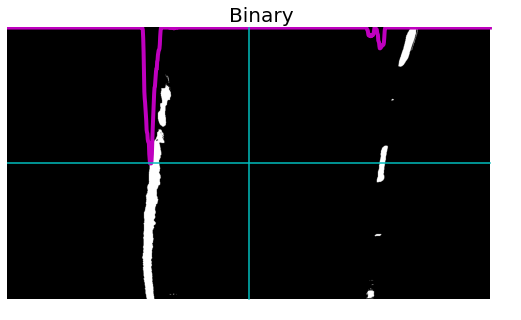

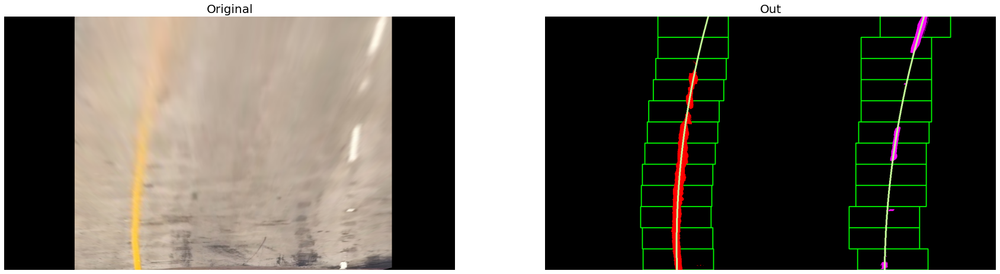

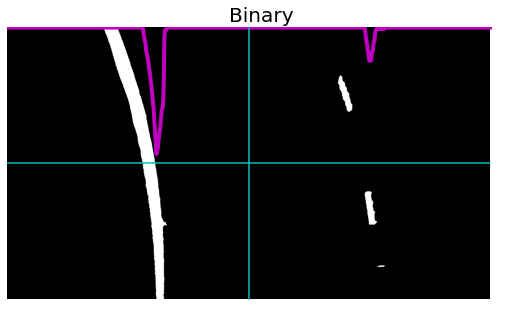

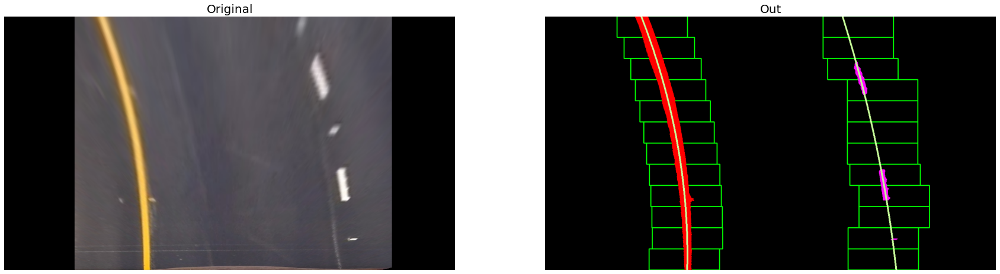

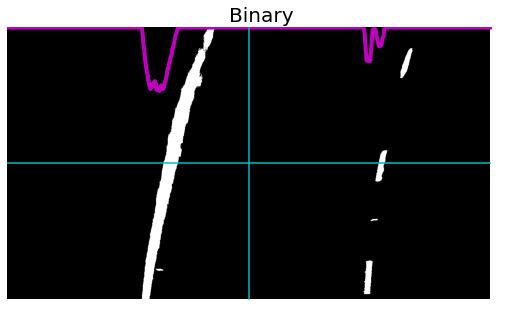

...

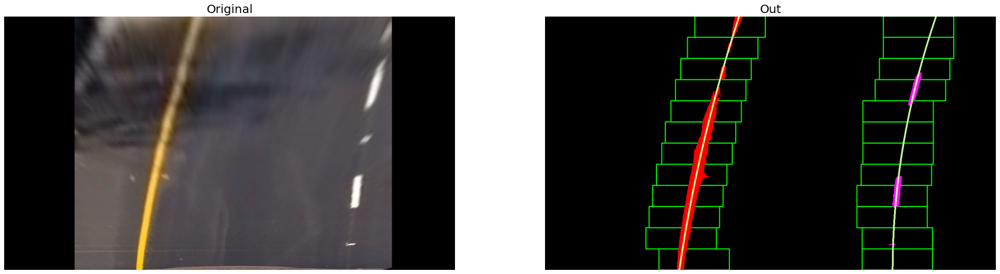

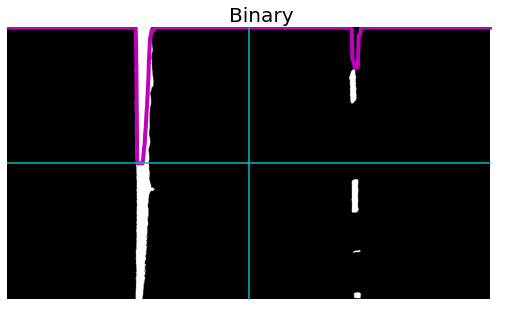

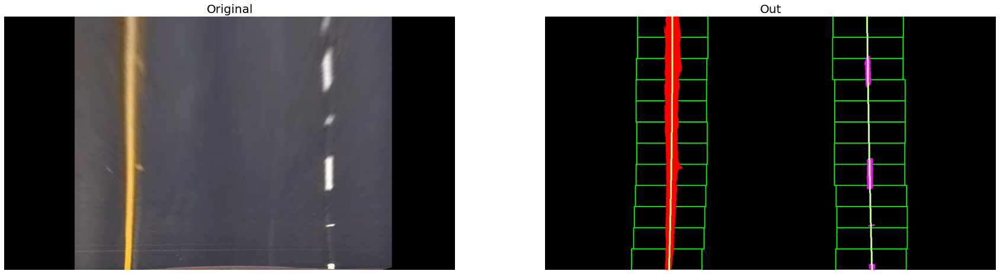

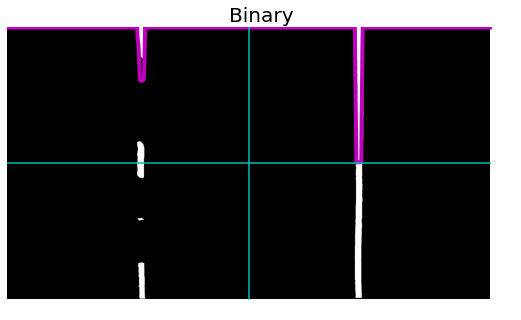

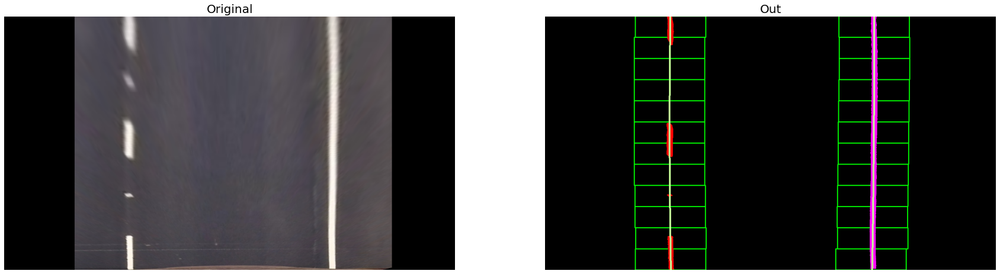

In [12]:
if 4 in plot_demo:

    cache = np.array([])

    for img_path in test_img_paths[:]: #video2[134:138]:
        _, img, _ = get_image(img_path)
        binary = get_binary_image(img, visualise=False)
        polyfit_sliding_window(binary, visualise=True)

## 5. Detect Lane Lines: Adaptive Search 

In [13]:
def polyfit_adapt_search(img, prev_poly_param, visualise=False, diagnostics=False):
    '''
    Function that: 
    1. Uses the sliding window technique to perform incremental localised adaptive threhsolding
    over the previosuly detected lane line trajectory to develop a threhsolded binary image. Then,
    2. Uses this generated binary image to detect and fit lane lines in a margin around the previous fit rather 
    than performing a blind search
    :param img (ndarray): Warped image
    :param prev_poly_param (ndarray): Polynomial coefficients of the previously detected lane lines
    :param visualise (boolean): Boolean flag for visualisation
    :param diagnostics (boolean): Boolean flag for logging
    : return (ndarray, ndarray): 3 channel image with the newly detected lane lines, current polynomial coefficients
    '''
    
    global cache # Cache of the previosuly detected lane line coefficients
    global attempts # Number of retries before the pipeline is RESET to detect lines via the smoothing window aproach
    
    # Sanity check
    assert(len(img.shape) == 3)
    
    # Setup
    nb_windows = 10 # Number of windows over which to perform the localised color thresholding  
    bin_margin = 80 # Width of the windows +/- margin for localised thresholding
    margin = 60 # Width around previous line positions +/- margin around which to search for the new lines
    window_height = int(img.shape[0] / nb_windows)
    smoothing_window = 5 # Number of frames over which to compute the Moving Average
    min_lane_pts = 10
    
    binary = np.zeros_like(img[:,:,0]) # Placeholder for the thresholded binary image
    img_plot = np.copy(img)
        
    left_fit, right_fit = prev_poly_param[0], prev_poly_param[1]
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
    
    leftx_current = int(plot_xleft[-1])
    rightx_current = int(plot_xright[-1])
    
    # Iterate over the windows, perform localised color thresholding and generate the binary image
    for window in range(nb_windows):
        # Identify window boundaries in x and y (and left and right)
        win_y_low = IMG_SHAPE[0] - (window + 1) * window_height
        win_y_high = IMG_SHAPE[0] - window * window_height
        win_xleft_low = min(max(0, leftx_current - bin_margin), 1280)
        win_xleft_high = min(max(0, leftx_current + bin_margin), 1280)
        win_xright_low = min(max(0, rightx_current - bin_margin), 1280)
        win_xright_high = min(max(0, rightx_current + bin_margin), 1280)

        img_win_left = img[win_y_low:win_y_high, win_xleft_low:win_xleft_high,:]
        binary[win_y_low:win_y_high, win_xleft_low:win_xleft_high] = \
            get_binary_image(img_win_left, visualise=False)

        img_win_right = img[win_y_low:win_y_high, win_xright_low:win_xright_high, :]
        binary[win_y_low:win_y_high, win_xright_low:win_xright_high] = \
            get_binary_image(img_win_right, visualise=False)

        # Given that we only keep the points/values for a line that lie within the image
        # (see 'get_poly_points'), the overall length and consequently number of points (i.e. x-values
        # and y-values) can be < the length of the image. As a result, we check for the presence
        # of the current window's lower y-value i.e 'win_y_low' as a valid point within the previously detected line
        # If, a point associated with this y-value exists, we update the x-position of the next window with
        # the corresponding x-value.
        # Else, we keep the x-position of the subsequent windows the same and move up the image
        idxs = np.where(plot_yleft == win_y_low)[0]
        if len(idxs) != 0:
            leftx_current = int(plot_xleft[idxs[0]])
            
        idxs = np.where(plot_yright == win_y_low)[0]
        if len(idxs) != 0:
            rightx_current = int(plot_xright[idxs[0]])

        if visualise:
            left_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
            right_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])
            
            # Plot the previously detected lane lines
            cv2.polylines(img_plot, np.int32([left_pts]), isClosed=False, color=(255, 20, 147), thickness=4)
            cv2.polylines(img_plot, np.int32([right_pts]), isClosed=False, color=(255, 20, 147), thickness=4)    
            
            bin_win_left = binary[win_y_low:win_y_high, win_xleft_low:win_xleft_high]
            bin_win_left = np.dstack((bin_win_left, np.zeros_like(bin_win_left), np.zeros_like(bin_win_left))) * 255

            bin_win_right = binary[win_y_low:win_y_high, win_xright_low:win_xright_high]
            bin_win_right = np.dstack([np.zeros_like(bin_win_right), np.zeros_like(bin_win_right), bin_win_right]) * 255
            
            # Blend the localised image window with its corresponding thresholded binary version
            win_left = cv2.addWeighted(bin_win_left, 0.5, img_win_left, 0.7, 0)
            win_right = cv2.addWeighted(bin_win_right, 0.5, img_win_right, 0.7, 0)
            
            # Draw the binary search window
            cv2.rectangle(img_plot, (win_xleft_low,win_y_low), (win_xleft_high,win_y_high), (0,255,0), 5)
            cv2.rectangle(img_plot, (win_xright_low,win_y_low), (win_xright_high,win_y_high), (0,255,0), 5)
            
            f, _ = plt.subplots(1, 2, figsize=(13,5))

            plt.subplot(121)
            plt.axis('off')
            plt.imshow(binary, cmap='gray')

            plt.subplot(122)
            plt.axis('off')
            plt.imshow(img_plot)

            plt.subplots_adjust(top=0.98, bottom=0.0, left=0.0, right=1.0, hspace=0.1, wspace=0.05)
            plt.savefig('./gif_images/window1{:02}.png'.format(window))
            
            # The blended Binary window and Image window is added later for better visualisation
            img_plot[win_y_low:win_y_high, win_xleft_low:win_xleft_high] = win_left
            img_plot[win_y_low:win_y_high, win_xright_low:win_xright_high] = win_right
        
    # Identify the x-y coordinates of all the non-zero pixels from the binary image
    # generated above
    nonzero = binary.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Extract all the 
    left_lane_inds = \
        ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) &
        (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = \
        ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) &
         (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Sanity checks
    if len(leftx) > min_lane_pts:
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        if diagnostics: print('WARNING: Less than {} pts detected for the left lane. {}'.format(min_lane_pts, len(leftx)))

    if len(rightx) > min_lane_pts:
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        if diagnostics: print('WARNING: Less than {} pts detected for the right lane. {}'.format(min_lane_pts, len(rightx)))
        
    valid = check_validity(left_fit, right_fit, diagnostics=diagnostics)

    # Perform smoothing via moving average
    if valid:
        if len(cache) < smoothing_window:
            cache = np.concatenate((cache, [np.array([left_fit, right_fit])]), axis=0)
        elif len(cache) >= smoothing_window:
            cache[:-1] = cache[1:]
            cache[-1] = np.array([left_fit, right_fit])
  
        avg_params = np.mean(cache, axis=0)
        left_fit, right_fit = avg_params[0], avg_params[1]
        plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
        curr_poly_param = np.array([left_fit, right_fit])
    else:
        attempts += 1
        curr_poly_param = prev_poly_param
    
    out = np.dstack([binary, binary, binary]) * 255
    win_img = np.zeros_like(out)

    # Color the lane line pixels
    out[lefty, leftx] = [255, 0, 0]
    out[righty, rightx] = [255, 10, 255]

    left_window1 = np.array([np.transpose(np.vstack([plot_xleft - margin, plot_yleft]))])
    left_window2 = np.array([np.flipud(np.transpose(np.vstack([plot_xleft + margin, plot_yleft])))])
    left_pts = np.hstack([left_window1, left_window2])

    right_window1 = np.array([np.transpose(np.vstack([plot_xright - margin, plot_yright]))])
    right_window2 = np.array([np.flipud(np.transpose(np.vstack([plot_xright + margin, plot_yright])))])
    right_pts = np.hstack([right_window1, right_window2])

    # Draw the search boundary
    cv2.fillPoly(win_img, np.int_([left_pts]), (0, 255, 0))
    cv2.fillPoly(win_img, np.int_([right_pts]), (0, 255, 0))

    out = cv2.addWeighted(out, 1, win_img, 0.25, 0)

    left_poly_pts = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    right_poly_pts = np.array([np.transpose(np.vstack([plot_xright, plot_yright]))])

    # Draw the fit lane lines
    cv2.polylines(out, np.int32([left_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)
    cv2.polylines(out, np.int32([right_poly_pts]), isClosed=False, color=(200,255,155), thickness=4)

    return out, curr_poly_param

### 5.1 Demo

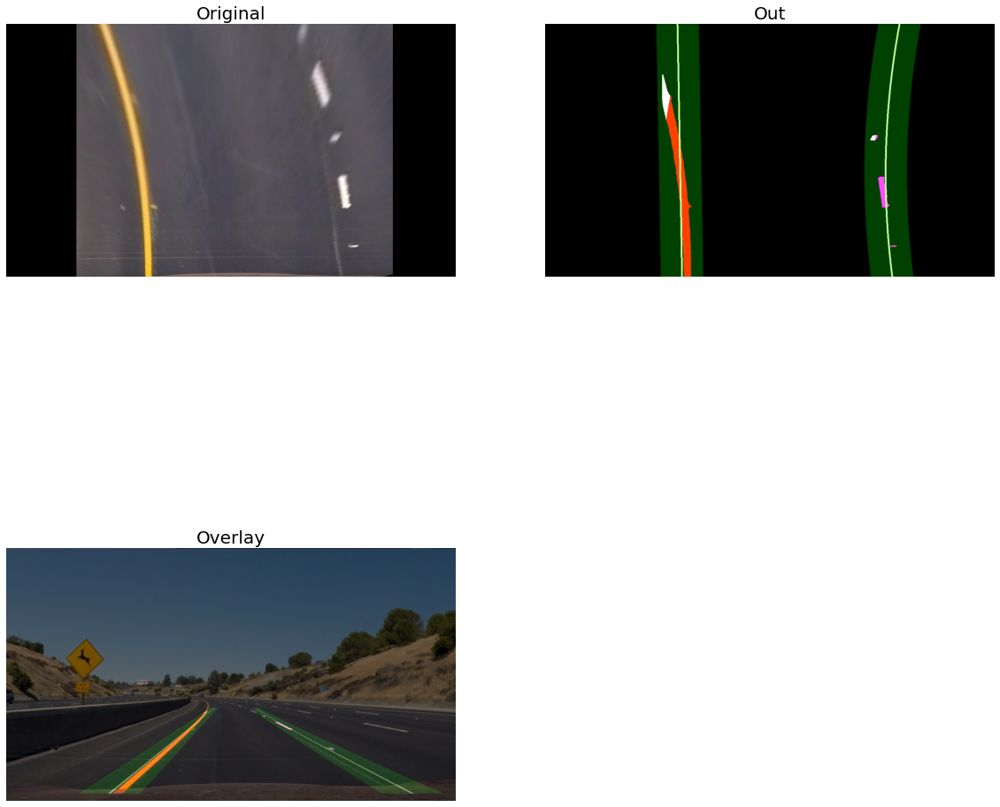

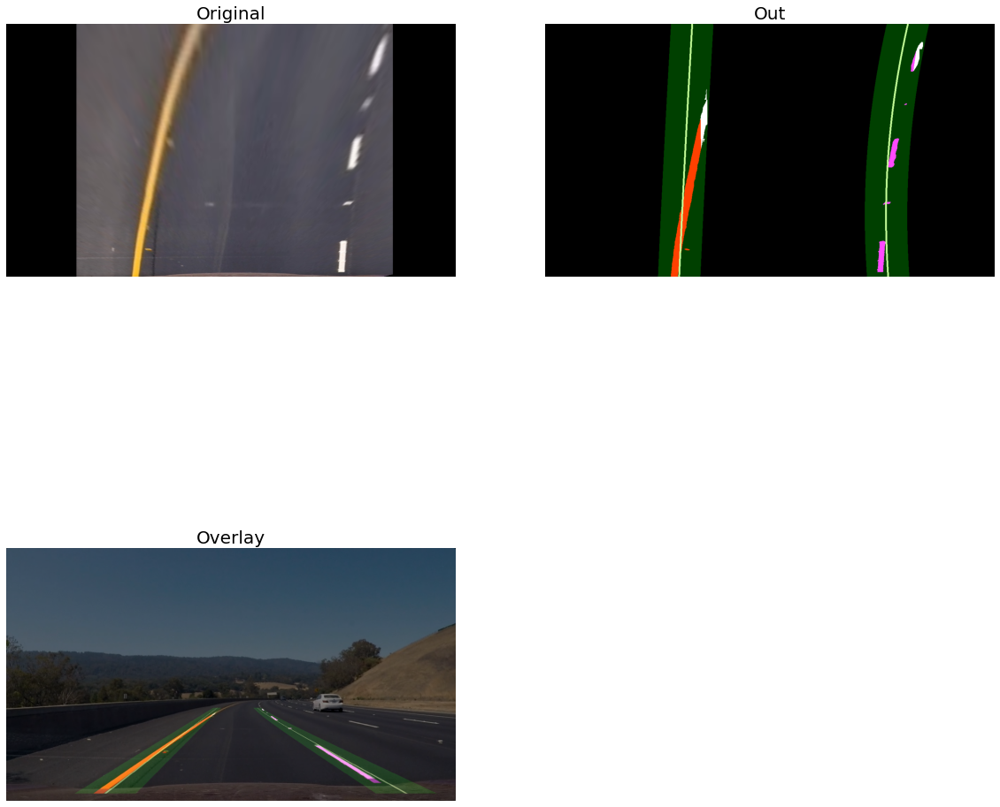

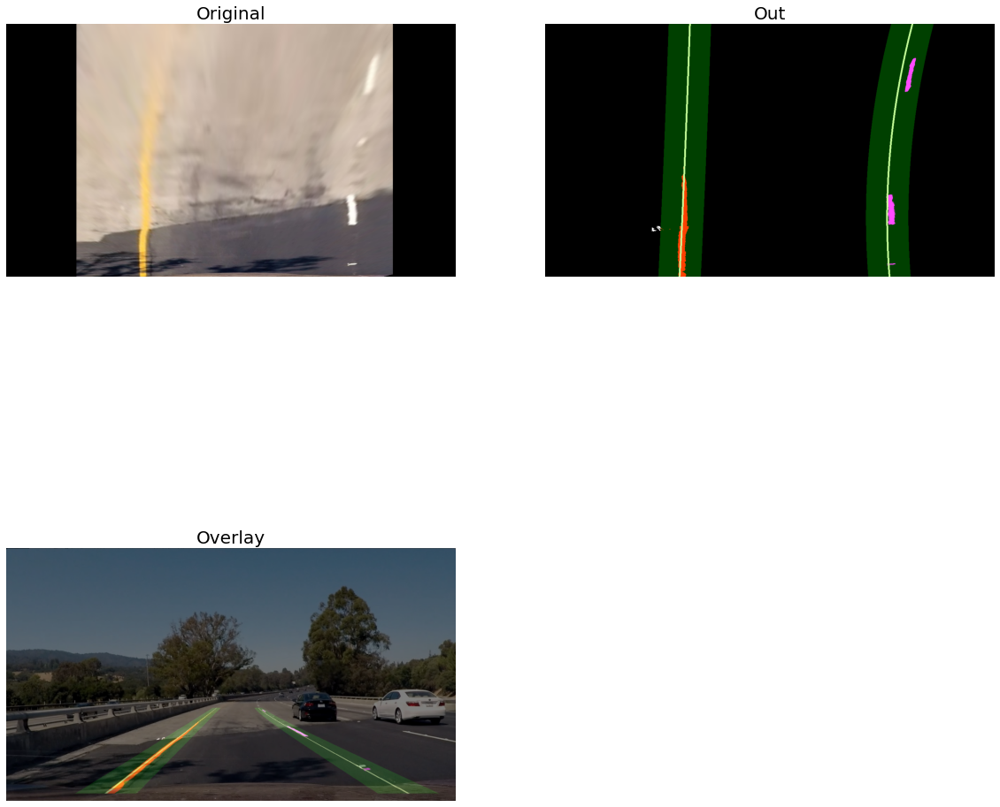

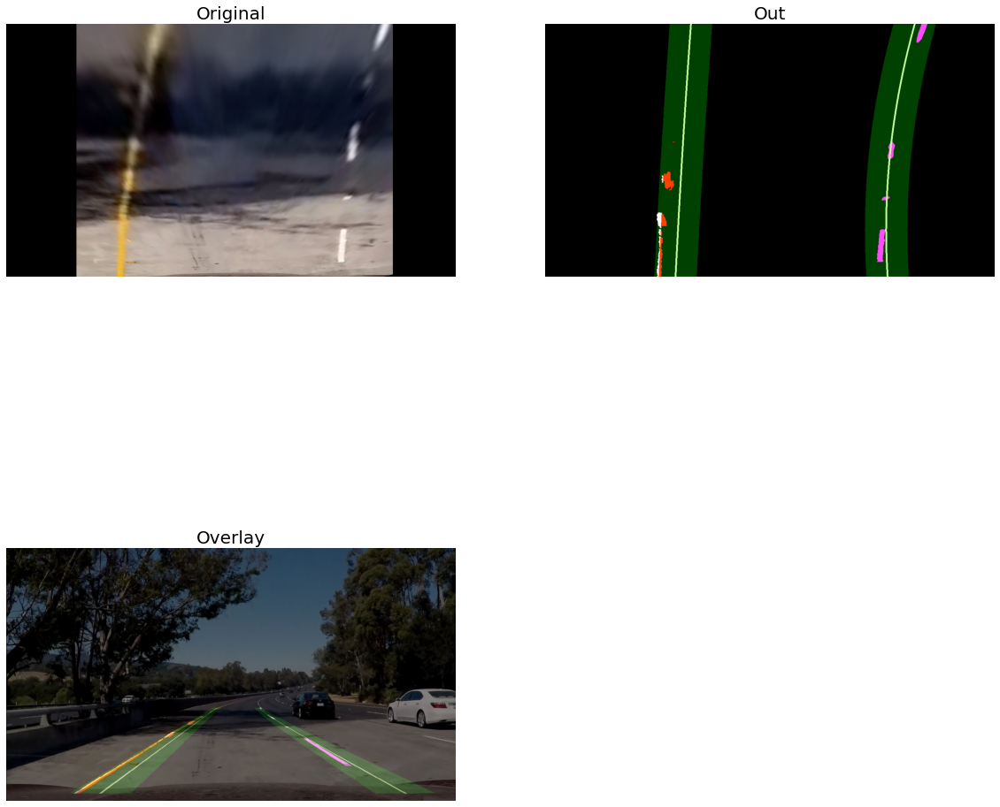

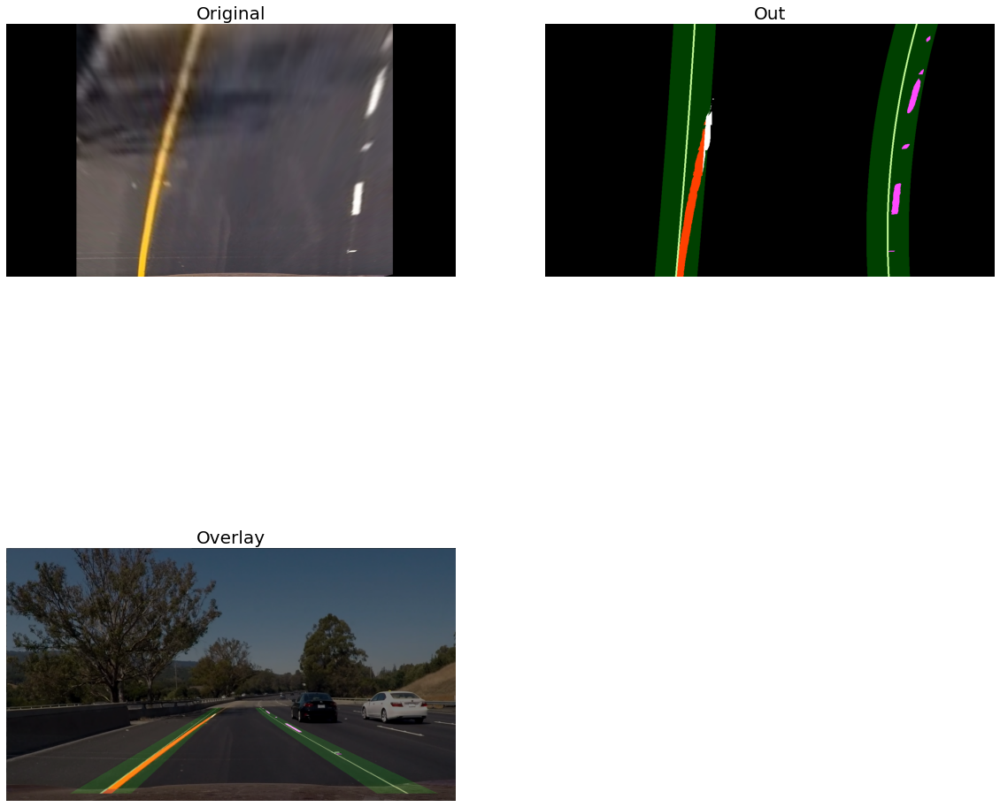

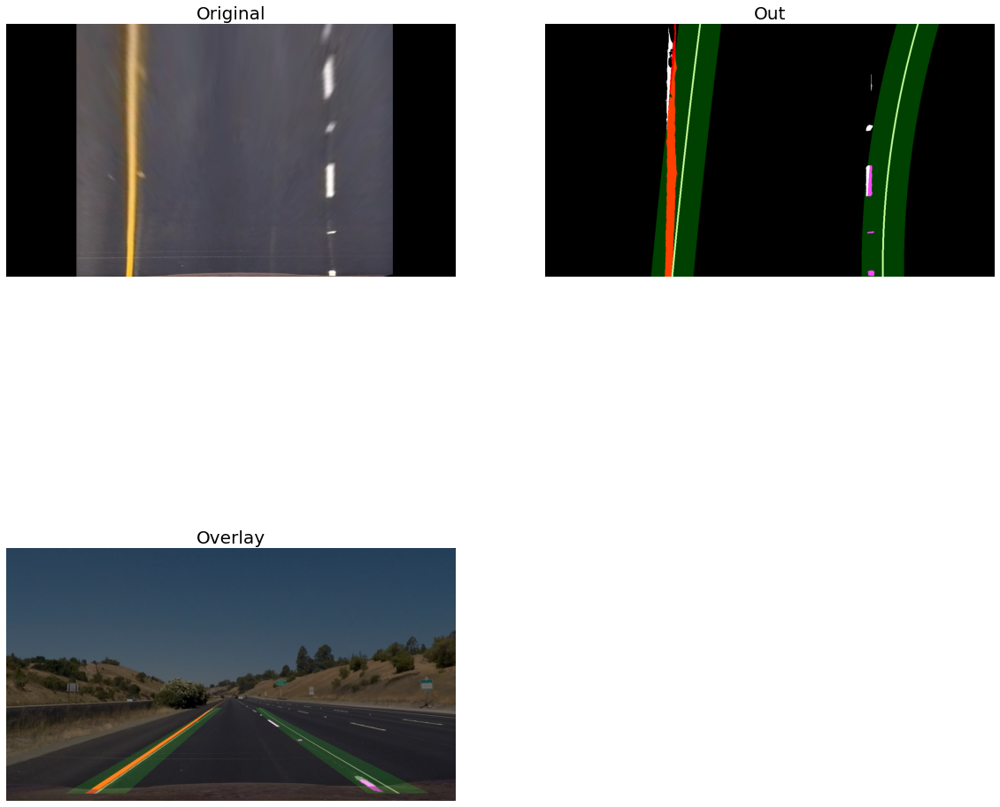

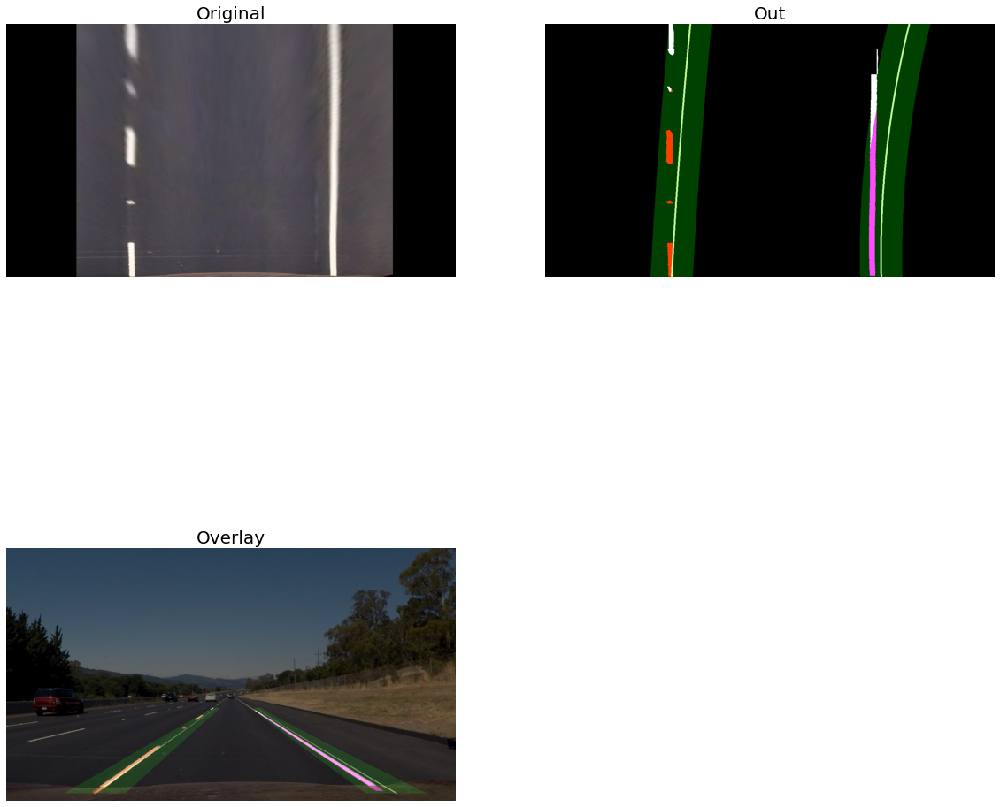

In [16]:
if 5 in plot_demo:
    cache = np.array([])
    attempts = 0
    max_attempts = 4
    reset = True
    
    for frame_path in test_img_paths[:]:
        img = mpimg.imread(frame_path)
        _, warped, (M, invM) = get_image(frame_path)
        
        if reset == True:
            binary = get_binary_image(warped)
            ret, out, poly_param = polyfit_sliding_window(binary, visualise=False, diagnostics=True)
            if ret:
                reset = False
                cache = np.array([poly_param])
                
        else:
            out, poly_param = polyfit_adapt_search(warped, poly_param, visualise=False, diagnostics=False)
            if attempts == max_attempts:
                attempts = 0
                reset = True
        
            out_unwarped = cv2.warpPerspective(out, invM, (IMG_SHAPE[1], IMG_SHAPE[0]), flags=cv2.INTER_LINEAR)

            img_overlay = np.copy(img)
            img_overlay = cv2.addWeighted(out_unwarped, 0.5, img, 0.5, 0)
            
            plot_images([(warped, 'Original'), (out, 'Out'), (img_overlay, 'Overlay')], figsize=(20, 20))

## 6. Compute meters/pixel

In [17]:
def compute_mppx(img, dashed_line_loc, visualise=False):
    '''
    Converts from pixel space to real world space and calculates the metres/pixel
    :param img (ndarray): Warped Image
    :param dashed_line_loc (string): Dashed line location (left/right)
    :param visualise (boolean): Boolean flag for visualisation
    : return (float32, float32): (metres/pixel y direction, metres/pixel x-direction)
    '''
    lane_width = 3.7
    dashed_line_len = 3.048
    
    if dashed_line_loc == 'left':
        y_top = 295
        y_bottom = 405
    elif dashed_line_loc == 'right':
        y_top = 395
        y_bottom = 495
        
    binary = get_binary_image(img)
    histogram = np.sum(binary[int(binary.shape[0] / 2):, :], axis=0)
    midpoint = int(histogram.shape[0] / 2)
    
    x_left = np.argmax(histogram[:midpoint])
    x_right = np.argmax(histogram[midpoint:]) + midpoint
    
    x_mppx = lane_width / (x_right - x_left)
    y_mppx = dashed_line_len / (y_bottom - y_top)
    
    if visualise:
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        plt.axis('off')
        
        if dashed_line_loc == 'left':
            plt.plot((x_left, x_left), (y_top, y_bottom), 'r')
            plt.text(x_left + 10, (y_top + y_bottom) // 2, '{} m'.format(dashed_line_len), color='r', fontsize=20)

        elif dashed_line_loc == 'right':
            plt.plot((x_right, x_right), (y_top, y_bottom), 'r')
            plt.text(x_right + 10, (y_top + y_bottom) // 2, '{} m'.format(dashed_line_len), color='r',fontsize=20)

        plt.plot((x_left, x_right), (img.shape[0] - 200 , img.shape[0] - 200), 'r')
        plt.text((x_left + x_right) // 2, img.shape[0] - 220, '{} m'.format(lane_width), color='r', fontsize=20)
        
    return y_mppx, x_mppx

### 6.1 Demo

Average meter/px along x-axis: 0.0063
Average meter/px along y-axis: 0.0291


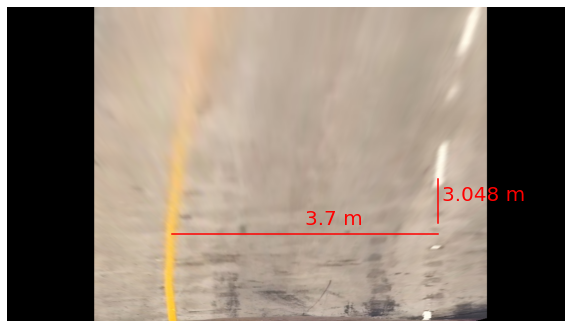

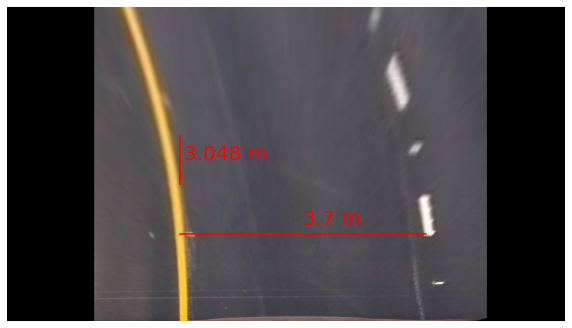

In [20]:
if 6 in plot_demo:
    visualise = True
else:
    visualise = False

_, img, _ = get_image(test_img_paths[0])
y_mppx1, x_mppx1 = compute_mppx(img, dashed_line_loc='right', visualise=visualise)

_,img, _ = get_image(test_img_paths[1])
y_mppx2, x_mppx2 = compute_mppx(img, dashed_line_loc='left', visualise=visualise)

x_mppx = (x_mppx1 + x_mppx2) / 2
y_mppx = (y_mppx1 + y_mppx2) / 2

print('Average meter/px along x-axis: {:.4f}'.format(x_mppx))
print('Average meter/px along y-axis: {:.4f}'.format(y_mppx))

## 7. Compute Lane Line Curvature

In [21]:
def compute_offset_from_center(poly_param, x_mppx):
    '''
    Computes the offset of the car from the center of the detected lane lines
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param x_mppx (float32): metres/pixel in the x-direction
    :return (float32): Offset 
    '''
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(poly_param[0], poly_param[1])
    
    lane_center = (plot_xright[-1] + plot_xleft[-1]) / 2
    car_center = IMG_SHAPE[1] / 2
    
    offset = (lane_center - car_center) * x_mppx
    return offset

def compute_curvature(poly_param, y_mppx, x_mppx):
    '''
    Computes the curvature of the lane lines (in metres)
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param y_mppx (float32): metres/pixel in the y-direction
    :param x_mppx (float32): metres/pixel in the x-direction
    :return (float32): Curvature (in metres) 
    '''
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(poly_param[0], poly_param[1])
    
    y_eval = np.max(plot_yleft)

    left_fit_cr = np.polyfit(plot_yleft * y_mppx, plot_xleft * x_mppx, 2)
    right_fit_cr = np.polyfit(plot_yright * y_mppx, plot_xright * x_mppx, 2)
    
    left_curverad = ((1 + (2*left_fit_cr[0]* y_eval*y_mppx + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*y_mppx + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

def draw(img, warped, invM, poly_param, curve_rad, offset):
    '''
    Utility function to draw the lane boundaries and numerical estimation of lane curvature and vehicle position.
    :param img (ndarray): Original image
    :param warped (ndarray): Warped image
    :param invM (ndarray): Inverse Perpsective Transformation matrix
    :param poly_param (ndarray): Set of 2nd order polynomial coefficients that represent the detected lane lines
    :param curve_rad (float32): Lane line curvature
    :param offset (float32): Car offset
    :return (ndarray): Image with visual display
    '''
    
    undist = undistort(img, mtx, dist)
    warp_zero = np.zeros_like(warped[:,:,0]).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fit = poly_param[0]
    right_fit = poly_param[1]
    plot_xleft, plot_yleft, plot_xright, plot_yright = get_poly_points(left_fit, right_fit)
    
    pts_left = np.array([np.transpose(np.vstack([plot_xleft, plot_yleft]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([plot_xright, plot_yright])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Color the road
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 220, 110))
                    
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False,
                  color=(255, 255, 255), thickness=10)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False,
                  color=(255, 255, 255), thickness= 10)
    
    # Unwarp and merge with undistorted original image
    unwarped = cv2.warpPerspective(color_warp, invM, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    out = cv2.addWeighted(undist, 1, unwarped, 0.4, 0)
    
    # Write data on the image
    if (left_fit[1] + right_fit[1]) / 2 > 0.05:
        text = 'Left turn, curve radius: {:04.2f} m'.format(curve_rad)
    elif (left_fit[1] + right_fit[1]) / 2 < -0.05:
        text = 'Right turn, curve radius: {:04.2f} m'.format(curve_rad)
    else:
        text = 'Straight'
    
    cv2.putText(out, text, (50, 60), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)
    
    direction = ''
    if offset > 0:
        direction = 'left'
    elif offset < 0:
        direction = 'right'
    
    text = '{:0.1f} cm {} of center'.format(abs(offset) * 100, direction)
    cv2.putText(out, text, (50, 110), cv2.FONT_HERSHEY_DUPLEX, 1.2, (255, 255, 255), 2, cv2.LINE_AA)
    
    return out

### 7.1 Demo

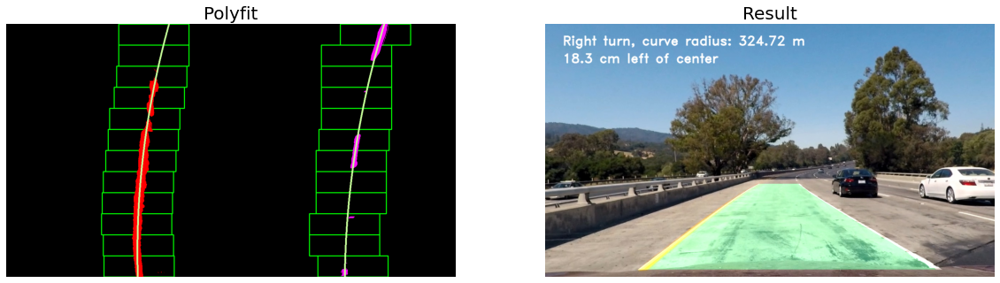

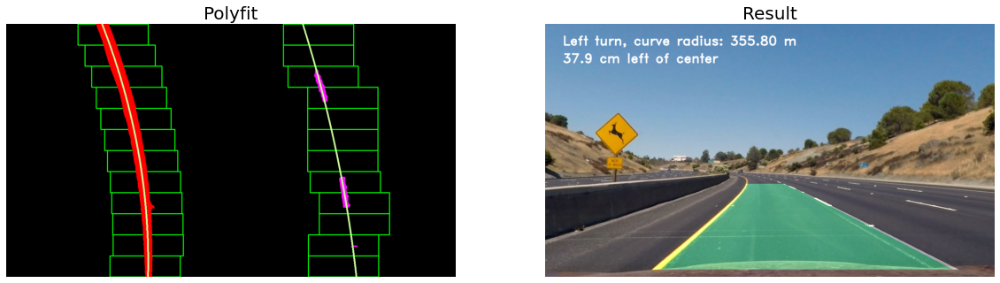

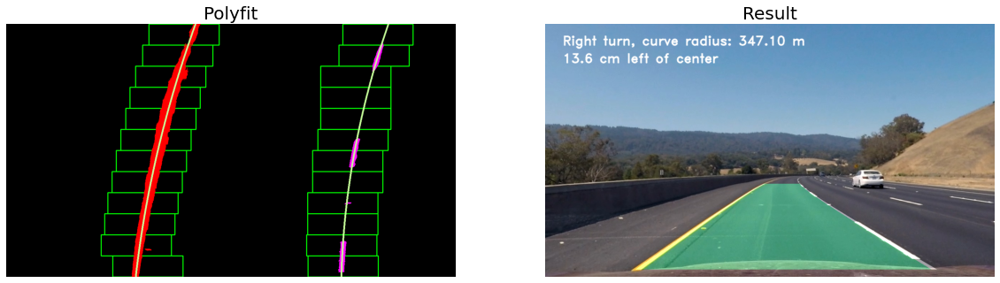

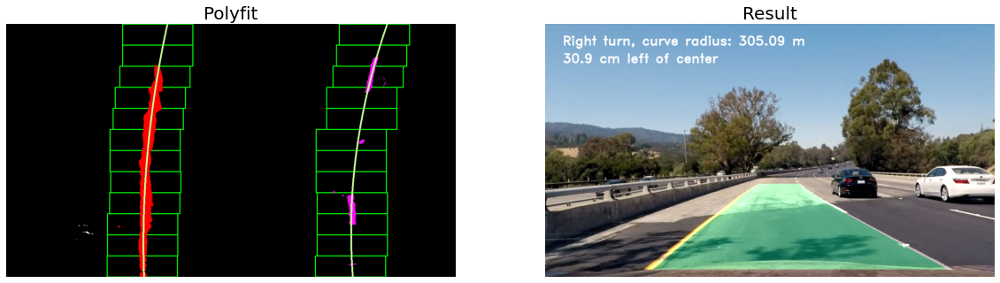

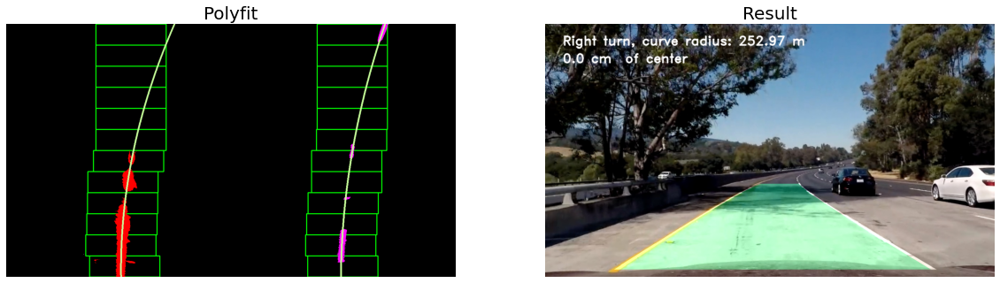

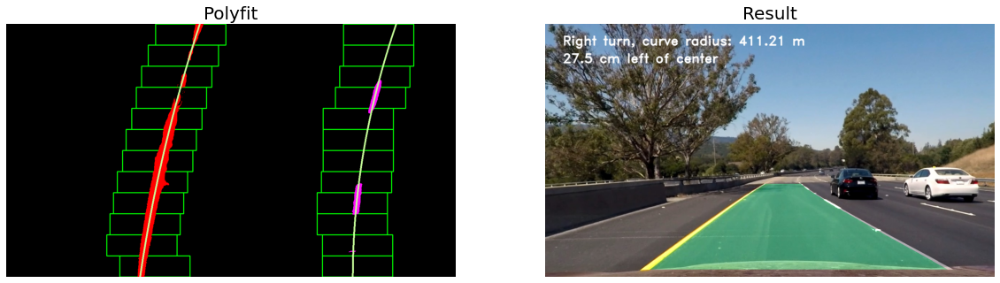

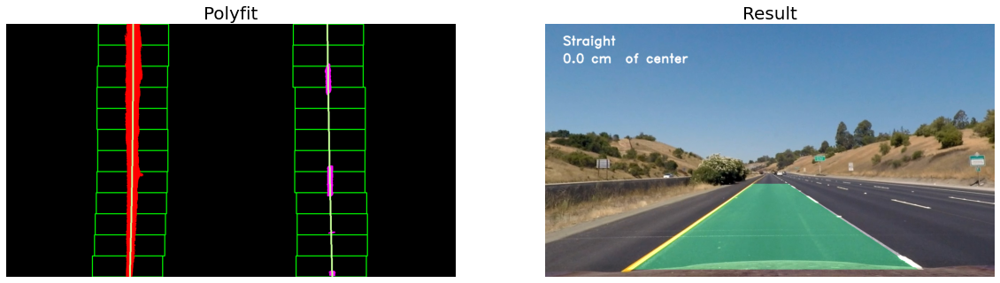

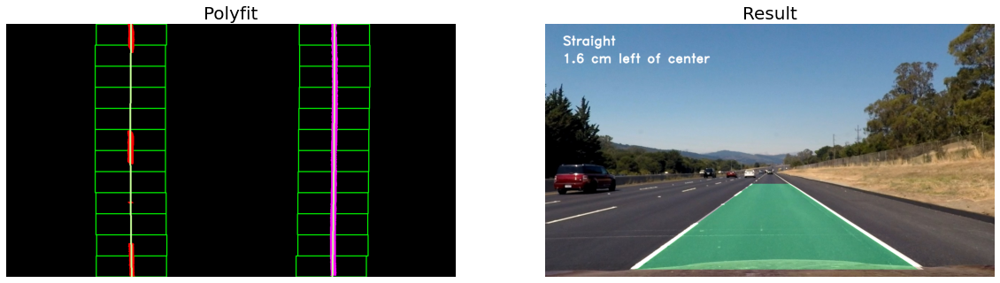

In [23]:
### DEMO
if 7 in plot_demo:
    cache = np.array([])
    
    for img_path in test_img_paths[:]:#test_img_paths:
        img = mpimg.imread(img_path)
        _, warped, (M, invM) = get_image(img_path)
        
        binary = get_binary_image(warped)
        ret, img_poly, poly_param = polyfit_sliding_window(binary)
        
        left_curverad, right_curverad = compute_curvature(poly_param, y_mppx, x_mppx)
        curvature = (left_curverad + right_curverad) / 2
        offset = compute_offset_from_center(poly_param, x_mppx)
        result = draw(img, warped, invM, poly_param, curvature, offset)
        
        plot_images([(img_poly, 'Polyfit'), (result, 'Result')])

## 8. Pipeline

In [38]:
def pipeline(img, visualise=False, diagnostics=False):
    global cache
    global poly_param # Important for successive calls to the pipeline
    global attempts
    global reset
    max_attempts = 5
    
        
        
    result = np.copy(img)
    original_ann, warped, (M, invM) = preprocess_image(img)
    title = ''
    binary = get_binary_image(warped)
    binary_3d = np.dstack((binary, binary, binary)) * 255
    
    try:
        if reset == True:
            title = 'Sliding window'
            if diagnostics: print(title)            
            ret, img_poly, poly_param = polyfit_sliding_window(binary, diagnostics=diagnostics)
            if ret:
                if diagnostics: print('Success!')
                reset = False
                cache = np.array([poly_param])
            else:
                if len(img_poly) == 0:
                    print('Sliding window failed!')
                    return img
                
        else:
            title = 'Adaptive Search'
            if diagnostics: print(title)            
            img_poly, poly_param = polyfit_adapt_search(warped, poly_param, diagnostics=diagnostics)
            if attempts == max_attempts:
                if diagnostics: print('Resetting...')
                reset = True
                attempts = 0
        
        left_curverad, right_curverad = compute_curvature(poly_param, y_mppx, x_mppx)
        offset = compute_offset_from_center(poly_param, x_mppx)
        result = draw(img, warped, invM, poly_param, (left_curverad + right_curverad) / 2, offset)

        blended_warped_poly = cv2.addWeighted(img_poly, 0.6, warped, 1, 0)
        row1 = np.hstack([result,original_ann, warped])
        row2 = np.hstack([binary_3d,img_poly,blended_warped_poly])
        full_img = np.vstack([row1, row2])
        if visualise:
            plt.figure(figsize=(20, 12))
            plt.title(title)
            plt.imshow(full_img)

        return full_img
    
    except Exception as e:
        print(e)
        return img
    
def pipeline_init():
    global cache 
    global attempts 
    global reset 
    cache = np.array([])
    attempts = 0
    reset = True
    

# 9.1 Process Image

Demo of consecutive frames
Sliding window
Success!


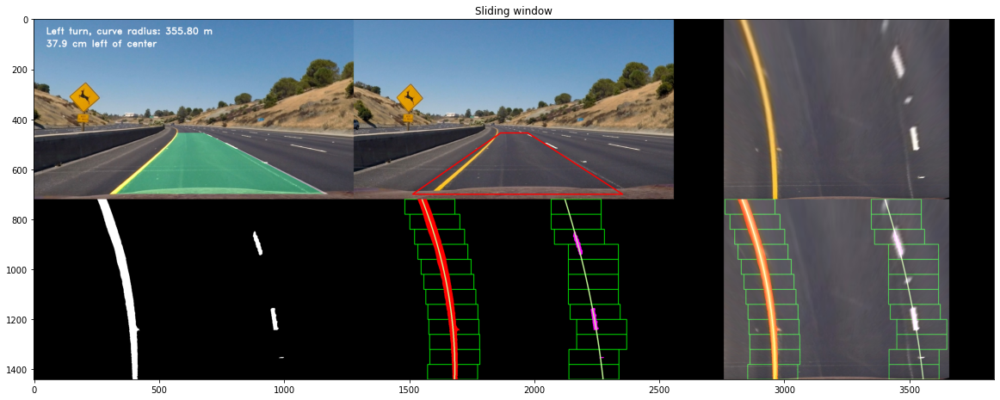

In [56]:
pipeline_init()
print('Demo of consecutive frames')
img = mpimg.imread('test_images/test2.jpg')
result = pipeline(img, visualise=True, diagnostics=1)

## 9. 2 Process Video

In [46]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

process_frame = lambda frame: pipeline(frame, diagnostics=1)

# Pipeline initialisation
pipeline_init()

video_output = 'project5_video_output.mp4'
video_input = VideoFileClip('project_video.mp4')                         
processed_video = video_input.fl_image(process_frame)
%time processed_video.write_videofile(video_output, audio=False)


#video1_output = 'challenge4_video_output.mp4'
#video1_input = VideoFileClip('challenge_video.mp4')                          
#processed_video = video1_input.fl_image(process_frame)
#%time processed_video.write_videofile(video1_output, audio=False)


Sliding window
Success!
Moviepy - Building video project5_video_output.mp4.
Moviepy - Writing video project5_video_output.mp4



t:   0%|                                                                    | 2/1260 [00:00<03:36,  5.81it/s, now=None]

Adaptive Search


t:   0%|▏                                                                   | 3/1260 [00:00<05:15,  3.98it/s, now=None]

Adaptive Search


t:   0%|▏                                                                   | 4/1260 [00:01<05:45,  3.63it/s, now=None]

Adaptive Search


t:   0%|▎                                                                   | 5/1260 [00:01<06:10,  3.39it/s, now=None]

Adaptive Search


t:   0%|▎                                                                   | 6/1260 [00:01<06:26,  3.25it/s, now=None]

Adaptive Search


t:   1%|▍                                                                   | 7/1260 [00:02<06:46,  3.08it/s, now=None]

Adaptive Search


t:   1%|▍                                                                   | 8/1260 [00:02<06:45,  3.09it/s, now=None]

Adaptive Search


t:   1%|▍                                                                   | 9/1260 [00:02<06:43,  3.10it/s, now=None]

Adaptive Search


t:   1%|▌                                                                  | 10/1260 [00:03<06:52,  3.03it/s, now=None]

Adaptive Search


t:   1%|▌                                                                  | 11/1260 [00:03<06:47,  3.06it/s, now=None]

Adaptive Search


t:   1%|▋                                                                  | 12/1260 [00:03<06:51,  3.03it/s, now=None]

Adaptive Search


t:   1%|▋                                                                  | 13/1260 [00:04<06:45,  3.08it/s, now=None]

Adaptive Search


t:   1%|▋                                                                  | 14/1260 [00:04<06:50,  3.03it/s, now=None]

Adaptive Search


t:   1%|▊                                                                  | 15/1260 [00:04<06:45,  3.07it/s, now=None]

Adaptive Search


t:   1%|▊                                                                  | 16/1260 [00:04<06:45,  3.07it/s, now=None]

Adaptive Search


t:   1%|▉                                                                  | 17/1260 [00:05<06:58,  2.97it/s, now=None]

Adaptive Search


t:   1%|▉                                                                  | 18/1260 [00:05<07:03,  2.93it/s, now=None]

Adaptive Search


t:   2%|█                                                                  | 19/1260 [00:06<07:06,  2.91it/s, now=None]

Adaptive Search


t:   2%|█                                                                  | 20/1260 [00:06<07:07,  2.90it/s, now=None]

Adaptive Search


t:   2%|█                                                                  | 21/1260 [00:06<07:08,  2.89it/s, now=None]

Adaptive Search


t:   2%|█▏                                                                 | 22/1260 [00:07<07:05,  2.91it/s, now=None]

Adaptive Search


t:   2%|█▏                                                                 | 23/1260 [00:07<06:54,  2.98it/s, now=None]

Adaptive Search


t:   2%|█▎                                                                 | 24/1260 [00:07<06:53,  2.99it/s, now=None]

Adaptive Search


t:   2%|█▎                                                                 | 25/1260 [00:08<06:58,  2.95it/s, now=None]

Adaptive Search


t:   2%|█▍                                                                 | 26/1260 [00:08<07:00,  2.93it/s, now=None]

Adaptive Search


t:   2%|█▍                                                                 | 27/1260 [00:08<06:53,  2.98it/s, now=None]

Adaptive Search


t:   2%|█▍                                                                 | 28/1260 [00:09<06:52,  2.99it/s, now=None]

Adaptive Search


t:   2%|█▌                                                                 | 29/1260 [00:09<06:45,  3.03it/s, now=None]

Adaptive Search


t:   2%|█▌                                                                 | 30/1260 [00:09<06:46,  3.03it/s, now=None]

Adaptive Search


t:   2%|█▋                                                                 | 31/1260 [00:10<06:40,  3.07it/s, now=None]

Adaptive Search


t:   3%|█▋                                                                 | 32/1260 [00:10<06:46,  3.02it/s, now=None]

Adaptive Search


t:   3%|█▊                                                                 | 33/1260 [00:10<06:48,  3.00it/s, now=None]

Adaptive Search


t:   3%|█▊                                                                 | 34/1260 [00:11<06:43,  3.04it/s, now=None]

Adaptive Search


t:   3%|█▊                                                                 | 35/1260 [00:11<06:46,  3.01it/s, now=None]

Adaptive Search


t:   3%|█▉                                                                 | 36/1260 [00:11<06:48,  2.99it/s, now=None]

Adaptive Search


t:   3%|█▉                                                                 | 37/1260 [00:12<06:53,  2.96it/s, now=None]

Adaptive Search


t:   3%|██                                                                 | 38/1260 [00:12<06:47,  3.00it/s, now=None]

Adaptive Search


t:   3%|██                                                                 | 39/1260 [00:12<06:41,  3.04it/s, now=None]

Adaptive Search


t:   3%|██▏                                                                | 40/1260 [00:13<06:43,  3.03it/s, now=None]

Adaptive Search


t:   3%|██▏                                                                | 41/1260 [00:13<06:43,  3.02it/s, now=None]

Adaptive Search


t:   3%|██▏                                                                | 42/1260 [00:13<06:51,  2.96it/s, now=None]

Adaptive Search


t:   3%|██▎                                                                | 43/1260 [00:14<06:52,  2.95it/s, now=None]

Adaptive Search


t:   3%|██▎                                                                | 44/1260 [00:14<07:08,  2.84it/s, now=None]

Adaptive Search


t:   4%|██▍                                                                | 45/1260 [00:14<07:14,  2.80it/s, now=None]

Adaptive Search


t:   4%|██▍                                                                | 46/1260 [00:15<07:05,  2.85it/s, now=None]

Adaptive Search


t:   4%|██▍                                                                | 47/1260 [00:15<06:59,  2.89it/s, now=None]

Adaptive Search


t:   4%|██▌                                                                | 48/1260 [00:15<06:59,  2.89it/s, now=None]

Adaptive Search


t:   4%|██▌                                                                | 49/1260 [00:16<07:00,  2.88it/s, now=None]

Adaptive Search


t:   4%|██▋                                                                | 50/1260 [00:16<06:55,  2.91it/s, now=None]

Adaptive Search


t:   4%|██▋                                                                | 51/1260 [00:16<06:57,  2.90it/s, now=None]

Adaptive Search


t:   4%|██▊                                                                | 52/1260 [00:17<06:52,  2.93it/s, now=None]

Adaptive Search


t:   4%|██▊                                                                | 53/1260 [00:17<07:06,  2.83it/s, now=None]

Adaptive Search


t:   4%|██▊                                                                | 54/1260 [00:17<06:59,  2.87it/s, now=None]

Adaptive Search


t:   4%|██▉                                                                | 55/1260 [00:18<06:54,  2.91it/s, now=None]

Adaptive Search


t:   4%|██▉                                                                | 56/1260 [00:18<06:49,  2.94it/s, now=None]

Adaptive Search


t:   5%|███                                                                | 57/1260 [00:18<06:58,  2.87it/s, now=None]

Adaptive Search


t:   5%|███                                                                | 58/1260 [00:19<06:53,  2.91it/s, now=None]

Adaptive Search


t:   5%|███▏                                                               | 59/1260 [00:19<06:49,  2.94it/s, now=None]

Adaptive Search


t:   5%|███▏                                                               | 60/1260 [00:19<06:46,  2.95it/s, now=None]

Adaptive Search


t:   5%|███▏                                                               | 61/1260 [00:20<06:50,  2.92it/s, now=None]

Adaptive Search


t:   5%|███▎                                                               | 62/1260 [00:20<06:46,  2.95it/s, now=None]

Adaptive Search


t:   5%|███▎                                                               | 63/1260 [00:20<06:44,  2.96it/s, now=None]

Adaptive Search


t:   5%|███▍                                                               | 64/1260 [00:21<06:47,  2.93it/s, now=None]

Adaptive Search


t:   5%|███▍                                                               | 65/1260 [00:21<06:55,  2.87it/s, now=None]

Adaptive Search


t:   5%|███▌                                                               | 66/1260 [00:22<06:45,  2.94it/s, now=None]

Adaptive Search


t:   5%|███▌                                                               | 67/1260 [00:22<06:54,  2.88it/s, now=None]

Adaptive Search


t:   5%|███▌                                                               | 68/1260 [00:22<07:00,  2.84it/s, now=None]

Adaptive Search


t:   5%|███▋                                                               | 69/1260 [00:23<07:27,  2.66it/s, now=None]

Adaptive Search


t:   6%|███▋                                                               | 70/1260 [00:23<07:37,  2.60it/s, now=None]

Adaptive Search


t:   6%|███▊                                                               | 71/1260 [00:23<07:42,  2.57it/s, now=None]

Adaptive Search


t:   6%|███▊                                                               | 72/1260 [00:24<07:21,  2.69it/s, now=None]

Adaptive Search


t:   6%|███▉                                                               | 73/1260 [00:24<07:36,  2.60it/s, now=None]

Adaptive Search


t:   6%|███▉                                                               | 74/1260 [00:25<07:38,  2.58it/s, now=None]

Adaptive Search


t:   6%|███▉                                                               | 75/1260 [00:25<07:31,  2.63it/s, now=None]

Adaptive Search


t:   6%|████                                                               | 76/1260 [00:25<07:37,  2.59it/s, now=None]

Adaptive Search


t:   6%|████                                                               | 77/1260 [00:26<07:45,  2.54it/s, now=None]

Adaptive Search


t:   6%|████▏                                                              | 78/1260 [00:26<07:42,  2.55it/s, now=None]

Adaptive Search


t:   6%|████▏                                                              | 79/1260 [00:27<07:35,  2.60it/s, now=None]

Adaptive Search


t:   6%|████▎                                                              | 80/1260 [00:27<07:32,  2.61it/s, now=None]

Adaptive Search


t:   6%|████▎                                                              | 81/1260 [00:27<08:01,  2.45it/s, now=None]

Adaptive Search


t:   7%|████▎                                                              | 82/1260 [00:28<08:17,  2.37it/s, now=None]

Adaptive Search


t:   7%|████▍                                                              | 83/1260 [00:28<08:13,  2.38it/s, now=None]

Adaptive Search


t:   7%|████▍                                                              | 84/1260 [00:29<08:17,  2.36it/s, now=None]

Adaptive Search


t:   7%|████▌                                                              | 85/1260 [00:29<08:40,  2.26it/s, now=None]

Adaptive Search


t:   7%|████▌                                                              | 86/1260 [00:30<08:33,  2.29it/s, now=None]

Adaptive Search


t:   7%|████▋                                                              | 87/1260 [00:30<08:19,  2.35it/s, now=None]

Adaptive Search


t:   7%|████▋                                                              | 88/1260 [00:30<08:11,  2.39it/s, now=None]

Adaptive Search


t:   7%|████▋                                                              | 89/1260 [00:31<08:20,  2.34it/s, now=None]

Adaptive Search


t:   7%|████▊                                                              | 90/1260 [00:31<08:22,  2.33it/s, now=None]

Adaptive Search


t:   7%|████▊                                                              | 91/1260 [00:32<08:18,  2.35it/s, now=None]

Adaptive Search


t:   7%|████▉                                                              | 92/1260 [00:32<08:07,  2.40it/s, now=None]

Adaptive Search


t:   7%|████▉                                                              | 93/1260 [00:33<08:13,  2.37it/s, now=None]

Adaptive Search


t:   7%|████▉                                                              | 94/1260 [00:33<08:02,  2.42it/s, now=None]

Adaptive Search


t:   8%|█████                                                              | 95/1260 [00:33<07:47,  2.49it/s, now=None]

Adaptive Search


t:   8%|█████                                                              | 96/1260 [00:34<07:39,  2.53it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                             | 97/1260 [00:34<07:45,  2.50it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                             | 98/1260 [00:34<07:40,  2.53it/s, now=None]

Adaptive Search


t:   8%|█████▎                                                             | 99/1260 [00:35<07:40,  2.52it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                            | 100/1260 [00:35<08:22,  2.31it/s, now=None]

Adaptive Search


t:   8%|█████▎                                                            | 101/1260 [00:36<09:01,  2.14it/s, now=None]

Adaptive Search


t:   8%|█████▎                                                            | 102/1260 [00:36<08:55,  2.16it/s, now=None]

Adaptive Search


t:   8%|█████▍                                                            | 103/1260 [00:37<08:26,  2.28it/s, now=None]

Adaptive Search


t:   8%|█████▍                                                            | 104/1260 [00:37<08:20,  2.31it/s, now=None]

Adaptive Search


t:   8%|█████▌                                                            | 105/1260 [00:38<08:40,  2.22it/s, now=None]

Adaptive Search


t:   8%|█████▌                                                            | 106/1260 [00:38<08:40,  2.22it/s, now=None]

Adaptive Search


t:   8%|█████▌                                                            | 107/1260 [00:39<08:23,  2.29it/s, now=None]

Adaptive Search


t:   9%|█████▋                                                            | 108/1260 [00:39<07:59,  2.40it/s, now=None]

Adaptive Search


t:   9%|█████▋                                                            | 109/1260 [00:39<08:06,  2.37it/s, now=None]

Adaptive Search


t:   9%|█████▊                                                            | 110/1260 [00:40<07:56,  2.41it/s, now=None]

Adaptive Search


t:   9%|█████▊                                                            | 111/1260 [00:40<07:57,  2.40it/s, now=None]

Adaptive Search


t:   9%|█████▊                                                            | 112/1260 [00:41<07:45,  2.47it/s, now=None]

Adaptive Search


t:   9%|█████▉                                                            | 113/1260 [00:41<07:53,  2.42it/s, now=None]

Adaptive Search


t:   9%|█████▉                                                            | 114/1260 [00:41<07:49,  2.44it/s, now=None]

Adaptive Search


t:   9%|██████                                                            | 115/1260 [00:42<07:40,  2.49it/s, now=None]

Adaptive Search


t:   9%|██████                                                            | 116/1260 [00:42<07:32,  2.53it/s, now=None]

Adaptive Search


t:   9%|██████▏                                                           | 117/1260 [00:43<07:40,  2.48it/s, now=None]

Adaptive Search


t:   9%|██████▏                                                           | 118/1260 [00:43<07:38,  2.49it/s, now=None]

Adaptive Search


t:   9%|██████▏                                                           | 119/1260 [00:43<07:32,  2.52it/s, now=None]

Adaptive Search


t:  10%|██████▎                                                           | 120/1260 [00:44<07:27,  2.55it/s, now=None]

Adaptive Search


t:  10%|██████▎                                                           | 121/1260 [00:44<07:29,  2.54it/s, now=None]

Adaptive Search


t:  10%|██████▍                                                           | 122/1260 [00:45<07:35,  2.50it/s, now=None]

Adaptive Search


t:  10%|██████▍                                                           | 123/1260 [00:45<07:30,  2.52it/s, now=None]

Adaptive Search


t:  10%|██████▍                                                           | 124/1260 [00:45<07:27,  2.54it/s, now=None]

Adaptive Search


t:  10%|██████▌                                                           | 125/1260 [00:46<07:32,  2.51it/s, now=None]

Adaptive Search


t:  10%|██████▌                                                           | 126/1260 [00:46<07:32,  2.51it/s, now=None]

Adaptive Search


t:  10%|██████▋                                                           | 127/1260 [00:47<07:27,  2.53it/s, now=None]

Adaptive Search


t:  10%|██████▋                                                           | 128/1260 [00:47<07:22,  2.56it/s, now=None]

Adaptive Search


t:  10%|██████▊                                                           | 129/1260 [00:47<07:30,  2.51it/s, now=None]

Adaptive Search


t:  10%|██████▊                                                           | 130/1260 [00:48<07:35,  2.48it/s, now=None]

Adaptive Search


t:  10%|██████▊                                                           | 131/1260 [00:48<07:29,  2.51it/s, now=None]

Adaptive Search


t:  10%|██████▉                                                           | 132/1260 [00:49<07:24,  2.54it/s, now=None]

Adaptive Search


t:  11%|██████▉                                                           | 133/1260 [00:49<07:31,  2.50it/s, now=None]

Adaptive Search


t:  11%|███████                                                           | 134/1260 [00:49<07:35,  2.47it/s, now=None]

Adaptive Search


t:  11%|███████                                                           | 135/1260 [00:50<07:28,  2.51it/s, now=None]

Adaptive Search


t:  11%|███████                                                           | 136/1260 [00:50<07:23,  2.53it/s, now=None]

Adaptive Search


t:  11%|███████▏                                                          | 137/1260 [00:51<07:34,  2.47it/s, now=None]

Adaptive Search


t:  11%|███████▏                                                          | 138/1260 [00:51<07:38,  2.45it/s, now=None]

Adaptive Search


t:  11%|███████▎                                                          | 139/1260 [00:51<07:41,  2.43it/s, now=None]

Adaptive Search


t:  11%|███████▎                                                          | 140/1260 [00:52<07:31,  2.48it/s, now=None]

Adaptive Search


t:  11%|███████▍                                                          | 141/1260 [00:52<07:45,  2.40it/s, now=None]

Adaptive Search


t:  11%|███████▍                                                          | 142/1260 [00:53<07:45,  2.40it/s, now=None]

Adaptive Search


t:  11%|███████▍                                                          | 143/1260 [00:53<07:34,  2.46it/s, now=None]

Adaptive Search


t:  11%|███████▌                                                          | 144/1260 [00:53<07:21,  2.53it/s, now=None]

Adaptive Search


t:  12%|███████▌                                                          | 145/1260 [00:54<07:32,  2.47it/s, now=None]

Adaptive Search


t:  12%|███████▋                                                          | 146/1260 [00:54<07:25,  2.50it/s, now=None]

Adaptive Search


t:  12%|███████▋                                                          | 147/1260 [00:55<07:19,  2.53it/s, now=None]

Adaptive Search


t:  12%|███████▊                                                          | 148/1260 [00:55<07:15,  2.55it/s, now=None]

Adaptive Search


t:  12%|███████▊                                                          | 149/1260 [00:55<07:27,  2.48it/s, now=None]

Adaptive Search


t:  12%|███████▊                                                          | 150/1260 [00:56<07:31,  2.46it/s, now=None]

Adaptive Search


t:  12%|███████▉                                                          | 151/1260 [00:56<07:29,  2.47it/s, now=None]

Adaptive Search


t:  12%|███████▉                                                          | 152/1260 [00:57<07:17,  2.53it/s, now=None]

Adaptive Search


t:  12%|████████                                                          | 153/1260 [00:57<07:22,  2.50it/s, now=None]

Adaptive Search


t:  12%|████████                                                          | 154/1260 [00:57<07:22,  2.50it/s, now=None]

Adaptive Search


t:  12%|████████                                                          | 155/1260 [00:58<07:17,  2.53it/s, now=None]

Adaptive Search


t:  12%|████████▏                                                         | 156/1260 [00:58<07:12,  2.55it/s, now=None]

Adaptive Search


t:  12%|████████▏                                                         | 157/1260 [00:59<07:24,  2.48it/s, now=None]

Adaptive Search


t:  13%|████████▎                                                         | 158/1260 [00:59<07:28,  2.46it/s, now=None]

Adaptive Search


t:  13%|████████▎                                                         | 159/1260 [00:59<07:21,  2.50it/s, now=None]

Adaptive Search


t:  13%|████████▍                                                         | 160/1260 [01:00<07:15,  2.53it/s, now=None]

Adaptive Search


t:  13%|████████▍                                                         | 161/1260 [01:00<07:21,  2.49it/s, now=None]

Adaptive Search


t:  13%|████████▍                                                         | 162/1260 [01:01<07:25,  2.46it/s, now=None]

Adaptive Search


t:  13%|████████▌                                                         | 163/1260 [01:01<07:18,  2.50it/s, now=None]

Adaptive Search


t:  13%|████████▌                                                         | 164/1260 [01:01<07:16,  2.51it/s, now=None]

Adaptive Search


t:  13%|████████▋                                                         | 165/1260 [01:02<07:38,  2.39it/s, now=None]

Adaptive Search


t:  13%|████████▋                                                         | 166/1260 [01:02<07:38,  2.39it/s, now=None]

Adaptive Search


t:  13%|████████▋                                                         | 167/1260 [01:03<07:37,  2.39it/s, now=None]

Adaptive Search


t:  13%|████████▊                                                         | 168/1260 [01:03<07:20,  2.48it/s, now=None]

Adaptive Search


t:  13%|████████▊                                                         | 169/1260 [01:04<07:40,  2.37it/s, now=None]

Adaptive Search


t:  13%|████████▉                                                         | 170/1260 [01:04<07:43,  2.35it/s, now=None]

Adaptive Search


t:  14%|████████▉                                                         | 171/1260 [01:04<07:39,  2.37it/s, now=None]

Adaptive Search


t:  14%|█████████                                                         | 172/1260 [01:05<07:43,  2.35it/s, now=None]

Adaptive Search


t:  14%|█████████                                                         | 173/1260 [01:05<07:49,  2.31it/s, now=None]

Adaptive Search


t:  14%|█████████                                                         | 174/1260 [01:06<07:40,  2.36it/s, now=None]

Adaptive Search


t:  14%|█████████▏                                                        | 175/1260 [01:06<07:33,  2.39it/s, now=None]

Adaptive Search


t:  14%|█████████▏                                                        | 176/1260 [01:06<07:20,  2.46it/s, now=None]

Adaptive Search


t:  14%|█████████▎                                                        | 177/1260 [01:07<07:28,  2.42it/s, now=None]

Adaptive Search


t:  14%|█████████▎                                                        | 178/1260 [01:07<07:22,  2.44it/s, now=None]

Adaptive Search


t:  14%|█████████▍                                                        | 179/1260 [01:08<07:13,  2.49it/s, now=None]

Adaptive Search


t:  14%|█████████▍                                                        | 180/1260 [01:08<07:08,  2.52it/s, now=None]

Adaptive Search


t:  14%|█████████▍                                                        | 181/1260 [01:08<07:13,  2.49it/s, now=None]

Adaptive Search


t:  14%|█████████▌                                                        | 182/1260 [01:09<07:12,  2.49it/s, now=None]

Adaptive Search


t:  15%|█████████▌                                                        | 183/1260 [01:09<07:07,  2.52it/s, now=None]

Adaptive Search


t:  15%|█████████▋                                                        | 184/1260 [01:10<07:02,  2.55it/s, now=None]

Adaptive Search


t:  15%|█████████▋                                                        | 185/1260 [01:10<07:09,  2.50it/s, now=None]

Adaptive Search


t:  15%|█████████▋                                                        | 186/1260 [01:10<07:08,  2.51it/s, now=None]

Adaptive Search


t:  15%|█████████▊                                                        | 187/1260 [01:11<07:03,  2.53it/s, now=None]

Adaptive Search


t:  15%|█████████▊                                                        | 188/1260 [01:11<06:59,  2.55it/s, now=None]

Adaptive Search


t:  15%|█████████▉                                                        | 189/1260 [01:12<07:01,  2.54it/s, now=None]

Adaptive Search


t:  15%|█████████▉                                                        | 190/1260 [01:12<07:03,  2.52it/s, now=None]

Adaptive Search


t:  15%|██████████                                                        | 191/1260 [01:12<07:04,  2.52it/s, now=None]

Adaptive Search


t:  15%|██████████                                                        | 192/1260 [01:13<06:55,  2.57it/s, now=None]

Adaptive Search


t:  15%|██████████                                                        | 193/1260 [01:13<07:02,  2.52it/s, now=None]

Adaptive Search


t:  15%|██████████▏                                                       | 194/1260 [01:14<07:03,  2.52it/s, now=None]

Adaptive Search


t:  15%|██████████▏                                                       | 195/1260 [01:14<06:59,  2.54it/s, now=None]

Adaptive Search


t:  16%|██████████▎                                                       | 196/1260 [01:14<07:00,  2.53it/s, now=None]

Adaptive Search


t:  16%|██████████▎                                                       | 197/1260 [01:15<07:01,  2.52it/s, now=None]

Adaptive Search


t:  16%|██████████▎                                                       | 198/1260 [01:15<07:01,  2.52it/s, now=None]

Adaptive Search


t:  16%|██████████▍                                                       | 199/1260 [01:16<07:02,  2.51it/s, now=None]

Adaptive Search


t:  16%|██████████▍                                                       | 200/1260 [01:16<07:01,  2.51it/s, now=None]

Adaptive Search


t:  16%|██████████▌                                                       | 201/1260 [01:16<07:07,  2.48it/s, now=None]

Adaptive Search


t:  16%|██████████▌                                                       | 202/1260 [01:17<07:06,  2.48it/s, now=None]

Adaptive Search


t:  16%|██████████▋                                                       | 203/1260 [01:17<06:55,  2.55it/s, now=None]

Adaptive Search


t:  16%|██████████▋                                                       | 204/1260 [01:18<06:46,  2.60it/s, now=None]

Adaptive Search


t:  16%|██████████▋                                                       | 205/1260 [01:18<06:55,  2.54it/s, now=None]

Adaptive Search


t:  16%|██████████▊                                                       | 206/1260 [01:18<06:56,  2.53it/s, now=None]

Adaptive Search


t:  16%|██████████▊                                                       | 207/1260 [01:19<06:47,  2.58it/s, now=None]

Adaptive Search


t:  17%|██████████▉                                                       | 208/1260 [01:19<06:51,  2.56it/s, now=None]

Adaptive Search


t:  17%|██████████▉                                                       | 209/1260 [01:19<06:52,  2.55it/s, now=None]

Adaptive Search


t:  17%|███████████                                                       | 210/1260 [01:20<06:49,  2.56it/s, now=None]

Adaptive Search


t:  17%|███████████                                                       | 211/1260 [01:20<06:49,  2.56it/s, now=None]

Adaptive Search


t:  17%|███████████                                                       | 212/1260 [01:21<06:45,  2.58it/s, now=None]

Adaptive Search


t:  17%|███████████▏                                                      | 213/1260 [01:21<06:58,  2.50it/s, now=None]

Adaptive Search


t:  17%|███████████▏                                                      | 214/1260 [01:21<06:57,  2.50it/s, now=None]

Adaptive Search


t:  17%|███████████▎                                                      | 215/1260 [01:22<06:53,  2.53it/s, now=None]

Adaptive Search


t:  17%|███████████▎                                                      | 216/1260 [01:22<06:44,  2.58it/s, now=None]

Adaptive Search


t:  17%|███████████▎                                                      | 217/1260 [01:23<06:56,  2.50it/s, now=None]

Adaptive Search


t:  17%|███████████▍                                                      | 218/1260 [01:23<06:57,  2.49it/s, now=None]

Adaptive Search


t:  17%|███████████▍                                                      | 219/1260 [01:23<06:52,  2.53it/s, now=None]

Adaptive Search


t:  17%|███████████▌                                                      | 220/1260 [01:24<06:47,  2.55it/s, now=None]

Adaptive Search


t:  18%|███████████▌                                                      | 221/1260 [01:24<06:59,  2.48it/s, now=None]

Adaptive Search


t:  18%|███████████▋                                                      | 222/1260 [01:25<06:57,  2.48it/s, now=None]

Adaptive Search


t:  18%|███████████▋                                                      | 223/1260 [01:25<06:51,  2.52it/s, now=None]

Adaptive Search


t:  18%|███████████▋                                                      | 224/1260 [01:25<06:42,  2.57it/s, now=None]

Adaptive Search


t:  18%|███████████▊                                                      | 225/1260 [01:26<06:49,  2.52it/s, now=None]

Adaptive Search


t:  18%|███████████▊                                                      | 226/1260 [01:26<06:55,  2.49it/s, now=None]

Adaptive Search


t:  18%|███████████▉                                                      | 227/1260 [01:27<06:44,  2.55it/s, now=None]

Adaptive Search


t:  18%|███████████▉                                                      | 228/1260 [01:27<06:42,  2.57it/s, now=None]

Adaptive Search


t:  18%|███████████▉                                                      | 229/1260 [01:27<06:53,  2.49it/s, now=None]

Adaptive Search


t:  18%|████████████                                                      | 230/1260 [01:28<07:03,  2.43it/s, now=None]

Adaptive Search


t:  18%|████████████                                                      | 231/1260 [01:28<07:08,  2.40it/s, now=None]

Adaptive Search


t:  18%|████████████▏                                                     | 232/1260 [01:29<07:09,  2.40it/s, now=None]

Adaptive Search


t:  18%|████████████▏                                                     | 233/1260 [01:29<07:17,  2.35it/s, now=None]

Adaptive Search


t:  19%|████████████▎                                                     | 234/1260 [01:30<07:10,  2.38it/s, now=None]

Adaptive Search


t:  19%|████████████▎                                                     | 235/1260 [01:30<07:13,  2.36it/s, now=None]

Adaptive Search


t:  19%|████████████▎                                                     | 236/1260 [01:30<07:12,  2.37it/s, now=None]

Adaptive Search


t:  19%|████████████▍                                                     | 237/1260 [01:31<07:14,  2.35it/s, now=None]

Adaptive Search


t:  19%|████████████▍                                                     | 238/1260 [01:31<07:16,  2.34it/s, now=None]

Adaptive Search


t:  19%|████████████▌                                                     | 239/1260 [01:32<07:03,  2.41it/s, now=None]

Adaptive Search


t:  19%|████████████▌                                                     | 240/1260 [01:32<07:07,  2.38it/s, now=None]

Adaptive Search


t:  19%|████████████▌                                                     | 241/1260 [01:33<07:12,  2.36it/s, now=None]

Adaptive Search


t:  19%|████████████▋                                                     | 242/1260 [01:33<06:59,  2.43it/s, now=None]

Adaptive Search


t:  19%|████████████▋                                                     | 243/1260 [01:33<06:52,  2.46it/s, now=None]

Adaptive Search


t:  19%|████████████▊                                                     | 244/1260 [01:34<06:48,  2.49it/s, now=None]

Adaptive Search


t:  19%|████████████▊                                                     | 245/1260 [01:34<06:52,  2.46it/s, now=None]

Adaptive Search


t:  20%|████████████▉                                                     | 246/1260 [01:35<06:50,  2.47it/s, now=None]

Adaptive Search


t:  20%|████████████▉                                                     | 247/1260 [01:35<06:43,  2.51it/s, now=None]

Adaptive Search


t:  20%|████████████▉                                                     | 248/1260 [01:35<06:43,  2.51it/s, now=None]

Adaptive Search


t:  20%|█████████████                                                     | 249/1260 [01:36<06:48,  2.48it/s, now=None]

Adaptive Search


t:  20%|█████████████                                                     | 250/1260 [01:36<06:46,  2.49it/s, now=None]

Adaptive Search


t:  20%|█████████████▏                                                    | 251/1260 [01:36<06:35,  2.55it/s, now=None]

Adaptive Search


t:  20%|█████████████▏                                                    | 252/1260 [01:37<06:33,  2.56it/s, now=None]

Adaptive Search


t:  20%|█████████████▎                                                    | 253/1260 [01:37<06:40,  2.52it/s, now=None]

Adaptive Search


t:  20%|█████████████▎                                                    | 254/1260 [01:38<06:35,  2.54it/s, now=None]

Adaptive Search


t:  20%|█████████████▎                                                    | 255/1260 [01:38<06:32,  2.56it/s, now=None]

Adaptive Search


t:  20%|█████████████▍                                                    | 256/1260 [01:38<06:30,  2.57it/s, now=None]

Adaptive Search


t:  20%|█████████████▍                                                    | 257/1260 [01:39<06:37,  2.52it/s, now=None]

Adaptive Search


t:  20%|█████████████▌                                                    | 258/1260 [01:39<06:38,  2.52it/s, now=None]

Adaptive Search


t:  21%|█████████████▌                                                    | 259/1260 [01:40<06:34,  2.54it/s, now=None]

Adaptive Search


t:  21%|█████████████▌                                                    | 260/1260 [01:40<06:27,  2.58it/s, now=None]

Adaptive Search


t:  21%|█████████████▋                                                    | 261/1260 [01:40<06:33,  2.54it/s, now=None]

Adaptive Search


t:  21%|█████████████▋                                                    | 262/1260 [01:41<06:34,  2.53it/s, now=None]

Adaptive Search


t:  21%|█████████████▊                                                    | 263/1260 [01:41<06:31,  2.55it/s, now=None]

Adaptive Search


t:  21%|█████████████▊                                                    | 264/1260 [01:42<06:27,  2.57it/s, now=None]

Adaptive Search


t:  21%|█████████████▉                                                    | 265/1260 [01:42<06:45,  2.46it/s, now=None]

Adaptive Search


t:  21%|█████████████▉                                                    | 266/1260 [01:42<07:01,  2.36it/s, now=None]

Adaptive Search


t:  21%|█████████████▉                                                    | 267/1260 [01:43<06:59,  2.36it/s, now=None]

Adaptive Search


t:  21%|██████████████                                                    | 268/1260 [01:43<06:52,  2.41it/s, now=None]

Adaptive Search


t:  21%|██████████████                                                    | 269/1260 [01:44<06:57,  2.38it/s, now=None]

Adaptive Search


t:  21%|██████████████▏                                                   | 270/1260 [01:44<06:50,  2.41it/s, now=None]

Adaptive Search


t:  22%|██████████████▏                                                   | 271/1260 [01:45<06:46,  2.44it/s, now=None]

Adaptive Search


t:  22%|██████████████▏                                                   | 272/1260 [01:45<06:41,  2.46it/s, now=None]

Adaptive Search


t:  22%|██████████████▎                                                   | 273/1260 [01:45<06:49,  2.41it/s, now=None]

Adaptive Search


t:  22%|██████████████▎                                                   | 274/1260 [01:46<06:44,  2.43it/s, now=None]

Adaptive Search


t:  22%|██████████████▍                                                   | 275/1260 [01:46<06:38,  2.47it/s, now=None]

Adaptive Search


t:  22%|██████████████▍                                                   | 276/1260 [01:47<06:30,  2.52it/s, now=None]

Adaptive Search


t:  22%|██████████████▌                                                   | 277/1260 [01:47<06:31,  2.51it/s, now=None]

Adaptive Search


t:  22%|██████████████▌                                                   | 278/1260 [01:47<06:30,  2.51it/s, now=None]

Adaptive Search


t:  22%|██████████████▌                                                   | 279/1260 [01:48<06:26,  2.54it/s, now=None]

Adaptive Search


t:  22%|██████████████▋                                                   | 280/1260 [01:48<06:23,  2.56it/s, now=None]

Adaptive Search


t:  22%|██████████████▋                                                   | 281/1260 [01:49<06:34,  2.48it/s, now=None]

Adaptive Search


t:  22%|██████████████▊                                                   | 282/1260 [01:49<06:32,  2.49it/s, now=None]

Adaptive Search


t:  22%|██████████████▊                                                   | 283/1260 [01:49<06:27,  2.52it/s, now=None]

Adaptive Search


t:  23%|██████████████▉                                                   | 284/1260 [01:50<06:23,  2.55it/s, now=None]

Adaptive Search


t:  23%|██████████████▉                                                   | 285/1260 [01:50<06:29,  2.50it/s, now=None]

Adaptive Search


t:  23%|██████████████▉                                                   | 286/1260 [01:51<06:38,  2.45it/s, now=None]

Adaptive Search


t:  23%|███████████████                                                   | 287/1260 [01:51<06:31,  2.49it/s, now=None]

Adaptive Search


t:  23%|███████████████                                                   | 288/1260 [01:51<06:25,  2.52it/s, now=None]

Adaptive Search


t:  23%|███████████████▏                                                  | 289/1260 [01:52<06:31,  2.48it/s, now=None]

Adaptive Search


t:  23%|███████████████▏                                                  | 290/1260 [01:52<06:29,  2.49it/s, now=None]

Adaptive Search


t:  23%|███████████████▏                                                  | 291/1260 [01:53<06:19,  2.55it/s, now=None]

Adaptive Search


t:  23%|███████████████▎                                                  | 292/1260 [01:53<06:17,  2.57it/s, now=None]

Adaptive Search


t:  23%|███████████████▎                                                  | 293/1260 [01:53<06:28,  2.49it/s, now=None]

Adaptive Search


t:  23%|███████████████▍                                                  | 294/1260 [01:54<06:45,  2.38it/s, now=None]

Adaptive Search


t:  23%|███████████████▍                                                  | 295/1260 [01:54<06:44,  2.38it/s, now=None]

Adaptive Search


t:  23%|███████████████▌                                                  | 296/1260 [01:55<06:40,  2.41it/s, now=None]

Adaptive Search


t:  24%|███████████████▌                                                  | 297/1260 [01:55<06:30,  2.47it/s, now=None]

Adaptive Search


t:  24%|███████████████▌                                                  | 298/1260 [01:55<06:18,  2.54it/s, now=None]

Adaptive Search


t:  24%|███████████████▋                                                  | 299/1260 [01:56<06:20,  2.53it/s, now=None]

Adaptive Search


t:  24%|███████████████▋                                                  | 300/1260 [01:56<06:20,  2.52it/s, now=None]

Adaptive Search


t:  24%|███████████████▊                                                  | 301/1260 [01:57<06:12,  2.58it/s, now=None]

Adaptive Search


t:  24%|███████████████▊                                                  | 302/1260 [01:57<06:10,  2.59it/s, now=None]

Adaptive Search


t:  24%|███████████████▊                                                  | 303/1260 [01:57<06:18,  2.53it/s, now=None]

Adaptive Search


t:  24%|███████████████▉                                                  | 304/1260 [01:58<06:18,  2.53it/s, now=None]

Adaptive Search


t:  24%|███████████████▉                                                  | 305/1260 [01:58<06:24,  2.48it/s, now=None]

Adaptive Search


t:  24%|████████████████                                                  | 306/1260 [01:59<06:14,  2.55it/s, now=None]

Adaptive Search


t:  24%|████████████████                                                  | 307/1260 [01:59<06:33,  2.42it/s, now=None]

Adaptive Search


t:  24%|████████████████▏                                                 | 308/1260 [01:59<06:29,  2.44it/s, now=None]

Adaptive Search


t:  25%|████████████████▏                                                 | 309/1260 [02:00<06:22,  2.49it/s, now=None]

Adaptive Search


t:  25%|████████████████▏                                                 | 310/1260 [02:00<06:16,  2.52it/s, now=None]

Adaptive Search


t:  25%|████████████████▎                                                 | 311/1260 [02:01<06:26,  2.46it/s, now=None]

Adaptive Search


t:  25%|████████████████▎                                                 | 312/1260 [02:01<06:19,  2.50it/s, now=None]

Adaptive Search


t:  25%|████████████████▍                                                 | 313/1260 [02:01<06:18,  2.50it/s, now=None]

Adaptive Search


t:  25%|████████████████▍                                                 | 314/1260 [02:02<06:13,  2.53it/s, now=None]

Adaptive Search


t:  25%|████████████████▌                                                 | 315/1260 [02:02<06:19,  2.49it/s, now=None]

Adaptive Search


t:  25%|████████████████▌                                                 | 316/1260 [02:03<06:13,  2.53it/s, now=None]

Adaptive Search


t:  25%|████████████████▌                                                 | 317/1260 [02:03<06:10,  2.54it/s, now=None]

Adaptive Search


t:  25%|████████████████▋                                                 | 318/1260 [02:03<06:07,  2.57it/s, now=None]

Adaptive Search


t:  25%|████████████████▋                                                 | 319/1260 [02:04<06:09,  2.55it/s, now=None]

Adaptive Search


t:  25%|████████████████▊                                                 | 320/1260 [02:04<06:14,  2.51it/s, now=None]

Adaptive Search


t:  25%|████████████████▊                                                 | 321/1260 [02:05<06:14,  2.50it/s, now=None]

Adaptive Search


t:  26%|████████████████▊                                                 | 322/1260 [02:05<06:06,  2.56it/s, now=None]

Adaptive Search


t:  26%|████████████████▉                                                 | 323/1260 [02:05<06:17,  2.49it/s, now=None]

Adaptive Search


t:  26%|████████████████▉                                                 | 324/1260 [02:06<06:15,  2.49it/s, now=None]

Adaptive Search


t:  26%|█████████████████                                                 | 325/1260 [02:06<06:10,  2.52it/s, now=None]

Adaptive Search


t:  26%|█████████████████                                                 | 326/1260 [02:06<06:01,  2.58it/s, now=None]

Adaptive Search


t:  26%|█████████████████▏                                                | 327/1260 [02:07<06:10,  2.52it/s, now=None]

Adaptive Search


t:  26%|█████████████████▏                                                | 328/1260 [02:07<06:14,  2.49it/s, now=None]

Adaptive Search


t:  26%|█████████████████▏                                                | 329/1260 [02:08<06:09,  2.52it/s, now=None]

Adaptive Search


t:  26%|█████████████████▎                                                | 330/1260 [02:08<06:01,  2.57it/s, now=None]

Adaptive Search


t:  26%|█████████████████▎                                                | 331/1260 [02:08<06:07,  2.52it/s, now=None]

Adaptive Search


t:  26%|█████████████████▍                                                | 332/1260 [02:09<06:08,  2.52it/s, now=None]

Adaptive Search


t:  26%|█████████████████▍                                                | 333/1260 [02:09<06:08,  2.52it/s, now=None]

Adaptive Search


t:  27%|█████████████████▍                                                | 334/1260 [02:10<06:13,  2.48it/s, now=None]

Adaptive Search


t:  27%|█████████████████▌                                                | 335/1260 [02:10<06:30,  2.37it/s, now=None]

Adaptive Search


t:  27%|█████████████████▌                                                | 336/1260 [02:11<06:23,  2.41it/s, now=None]

Adaptive Search


t:  27%|█████████████████▋                                                | 337/1260 [02:11<06:15,  2.46it/s, now=None]

Adaptive Search


t:  27%|█████████████████▋                                                | 338/1260 [02:11<06:09,  2.50it/s, now=None]

Adaptive Search


t:  27%|█████████████████▊                                                | 339/1260 [02:12<06:16,  2.44it/s, now=None]

Adaptive Search


t:  27%|█████████████████▊                                                | 340/1260 [02:12<06:22,  2.41it/s, now=None]

Adaptive Search


t:  27%|█████████████████▊                                                | 341/1260 [02:13<06:09,  2.49it/s, now=None]

Adaptive Search


t:  27%|█████████████████▉                                                | 342/1260 [02:13<06:08,  2.49it/s, now=None]

Adaptive Search


t:  27%|█████████████████▉                                                | 343/1260 [02:13<06:16,  2.44it/s, now=None]

Adaptive Search


t:  27%|██████████████████                                                | 344/1260 [02:14<06:13,  2.45it/s, now=None]

Adaptive Search


t:  27%|██████████████████                                                | 345/1260 [02:14<06:06,  2.49it/s, now=None]

Adaptive Search


t:  27%|██████████████████                                                | 346/1260 [02:15<06:01,  2.53it/s, now=None]

Adaptive Search


t:  28%|██████████████████▏                                               | 347/1260 [02:15<06:06,  2.49it/s, now=None]

Adaptive Search


t:  28%|██████████████████▏                                               | 348/1260 [02:15<06:01,  2.53it/s, now=None]

Adaptive Search


t:  28%|██████████████████▎                                               | 349/1260 [02:16<05:57,  2.55it/s, now=None]

Adaptive Search


t:  28%|██████████████████▎                                               | 350/1260 [02:16<05:55,  2.56it/s, now=None]

Adaptive Search


t:  28%|██████████████████▍                                               | 351/1260 [02:17<06:01,  2.52it/s, now=None]

Adaptive Search


t:  28%|██████████████████▍                                               | 352/1260 [02:17<06:05,  2.49it/s, now=None]

Adaptive Search


t:  28%|██████████████████▍                                               | 353/1260 [02:17<05:56,  2.55it/s, now=None]

Adaptive Search


t:  28%|██████████████████▌                                               | 354/1260 [02:18<05:49,  2.59it/s, now=None]

Adaptive Search


t:  28%|██████████████████▌                                               | 355/1260 [02:18<05:56,  2.54it/s, now=None]

Adaptive Search


t:  28%|██████████████████▋                                               | 356/1260 [02:18<05:57,  2.53it/s, now=None]

Adaptive Search


t:  28%|██████████████████▋                                               | 357/1260 [02:19<05:53,  2.55it/s, now=None]

Adaptive Search


t:  28%|██████████████████▊                                               | 358/1260 [02:19<05:55,  2.54it/s, now=None]

Adaptive Search


t:  28%|██████████████████▊                                               | 359/1260 [02:20<06:01,  2.49it/s, now=None]

Adaptive Search


t:  29%|██████████████████▊                                               | 360/1260 [02:20<06:01,  2.49it/s, now=None]

Adaptive Search


t:  29%|██████████████████▉                                               | 361/1260 [02:20<05:56,  2.53it/s, now=None]

Adaptive Search


t:  29%|██████████████████▉                                               | 362/1260 [02:21<05:47,  2.58it/s, now=None]

Adaptive Search


t:  29%|███████████████████                                               | 363/1260 [02:21<05:58,  2.50it/s, now=None]

Adaptive Search


t:  29%|███████████████████                                               | 364/1260 [02:22<05:58,  2.50it/s, now=None]

Adaptive Search


t:  29%|███████████████████                                               | 365/1260 [02:22<05:58,  2.50it/s, now=None]

Adaptive Search


t:  29%|███████████████████▏                                              | 366/1260 [02:22<05:49,  2.55it/s, now=None]

Adaptive Search


t:  29%|███████████████████▏                                              | 367/1260 [02:23<05:59,  2.48it/s, now=None]

Adaptive Search


t:  29%|███████████████████▎                                              | 368/1260 [02:23<05:53,  2.52it/s, now=None]

Adaptive Search


t:  29%|███████████████████▎                                              | 369/1260 [02:24<05:50,  2.54it/s, now=None]

Adaptive Search


t:  29%|███████████████████▍                                              | 370/1260 [02:24<05:47,  2.56it/s, now=None]

Adaptive Search


t:  29%|███████████████████▍                                              | 371/1260 [02:24<05:53,  2.52it/s, now=None]

Adaptive Search


t:  30%|███████████████████▍                                              | 372/1260 [02:25<05:53,  2.51it/s, now=None]

Adaptive Search


t:  30%|███████████████████▌                                              | 373/1260 [02:25<05:49,  2.54it/s, now=None]

Adaptive Search


t:  30%|███████████████████▌                                              | 374/1260 [02:26<05:46,  2.56it/s, now=None]

Adaptive Search


t:  30%|███████████████████▋                                              | 375/1260 [02:26<05:52,  2.51it/s, now=None]

Adaptive Search


t:  30%|███████████████████▋                                              | 376/1260 [02:26<05:52,  2.51it/s, now=None]

Adaptive Search


t:  30%|███████████████████▋                                              | 377/1260 [02:27<05:52,  2.51it/s, now=None]

Adaptive Search


t:  30%|███████████████████▊                                              | 378/1260 [02:27<05:43,  2.57it/s, now=None]

Adaptive Search


t:  30%|███████████████████▊                                              | 379/1260 [02:28<05:54,  2.49it/s, now=None]

Adaptive Search


t:  30%|███████████████████▉                                              | 380/1260 [02:28<05:53,  2.49it/s, now=None]

Adaptive Search


t:  30%|███████████████████▉                                              | 381/1260 [02:28<05:48,  2.52it/s, now=None]

Adaptive Search


t:  30%|████████████████████                                              | 382/1260 [02:29<05:44,  2.55it/s, now=None]

Adaptive Search


t:  30%|████████████████████                                              | 383/1260 [02:29<05:53,  2.48it/s, now=None]

Adaptive Search


t:  30%|████████████████████                                              | 384/1260 [02:30<05:53,  2.48it/s, now=None]

Adaptive Search


t:  31%|████████████████████▏                                             | 385/1260 [02:30<05:47,  2.51it/s, now=None]

Adaptive Search


t:  31%|████████████████████▏                                             | 386/1260 [02:30<05:46,  2.52it/s, now=None]

Adaptive Search


t:  31%|████████████████████▎                                             | 387/1260 [02:31<05:52,  2.47it/s, now=None]

Adaptive Search


t:  31%|████████████████████▎                                             | 388/1260 [02:31<05:55,  2.46it/s, now=None]

Adaptive Search


t:  31%|████████████████████▍                                             | 389/1260 [02:32<05:53,  2.46it/s, now=None]

Adaptive Search


t:  31%|████████████████████▍                                             | 390/1260 [02:32<05:47,  2.50it/s, now=None]

Adaptive Search


t:  31%|████████████████████▍                                             | 391/1260 [02:32<05:51,  2.47it/s, now=None]

Adaptive Search


t:  31%|████████████████████▌                                             | 392/1260 [02:33<05:53,  2.46it/s, now=None]

Adaptive Search


t:  31%|████████████████████▌                                             | 393/1260 [02:33<05:59,  2.41it/s, now=None]

Adaptive Search


t:  31%|████████████████████▋                                             | 394/1260 [02:34<06:32,  2.21it/s, now=None]

Adaptive Search
Adaptive Search


t:  31%|████████████████████▋                                             | 396/1260 [02:35<07:11,  2.00it/s, now=None]

Adaptive Search


t:  32%|████████████████████▊                                             | 397/1260 [02:35<07:11,  2.00it/s, now=None]

Adaptive Search


t:  32%|████████████████████▊                                             | 398/1260 [02:36<07:14,  1.98it/s, now=None]

Adaptive Search
Adaptive Search


t:  32%|████████████████████▉                                             | 400/1260 [02:37<07:03,  2.03it/s, now=None]

Adaptive Search


t:  32%|█████████████████████                                             | 401/1260 [02:37<06:45,  2.12it/s, now=None]

Adaptive Search


t:  32%|█████████████████████                                             | 402/1260 [02:38<06:21,  2.25it/s, now=None]

Adaptive Search


t:  32%|█████████████████████                                             | 403/1260 [02:38<06:24,  2.23it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▏                                            | 404/1260 [02:39<06:18,  2.26it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▏                                            | 405/1260 [02:39<06:04,  2.34it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▎                                            | 406/1260 [02:39<05:56,  2.40it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▎                                            | 407/1260 [02:40<05:51,  2.42it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▎                                            | 408/1260 [02:40<05:51,  2.43it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▍                                            | 409/1260 [02:41<05:42,  2.49it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▍                                            | 410/1260 [02:41<05:35,  2.53it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▌                                            | 411/1260 [02:41<05:34,  2.54it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▌                                            | 412/1260 [02:42<05:31,  2.56it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▋                                            | 413/1260 [02:42<05:32,  2.55it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▋                                            | 414/1260 [02:43<05:27,  2.58it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▋                                            | 415/1260 [02:43<05:27,  2.58it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▊                                            | 416/1260 [02:43<05:32,  2.53it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▊                                            | 417/1260 [02:44<05:27,  2.57it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▉                                            | 418/1260 [02:44<05:27,  2.57it/s, now=None]

Adaptive Search


t:  33%|█████████████████████▉                                            | 419/1260 [02:44<05:28,  2.56it/s, now=None]

Adaptive Search


t:  33%|██████████████████████                                            | 420/1260 [02:45<05:25,  2.58it/s, now=None]

Adaptive Search


t:  33%|██████████████████████                                            | 421/1260 [02:45<05:23,  2.59it/s, now=None]

Adaptive Search


t:  33%|██████████████████████                                            | 422/1260 [02:46<05:21,  2.60it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▏                                           | 423/1260 [02:46<05:23,  2.59it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▏                                           | 424/1260 [02:46<05:25,  2.56it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▎                                           | 425/1260 [02:47<05:22,  2.59it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▎                                           | 426/1260 [02:47<05:18,  2.62it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▎                                           | 427/1260 [02:48<05:22,  2.58it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▍                                           | 428/1260 [02:48<05:25,  2.56it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▍                                           | 429/1260 [02:48<05:21,  2.58it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▌                                           | 430/1260 [02:49<05:19,  2.60it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▌                                           | 431/1260 [02:49<05:28,  2.52it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▋                                           | 432/1260 [02:50<05:30,  2.50it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▋                                           | 433/1260 [02:50<05:24,  2.55it/s, now=None]

Adaptive Search


t:  34%|██████████████████████▋                                           | 434/1260 [02:50<05:20,  2.58it/s, now=None]

Adaptive Search


t:  35%|██████████████████████▊                                           | 435/1260 [02:51<05:24,  2.54it/s, now=None]

Adaptive Search


t:  35%|██████████████████████▊                                           | 436/1260 [02:51<05:35,  2.45it/s, now=None]

Adaptive Search


t:  35%|██████████████████████▉                                           | 437/1260 [02:52<05:33,  2.47it/s, now=None]

Adaptive Search


t:  35%|██████████████████████▉                                           | 438/1260 [02:52<05:38,  2.43it/s, now=None]

Adaptive Search


t:  35%|██████████████████████▉                                           | 439/1260 [02:52<05:38,  2.43it/s, now=None]

Adaptive Search


t:  35%|███████████████████████                                           | 440/1260 [02:53<05:32,  2.47it/s, now=None]

Adaptive Search


t:  35%|███████████████████████                                           | 441/1260 [02:53<05:29,  2.49it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▏                                          | 442/1260 [02:54<05:22,  2.54it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▏                                          | 443/1260 [02:54<05:27,  2.49it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▎                                          | 444/1260 [02:54<05:27,  2.49it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▎                                          | 445/1260 [02:55<05:23,  2.52it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▎                                          | 446/1260 [02:55<05:36,  2.42it/s, now=None]

Adaptive Search


t:  35%|███████████████████████▍                                          | 447/1260 [02:56<06:35,  2.06it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▍                                          | 448/1260 [02:56<06:47,  1.99it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▌                                          | 449/1260 [02:57<06:37,  2.04it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▌                                          | 450/1260 [02:57<06:15,  2.15it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▌                                          | 451/1260 [02:58<06:05,  2.21it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▋                                          | 452/1260 [02:58<06:09,  2.19it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▋                                          | 453/1260 [02:59<06:17,  2.14it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▊                                          | 454/1260 [02:59<05:59,  2.24it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▊                                          | 455/1260 [03:00<05:56,  2.26it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▉                                          | 456/1260 [03:00<05:57,  2.25it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▉                                          | 457/1260 [03:00<05:47,  2.31it/s, now=None]

Adaptive Search


t:  36%|███████████████████████▉                                          | 458/1260 [03:01<05:39,  2.36it/s, now=None]

Adaptive Search


t:  36%|████████████████████████                                          | 459/1260 [03:01<05:36,  2.38it/s, now=None]

Adaptive Search


t:  37%|████████████████████████                                          | 460/1260 [03:02<05:48,  2.29it/s, now=None]

Adaptive Search
Adaptive Search


t:  37%|████████████████████████▏                                         | 462/1260 [03:03<06:27,  2.06it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▎                                         | 463/1260 [03:03<06:25,  2.07it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▎                                         | 464/1260 [03:04<06:11,  2.15it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▎                                         | 465/1260 [03:04<06:09,  2.15it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▍                                         | 466/1260 [03:04<05:56,  2.23it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▍                                         | 467/1260 [03:05<06:02,  2.19it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▌                                         | 468/1260 [03:05<06:02,  2.18it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▌                                         | 469/1260 [03:06<05:56,  2.22it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▌                                         | 470/1260 [03:06<05:52,  2.24it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▋                                         | 471/1260 [03:07<05:53,  2.23it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▋                                         | 472/1260 [03:07<05:52,  2.24it/s, now=None]

Adaptive Search


t:  38%|████████████████████████▊                                         | 473/1260 [03:08<05:51,  2.24it/s, now=None]

Adaptive Search


t:  38%|████████████████████████▊                                         | 474/1260 [03:08<05:46,  2.27it/s, now=None]

Adaptive Search


t:  38%|████████████████████████▉                                         | 475/1260 [03:09<05:58,  2.19it/s, now=None]

Adaptive Search


t:  38%|████████████████████████▉                                         | 476/1260 [03:09<05:56,  2.20it/s, now=None]

Adaptive Search


t:  38%|████████████████████████▉                                         | 477/1260 [03:10<06:03,  2.15it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████                                         | 478/1260 [03:10<06:06,  2.13it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████                                         | 479/1260 [03:10<06:04,  2.14it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▏                                        | 480/1260 [03:11<05:51,  2.22it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▏                                        | 481/1260 [03:11<05:43,  2.27it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▏                                        | 482/1260 [03:12<05:39,  2.29it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▎                                        | 483/1260 [03:12<05:46,  2.24it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▎                                        | 484/1260 [03:13<05:47,  2.23it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▍                                        | 485/1260 [03:13<05:47,  2.23it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▍                                        | 486/1260 [03:13<05:39,  2.28it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▌                                        | 487/1260 [03:14<05:44,  2.25it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▌                                        | 488/1260 [03:14<05:45,  2.24it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▌                                        | 489/1260 [03:15<05:38,  2.27it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▋                                        | 490/1260 [03:15<05:39,  2.27it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▋                                        | 491/1260 [03:16<05:37,  2.28it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▊                                        | 492/1260 [03:16<05:35,  2.29it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▊                                        | 493/1260 [03:17<05:29,  2.33it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▉                                        | 494/1260 [03:17<05:17,  2.41it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▉                                        | 495/1260 [03:17<05:23,  2.37it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▉                                        | 496/1260 [03:18<05:29,  2.32it/s, now=None]

Adaptive Search


t:  39%|██████████████████████████                                        | 497/1260 [03:18<05:21,  2.37it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████                                        | 498/1260 [03:19<05:19,  2.38it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▏                                       | 499/1260 [03:19<05:18,  2.39it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▏                                       | 500/1260 [03:19<05:17,  2.40it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▏                                       | 501/1260 [03:20<05:10,  2.45it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▎                                       | 502/1260 [03:20<05:06,  2.47it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▎                                       | 503/1260 [03:21<05:05,  2.47it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▍                                       | 504/1260 [03:21<05:15,  2.39it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▍                                       | 505/1260 [03:21<05:07,  2.45it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▌                                       | 506/1260 [03:22<05:01,  2.50it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▌                                       | 507/1260 [03:22<05:01,  2.50it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▌                                       | 508/1260 [03:23<05:00,  2.50it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▋                                       | 509/1260 [03:23<04:53,  2.56it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▋                                       | 510/1260 [03:23<04:54,  2.55it/s, now=None]

Adaptive Search


t:  41%|██████████████████████████▊                                       | 511/1260 [03:24<04:56,  2.53it/s, now=None]

Adaptive Search


t:  41%|██████████████████████████▊                                       | 512/1260 [03:24<04:56,  2.52it/s, now=None]

Adaptive Search


t:  41%|██████████████████████████▊                                       | 513/1260 [03:25<04:53,  2.55it/s, now=None]

Adaptive Search


t:  41%|██████████████████████████▉                                       | 514/1260 [03:25<04:47,  2.59it/s, now=None]

Adaptive Search


t:  41%|██████████████████████████▉                                       | 515/1260 [03:25<04:56,  2.51it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████                                       | 516/1260 [03:26<04:53,  2.53it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████                                       | 517/1260 [03:26<04:52,  2.54it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▏                                      | 518/1260 [03:27<04:51,  2.55it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▏                                      | 519/1260 [03:27<05:02,  2.45it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▏                                      | 520/1260 [03:27<05:08,  2.40it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▎                                      | 521/1260 [03:28<05:08,  2.40it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▎                                      | 522/1260 [03:28<05:06,  2.41it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▍                                      | 523/1260 [03:29<05:15,  2.33it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▍                                      | 524/1260 [03:29<05:18,  2.31it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▌                                      | 525/1260 [03:30<05:08,  2.39it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▌                                      | 526/1260 [03:30<05:00,  2.45it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▌                                      | 527/1260 [03:30<05:00,  2.44it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▋                                      | 528/1260 [03:31<04:58,  2.45it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▋                                      | 529/1260 [03:31<04:52,  2.50it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▊                                      | 530/1260 [03:32<04:45,  2.56it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▊                                      | 531/1260 [03:32<04:49,  2.51it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▊                                      | 532/1260 [03:32<04:49,  2.51it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▉                                      | 533/1260 [03:33<04:46,  2.54it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▉                                      | 534/1260 [03:33<04:44,  2.56it/s, now=None]

Adaptive Search


t:  42%|████████████████████████████                                      | 535/1260 [03:34<04:48,  2.51it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████                                      | 536/1260 [03:34<04:48,  2.51it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▏                                     | 537/1260 [03:34<04:42,  2.56it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▏                                     | 538/1260 [03:35<04:43,  2.55it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▏                                     | 539/1260 [03:35<04:47,  2.51it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▎                                     | 540/1260 [03:35<04:44,  2.53it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▎                                     | 541/1260 [03:36<04:44,  2.53it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▍                                     | 542/1260 [03:36<04:42,  2.54it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▍                                     | 543/1260 [03:37<04:46,  2.50it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▍                                     | 544/1260 [03:37<04:56,  2.42it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▌                                     | 545/1260 [03:38<05:03,  2.36it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▌                                     | 546/1260 [03:38<04:55,  2.42it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▋                                     | 547/1260 [03:38<04:45,  2.50it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▋                                     | 548/1260 [03:39<04:37,  2.56it/s, now=None]

Adaptive Search


t:  44%|████████████████████████████▊                                     | 549/1260 [03:39<04:39,  2.55it/s, now=None]

Adaptive Search


t:  44%|████████████████████████████▊                                     | 550/1260 [03:40<04:38,  2.55it/s, now=None]

Adaptive Search


t:  44%|████████████████████████████▊                                     | 551/1260 [03:40<04:44,  2.49it/s, now=None]

Adaptive Search


t:  44%|████████████████████████████▉                                     | 552/1260 [03:40<04:46,  2.47it/s, now=None]

Adaptive Search


t:  44%|████████████████████████████▉                                     | 553/1260 [03:41<04:59,  2.36it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████                                     | 554/1260 [03:41<04:51,  2.43it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████                                     | 555/1260 [03:42<04:55,  2.39it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████                                     | 556/1260 [03:42<05:00,  2.34it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▏                                    | 557/1260 [03:43<05:11,  2.26it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▏                                    | 558/1260 [03:43<05:19,  2.20it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▎                                    | 559/1260 [03:43<05:08,  2.27it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▎                                    | 560/1260 [03:44<05:13,  2.24it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▍                                    | 561/1260 [03:44<05:12,  2.24it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▍                                    | 562/1260 [03:45<05:06,  2.28it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 627.31, x2_diff == 684.22, x3_diff == 743.70


t:  45%|█████████████████████████████▍                                    | 563/1260 [03:45<04:56,  2.35it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 634.82, x2_diff == 699.18, x3_diff == 761.83


t:  45%|█████████████████████████████▌                                    | 564/1260 [03:46<04:45,  2.43it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▌                                    | 565/1260 [03:46<04:46,  2.43it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▋                                    | 566/1260 [03:46<04:40,  2.48it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▋                                    | 567/1260 [03:47<04:38,  2.49it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                    | 568/1260 [03:47<04:31,  2.55it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                    | 569/1260 [03:48<04:39,  2.48it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                    | 570/1260 [03:48<04:34,  2.51it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▉                                    | 571/1260 [03:48<04:34,  2.51it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▉                                    | 572/1260 [03:49<04:31,  2.54it/s, now=None]

Adaptive Search


t:  45%|██████████████████████████████                                    | 573/1260 [03:49<04:32,  2.52it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████                                    | 574/1260 [03:50<04:32,  2.52it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████                                    | 575/1260 [03:50<04:26,  2.58it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▏                                   | 576/1260 [03:50<04:34,  2.49it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▏                                   | 577/1260 [03:51<04:40,  2.44it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▎                                   | 578/1260 [03:51<04:36,  2.46it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▎                                   | 579/1260 [03:52<04:40,  2.43it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▍                                   | 580/1260 [03:52<04:42,  2.41it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▍                                   | 581/1260 [03:52<04:40,  2.42it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▍                                   | 582/1260 [03:53<04:37,  2.45it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▌                                   | 583/1260 [03:53<04:36,  2.45it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▌                                   | 584/1260 [03:54<04:38,  2.43it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▋                                   | 585/1260 [03:54<04:48,  2.34it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▋                                   | 586/1260 [03:55<04:56,  2.27it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▋                                   | 587/1260 [03:55<04:57,  2.27it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▊                                   | 588/1260 [03:55<04:51,  2.30it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▊                                   | 589/1260 [03:56<04:47,  2.33it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▉                                   | 590/1260 [03:56<04:43,  2.36it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▉                                   | 591/1260 [03:57<04:39,  2.39it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████                                   | 592/1260 [03:57<04:34,  2.44it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████                                   | 593/1260 [03:57<04:34,  2.43it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████                                   | 594/1260 [03:58<04:30,  2.46it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▏                                  | 595/1260 [03:58<04:24,  2.51it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▏                                  | 596/1260 [03:59<04:20,  2.55it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▎                                  | 597/1260 [03:59<04:21,  2.53it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▎                                  | 598/1260 [03:59<04:29,  2.46it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▍                                  | 599/1260 [04:00<04:26,  2.48it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▍                                  | 600/1260 [04:00<04:21,  2.52it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▍                                  | 601/1260 [04:01<04:25,  2.48it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▌                                  | 602/1260 [04:01<04:30,  2.43it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▌                                  | 603/1260 [04:01<04:28,  2.45it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▋                                  | 604/1260 [04:02<04:25,  2.47it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▋                                  | 605/1260 [04:02<04:32,  2.40it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▋                                  | 606/1260 [04:03<04:55,  2.21it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▊                                  | 607/1260 [04:03<04:56,  2.20it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▊                                  | 608/1260 [04:04<04:45,  2.29it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▉                                  | 609/1260 [04:04<04:43,  2.29it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▉                                  | 610/1260 [04:05<04:40,  2.32it/s, now=None]

Adaptive Search


t:  48%|████████████████████████████████                                  | 611/1260 [04:05<04:46,  2.27it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████                                  | 612/1260 [04:05<04:42,  2.29it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████                                  | 613/1260 [04:06<04:40,  2.31it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▏                                 | 614/1260 [04:06<04:36,  2.34it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▏                                 | 615/1260 [04:07<04:30,  2.39it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▎                                 | 616/1260 [04:07<04:24,  2.44it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▎                                 | 617/1260 [04:07<04:24,  2.43it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▎                                 | 618/1260 [04:08<04:25,  2.42it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▍                                 | 619/1260 [04:08<04:26,  2.41it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▍                                 | 620/1260 [04:09<04:28,  2.38it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▌                                 | 621/1260 [04:09<04:33,  2.33it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▌                                 | 622/1260 [04:10<04:37,  2.30it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▋                                 | 623/1260 [04:10<04:27,  2.38it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▋                                 | 624/1260 [04:10<04:21,  2.43it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▋                                 | 625/1260 [04:11<04:23,  2.41it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▊                                 | 626/1260 [04:11<04:23,  2.41it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▊                                 | 627/1260 [04:12<04:22,  2.41it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▉                                 | 628/1260 [04:12<04:19,  2.43it/s, now=None]

Adaptive Search


t:  50%|████████████████████████████████▉                                 | 629/1260 [04:12<04:20,  2.42it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████                                 | 630/1260 [04:13<04:31,  2.32it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████                                 | 631/1260 [04:13<04:20,  2.42it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████                                 | 632/1260 [04:14<04:13,  2.47it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▏                                | 633/1260 [04:14<04:15,  2.45it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▏                                | 634/1260 [04:15<04:12,  2.48it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▎                                | 635/1260 [04:15<04:06,  2.54it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▎                                | 636/1260 [04:15<03:59,  2.61it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▎                                | 637/1260 [04:16<04:04,  2.55it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▍                                | 638/1260 [04:16<04:03,  2.55it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▍                                | 639/1260 [04:16<03:59,  2.59it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▌                                | 640/1260 [04:17<03:58,  2.60it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▌                                | 641/1260 [04:17<04:01,  2.57it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▋                                | 642/1260 [04:18<04:03,  2.54it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▋                                | 643/1260 [04:18<04:03,  2.53it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▋                                | 644/1260 [04:18<03:58,  2.58it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▊                                | 645/1260 [04:19<04:03,  2.52it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▊                                | 646/1260 [04:19<04:04,  2.51it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▉                                | 647/1260 [04:20<04:00,  2.55it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▉                                | 648/1260 [04:20<03:58,  2.56it/s, now=None]

Adaptive Search


t:  52%|█████████████████████████████████▉                                | 649/1260 [04:20<04:08,  2.46it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████                                | 650/1260 [04:21<04:11,  2.43it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████                                | 651/1260 [04:21<04:06,  2.47it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▏                               | 652/1260 [04:22<04:05,  2.48it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▏                               | 653/1260 [04:22<04:06,  2.46it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▎                               | 654/1260 [04:22<04:04,  2.48it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▎                               | 655/1260 [04:23<04:06,  2.46it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▎                               | 656/1260 [04:23<04:01,  2.50it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▍                               | 657/1260 [04:24<04:08,  2.43it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▍                               | 658/1260 [04:24<04:12,  2.39it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                               | 659/1260 [04:25<04:06,  2.44it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                               | 660/1260 [04:25<04:02,  2.48it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                               | 661/1260 [04:25<04:06,  2.43it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▋                               | 662/1260 [04:26<04:08,  2.41it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▋                               | 663/1260 [04:26<04:06,  2.43it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▊                               | 664/1260 [04:27<04:05,  2.43it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▊                               | 665/1260 [04:27<04:07,  2.40it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▉                               | 666/1260 [04:27<04:08,  2.39it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▉                               | 667/1260 [04:28<04:11,  2.36it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▉                               | 668/1260 [04:28<04:13,  2.34it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████                               | 669/1260 [04:29<04:22,  2.26it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████                               | 670/1260 [04:29<04:21,  2.26it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▏                              | 671/1260 [04:30<04:15,  2.30it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▏                              | 672/1260 [04:30<04:14,  2.31it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▎                              | 673/1260 [04:31<04:21,  2.24it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▎                              | 674/1260 [04:31<04:25,  2.21it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▎                              | 675/1260 [04:31<04:22,  2.23it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▍                              | 676/1260 [04:32<04:20,  2.24it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▍                              | 677/1260 [04:32<04:25,  2.19it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 678/1260 [04:33<04:28,  2.17it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 679/1260 [04:33<04:25,  2.19it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 680/1260 [04:34<04:23,  2.20it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▋                              | 681/1260 [04:34<04:25,  2.18it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▋                              | 682/1260 [04:35<04:26,  2.17it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▊                              | 683/1260 [04:35<04:25,  2.18it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▊                              | 684/1260 [04:36<04:23,  2.19it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▉                              | 685/1260 [04:36<04:31,  2.12it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▉                              | 686/1260 [04:37<04:30,  2.12it/s, now=None]

Adaptive Search


t:  55%|███████████████████████████████████▉                              | 687/1260 [04:37<04:21,  2.20it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████                              | 688/1260 [04:37<04:11,  2.28it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████                              | 689/1260 [04:38<04:15,  2.23it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▏                             | 690/1260 [04:38<04:17,  2.21it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▏                             | 691/1260 [04:39<04:10,  2.27it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▏                             | 692/1260 [04:39<04:06,  2.31it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▎                             | 693/1260 [04:40<04:02,  2.34it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▎                             | 694/1260 [04:40<04:02,  2.34it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▍                             | 695/1260 [04:40<04:05,  2.30it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▍                             | 696/1260 [04:41<04:07,  2.28it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▌                             | 697/1260 [04:41<04:17,  2.19it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▌                             | 698/1260 [04:42<04:10,  2.24it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▌                             | 699/1260 [04:42<03:57,  2.36it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▋                             | 700/1260 [04:43<03:53,  2.40it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▋                             | 701/1260 [04:43<03:51,  2.41it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▊                             | 702/1260 [04:43<03:49,  2.43it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▊                             | 703/1260 [04:44<03:44,  2.48it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▉                             | 704/1260 [04:44<03:38,  2.55it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▉                             | 705/1260 [04:45<03:41,  2.51it/s, now=None]

Adaptive Search


t:  56%|████████████████████████████████████▉                             | 706/1260 [04:45<03:41,  2.50it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████                             | 707/1260 [04:45<03:44,  2.46it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████                             | 708/1260 [04:46<03:50,  2.40it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▏                            | 709/1260 [04:46<03:57,  2.32it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▏                            | 710/1260 [04:47<03:54,  2.34it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▏                            | 711/1260 [04:47<03:50,  2.39it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▎                            | 712/1260 [04:48<03:52,  2.36it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▎                            | 713/1260 [04:48<03:55,  2.32it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▍                            | 714/1260 [04:48<03:55,  2.32it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▍                            | 715/1260 [04:49<03:58,  2.29it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▌                            | 716/1260 [04:49<03:51,  2.35it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▌                            | 717/1260 [04:50<03:55,  2.31it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▌                            | 718/1260 [04:50<03:54,  2.31it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▋                            | 719/1260 [04:51<03:46,  2.39it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▋                            | 720/1260 [04:51<03:43,  2.42it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▊                            | 721/1260 [04:51<03:43,  2.41it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▊                            | 722/1260 [04:52<03:40,  2.44it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▊                            | 723/1260 [04:52<03:35,  2.49it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▉                            | 724/1260 [04:53<03:32,  2.52it/s, now=None]

Adaptive Search


t:  58%|█████████████████████████████████████▉                            | 725/1260 [04:53<03:35,  2.49it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████                            | 726/1260 [04:53<03:35,  2.47it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████                            | 727/1260 [04:54<03:33,  2.50it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▏                           | 728/1260 [04:54<03:33,  2.49it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▏                           | 729/1260 [04:55<03:35,  2.46it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▏                           | 730/1260 [04:55<03:33,  2.48it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▎                           | 731/1260 [04:55<03:32,  2.49it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▎                           | 732/1260 [04:56<03:27,  2.55it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▍                           | 733/1260 [04:56<03:30,  2.51it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▍                           | 734/1260 [04:57<03:29,  2.51it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▌                           | 735/1260 [04:57<03:27,  2.53it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▌                           | 736/1260 [04:57<03:25,  2.56it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▌                           | 737/1260 [04:58<03:28,  2.51it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▋                           | 738/1260 [04:58<03:30,  2.48it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▋                           | 739/1260 [04:59<03:33,  2.44it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▊                           | 740/1260 [04:59<03:32,  2.45it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▊                           | 741/1260 [04:59<03:37,  2.39it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▊                           | 742/1260 [05:00<03:38,  2.38it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▉                           | 743/1260 [05:00<03:37,  2.38it/s, now=None]

Adaptive Search


t:  59%|██████████████████████████████████████▉                           | 744/1260 [05:01<03:33,  2.41it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████                           | 745/1260 [05:01<03:33,  2.42it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████                           | 746/1260 [05:01<03:33,  2.41it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████▏                          | 747/1260 [05:02<03:28,  2.46it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████▏                          | 748/1260 [05:02<03:31,  2.42it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████▏                          | 749/1260 [05:03<03:41,  2.30it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▎                          | 750/1260 [05:03<03:41,  2.30it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▎                          | 751/1260 [05:04<03:34,  2.37it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▍                          | 752/1260 [05:04<03:29,  2.43it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▍                          | 753/1260 [05:04<03:34,  2.37it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▍                          | 754/1260 [05:05<03:33,  2.37it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▌                          | 755/1260 [05:05<03:29,  2.41it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▌                          | 756/1260 [05:06<03:27,  2.43it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▋                          | 757/1260 [05:06<03:28,  2.41it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▋                          | 758/1260 [05:07<03:30,  2.38it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▊                          | 759/1260 [05:07<03:32,  2.35it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▊                          | 760/1260 [05:07<03:27,  2.41it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▊                          | 761/1260 [05:08<03:29,  2.38it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▉                          | 762/1260 [05:08<03:28,  2.39it/s, now=None]

Adaptive Search


t:  61%|███████████████████████████████████████▉                          | 763/1260 [05:09<03:22,  2.45it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████                          | 764/1260 [05:09<03:16,  2.52it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████                          | 765/1260 [05:09<03:19,  2.48it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████                          | 766/1260 [05:10<03:25,  2.40it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▏                         | 767/1260 [05:10<03:18,  2.48it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▏                         | 768/1260 [05:11<03:17,  2.49it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▎                         | 769/1260 [05:11<03:19,  2.47it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▎                         | 770/1260 [05:11<03:17,  2.48it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▍                         | 771/1260 [05:12<03:12,  2.54it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▍                         | 772/1260 [05:12<03:10,  2.56it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▍                         | 773/1260 [05:13<03:13,  2.51it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▌                         | 774/1260 [05:13<03:13,  2.51it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▌                         | 775/1260 [05:13<03:11,  2.54it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▋                         | 776/1260 [05:14<03:07,  2.59it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▋                         | 777/1260 [05:14<03:10,  2.53it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▊                         | 778/1260 [05:15<03:10,  2.53it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▊                         | 779/1260 [05:15<03:08,  2.55it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▊                         | 780/1260 [05:15<03:04,  2.60it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▉                         | 781/1260 [05:16<03:08,  2.54it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▉                         | 782/1260 [05:16<03:09,  2.53it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████                         | 783/1260 [05:16<03:07,  2.55it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████                         | 784/1260 [05:17<03:02,  2.60it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████                         | 785/1260 [05:17<03:08,  2.51it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▏                        | 786/1260 [05:18<03:07,  2.53it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▏                        | 787/1260 [05:18<03:05,  2.55it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▎                        | 788/1260 [05:18<03:01,  2.60it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▎                        | 789/1260 [05:19<03:05,  2.54it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▍                        | 790/1260 [05:19<03:03,  2.56it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▍                        | 791/1260 [05:20<03:01,  2.58it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▍                        | 792/1260 [05:20<03:01,  2.58it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▌                        | 793/1260 [05:20<03:02,  2.56it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▌                        | 794/1260 [05:21<03:12,  2.43it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▋                        | 795/1260 [05:21<03:16,  2.36it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▋                        | 796/1260 [05:22<03:09,  2.45it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▋                        | 797/1260 [05:22<03:05,  2.49it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▊                        | 798/1260 [05:22<03:02,  2.53it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▊                        | 799/1260 [05:23<03:04,  2.49it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▉                        | 800/1260 [05:23<03:02,  2.52it/s, now=None]

Adaptive Search


t:  64%|█████████████████████████████████████████▉                        | 801/1260 [05:24<03:00,  2.55it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████                        | 802/1260 [05:24<02:55,  2.60it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████                        | 803/1260 [05:24<03:00,  2.54it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████                        | 804/1260 [05:25<03:00,  2.53it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▏                       | 805/1260 [05:25<03:00,  2.52it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▏                       | 806/1260 [05:26<02:58,  2.54it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▎                       | 807/1260 [05:26<02:58,  2.53it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▎                       | 808/1260 [05:26<02:59,  2.52it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▍                       | 809/1260 [05:27<02:59,  2.52it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▍                       | 810/1260 [05:27<02:57,  2.54it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▍                       | 811/1260 [05:28<03:01,  2.47it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▌                       | 812/1260 [05:28<03:02,  2.45it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▌                       | 813/1260 [05:28<02:59,  2.49it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▋                       | 814/1260 [05:29<02:58,  2.49it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▋                       | 815/1260 [05:29<03:04,  2.41it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▋                       | 816/1260 [05:30<03:02,  2.44it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▊                       | 817/1260 [05:30<03:00,  2.45it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▊                       | 818/1260 [05:30<02:57,  2.49it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▉                       | 819/1260 [05:31<03:02,  2.41it/s, now=None]

Adaptive Search


t:  65%|██████████████████████████████████████████▉                       | 820/1260 [05:31<03:02,  2.41it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████                       | 821/1260 [05:32<02:56,  2.49it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████                       | 822/1260 [05:32<02:53,  2.53it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████                       | 823/1260 [05:32<02:55,  2.49it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▏                      | 824/1260 [05:33<02:54,  2.49it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▏                      | 825/1260 [05:33<02:50,  2.55it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▎                      | 826/1260 [05:34<02:50,  2.54it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▎                      | 827/1260 [05:34<02:51,  2.53it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▎                      | 828/1260 [05:34<02:51,  2.52it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▍                      | 829/1260 [05:35<02:51,  2.51it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▍                      | 830/1260 [05:35<02:49,  2.54it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▌                      | 831/1260 [05:36<02:53,  2.47it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▌                      | 832/1260 [05:36<02:52,  2.48it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▋                      | 833/1260 [05:36<02:49,  2.51it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▋                      | 834/1260 [05:37<02:45,  2.58it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▋                      | 835/1260 [05:37<02:50,  2.49it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▊                      | 836/1260 [05:38<02:48,  2.52it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▊                      | 837/1260 [05:38<02:45,  2.55it/s, now=None]

Adaptive Search


t:  67%|███████████████████████████████████████████▉                      | 838/1260 [05:38<02:44,  2.56it/s, now=None]

Adaptive Search


t:  67%|███████████████████████████████████████████▉                      | 839/1260 [05:39<02:47,  2.52it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████                      | 840/1260 [05:39<02:47,  2.51it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████                      | 841/1260 [05:40<02:45,  2.54it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████                      | 842/1260 [05:40<02:41,  2.59it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▏                     | 843/1260 [05:40<02:44,  2.53it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▏                     | 844/1260 [05:41<02:44,  2.52it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▎                     | 845/1260 [05:41<02:40,  2.58it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▎                     | 846/1260 [05:41<02:40,  2.59it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▎                     | 847/1260 [05:42<02:44,  2.51it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▍                     | 848/1260 [05:42<02:49,  2.43it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▍                     | 849/1260 [05:43<02:50,  2.41it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▌                     | 850/1260 [05:43<02:50,  2.41it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▌                     | 851/1260 [05:44<02:50,  2.40it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▋                     | 852/1260 [05:44<02:49,  2.40it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▋                     | 853/1260 [05:44<02:45,  2.45it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▋                     | 854/1260 [05:45<02:40,  2.53it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▊                     | 855/1260 [05:45<02:43,  2.48it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▊                     | 856/1260 [05:46<02:41,  2.50it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▉                     | 857/1260 [05:46<02:37,  2.56it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▉                     | 858/1260 [05:46<02:36,  2.57it/s, now=None]

Adaptive Search


t:  68%|████████████████████████████████████████████▉                     | 859/1260 [05:47<02:38,  2.52it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████                     | 860/1260 [05:47<02:39,  2.51it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████                     | 861/1260 [05:48<02:38,  2.52it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▏                    | 862/1260 [05:48<02:36,  2.54it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▏                    | 863/1260 [05:48<02:37,  2.53it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▎                    | 864/1260 [05:49<02:38,  2.50it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▎                    | 865/1260 [05:49<02:34,  2.55it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▎                    | 866/1260 [05:50<02:33,  2.57it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▍                    | 867/1260 [05:50<02:37,  2.49it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▍                    | 868/1260 [05:50<02:41,  2.43it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▌                    | 869/1260 [05:51<02:35,  2.51it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▌                    | 870/1260 [05:51<02:35,  2.51it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▌                    | 871/1260 [05:52<02:42,  2.39it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▋                    | 872/1260 [05:52<02:43,  2.37it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▋                    | 873/1260 [05:52<02:40,  2.40it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▊                    | 874/1260 [05:53<02:42,  2.37it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▊                    | 875/1260 [05:53<02:47,  2.30it/s, now=None]

Adaptive Search


t:  70%|█████████████████████████████████████████████▉                    | 876/1260 [05:54<02:46,  2.31it/s, now=None]

Adaptive Search


t:  70%|█████████████████████████████████████████████▉                    | 877/1260 [05:54<02:46,  2.30it/s, now=None]

Adaptive Search


t:  70%|█████████████████████████████████████████████▉                    | 878/1260 [05:55<02:44,  2.33it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████                    | 879/1260 [05:55<02:47,  2.27it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████                    | 880/1260 [05:56<02:42,  2.34it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▏                   | 881/1260 [05:56<02:42,  2.33it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▏                   | 882/1260 [05:56<02:37,  2.40it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▎                   | 883/1260 [05:57<02:35,  2.43it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▎                   | 884/1260 [05:57<02:35,  2.42it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▎                   | 885/1260 [05:58<02:31,  2.47it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▍                   | 886/1260 [05:58<02:28,  2.51it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▍                   | 887/1260 [05:58<02:30,  2.48it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▌                   | 888/1260 [05:59<02:27,  2.52it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▌                   | 889/1260 [05:59<02:26,  2.54it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▌                   | 890/1260 [05:59<02:24,  2.56it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▋                   | 891/1260 [06:00<02:26,  2.51it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▋                   | 892/1260 [06:00<02:26,  2.51it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▊                   | 893/1260 [06:01<02:24,  2.54it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▊                   | 894/1260 [06:01<02:21,  2.59it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▉                   | 895/1260 [06:01<02:24,  2.53it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▉                   | 896/1260 [06:02<02:24,  2.52it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▉                   | 897/1260 [06:02<02:22,  2.54it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████                   | 898/1260 [06:03<02:21,  2.56it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████                   | 899/1260 [06:03<02:21,  2.55it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▏                  | 900/1260 [06:03<02:23,  2.50it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▏                  | 901/1260 [06:04<02:21,  2.53it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▏                  | 902/1260 [06:04<02:19,  2.56it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▎                  | 903/1260 [06:05<02:22,  2.51it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▎                  | 904/1260 [06:05<02:22,  2.51it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▍                  | 905/1260 [06:05<02:21,  2.50it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▍                  | 906/1260 [06:06<02:19,  2.53it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▌                  | 907/1260 [06:06<02:23,  2.47it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▌                  | 908/1260 [06:07<02:22,  2.48it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▌                  | 909/1260 [06:07<02:18,  2.54it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▋                  | 910/1260 [06:07<02:16,  2.56it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▋                  | 911/1260 [06:08<02:18,  2.51it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▊                  | 912/1260 [06:08<02:16,  2.54it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▊                  | 913/1260 [06:09<02:15,  2.56it/s, now=None]

Adaptive Search


t:  73%|███████████████████████████████████████████████▉                  | 914/1260 [06:09<02:14,  2.58it/s, now=None]

Adaptive Search


t:  73%|███████████████████████████████████████████████▉                  | 915/1260 [06:09<02:16,  2.52it/s, now=None]

Adaptive Search


t:  73%|███████████████████████████████████████████████▉                  | 916/1260 [06:10<02:16,  2.51it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████                  | 917/1260 [06:10<02:14,  2.54it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████                  | 918/1260 [06:11<02:13,  2.56it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▏                 | 919/1260 [06:11<02:15,  2.51it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▏                 | 920/1260 [06:11<02:15,  2.51it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▏                 | 921/1260 [06:12<02:12,  2.57it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▎                 | 922/1260 [06:12<02:10,  2.58it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▎                 | 923/1260 [06:13<02:13,  2.53it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▍                 | 924/1260 [06:13<02:11,  2.55it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▍                 | 925/1260 [06:13<02:10,  2.56it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▌                 | 926/1260 [06:14<02:09,  2.58it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▌                 | 927/1260 [06:14<02:11,  2.53it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▌                 | 928/1260 [06:14<02:11,  2.52it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▋                 | 929/1260 [06:15<02:10,  2.54it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▋                 | 930/1260 [06:15<02:08,  2.56it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▊                 | 931/1260 [06:16<02:10,  2.51it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▊                 | 932/1260 [06:16<02:10,  2.51it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▊                 | 933/1260 [06:16<02:08,  2.54it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▉                 | 934/1260 [06:17<02:07,  2.55it/s, now=None]

Adaptive Search


t:  74%|████████████████████████████████████████████████▉                 | 935/1260 [06:17<02:09,  2.51it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████                 | 936/1260 [06:18<02:09,  2.51it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████                 | 937/1260 [06:18<02:07,  2.53it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▏                | 938/1260 [06:18<02:07,  2.53it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▏                | 939/1260 [06:19<02:09,  2.48it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▏                | 940/1260 [06:19<02:08,  2.49it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▎                | 941/1260 [06:20<02:06,  2.52it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▎                | 942/1260 [06:20<02:04,  2.55it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▍                | 943/1260 [06:20<02:06,  2.51it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▍                | 944/1260 [06:21<02:04,  2.53it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▌                | 945/1260 [06:21<02:04,  2.53it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▌                | 946/1260 [06:22<02:04,  2.53it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▌                | 947/1260 [06:22<02:06,  2.48it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▋                | 948/1260 [06:22<02:05,  2.48it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▋                | 949/1260 [06:23<02:03,  2.52it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▊                | 950/1260 [06:23<02:01,  2.54it/s, now=None]

Adaptive Search


t:  75%|█████████████████████████████████████████████████▊                | 951/1260 [06:24<02:05,  2.47it/s, now=None]

Adaptive Search


t:  76%|█████████████████████████████████████████████████▊                | 952/1260 [06:24<02:07,  2.42it/s, now=None]

Adaptive Search


t:  76%|█████████████████████████████████████████████████▉                | 953/1260 [06:25<02:10,  2.36it/s, now=None]

Adaptive Search


t:  76%|█████████████████████████████████████████████████▉                | 954/1260 [06:25<02:10,  2.34it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████                | 955/1260 [06:25<02:15,  2.25it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████                | 956/1260 [06:26<02:17,  2.21it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▏               | 957/1260 [06:26<02:15,  2.23it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▏               | 958/1260 [06:27<02:14,  2.24it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▏               | 959/1260 [06:27<02:18,  2.17it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▎               | 960/1260 [06:28<02:16,  2.20it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▎               | 961/1260 [06:28<02:11,  2.27it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▍               | 962/1260 [06:29<02:06,  2.36it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▍               | 963/1260 [06:29<02:06,  2.35it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▍               | 964/1260 [06:29<02:04,  2.38it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▌               | 965/1260 [06:30<02:01,  2.42it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▌               | 966/1260 [06:30<01:58,  2.47it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▋               | 967/1260 [06:31<02:02,  2.40it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▋               | 968/1260 [06:31<01:59,  2.45it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▊               | 969/1260 [06:31<01:55,  2.52it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▊               | 970/1260 [06:32<01:55,  2.52it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▊               | 971/1260 [06:32<01:56,  2.49it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▉               | 972/1260 [06:33<01:55,  2.49it/s, now=None]

Adaptive Search


t:  77%|██████████████████████████████████████████████████▉               | 973/1260 [06:33<01:55,  2.49it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████               | 974/1260 [06:33<01:54,  2.49it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████               | 975/1260 [06:34<01:58,  2.41it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████               | 976/1260 [06:34<01:57,  2.41it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▏              | 977/1260 [06:35<01:56,  2.43it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▏              | 978/1260 [06:35<01:55,  2.45it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▎              | 979/1260 [06:35<01:55,  2.44it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▎              | 980/1260 [06:36<01:55,  2.42it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▍              | 981/1260 [06:36<01:52,  2.48it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▍              | 982/1260 [06:37<01:50,  2.52it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▍              | 983/1260 [06:37<01:51,  2.48it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▌              | 984/1260 [06:37<01:49,  2.52it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▌              | 985/1260 [06:38<01:48,  2.54it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▋              | 986/1260 [06:38<01:47,  2.56it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▋              | 987/1260 [06:39<01:48,  2.52it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▊              | 988/1260 [06:39<01:49,  2.48it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▊              | 989/1260 [06:39<01:47,  2.52it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▊              | 990/1260 [06:40<01:46,  2.54it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▉              | 991/1260 [06:40<01:48,  2.47it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▉              | 992/1260 [06:41<01:48,  2.48it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████              | 993/1260 [06:41<01:46,  2.51it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████              | 994/1260 [06:41<01:44,  2.54it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████              | 995/1260 [06:42<01:46,  2.50it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▏             | 996/1260 [06:42<01:48,  2.44it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▏             | 997/1260 [06:43<01:45,  2.48it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▎             | 998/1260 [06:43<01:42,  2.55it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▎             | 999/1260 [06:43<01:46,  2.45it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▌             | 1000/1260 [06:44<01:45,  2.46it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▋             | 1001/1260 [06:44<01:45,  2.45it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▋             | 1002/1260 [06:45<01:42,  2.52it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▋             | 1003/1260 [06:45<01:44,  2.46it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▊             | 1004/1260 [06:45<01:42,  2.50it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▊             | 1005/1260 [06:46<01:42,  2.50it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▉             | 1006/1260 [06:46<01:40,  2.53it/s, now=None]

Adaptive Search


t:  80%|███████████████████████████████████████████████████▉             | 1007/1260 [06:47<01:41,  2.49it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████             | 1008/1260 [06:47<01:42,  2.46it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████             | 1009/1260 [06:47<01:40,  2.50it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████             | 1010/1260 [06:48<01:38,  2.53it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████▏            | 1011/1260 [06:48<01:40,  2.47it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████▏            | 1012/1260 [06:49<01:40,  2.48it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████▎            | 1013/1260 [06:49<01:38,  2.51it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████▎            | 1014/1260 [06:49<01:38,  2.51it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▎            | 1015/1260 [06:50<01:38,  2.48it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▍            | 1016/1260 [06:50<01:38,  2.48it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▍            | 1017/1260 [06:51<01:36,  2.52it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▌            | 1018/1260 [06:51<01:36,  2.51it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▌            | 1019/1260 [06:51<01:37,  2.48it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▌            | 1020/1260 [06:52<01:38,  2.44it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▋            | 1021/1260 [06:52<01:36,  2.47it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▋            | 1022/1260 [06:53<01:34,  2.51it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▊            | 1023/1260 [06:53<01:35,  2.48it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▊            | 1024/1260 [06:53<01:34,  2.49it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▉            | 1025/1260 [06:54<01:34,  2.49it/s, now=None]

Adaptive Search


t:  81%|████████████████████████████████████████████████████▉            | 1026/1260 [06:54<01:32,  2.52it/s, now=None]

Adaptive Search


t:  82%|████████████████████████████████████████████████████▉            | 1027/1260 [06:55<01:33,  2.49it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████            | 1028/1260 [06:55<01:34,  2.46it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████            | 1029/1260 [06:55<01:32,  2.50it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▏           | 1030/1260 [06:56<01:31,  2.50it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▏           | 1031/1260 [06:56<01:32,  2.47it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▏           | 1032/1260 [06:57<01:31,  2.48it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▎           | 1033/1260 [06:57<01:31,  2.49it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▎           | 1034/1260 [06:58<01:33,  2.40it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▍           | 1035/1260 [06:58<01:36,  2.32it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▍           | 1036/1260 [06:58<01:37,  2.29it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▍           | 1037/1260 [06:59<01:37,  2.30it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▌           | 1038/1260 [06:59<01:36,  2.30it/s, now=None]

Adaptive Search


t:  82%|█████████████████████████████████████████████████████▌           | 1039/1260 [07:00<01:37,  2.28it/s, now=None]

Adaptive Search


t:  83%|█████████████████████████████████████████████████████▋           | 1040/1260 [07:00<01:35,  2.31it/s, now=None]

Adaptive Search


t:  83%|█████████████████████████████████████████████████████▋           | 1041/1260 [07:01<01:33,  2.33it/s, now=None]

Adaptive Search


t:  83%|█████████████████████████████████████████████████████▊           | 1042/1260 [07:01<01:32,  2.35it/s, now=None]

Adaptive Search
Adaptive Search


t:  83%|█████████████████████████████████████████████████████▊           | 1044/1260 [07:02<01:38,  2.19it/s, now=None]

Adaptive Search


t:  83%|█████████████████████████████████████████████████████▉           | 1045/1260 [07:02<01:37,  2.20it/s, now=None]

Adaptive Search


t:  83%|█████████████████████████████████████████████████████▉           | 1046/1260 [07:03<01:35,  2.25it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████           | 1047/1260 [07:03<01:30,  2.34it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████           | 1048/1260 [07:04<01:26,  2.45it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████           | 1049/1260 [07:04<01:26,  2.44it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████▏          | 1050/1260 [07:04<01:25,  2.46it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████▏          | 1051/1260 [07:05<01:23,  2.50it/s, now=None]

Adaptive Search


t:  83%|██████████████████████████████████████████████████████▎          | 1052/1260 [07:05<01:22,  2.53it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▎          | 1053/1260 [07:06<01:23,  2.46it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▎          | 1054/1260 [07:06<01:24,  2.44it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▍          | 1055/1260 [07:06<01:23,  2.46it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▍          | 1056/1260 [07:07<01:21,  2.50it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▌          | 1057/1260 [07:07<01:22,  2.45it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▌          | 1058/1260 [07:08<01:23,  2.43it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▋          | 1059/1260 [07:08<01:22,  2.45it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▋          | 1060/1260 [07:08<01:20,  2.49it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▋          | 1061/1260 [07:09<01:21,  2.44it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▊          | 1062/1260 [07:09<01:22,  2.40it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▊          | 1063/1260 [07:10<01:21,  2.43it/s, now=None]

Adaptive Search


t:  84%|██████████████████████████████████████████████████████▉          | 1064/1260 [07:10<01:18,  2.50it/s, now=None]

Adaptive Search


t:  85%|██████████████████████████████████████████████████████▉          | 1065/1260 [07:11<01:19,  2.45it/s, now=None]

Adaptive Search


t:  85%|██████████████████████████████████████████████████████▉          | 1066/1260 [07:11<01:19,  2.43it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████          | 1067/1260 [07:11<01:18,  2.45it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████          | 1068/1260 [07:12<01:16,  2.50it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▏         | 1069/1260 [07:12<01:17,  2.47it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▏         | 1070/1260 [07:13<01:17,  2.45it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▎         | 1071/1260 [07:13<01:16,  2.46it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▎         | 1072/1260 [07:13<01:16,  2.47it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▎         | 1073/1260 [07:14<01:16,  2.46it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▍         | 1074/1260 [07:14<01:16,  2.44it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▍         | 1075/1260 [07:15<01:15,  2.45it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▌         | 1076/1260 [07:15<01:14,  2.47it/s, now=None]

Adaptive Search


t:  85%|███████████████████████████████████████████████████████▌         | 1077/1260 [07:15<01:15,  2.42it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▌         | 1078/1260 [07:16<01:14,  2.44it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▋         | 1079/1260 [07:16<01:13,  2.46it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▋         | 1080/1260 [07:17<01:11,  2.50it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▊         | 1081/1260 [07:17<01:12,  2.47it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▊         | 1082/1260 [07:17<01:13,  2.42it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▊         | 1083/1260 [07:18<01:12,  2.44it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▉         | 1084/1260 [07:18<01:11,  2.46it/s, now=None]

Adaptive Search


t:  86%|███████████████████████████████████████████████████████▉         | 1085/1260 [07:19<01:11,  2.44it/s, now=None]

Adaptive Search


t:  86%|████████████████████████████████████████████████████████         | 1086/1260 [07:19<01:10,  2.46it/s, now=None]

Adaptive Search


t:  86%|████████████████████████████████████████████████████████         | 1087/1260 [07:19<01:09,  2.50it/s, now=None]

Adaptive Search


t:  86%|████████████████████████████████████████████████████████▏        | 1088/1260 [07:20<01:09,  2.47it/s, now=None]

Adaptive Search


t:  86%|████████████████████████████████████████████████████████▏        | 1089/1260 [07:20<01:09,  2.45it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▏        | 1090/1260 [07:21<01:08,  2.46it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▎        | 1091/1260 [07:21<01:08,  2.47it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▎        | 1092/1260 [07:21<01:07,  2.48it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▍        | 1093/1260 [07:22<01:07,  2.49it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▍        | 1094/1260 [07:22<01:07,  2.46it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▍        | 1095/1260 [07:23<01:05,  2.50it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▌        | 1096/1260 [07:23<01:05,  2.50it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▌        | 1097/1260 [07:23<01:05,  2.47it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▋        | 1098/1260 [07:24<01:06,  2.45it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▋        | 1099/1260 [07:24<01:04,  2.49it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▋        | 1100/1260 [07:25<01:04,  2.50it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▊        | 1101/1260 [07:25<01:04,  2.47it/s, now=None]

Adaptive Search


t:  87%|████████████████████████████████████████████████████████▊        | 1102/1260 [07:26<01:03,  2.48it/s, now=None]

Adaptive Search


t:  88%|████████████████████████████████████████████████████████▉        | 1103/1260 [07:26<01:02,  2.51it/s, now=None]

Adaptive Search


t:  88%|████████████████████████████████████████████████████████▉        | 1104/1260 [07:26<01:01,  2.54it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████        | 1105/1260 [07:27<01:02,  2.47it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████        | 1106/1260 [07:27<01:01,  2.51it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████        | 1107/1260 [07:27<01:01,  2.51it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▏       | 1108/1260 [07:28<01:00,  2.53it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▏       | 1109/1260 [07:28<01:00,  2.50it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▎       | 1110/1260 [07:29<01:00,  2.50it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▎       | 1111/1260 [07:29<00:59,  2.50it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▎       | 1112/1260 [07:29<00:57,  2.56it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▍       | 1113/1260 [07:30<00:59,  2.48it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▍       | 1114/1260 [07:30<00:58,  2.49it/s, now=None]

Adaptive Search


t:  88%|█████████████████████████████████████████████████████████▌       | 1115/1260 [07:31<00:57,  2.52it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▌       | 1116/1260 [07:31<00:56,  2.55it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▌       | 1117/1260 [07:31<00:57,  2.48it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▋       | 1118/1260 [07:32<00:56,  2.51it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▋       | 1119/1260 [07:32<00:55,  2.54it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▊       | 1120/1260 [07:33<00:54,  2.56it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▊       | 1121/1260 [07:33<00:55,  2.48it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▉       | 1122/1260 [07:33<00:55,  2.49it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▉       | 1123/1260 [07:34<00:54,  2.52it/s, now=None]

Adaptive Search


t:  89%|█████████████████████████████████████████████████████████▉       | 1124/1260 [07:34<00:54,  2.52it/s, now=None]

Adaptive Search


t:  89%|██████████████████████████████████████████████████████████       | 1125/1260 [07:35<00:54,  2.48it/s, now=None]

Adaptive Search


t:  89%|██████████████████████████████████████████████████████████       | 1126/1260 [07:35<00:54,  2.46it/s, now=None]

Adaptive Search


t:  89%|██████████████████████████████████████████████████████████▏      | 1127/1260 [07:35<00:53,  2.50it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▏      | 1128/1260 [07:36<00:52,  2.53it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▏      | 1129/1260 [07:36<00:51,  2.52it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▎      | 1130/1260 [07:37<00:51,  2.52it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▎      | 1131/1260 [07:37<00:50,  2.54it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▍      | 1132/1260 [07:37<00:50,  2.56it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▍      | 1133/1260 [07:38<00:50,  2.51it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▌      | 1134/1260 [07:38<00:50,  2.51it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▌      | 1135/1260 [07:39<00:49,  2.54it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▌      | 1136/1260 [07:39<00:49,  2.53it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▋      | 1137/1260 [07:39<00:50,  2.43it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▋      | 1138/1260 [07:40<00:50,  2.42it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▊      | 1139/1260 [07:40<00:50,  2.41it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▊      | 1140/1260 [07:41<00:48,  2.46it/s, now=None]

Adaptive Search


t:  91%|██████████████████████████████████████████████████████████▊      | 1141/1260 [07:41<00:49,  2.39it/s, now=None]

Adaptive Search


t:  91%|██████████████████████████████████████████████████████████▉      | 1142/1260 [07:42<00:49,  2.39it/s, now=None]

Adaptive Search


t:  91%|██████████████████████████████████████████████████████████▉      | 1143/1260 [07:42<00:49,  2.35it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████      | 1144/1260 [07:42<00:50,  2.30it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████      | 1145/1260 [07:43<00:51,  2.25it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████      | 1146/1260 [07:43<00:49,  2.29it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▏     | 1147/1260 [07:44<00:48,  2.35it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▏     | 1148/1260 [07:44<00:46,  2.42it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▎     | 1149/1260 [07:45<00:46,  2.36it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▎     | 1150/1260 [07:45<00:45,  2.41it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▍     | 1151/1260 [07:45<00:44,  2.45it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▍     | 1152/1260 [07:46<00:43,  2.49it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▍     | 1153/1260 [07:46<00:43,  2.47it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▌     | 1154/1260 [07:47<00:42,  2.48it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▌     | 1155/1260 [07:47<00:41,  2.51it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▋     | 1156/1260 [07:47<00:41,  2.52it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▋     | 1157/1260 [07:48<00:41,  2.50it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▋     | 1158/1260 [07:48<00:40,  2.51it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▊     | 1159/1260 [07:49<00:39,  2.53it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▊     | 1160/1260 [07:49<00:39,  2.55it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▉     | 1161/1260 [07:49<00:39,  2.51it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▉     | 1162/1260 [07:50<00:39,  2.48it/s, now=None]

Adaptive Search


t:  92%|███████████████████████████████████████████████████████████▉     | 1163/1260 [07:50<00:38,  2.49it/s, now=None]

Adaptive Search


t:  92%|████████████████████████████████████████████████████████████     | 1164/1260 [07:51<00:39,  2.46it/s, now=None]

Adaptive Search


t:  92%|████████████████████████████████████████████████████████████     | 1165/1260 [07:51<00:38,  2.44it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▏    | 1166/1260 [07:51<00:39,  2.40it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▏    | 1167/1260 [07:52<00:38,  2.40it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▎    | 1168/1260 [07:52<00:39,  2.35it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▎    | 1169/1260 [07:53<00:40,  2.26it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▎    | 1170/1260 [07:53<00:40,  2.24it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▍    | 1171/1260 [07:54<00:38,  2.29it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▍    | 1172/1260 [07:54<00:37,  2.32it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1173/1260 [07:55<00:38,  2.27it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1174/1260 [07:55<00:37,  2.32it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1175/1260 [07:55<00:36,  2.32it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▋    | 1176/1260 [07:56<00:34,  2.42it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▋    | 1177/1260 [07:56<00:34,  2.40it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▊    | 1178/1260 [07:57<00:33,  2.42it/s, now=None]

Adaptive Search


t:  94%|████████████████████████████████████████████████████████████▊    | 1179/1260 [07:57<00:32,  2.48it/s, now=None]

Adaptive Search


t:  94%|████████████████████████████████████████████████████████████▊    | 1180/1260 [07:57<00:31,  2.54it/s, now=None]

Adaptive Search


t:  94%|████████████████████████████████████████████████████████████▉    | 1181/1260 [07:58<00:32,  2.44it/s, now=None]

Adaptive Search


t:  94%|████████████████████████████████████████████████████████████▉    | 1182/1260 [07:58<00:31,  2.49it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████    | 1183/1260 [07:59<00:30,  2.49it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████    | 1184/1260 [07:59<00:29,  2.55it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▏   | 1185/1260 [07:59<00:30,  2.48it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▏   | 1186/1260 [08:00<00:29,  2.49it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▏   | 1187/1260 [08:00<00:29,  2.52it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▎   | 1188/1260 [08:00<00:28,  2.55it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▎   | 1189/1260 [08:01<00:28,  2.50it/s, now=None]

Adaptive Search


t:  94%|█████████████████████████████████████████████████████████████▍   | 1190/1260 [08:01<00:27,  2.50it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▍   | 1191/1260 [08:02<00:27,  2.53it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▍   | 1192/1260 [08:02<00:26,  2.58it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▌   | 1193/1260 [08:02<00:26,  2.50it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▌   | 1194/1260 [08:03<00:26,  2.47it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▋   | 1195/1260 [08:03<00:26,  2.48it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▋   | 1196/1260 [08:04<00:27,  2.30it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▊   | 1197/1260 [08:04<00:28,  2.24it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▊   | 1198/1260 [08:05<00:27,  2.30it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▊   | 1199/1260 [08:05<00:26,  2.29it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▉   | 1200/1260 [08:06<00:25,  2.32it/s, now=None]

Adaptive Search


t:  95%|█████████████████████████████████████████████████████████████▉   | 1201/1260 [08:06<00:25,  2.31it/s, now=None]

Adaptive Search


t:  95%|██████████████████████████████████████████████████████████████   | 1202/1260 [08:06<00:24,  2.34it/s, now=None]

Adaptive Search


t:  95%|██████████████████████████████████████████████████████████████   | 1203/1260 [08:07<00:23,  2.39it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████   | 1204/1260 [08:07<00:23,  2.42it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▏  | 1205/1260 [08:08<00:23,  2.39it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▏  | 1206/1260 [08:08<00:23,  2.34it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▎  | 1207/1260 [08:08<00:22,  2.38it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▎  | 1208/1260 [08:09<00:21,  2.44it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▎  | 1209/1260 [08:09<00:21,  2.40it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▍  | 1210/1260 [08:10<00:20,  2.43it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▍  | 1211/1260 [08:10<00:19,  2.51it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▌  | 1212/1260 [08:10<00:19,  2.51it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▌  | 1213/1260 [08:11<00:19,  2.45it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▋  | 1214/1260 [08:11<00:19,  2.38it/s, now=None]

Adaptive Search


t:  96%|██████████████████████████████████████████████████████████████▋  | 1215/1260 [08:12<00:18,  2.37it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▋  | 1216/1260 [08:12<00:18,  2.39it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▊  | 1217/1260 [08:13<00:17,  2.39it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▊  | 1218/1260 [08:13<00:17,  2.43it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▉  | 1219/1260 [08:13<00:16,  2.45it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▉  | 1220/1260 [08:14<00:15,  2.52it/s, now=None]

Adaptive Search


t:  97%|██████████████████████████████████████████████████████████████▉  | 1221/1260 [08:14<00:15,  2.46it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████  | 1222/1260 [08:15<00:15,  2.44it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████  | 1223/1260 [08:15<00:14,  2.48it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████▏ | 1224/1260 [08:15<00:14,  2.49it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████▏ | 1225/1260 [08:16<00:14,  2.47it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████▏ | 1226/1260 [08:16<00:13,  2.48it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████▎ | 1227/1260 [08:17<00:13,  2.48it/s, now=None]

Adaptive Search


t:  97%|███████████████████████████████████████████████████████████████▎ | 1228/1260 [08:17<00:12,  2.52it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▍ | 1229/1260 [08:17<00:12,  2.48it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▍ | 1230/1260 [08:18<00:12,  2.49it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▌ | 1231/1260 [08:18<00:11,  2.52it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▌ | 1232/1260 [08:19<00:10,  2.55it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▌ | 1233/1260 [08:19<00:10,  2.50it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▋ | 1234/1260 [08:19<00:10,  2.45it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▋ | 1235/1260 [08:20<00:10,  2.49it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▊ | 1236/1260 [08:20<00:09,  2.52it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▊ | 1237/1260 [08:21<00:09,  2.46it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▊ | 1238/1260 [08:21<00:08,  2.47it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▉ | 1239/1260 [08:21<00:08,  2.51it/s, now=None]

Adaptive Search


t:  98%|███████████████████████████████████████████████████████████████▉ | 1240/1260 [08:22<00:07,  2.51it/s, now=None]

Adaptive Search


t:  98%|████████████████████████████████████████████████████████████████ | 1241/1260 [08:22<00:07,  2.45it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████ | 1242/1260 [08:23<00:07,  2.44it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████ | 1243/1260 [08:23<00:06,  2.48it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▏| 1244/1260 [08:23<00:06,  2.51it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▏| 1245/1260 [08:24<00:06,  2.48it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▎| 1246/1260 [08:24<00:05,  2.47it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▎| 1247/1260 [08:25<00:05,  2.46it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▍| 1248/1260 [08:25<00:04,  2.54it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▍| 1249/1260 [08:25<00:04,  2.47it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▍| 1250/1260 [08:26<00:04,  2.48it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▌| 1251/1260 [08:26<00:03,  2.48it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▌| 1252/1260 [08:27<00:03,  2.51it/s, now=None]

Adaptive Search


t:  99%|████████████████████████████████████████████████████████████████▋| 1253/1260 [08:27<00:02,  2.46it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▋| 1254/1260 [08:27<00:02,  2.47it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▋| 1255/1260 [08:28<00:02,  2.48it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▊| 1256/1260 [08:28<00:01,  2.51it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▊| 1257/1260 [08:29<00:01,  2.45it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▉| 1258/1260 [08:29<00:00,  2.49it/s, now=None]

Adaptive Search


t: 100%|████████████████████████████████████████████████████████████████▉| 1259/1260 [08:29<00:00,  2.50it/s, now=None]

Adaptive Search


t: 100%|█████████████████████████████████████████████████████████████████| 1260/1260 [08:30<00:00,  2.53it/s, now=None]

Adaptive Search


Adaptive Search


Moviepy - Done !
Moviepy - video ready project5_video_output.mp4
CPU times: total: 13min 55s
Wall time: 8min 34s
Adaptive Search
Violated tangent criterion: norm1 == 0.251, norm2 == 2.486 (thresh == 0.6).
Moviepy - Building video challenge4_video_output.mp4.
Moviepy - Writing video challenge4_video_output.mp4



t:   0%|▎                                                                    | 2/485 [00:00<01:32,  5.24it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.251, norm2 == 2.486 (thresh == 0.6).


t:   1%|▍                                                                    | 3/485 [00:00<02:10,  3.69it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 550.61, x2_diff == 399.38, x3_diff == 82.35
Resetting...


t:   1%|▌                                                                    | 4/485 [00:01<02:13,  3.59it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.494, norm2 == 0.603 (thresh == 0.6).


t:   1%|▋                                                                    | 5/485 [00:01<02:17,  3.48it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.447, norm2 == 0.672 (thresh == 0.6).


t:   1%|▊                                                                    | 6/485 [00:01<02:22,  3.37it/s, now=None]

Sliding window
Success!


t:   1%|▉                                                                    | 7/485 [00:02<02:29,  3.20it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.477, norm2 == 0.713 (thresh == 0.6).


t:   2%|█▏                                                                   | 8/485 [00:02<02:34,  3.09it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 369.68, x2_diff == 391.38, x3_diff == 106.69


t:   2%|█▎                                                                   | 9/485 [00:02<02:37,  3.01it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.213, norm2 == 0.176 (thresh == 0.6).


t:   2%|█▍                                                                  | 10/485 [00:03<02:40,  2.97it/s, now=None]

Adaptive Search


t:   2%|█▌                                                                  | 11/485 [00:03<02:41,  2.93it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.617, norm2 == 0.452 (thresh == 0.6).


t:   2%|█▋                                                                  | 12/485 [00:03<02:40,  2.95it/s, now=None]

Adaptive Search


t:   3%|█▊                                                                  | 13/485 [00:04<02:43,  2.88it/s, now=None]

Adaptive Search


t:   3%|█▉                                                                  | 14/485 [00:04<02:43,  2.88it/s, now=None]

Adaptive Search


t:   3%|██                                                                  | 15/485 [00:04<02:43,  2.87it/s, now=None]

Adaptive Search


t:   3%|██▏                                                                 | 16/485 [00:05<02:42,  2.88it/s, now=None]

Adaptive Search


t:   4%|██▍                                                                 | 17/485 [00:05<02:43,  2.86it/s, now=None]

Adaptive Search


t:   4%|██▌                                                                 | 18/485 [00:05<02:41,  2.90it/s, now=None]

Adaptive Search


t:   4%|██▋                                                                 | 19/485 [00:06<02:41,  2.89it/s, now=None]

Adaptive Search


t:   4%|██▊                                                                 | 20/485 [00:06<02:41,  2.88it/s, now=None]

Adaptive Search


t:   4%|██▉                                                                 | 21/485 [00:06<02:41,  2.87it/s, now=None]

Adaptive Search


t:   5%|███                                                                 | 22/485 [00:07<02:41,  2.87it/s, now=None]

Adaptive Search


t:   5%|███▏                                                                | 23/485 [00:07<02:39,  2.90it/s, now=None]

Adaptive Search


t:   5%|███▎                                                                | 24/485 [00:07<02:39,  2.89it/s, now=None]

Adaptive Search


t:   5%|███▌                                                                | 25/485 [00:08<02:39,  2.88it/s, now=None]

Adaptive Search


t:   5%|███▋                                                                | 26/485 [00:08<02:39,  2.87it/s, now=None]

Adaptive Search


t:   6%|███▊                                                                | 27/485 [00:08<02:39,  2.87it/s, now=None]

Adaptive Search


t:   6%|███▉                                                                | 28/485 [00:09<02:39,  2.87it/s, now=None]

Adaptive Search


t:   6%|████                                                                | 29/485 [00:09<02:39,  2.86it/s, now=None]

Adaptive Search


t:   6%|████▏                                                               | 30/485 [00:10<02:38,  2.86it/s, now=None]

Adaptive Search


t:   6%|████▎                                                               | 31/485 [00:10<02:40,  2.82it/s, now=None]

Adaptive Search


t:   7%|████▍                                                               | 32/485 [00:10<02:41,  2.80it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.615, norm2 == 0.290 (thresh == 0.6).
Resetting...


t:   7%|████▋                                                               | 33/485 [00:11<02:34,  2.93it/s, now=None]

Sliding window
Success!


t:   7%|████▊                                                               | 34/485 [00:11<02:39,  2.83it/s, now=None]

Adaptive Search


t:   7%|████▉                                                               | 35/485 [00:11<02:40,  2.80it/s, now=None]

Adaptive Search


t:   7%|█████                                                               | 36/485 [00:12<02:41,  2.78it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                              | 37/485 [00:12<02:43,  2.74it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.724, norm2 == 0.064 (thresh == 0.6).


t:   8%|█████▎                                                              | 38/485 [00:12<02:43,  2.74it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.814, norm2 == 0.234 (thresh == 0.6).


t:   8%|█████▍                                                              | 39/485 [00:13<02:42,  2.75it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.788, norm2 == 0.377 (thresh == 0.6).


t:   8%|█████▌                                                              | 40/485 [00:13<02:39,  2.78it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.746, norm2 == 0.402 (thresh == 0.6).


t:   8%|█████▋                                                              | 41/485 [00:13<02:40,  2.77it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.760, norm2 == 0.387 (thresh == 0.6).
Resetting...


t:   9%|█████▉                                                              | 42/485 [00:14<02:34,  2.87it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.627, norm2 == 0.194 (thresh == 0.6).


t:   9%|██████                                                              | 43/485 [00:14<02:28,  2.98it/s, now=None]

Sliding window
Success!


t:   9%|██████▏                                                             | 44/485 [00:15<02:37,  2.79it/s, now=None]

Adaptive Search


t:   9%|██████▎                                                             | 45/485 [00:15<02:48,  2.61it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.614, norm2 == 0.095 (thresh == 0.6).


t:   9%|██████▍                                                             | 46/485 [00:15<02:52,  2.54it/s, now=None]

Adaptive Search


t:  10%|██████▌                                                             | 47/485 [00:16<02:49,  2.58it/s, now=None]

Adaptive Search


t:  10%|██████▋                                                             | 48/485 [00:16<02:46,  2.63it/s, now=None]

Adaptive Search


t:  10%|██████▊                                                             | 49/485 [00:17<02:50,  2.56it/s, now=None]

Adaptive Search


t:  10%|███████                                                             | 50/485 [00:17<02:51,  2.54it/s, now=None]

Adaptive Search


t:  11%|███████▏                                                            | 51/485 [00:17<02:49,  2.56it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.610, norm2 == 0.305 (thresh == 0.6).


t:  11%|███████▎                                                            | 52/485 [00:18<02:46,  2.60it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.640, norm2 == 0.132 (thresh == 0.6).


t:  11%|███████▍                                                            | 53/485 [00:18<02:51,  2.52it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.668, norm2 == 0.069 (thresh == 0.6).


t:  11%|███████▌                                                            | 54/485 [00:19<02:51,  2.51it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.672, norm2 == 0.176 (thresh == 0.6).
Resetting...


t:  11%|███████▋                                                            | 55/485 [00:19<02:45,  2.59it/s, now=None]

Sliding window
Success!


t:  12%|███████▊                                                            | 56/485 [00:19<02:45,  2.60it/s, now=None]

Adaptive Search


t:  12%|███████▉                                                            | 57/485 [00:20<02:54,  2.46it/s, now=None]

Adaptive Search


t:  12%|████████▏                                                           | 58/485 [00:20<02:53,  2.47it/s, now=None]

Adaptive Search


t:  12%|████████▎                                                           | 59/485 [00:21<02:53,  2.46it/s, now=None]

Adaptive Search


t:  12%|████████▍                                                           | 60/485 [00:21<02:51,  2.48it/s, now=None]

Adaptive Search


t:  13%|████████▌                                                           | 61/485 [00:21<02:56,  2.40it/s, now=None]

Adaptive Search


t:  13%|████████▋                                                           | 62/485 [00:22<02:55,  2.41it/s, now=None]

Adaptive Search


t:  13%|████████▊                                                           | 63/485 [00:22<02:55,  2.41it/s, now=None]

Adaptive Search


t:  13%|████████▉                                                           | 64/485 [00:23<02:57,  2.37it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 469.29, x2_diff == 399.48, x3_diff == 271.46


t:  13%|█████████                                                           | 65/485 [00:23<03:02,  2.30it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 434.83, x2_diff == 398.36, x3_diff == 306.21


t:  14%|█████████▎                                                          | 66/485 [00:24<03:04,  2.27it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 435.52, x2_diff == 399.60, x3_diff == 299.79


t:  14%|█████████▍                                                          | 67/485 [00:24<03:07,  2.23it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 431.36, x2_diff == 401.72, x3_diff == 302.40


t:  14%|█████████▌                                                          | 68/485 [00:24<03:00,  2.31it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 469.45, x2_diff == 390.47, x3_diff == 300.71
Resetting...


t:  14%|█████████▋                                                          | 69/485 [00:25<02:50,  2.44it/s, now=None]

Sliding window
Success!


t:  14%|█████████▊                                                          | 70/485 [00:25<02:50,  2.43it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.654, norm2 == 0.081 (thresh == 0.6).


t:  15%|█████████▉                                                          | 71/485 [00:26<02:48,  2.46it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.606, norm2 == 0.111 (thresh == 0.6).


t:  15%|██████████                                                          | 72/485 [00:26<02:45,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.612, norm2 == 0.221 (thresh == 0.6).


t:  15%|██████████▏                                                         | 73/485 [00:26<02:45,  2.49it/s, now=None]

Adaptive Search


t:  15%|██████████▍                                                         | 74/485 [00:27<02:46,  2.47it/s, now=None]

Adaptive Search


t:  15%|██████████▌                                                         | 75/485 [00:27<02:43,  2.51it/s, now=None]

Adaptive Search


t:  16%|██████████▋                                                         | 76/485 [00:28<02:42,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.08, x2_diff == 411.79, x3_diff == 373.12


t:  16%|██████████▊                                                         | 77/485 [00:28<02:42,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 470.40, x2_diff == 411.16, x3_diff == 337.26
Resetting...


t:  16%|██████████▉                                                         | 78/485 [00:28<02:34,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 479.09, x2_diff == 399.65, x3_diff == 348.70


t:  16%|███████████                                                         | 79/485 [00:29<02:29,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 471.89, x2_diff == 400.99, x3_diff == 347.13


t:  16%|███████████▏                                                        | 80/485 [00:29<02:26,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 473.05, x2_diff == 399.45, x3_diff == 345.57


t:  17%|███████████▎                                                        | 81/485 [00:29<02:28,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 472.94, x2_diff == 399.49, x3_diff == 342.63


t:  17%|███████████▍                                                        | 82/485 [00:30<02:24,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 472.85, x2_diff == 397.76, x3_diff == 330.52


t:  17%|███████████▋                                                        | 83/485 [00:30<02:25,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 474.90, x2_diff == 409.56, x3_diff == 328.03


t:  17%|███████████▊                                                        | 84/485 [00:30<02:30,  2.66it/s, now=None]

Sliding window
Success!


t:  18%|███████████▉                                                        | 85/485 [00:31<02:33,  2.61it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 466.33, x2_diff == 434.17, x3_diff == 358.57


t:  18%|████████████                                                        | 86/485 [00:31<02:34,  2.58it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 473.08, x2_diff == 429.71, x3_diff == 349.10


t:  18%|████████████▏                                                       | 87/485 [00:32<02:33,  2.59it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.59, x2_diff == 426.96, x3_diff == 340.09


t:  18%|████████████▎                                                       | 88/485 [00:32<02:32,  2.60it/s, now=None]

Adaptive Search


t:  18%|████████████▍                                                       | 89/485 [00:32<02:35,  2.54it/s, now=None]

Adaptive Search


t:  19%|████████████▌                                                       | 90/485 [00:33<02:40,  2.46it/s, now=None]

Adaptive Search


t:  19%|████████████▊                                                       | 91/485 [00:33<02:39,  2.47it/s, now=None]

Adaptive Search


t:  19%|████████████▉                                                       | 92/485 [00:34<02:38,  2.48it/s, now=None]

Adaptive Search


t:  19%|█████████████                                                       | 93/485 [00:34<02:35,  2.52it/s, now=None]

Adaptive Search


t:  19%|█████████████▏                                                      | 94/485 [00:35<02:48,  2.33it/s, now=None]

Adaptive Search


t:  20%|█████████████▎                                                      | 95/485 [00:35<02:54,  2.24it/s, now=None]

Adaptive Search


t:  20%|█████████████▍                                                      | 96/485 [00:36<02:56,  2.20it/s, now=None]

Adaptive Search


t:  20%|█████████████▌                                                      | 97/485 [00:36<02:53,  2.23it/s, now=None]

Adaptive Search


t:  20%|█████████████▋                                                      | 98/485 [00:36<02:58,  2.16it/s, now=None]

Adaptive Search


t:  20%|█████████████▉                                                      | 99/485 [00:37<02:53,  2.22it/s, now=None]

Adaptive Search


t:  21%|█████████████▊                                                     | 100/485 [00:37<02:54,  2.21it/s, now=None]

Adaptive Search


t:  21%|█████████████▉                                                     | 101/485 [00:38<02:46,  2.30it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 479.45, x2_diff == 379.52, x3_diff == 344.45


t:  21%|██████████████                                                     | 102/485 [00:38<02:49,  2.26it/s, now=None]

Adaptive Search


t:  21%|██████████████▏                                                    | 103/485 [00:39<02:46,  2.30it/s, now=None]

Adaptive Search


t:  21%|██████████████▎                                                    | 104/485 [00:39<02:49,  2.25it/s, now=None]

Adaptive Search


t:  22%|██████████████▌                                                    | 105/485 [00:40<02:47,  2.27it/s, now=None]

Adaptive Search


t:  22%|██████████████▋                                                    | 106/485 [00:40<02:49,  2.23it/s, now=None]

Adaptive Search


t:  22%|██████████████▊                                                    | 107/485 [00:40<02:50,  2.21it/s, now=None]

Adaptive Search


t:  22%|██████████████▉                                                    | 108/485 [00:41<02:48,  2.24it/s, now=None]

Adaptive Search


t:  22%|███████████████                                                    | 109/485 [00:41<02:46,  2.25it/s, now=None]

Adaptive Search


t:  23%|███████████████▏                                                   | 110/485 [00:42<02:47,  2.24it/s, now=None]

Adaptive Search


t:  23%|███████████████▎                                                   | 111/485 [00:42<02:42,  2.30it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.59, x2_diff == 407.90, x3_diff == 347.41
Resetting...


t:  23%|███████████████▍                                                   | 112/485 [00:43<02:34,  2.42it/s, now=None]

Sliding window
Success!


t:  23%|███████████████▌                                                   | 113/485 [00:43<02:30,  2.47it/s, now=None]

Adaptive Search


t:  24%|███████████████▋                                                   | 114/485 [00:43<02:27,  2.51it/s, now=None]

Adaptive Search


t:  24%|███████████████▉                                                   | 115/485 [00:44<02:27,  2.51it/s, now=None]

Adaptive Search


t:  24%|████████████████                                                   | 116/485 [00:44<02:28,  2.48it/s, now=None]

Adaptive Search


t:  24%|████████████████▏                                                  | 117/485 [00:45<02:28,  2.48it/s, now=None]

Adaptive Search


t:  24%|████████████████▎                                                  | 118/485 [00:45<02:27,  2.49it/s, now=None]

Adaptive Search


t:  25%|████████████████▍                                                  | 119/485 [00:45<02:23,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 479.71, x2_diff == 429.86, x3_diff == 405.63


t:  25%|████████████████▌                                                  | 120/485 [00:46<02:29,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 462.75, x2_diff == 418.12, x3_diff == 370.23


t:  25%|████████████████▋                                                  | 121/485 [00:46<02:29,  2.44it/s, now=None]

Adaptive Search


t:  25%|████████████████▊                                                  | 122/485 [00:47<02:26,  2.48it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 474.43, x2_diff == 411.94, x3_diff == 380.95


t:  25%|████████████████▉                                                  | 123/485 [00:47<02:25,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 456.49, x2_diff == 421.28, x3_diff == 375.53


t:  26%|█████████████████▏                                                 | 124/485 [00:47<02:23,  2.52it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 463.09, x2_diff == 425.94, x3_diff == 418.58
Resetting...


t:  26%|█████████████████▎                                                 | 125/485 [00:48<02:17,  2.61it/s, now=None]

Sliding window
Success!


t:  26%|█████████████████▍                                                 | 126/485 [00:48<02:20,  2.55it/s, now=None]

Adaptive Search


t:  26%|█████████████████▌                                                 | 127/485 [00:49<02:21,  2.54it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.336, norm2 == 0.883 (thresh == 0.6).


t:  26%|█████████████████▋                                                 | 128/485 [00:49<02:19,  2.56it/s, now=None]

Adaptive Search


t:  27%|█████████████████▊                                                 | 129/485 [00:49<02:23,  2.48it/s, now=None]

Adaptive Search


t:  27%|█████████████████▉                                                 | 130/485 [00:50<02:24,  2.46it/s, now=None]

Adaptive Search


t:  27%|██████████████████                                                 | 131/485 [00:50<02:20,  2.53it/s, now=None]

Adaptive Search


t:  27%|██████████████████▏                                                | 132/485 [00:51<02:20,  2.52it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.752, norm2 == 2.597 (thresh == 0.6).


t:  27%|██████████████████▎                                                | 133/485 [00:51<02:21,  2.49it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 7.030, norm2 == 8.525 (thresh == 0.6).


t:  28%|██████████████████▌                                                | 134/485 [00:51<02:21,  2.48it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 424.80, x2_diff == 450.11, x3_diff == 638.81


t:  28%|██████████████████▋                                                | 135/485 [00:52<02:23,  2.43it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 50.89, x2_diff == 278.76, x3_diff == 378.07
Resetting...


t:  28%|██████████████████▊                                                | 136/485 [00:52<02:17,  2.53it/s, now=None]

Sliding window


t:  28%|██████████████████▉                                                | 137/485 [00:52<02:14,  2.59it/s, now=None]

Sliding window


t:  28%|███████████████████                                                | 138/485 [00:53<02:10,  2.66it/s, now=None]

Sliding window


t:  29%|███████████████████▏                                               | 139/485 [00:53<02:07,  2.72it/s, now=None]

Sliding window


t:  29%|███████████████████▎                                               | 140/485 [00:54<02:04,  2.76it/s, now=None]

Sliding window


t:  29%|███████████████████▍                                               | 141/485 [00:54<02:05,  2.75it/s, now=None]

Sliding window


t:  29%|███████████████████▌                                               | 142/485 [00:54<02:04,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 429.07, x2_diff == 385.93, x3_diff == 381.80


t:  29%|███████████████████▊                                               | 143/485 [00:55<02:03,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 441.38, x2_diff == 384.29, x3_diff == 377.85


t:  30%|███████████████████▉                                               | 144/485 [00:55<02:02,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 478.20, x2_diff == 383.05, x3_diff == 374.27


t:  30%|████████████████████                                               | 145/485 [00:55<02:02,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 469.00, x2_diff == 388.18, x3_diff == 380.91


t:  30%|████████████████████▏                                              | 146/485 [00:56<02:02,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 456.20, x2_diff == 388.76, x3_diff == 385.94


t:  30%|████████████████████▎                                              | 147/485 [00:56<02:01,  2.79it/s, now=None]

Sliding window
Success!


t:  31%|████████████████████▍                                              | 148/485 [00:56<02:02,  2.74it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 305.18, x2_diff == 445.92, x3_diff == 464.28


t:  31%|████████████████████▌                                              | 149/485 [00:57<02:11,  2.56it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 357.49, x2_diff == 436.73, x3_diff == 454.37


t:  31%|████████████████████▋                                              | 150/485 [00:57<02:11,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 374.19, x2_diff == 435.11, x3_diff == 464.60


t:  31%|████████████████████▊                                              | 151/485 [00:58<02:11,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 414.71, x2_diff == 431.59, x3_diff == 446.32


t:  31%|████████████████████▉                                              | 152/485 [00:58<02:10,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 408.98, x2_diff == 431.11, x3_diff == 427.85
Resetting...


t:  32%|█████████████████████▏                                             | 153/485 [00:58<02:07,  2.60it/s, now=None]

Sliding window
Success!


t:  32%|█████████████████████▎                                             | 154/485 [00:59<02:13,  2.48it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 451.90, x2_diff == 416.95, x3_diff == 412.38


t:  32%|█████████████████████▍                                             | 155/485 [00:59<02:17,  2.40it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 460.05, x2_diff == 422.47, x3_diff == 422.33


t:  32%|█████████████████████▌                                             | 156/485 [01:00<02:16,  2.41it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 452.00, x2_diff == 434.31, x3_diff == 412.75


t:  32%|█████████████████████▋                                             | 157/485 [01:00<02:15,  2.43it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 462.21, x2_diff == 434.47, x3_diff == 414.72


t:  33%|█████████████████████▊                                             | 158/485 [01:01<02:12,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 465.76, x2_diff == 435.69, x3_diff == 412.78
Resetting...


t:  33%|█████████████████████▉                                             | 159/485 [01:01<02:10,  2.50it/s, now=None]

Sliding window
Success!


t:  33%|██████████████████████                                             | 160/485 [01:01<02:13,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 470.24, x2_diff == 442.07, x3_diff == 456.21


t:  33%|██████████████████████▏                                            | 161/485 [01:02<02:10,  2.47it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 468.52, x2_diff == 441.46, x3_diff == 464.01


t:  33%|██████████████████████▍                                            | 162/485 [01:02<02:07,  2.53it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 439.89, x2_diff == 440.53, x3_diff == 467.89


t:  34%|██████████████████████▌                                            | 163/485 [01:03<02:08,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 447.32, x2_diff == 441.05, x3_diff == 405.62


t:  34%|██████████████████████▋                                            | 164/485 [01:03<02:06,  2.53it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 458.78, x2_diff == 438.94, x3_diff == 398.41
Resetting...


t:  34%|██████████████████████▊                                            | 165/485 [01:03<02:01,  2.63it/s, now=None]

Sliding window
Success!


t:  34%|██████████████████████▉                                            | 166/485 [01:04<02:01,  2.62it/s, now=None]

Adaptive Search


t:  34%|███████████████████████                                            | 167/485 [01:04<02:03,  2.58it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 472.20, x2_diff == 437.39, x3_diff == 434.31


t:  35%|███████████████████████▏                                           | 168/485 [01:04<02:05,  2.53it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 472.85, x2_diff == 440.98, x3_diff == 423.20


t:  35%|███████████████████████▎                                           | 169/485 [01:05<02:06,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 475.17, x2_diff == 435.21, x3_diff == 425.32
Adaptive Search
Violated distance criterion: x1_diff == 472.75, x2_diff == 429.50, x3_diff == 375.91


t:  35%|███████████████████████▌                                           | 171/485 [01:06<02:26,  2.14it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 475.05, x2_diff == 412.49, x3_diff == 354.44
Resetting...


t:  35%|███████████████████████▊                                           | 172/485 [01:06<02:20,  2.23it/s, now=None]

Sliding window
Success!


t:  36%|███████████████████████▉                                           | 173/485 [01:07<02:19,  2.24it/s, now=None]

Adaptive Search


t:  36%|████████████████████████                                           | 174/485 [01:07<02:13,  2.33it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 476.06, x2_diff == 399.89, x3_diff == 270.41


t:  36%|████████████████████████▏                                          | 175/485 [01:08<02:16,  2.28it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.37, x2_diff == 394.50, x3_diff == 230.45


t:  36%|████████████████████████▎                                          | 176/485 [01:08<02:22,  2.17it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 479.12, x2_diff == 398.58, x3_diff == 278.80


t:  36%|████████████████████████▍                                          | 177/485 [01:09<02:23,  2.15it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▌                                          | 178/485 [01:09<02:19,  2.20it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.227, norm2 == 0.726 (thresh == 0.6).


t:  37%|████████████████████████▋                                          | 179/485 [01:09<02:16,  2.24it/s, now=None]

Adaptive Search


t:  37%|████████████████████████▊                                          | 180/485 [01:10<02:14,  2.27it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 468.97, x2_diff == 411.81, x3_diff == 358.17
Resetting...


t:  37%|█████████████████████████                                          | 181/485 [01:10<02:06,  2.40it/s, now=None]

Sliding window
Success!


t:  38%|█████████████████████████▏                                         | 182/485 [01:11<02:05,  2.41it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▎                                         | 183/485 [01:11<02:02,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 478.98, x2_diff == 415.52, x3_diff == 371.13


t:  38%|█████████████████████████▍                                         | 184/485 [01:11<02:02,  2.46it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▌                                         | 185/485 [01:12<02:01,  2.47it/s, now=None]

Adaptive Search


t:  38%|█████████████████████████▋                                         | 186/485 [01:12<02:00,  2.48it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▊                                         | 187/485 [01:13<01:59,  2.50it/s, now=None]

Adaptive Search


t:  39%|█████████████████████████▉                                         | 188/485 [01:13<01:57,  2.53it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 473.56, x2_diff == 416.52, x3_diff == 358.64


t:  39%|██████████████████████████                                         | 189/485 [01:13<01:58,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 422.97, x2_diff == 412.62, x3_diff == 356.21


t:  39%|██████████████████████████▏                                        | 190/485 [01:14<01:58,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 445.43, x2_diff == 412.59, x3_diff == 376.38


t:  39%|██████████████████████████▍                                        | 191/485 [01:14<01:57,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 451.36, x2_diff == 413.29, x3_diff == 369.17
Resetting...


t:  40%|██████████████████████████▌                                        | 192/485 [01:15<01:50,  2.66it/s, now=None]

Sliding window
Success!


t:  40%|██████████████████████████▋                                        | 193/485 [01:15<01:53,  2.58it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▊                                        | 194/485 [01:15<01:54,  2.54it/s, now=None]

Adaptive Search


t:  40%|██████████████████████████▉                                        | 195/485 [01:16<01:55,  2.52it/s, now=None]

Adaptive Search


t:  40%|███████████████████████████                                        | 196/485 [01:16<02:00,  2.41it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▏                                       | 197/485 [01:17<02:00,  2.38it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▎                                       | 198/485 [01:17<02:00,  2.39it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▍                                       | 199/485 [01:18<01:59,  2.40it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▋                                       | 200/485 [01:18<01:59,  2.38it/s, now=None]

Adaptive Search


t:  41%|███████████████████████████▊                                       | 201/485 [01:18<01:58,  2.40it/s, now=None]

Adaptive Search


t:  42%|███████████████████████████▉                                       | 202/485 [01:19<01:57,  2.40it/s, now=None]

Adaptive Search


t:  42%|████████████████████████████                                       | 203/485 [01:19<01:56,  2.42it/s, now=None]

Adaptive Search


t:  42%|████████████████████████████▏                                      | 204/485 [01:20<01:56,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.605, norm2 == 0.095 (thresh == 0.6).


t:  42%|████████████████████████████▎                                      | 205/485 [01:20<01:54,  2.45it/s, now=None]

Adaptive Search


t:  42%|████████████████████████████▍                                      | 206/485 [01:20<01:54,  2.44it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▌                                      | 207/485 [01:21<01:54,  2.44it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▋                                      | 208/485 [01:21<01:53,  2.44it/s, now=None]

Adaptive Search


t:  43%|████████████████████████████▊                                      | 209/485 [01:22<01:50,  2.49it/s, now=None]

Adaptive Search


t:  43%|█████████████████████████████                                      | 210/485 [01:22<01:48,  2.53it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▏                                     | 211/485 [01:22<01:48,  2.52it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▎                                     | 212/485 [01:23<01:49,  2.49it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▍                                     | 213/485 [01:23<01:50,  2.45it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▌                                     | 214/485 [01:24<01:49,  2.48it/s, now=None]

Adaptive Search


t:  44%|█████████████████████████████▋                                     | 215/485 [01:24<01:49,  2.46it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                     | 216/485 [01:24<01:48,  2.47it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▉                                     | 217/485 [01:25<01:46,  2.51it/s, now=None]

Adaptive Search


t:  45%|██████████████████████████████                                     | 218/485 [01:25<01:45,  2.53it/s, now=None]

Adaptive Search


t:  45%|██████████████████████████████▎                                    | 219/485 [01:26<01:47,  2.48it/s, now=None]

Adaptive Search


t:  45%|██████████████████████████████▍                                    | 220/485 [01:26<01:46,  2.48it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▌                                    | 221/485 [01:26<01:45,  2.50it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▋                                    | 222/485 [01:27<01:43,  2.55it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▊                                    | 223/485 [01:27<01:46,  2.46it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▉                                    | 224/485 [01:28<01:46,  2.45it/s, now=None]

Adaptive Search


t:  46%|███████████████████████████████                                    | 225/485 [01:28<01:46,  2.45it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▏                                   | 226/485 [01:28<01:43,  2.50it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▎                                   | 227/485 [01:29<01:41,  2.53it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▍                                   | 228/485 [01:29<01:43,  2.49it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▋                                   | 229/485 [01:30<01:44,  2.46it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▊                                   | 230/485 [01:30<01:42,  2.49it/s, now=None]

Adaptive Search


t:  48%|███████████████████████████████▉                                   | 231/485 [01:30<01:41,  2.51it/s, now=None]

Adaptive Search


t:  48%|████████████████████████████████                                   | 232/485 [01:31<01:41,  2.48it/s, now=None]

Adaptive Search


t:  48%|████████████████████████████████▏                                  | 233/485 [01:31<01:41,  2.48it/s, now=None]

Adaptive Search


t:  48%|████████████████████████████████▎                                  | 234/485 [01:32<01:39,  2.52it/s, now=None]

Adaptive Search


t:  48%|████████████████████████████████▍                                  | 235/485 [01:32<01:40,  2.48it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▌                                  | 236/485 [01:32<01:39,  2.51it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▋                                  | 237/485 [01:33<01:37,  2.53it/s, now=None]

Adaptive Search


t:  49%|████████████████████████████████▉                                  | 238/485 [01:33<01:36,  2.57it/s, now=None]

Adaptive Search


t:  49%|█████████████████████████████████                                  | 239/485 [01:34<01:38,  2.51it/s, now=None]

Adaptive Search


t:  49%|█████████████████████████████████▏                                 | 240/485 [01:34<01:38,  2.48it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▎                                 | 241/485 [01:34<01:37,  2.50it/s, now=None]

Adaptive Search


t:  50%|█████████████████████████████████▍                                 | 242/485 [01:35<01:35,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 476.91, x2_diff == 369.98, x3_diff == 239.66


t:  50%|█████████████████████████████████▌                                 | 243/485 [01:35<01:36,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 476.02, x2_diff == 381.17, x3_diff == 243.99


t:  50%|█████████████████████████████████▋                                 | 244/485 [01:36<01:38,  2.45it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 474.30, x2_diff == 384.14, x3_diff == 288.27


t:  51%|█████████████████████████████████▊                                 | 245/485 [01:36<01:36,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 479.38, x2_diff == 390.92, x3_diff == 308.85
Resetting...


t:  51%|█████████████████████████████████▉                                 | 246/485 [01:36<01:30,  2.64it/s, now=None]

Sliding window
Success!


t:  51%|██████████████████████████████████                                 | 247/485 [01:37<01:31,  2.59it/s, now=None]

Adaptive Search


t:  51%|██████████████████████████████████▎                                | 248/485 [01:37<01:32,  2.55it/s, now=None]

Adaptive Search


t:  51%|██████████████████████████████████▍                                | 249/485 [01:38<01:31,  2.57it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                                | 250/485 [01:38<01:30,  2.61it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▋                                | 251/485 [01:38<01:32,  2.53it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▊                                | 252/485 [01:39<01:32,  2.53it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▉                                | 253/485 [01:39<01:30,  2.56it/s, now=None]

Adaptive Search


t:  52%|███████████████████████████████████                                | 254/485 [01:39<01:29,  2.57it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▏                               | 255/485 [01:40<01:34,  2.44it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▎                               | 256/485 [01:40<01:37,  2.35it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▌                               | 257/485 [01:41<01:38,  2.31it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▋                               | 258/485 [01:41<01:37,  2.34it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.621, norm2 == 0.446 (thresh == 0.6).


t:  53%|███████████████████████████████████▊                               | 259/485 [01:42<01:37,  2.31it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.633, norm2 == 0.564 (thresh == 0.6).


t:  54%|███████████████████████████████████▉                               | 260/485 [01:42<01:37,  2.31it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.660, norm2 == 0.681 (thresh == 0.6).


t:  54%|████████████████████████████████████                               | 261/485 [01:43<01:34,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.669, norm2 == 0.814 (thresh == 0.6).


t:  54%|████████████████████████████████████▏                              | 262/485 [01:43<01:33,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.656, norm2 == 0.724 (thresh == 0.6).
Resetting...


t:  54%|████████████████████████████████████▎                              | 263/485 [01:43<01:29,  2.49it/s, now=None]

Sliding window
Success!


t:  54%|████████████████████████████████████▍                              | 264/485 [01:44<01:31,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.655, norm2 == 0.561 (thresh == 0.6).


t:  55%|████████████████████████████████████▌                              | 265/485 [01:44<01:31,  2.40it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▋                              | 266/485 [01:45<01:30,  2.41it/s, now=None]

Adaptive Search


t:  55%|████████████████████████████████████▉                              | 267/485 [01:45<01:30,  2.40it/s, now=None]

Adaptive Search


t:  55%|█████████████████████████████████████                              | 268/485 [01:45<01:29,  2.43it/s, now=None]

Adaptive Search


t:  55%|█████████████████████████████████████▏                             | 269/485 [01:46<01:27,  2.48it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▎                             | 270/485 [01:46<01:25,  2.51it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▍                             | 271/485 [01:47<01:26,  2.48it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▌                             | 272/485 [01:47<01:25,  2.49it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▋                             | 273/485 [01:47<01:24,  2.51it/s, now=None]

Adaptive Search


t:  56%|█████████████████████████████████████▊                             | 274/485 [01:48<01:22,  2.57it/s, now=None]

Adaptive Search


t:  57%|█████████████████████████████████████▉                             | 275/485 [01:48<01:24,  2.49it/s, now=None]

Adaptive Search


t:  57%|██████████████████████████████████████▏                            | 276/485 [01:49<01:23,  2.50it/s, now=None]

Adaptive Search


t:  57%|██████████████████████████████████████▎                            | 277/485 [01:49<01:22,  2.53it/s, now=None]

Adaptive Search


t:  57%|██████████████████████████████████████▍                            | 278/485 [01:49<01:20,  2.58it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▌                            | 279/485 [01:50<01:20,  2.54it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▋                            | 280/485 [01:50<01:21,  2.52it/s, now=None]

Adaptive Search


t:  58%|██████████████████████████████████████▊                            | 281/485 [01:51<01:21,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.77, x2_diff == 363.50, x3_diff == 258.84


t:  58%|██████████████████████████████████████▉                            | 282/485 [01:51<01:19,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 474.87, x2_diff == 362.84, x3_diff == 232.97


t:  58%|███████████████████████████████████████                            | 283/485 [01:51<01:21,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 475.35, x2_diff == 366.54, x3_diff == 225.50


t:  59%|███████████████████████████████████████▏                           | 284/485 [01:52<01:20,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 475.29, x2_diff == 366.67, x3_diff == 206.67
Resetting...


t:  59%|███████████████████████████████████████▎                           | 285/485 [01:52<01:15,  2.65it/s, now=None]

Sliding window
Success!


t:  59%|███████████████████████████████████████▌                           | 286/485 [01:52<01:15,  2.63it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████▋                           | 287/485 [01:53<01:18,  2.52it/s, now=None]

Adaptive Search


t:  59%|███████████████████████████████████████▊                           | 288/485 [01:53<01:18,  2.50it/s, now=None]

Adaptive Search


t:  60%|███████████████████████████████████████▉                           | 289/485 [01:54<01:18,  2.49it/s, now=None]

Adaptive Search


t:  60%|████████████████████████████████████████                           | 290/485 [01:54<01:17,  2.53it/s, now=None]

Adaptive Search


t:  60%|████████████████████████████████████████▏                          | 291/485 [01:54<01:16,  2.54it/s, now=None]

Adaptive Search


t:  60%|████████████████████████████████████████▎                          | 292/485 [01:55<01:17,  2.48it/s, now=None]

Adaptive Search


t:  60%|████████████████████████████████████████▍                          | 293/485 [01:55<01:20,  2.37it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▌                          | 294/485 [01:56<01:21,  2.33it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▊                          | 295/485 [01:56<01:20,  2.36it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▉                          | 296/485 [01:57<01:17,  2.45it/s, now=None]

Adaptive Search


t:  61%|█████████████████████████████████████████                          | 297/485 [01:57<01:15,  2.48it/s, now=None]

Adaptive Search


t:  61%|█████████████████████████████████████████▏                         | 298/485 [01:57<01:13,  2.54it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▎                         | 299/485 [01:58<01:15,  2.45it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▍                         | 300/485 [01:58<01:14,  2.47it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▌                         | 301/485 [01:59<01:14,  2.46it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▋                         | 302/485 [01:59<01:13,  2.48it/s, now=None]

Adaptive Search


t:  62%|█████████████████████████████████████████▊                         | 303/485 [01:59<01:14,  2.43it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▉                         | 304/485 [02:00<01:13,  2.46it/s, now=None]

Adaptive Search


t:  63%|██████████████████████████████████████████▏                        | 305/485 [02:00<01:15,  2.40it/s, now=None]

Adaptive Search


t:  63%|██████████████████████████████████████████▎                        | 306/485 [02:01<01:15,  2.38it/s, now=None]

Adaptive Search


t:  63%|██████████████████████████████████████████▍                        | 307/485 [02:01<01:14,  2.38it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▌                        | 308/485 [02:02<01:12,  2.43it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▋                        | 309/485 [02:02<01:11,  2.48it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▊                        | 310/485 [02:02<01:11,  2.45it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▉                        | 311/485 [02:03<01:12,  2.39it/s, now=None]

Adaptive Search


t:  64%|███████████████████████████████████████████                        | 312/485 [02:03<01:10,  2.44it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▏                       | 313/485 [02:04<01:09,  2.48it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▍                       | 314/485 [02:04<01:11,  2.40it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▌                       | 315/485 [02:04<01:10,  2.42it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▋                       | 316/485 [02:05<01:09,  2.43it/s, now=None]

Adaptive Search


t:  65%|███████████████████████████████████████████▊                       | 317/485 [02:05<01:08,  2.47it/s, now=None]

Adaptive Search


t:  66%|███████████████████████████████████████████▉                       | 318/485 [02:06<01:08,  2.43it/s, now=None]

Adaptive Search


t:  66%|████████████████████████████████████████████                       | 319/485 [02:06<01:07,  2.45it/s, now=None]

Adaptive Search


t:  66%|████████████████████████████████████████████▏                      | 320/485 [02:06<01:07,  2.45it/s, now=None]

Adaptive Search


t:  66%|████████████████████████████████████████████▎                      | 321/485 [02:07<01:06,  2.48it/s, now=None]

Adaptive Search


t:  66%|████████████████████████████████████████████▍                      | 322/485 [02:07<01:07,  2.41it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▌                      | 323/485 [02:08<01:07,  2.39it/s, now=None]

Adaptive Search


t:  67%|████████████████████████████████████████████▊                      | 324/485 [02:08<01:07,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.288, norm2 == 0.627 (thresh == 0.6).


t:  67%|████████████████████████████████████████████▉                      | 325/485 [02:08<01:05,  2.43it/s, now=None]

Adaptive Search


t:  67%|█████████████████████████████████████████████                      | 326/485 [02:09<01:06,  2.40it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.264, norm2 == 0.862 (thresh == 0.6).


t:  67%|█████████████████████████████████████████████▏                     | 327/485 [02:09<01:05,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.374, norm2 == 0.611 (thresh == 0.6).


t:  68%|█████████████████████████████████████████████▎                     | 328/485 [02:10<01:05,  2.41it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▍                     | 329/485 [02:10<01:03,  2.47it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▌                     | 330/485 [02:11<01:02,  2.48it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▋                     | 331/485 [02:11<01:01,  2.52it/s, now=None]

Adaptive Search


t:  68%|█████████████████████████████████████████████▊                     | 332/485 [02:11<01:02,  2.46it/s, now=None]

Adaptive Search


t:  69%|██████████████████████████████████████████████                     | 333/485 [02:12<01:00,  2.50it/s, now=None]

Adaptive Search


t:  69%|██████████████████████████████████████████████▏                    | 334/485 [02:12<00:59,  2.53it/s, now=None]

Adaptive Search


t:  69%|██████████████████████████████████████████████▎                    | 335/485 [02:12<00:58,  2.55it/s, now=None]

Adaptive Search


t:  69%|██████████████████████████████████████████████▍                    | 336/485 [02:13<00:59,  2.50it/s, now=None]

Adaptive Search


t:  69%|██████████████████████████████████████████████▌                    | 337/485 [02:13<00:58,  2.51it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▋                    | 338/485 [02:14<00:58,  2.53it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▊                    | 339/485 [02:14<00:57,  2.56it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▉                    | 340/485 [02:14<00:57,  2.51it/s, now=None]

Adaptive Search


t:  70%|███████████████████████████████████████████████                    | 341/485 [02:15<00:57,  2.51it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▏                   | 342/485 [02:15<00:57,  2.50it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▍                   | 343/485 [02:16<00:55,  2.57it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▌                   | 344/485 [02:16<00:56,  2.52it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▋                   | 345/485 [02:16<00:55,  2.51it/s, now=None]

Adaptive Search


t:  71%|███████████████████████████████████████████████▊                   | 346/485 [02:17<00:54,  2.54it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▉                   | 347/485 [02:17<00:53,  2.56it/s, now=None]

Adaptive Search


t:  72%|████████████████████████████████████████████████                   | 348/485 [02:18<00:55,  2.48it/s, now=None]

Adaptive Search


t:  72%|████████████████████████████████████████████████▏                  | 349/485 [02:18<00:54,  2.52it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 479.96, x2_diff == 378.88, x3_diff == 244.93


t:  72%|████████████████████████████████████████████████▎                  | 350/485 [02:18<00:53,  2.51it/s, now=None]

Adaptive Search


t:  72%|████████████████████████████████████████████████▍                  | 351/485 [02:19<00:52,  2.54it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▋                  | 352/485 [02:19<00:53,  2.50it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████▊                  | 353/485 [02:20<00:52,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.321, norm2 == 0.642 (thresh == 0.6).
Resetting...


t:  73%|████████████████████████████████████████████████▉                  | 354/485 [02:20<00:49,  2.65it/s, now=None]

Sliding window
Success!


t:  73%|█████████████████████████████████████████████████                  | 355/485 [02:20<00:49,  2.64it/s, now=None]

Adaptive Search


t:  73%|█████████████████████████████████████████████████▏                 | 356/485 [02:21<00:50,  2.54it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▎                 | 357/485 [02:21<00:50,  2.53it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▍                 | 358/485 [02:22<00:50,  2.52it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▌                 | 359/485 [02:22<00:50,  2.51it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▋                 | 360/485 [02:22<00:50,  2.48it/s, now=None]

Adaptive Search


t:  74%|█████████████████████████████████████████████████▊                 | 361/485 [02:23<00:51,  2.40it/s, now=None]

Adaptive Search


t:  75%|██████████████████████████████████████████████████                 | 362/485 [02:23<00:50,  2.43it/s, now=None]

Adaptive Search


t:  75%|██████████████████████████████████████████████████▏                | 363/485 [02:24<00:50,  2.42it/s, now=None]

Adaptive Search


t:  75%|██████████████████████████████████████████████████▎                | 364/485 [02:24<00:50,  2.41it/s, now=None]

Adaptive Search


t:  75%|██████████████████████████████████████████████████▍                | 365/485 [02:25<00:49,  2.41it/s, now=None]

Adaptive Search


t:  75%|██████████████████████████████████████████████████▌                | 366/485 [02:25<00:49,  2.41it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▋                | 367/485 [02:25<00:48,  2.43it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▊                | 368/485 [02:26<00:48,  2.43it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▉                | 369/485 [02:26<00:47,  2.45it/s, now=None]

Adaptive Search


t:  76%|███████████████████████████████████████████████████                | 370/485 [02:27<00:46,  2.49it/s, now=None]

Adaptive Search


t:  76%|███████████████████████████████████████████████████▎               | 371/485 [02:27<00:45,  2.52it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████▍               | 372/485 [02:27<00:45,  2.46it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████▌               | 373/485 [02:28<00:45,  2.47it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████▋               | 374/485 [02:28<00:44,  2.51it/s, now=None]

Adaptive Search


t:  77%|███████████████████████████████████████████████████▊               | 375/485 [02:28<00:42,  2.56it/s, now=None]

Adaptive Search


t:  78%|███████████████████████████████████████████████████▉               | 376/485 [02:29<00:43,  2.52it/s, now=None]

Adaptive Search


t:  78%|████████████████████████████████████████████████████               | 377/485 [02:29<00:43,  2.48it/s, now=None]

Adaptive Search


t:  78%|████████████████████████████████████████████████████▏              | 378/485 [02:30<00:42,  2.52it/s, now=None]

Adaptive Search


t:  78%|████████████████████████████████████████████████████▎              | 379/485 [02:30<00:41,  2.57it/s, now=None]

Adaptive Search


t:  78%|████████████████████████████████████████████████████▍              | 380/485 [02:30<00:41,  2.52it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▋              | 381/485 [02:31<00:41,  2.52it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▊              | 382/485 [02:31<00:40,  2.57it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▉              | 383/485 [02:32<00:39,  2.59it/s, now=None]

Adaptive Search


t:  79%|█████████████████████████████████████████████████████              | 384/485 [02:32<00:40,  2.50it/s, now=None]

Adaptive Search


t:  79%|█████████████████████████████████████████████████████▏             | 385/485 [02:32<00:39,  2.53it/s, now=None]

Adaptive Search


t:  80%|█████████████████████████████████████████████████████▎             | 386/485 [02:33<00:38,  2.55it/s, now=None]

Adaptive Search


t:  80%|█████████████████████████████████████████████████████▍             | 387/485 [02:33<00:38,  2.57it/s, now=None]

Adaptive Search


t:  80%|█████████████████████████████████████████████████████▌             | 388/485 [02:34<00:38,  2.52it/s, now=None]

Adaptive Search


t:  80%|█████████████████████████████████████████████████████▋             | 389/485 [02:34<00:38,  2.51it/s, now=None]

Adaptive Search


t:  80%|█████████████████████████████████████████████████████▉             | 390/485 [02:34<00:37,  2.54it/s, now=None]

Adaptive Search


t:  81%|██████████████████████████████████████████████████████             | 391/485 [02:35<00:36,  2.56it/s, now=None]

Adaptive Search


t:  81%|██████████████████████████████████████████████████████▏            | 392/485 [02:35<00:37,  2.51it/s, now=None]

Adaptive Search


t:  81%|██████████████████████████████████████████████████████▎            | 393/485 [02:36<00:36,  2.51it/s, now=None]

Adaptive Search


t:  81%|██████████████████████████████████████████████████████▍            | 394/485 [02:36<00:35,  2.57it/s, now=None]

Adaptive Search


t:  81%|██████████████████████████████████████████████████████▌            | 395/485 [02:36<00:34,  2.58it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.281, norm2 == 0.928 (thresh == 0.6).


t:  82%|██████████████████████████████████████████████████████▋            | 396/485 [02:37<00:35,  2.53it/s, now=None]

Adaptive Search


t:  82%|██████████████████████████████████████████████████████▊            | 397/485 [02:37<00:34,  2.52it/s, now=None]

Adaptive Search


t:  82%|██████████████████████████████████████████████████████▉            | 398/485 [02:38<00:33,  2.57it/s, now=None]

Adaptive Search


t:  82%|███████████████████████████████████████████████████████            | 399/485 [02:38<00:33,  2.58it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.373, norm2 == 0.631 (thresh == 0.6).


t:  82%|███████████████████████████████████████████████████████▎           | 400/485 [02:38<00:32,  2.59it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.401, norm2 == 0.607 (thresh == 0.6).


t:  83%|███████████████████████████████████████████████████████▍           | 401/485 [02:39<00:33,  2.54it/s, now=None]

Adaptive Search


t:  83%|███████████████████████████████████████████████████████▌           | 402/485 [02:39<00:32,  2.52it/s, now=None]

Adaptive Search


t:  83%|███████████████████████████████████████████████████████▋           | 403/485 [02:40<00:32,  2.49it/s, now=None]

Adaptive Search


t:  83%|███████████████████████████████████████████████████████▊           | 404/485 [02:40<00:31,  2.55it/s, now=None]

Adaptive Search


t:  84%|███████████████████████████████████████████████████████▉           | 405/485 [02:40<00:31,  2.51it/s, now=None]

Adaptive Search


t:  84%|████████████████████████████████████████████████████████           | 406/485 [02:41<00:31,  2.50it/s, now=None]

Adaptive Search


t:  84%|████████████████████████████████████████████████████████▏          | 407/485 [02:41<00:31,  2.50it/s, now=None]

Adaptive Search


t:  84%|████████████████████████████████████████████████████████▎          | 408/485 [02:42<00:30,  2.56it/s, now=None]

Adaptive Search


t:  84%|████████████████████████████████████████████████████████▌          | 409/485 [02:42<00:30,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 478.49, x2_diff == 352.70, x3_diff == 101.57


t:  85%|████████████████████████████████████████████████████████▋          | 410/485 [02:42<00:29,  2.54it/s, now=None]

Adaptive Search


t:  85%|████████████████████████████████████████████████████████▊          | 411/485 [02:43<00:28,  2.56it/s, now=None]

Adaptive Search


t:  85%|████████████████████████████████████████████████████████▉          | 412/485 [02:43<00:28,  2.54it/s, now=None]

Adaptive Search


t:  85%|█████████████████████████████████████████████████████████          | 413/485 [02:43<00:28,  2.53it/s, now=None]

Adaptive Search


t:  85%|█████████████████████████████████████████████████████████▏         | 414/485 [02:44<00:28,  2.52it/s, now=None]

Adaptive Search


t:  86%|█████████████████████████████████████████████████████████▎         | 415/485 [02:44<00:27,  2.55it/s, now=None]

Adaptive Search


t:  86%|█████████████████████████████████████████████████████████▍         | 416/485 [02:45<00:26,  2.57it/s, now=None]

Adaptive Search


t:  86%|█████████████████████████████████████████████████████████▌         | 417/485 [02:45<00:27,  2.52it/s, now=None]

Adaptive Search


t:  86%|█████████████████████████████████████████████████████████▋         | 418/485 [02:45<00:26,  2.51it/s, now=None]

Adaptive Search


t:  86%|█████████████████████████████████████████████████████████▉         | 419/485 [02:46<00:26,  2.53it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.356, norm2 == 0.661 (thresh == 0.6).
Resetting...


t:  87%|██████████████████████████████████████████████████████████         | 420/485 [02:46<00:24,  2.62it/s, now=None]

Sliding window
Success!


t:  87%|██████████████████████████████████████████████████████████▏        | 421/485 [02:47<00:25,  2.46it/s, now=None]

Adaptive Search


t:  87%|██████████████████████████████████████████████████████████▎        | 422/485 [02:47<00:26,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.356, norm2 == 0.726 (thresh == 0.6).


t:  87%|██████████████████████████████████████████████████████████▍        | 423/485 [02:48<00:25,  2.39it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 498.07, x2_diff == 387.06, x3_diff == 136.14


t:  87%|██████████████████████████████████████████████████████████▌        | 424/485 [02:48<00:25,  2.40it/s, now=None]

Adaptive Search


t:  88%|██████████████████████████████████████████████████████████▋        | 425/485 [02:48<00:25,  2.39it/s, now=None]

Adaptive Search


t:  88%|██████████████████████████████████████████████████████████▊        | 426/485 [02:49<00:24,  2.37it/s, now=None]

Adaptive Search


t:  88%|██████████████████████████████████████████████████████████▉        | 427/485 [02:49<00:25,  2.30it/s, now=None]

Adaptive Search


t:  88%|███████████████████████████████████████████████████████████▏       | 428/485 [02:50<00:24,  2.35it/s, now=None]

Adaptive Search


t:  88%|███████████████████████████████████████████████████████████▎       | 429/485 [02:50<00:23,  2.37it/s, now=None]

Adaptive Search


t:  89%|███████████████████████████████████████████████████████████▍       | 430/485 [02:51<00:23,  2.35it/s, now=None]

Adaptive Search


t:  89%|███████████████████████████████████████████████████████████▌       | 431/485 [02:51<00:22,  2.36it/s, now=None]

Adaptive Search


t:  89%|███████████████████████████████████████████████████████████▋       | 432/485 [02:51<00:22,  2.40it/s, now=None]

Adaptive Search


t:  89%|███████████████████████████████████████████████████████████▊       | 433/485 [02:52<00:21,  2.40it/s, now=None]

Adaptive Search


t:  89%|███████████████████████████████████████████████████████████▉       | 434/485 [02:52<00:20,  2.43it/s, now=None]

Adaptive Search


t:  90%|████████████████████████████████████████████████████████████       | 435/485 [02:53<00:20,  2.48it/s, now=None]

Adaptive Search


t:  90%|████████████████████████████████████████████████████████████▏      | 436/485 [02:53<00:19,  2.55it/s, now=None]

Adaptive Search


t:  90%|████████████████████████████████████████████████████████████▎      | 437/485 [02:53<00:19,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.294, norm2 == 0.749 (thresh == 0.6).


t:  90%|████████████████████████████████████████████████████████████▌      | 438/485 [02:54<00:19,  2.46it/s, now=None]

Adaptive Search


t:  91%|████████████████████████████████████████████████████████████▋      | 439/485 [02:54<00:18,  2.50it/s, now=None]

Adaptive Search


t:  91%|████████████████████████████████████████████████████████████▊      | 440/485 [02:55<00:17,  2.51it/s, now=None]

Adaptive Search


t:  91%|████████████████████████████████████████████████████████████▉      | 441/485 [02:55<00:17,  2.51it/s, now=None]

Adaptive Search


t:  91%|█████████████████████████████████████████████████████████████      | 442/485 [02:55<00:17,  2.46it/s, now=None]

Adaptive Search


t:  91%|█████████████████████████████████████████████████████████████▏     | 443/485 [02:56<00:17,  2.39it/s, now=None]

Adaptive Search


t:  92%|█████████████████████████████████████████████████████████████▎     | 444/485 [02:56<00:17,  2.34it/s, now=None]

Adaptive Search


t:  92%|█████████████████████████████████████████████████████████████▍     | 445/485 [02:57<00:17,  2.26it/s, now=None]

Adaptive Search


t:  92%|█████████████████████████████████████████████████████████████▌     | 446/485 [02:57<00:17,  2.29it/s, now=None]

Adaptive Search


t:  92%|█████████████████████████████████████████████████████████████▊     | 447/485 [02:58<00:16,  2.33it/s, now=None]

Adaptive Search


t:  92%|█████████████████████████████████████████████████████████████▉     | 448/485 [02:58<00:15,  2.43it/s, now=None]

Adaptive Search


t:  93%|██████████████████████████████████████████████████████████████     | 449/485 [02:58<00:14,  2.43it/s, now=None]

Adaptive Search


t:  93%|██████████████████████████████████████████████████████████████▏    | 450/485 [02:59<00:14,  2.45it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.299, norm2 == 0.721 (thresh == 0.6).


t:  93%|██████████████████████████████████████████████████████████████▎    | 451/485 [02:59<00:13,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.267, norm2 == 0.874 (thresh == 0.6).
Resetting...


t:  93%|██████████████████████████████████████████████████████████████▍    | 452/485 [02:59<00:12,  2.63it/s, now=None]

Sliding window
Success!


t:  93%|██████████████████████████████████████████████████████████████▌    | 453/485 [03:00<00:12,  2.56it/s, now=None]

Adaptive Search


t:  94%|██████████████████████████████████████████████████████████████▋    | 454/485 [03:00<00:12,  2.55it/s, now=None]

Adaptive Search


t:  94%|██████████████████████████████████████████████████████████████▊    | 455/485 [03:01<00:11,  2.57it/s, now=None]

Adaptive Search


t:  94%|██████████████████████████████████████████████████████████████▉    | 456/485 [03:01<00:11,  2.61it/s, now=None]

Adaptive Search


t:  94%|███████████████████████████████████████████████████████████████▏   | 457/485 [03:01<00:11,  2.54it/s, now=None]

Adaptive Search


t:  94%|███████████████████████████████████████████████████████████████▎   | 458/485 [03:02<00:11,  2.42it/s, now=None]

Adaptive Search


t:  95%|███████████████████████████████████████████████████████████████▍   | 459/485 [03:02<00:10,  2.39it/s, now=None]

Adaptive Search


t:  95%|███████████████████████████████████████████████████████████████▌   | 460/485 [03:03<00:10,  2.41it/s, now=None]

Adaptive Search


t:  95%|███████████████████████████████████████████████████████████████▋   | 461/485 [03:03<00:09,  2.41it/s, now=None]

Adaptive Search


t:  95%|███████████████████████████████████████████████████████████████▊   | 462/485 [03:04<00:09,  2.44it/s, now=None]

Adaptive Search


t:  95%|███████████████████████████████████████████████████████████████▉   | 463/485 [03:04<00:08,  2.45it/s, now=None]

Adaptive Search


t:  96%|████████████████████████████████████████████████████████████████   | 464/485 [03:04<00:08,  2.51it/s, now=None]

Adaptive Search


t:  96%|████████████████████████████████████████████████████████████████▏  | 465/485 [03:05<00:07,  2.52it/s, now=None]

Adaptive Search


t:  96%|████████████████████████████████████████████████████████████████▍  | 466/485 [03:05<00:07,  2.52it/s, now=None]

Adaptive Search


t:  96%|████████████████████████████████████████████████████████████████▌  | 467/485 [03:06<00:07,  2.46it/s, now=None]

Adaptive Search


t:  96%|████████████████████████████████████████████████████████████████▋  | 468/485 [03:06<00:07,  2.42it/s, now=None]

Adaptive Search


t:  97%|████████████████████████████████████████████████████████████████▊  | 469/485 [03:06<00:06,  2.41it/s, now=None]

Adaptive Search


t:  97%|████████████████████████████████████████████████████████████████▉  | 470/485 [03:07<00:06,  2.47it/s, now=None]

Adaptive Search


t:  97%|█████████████████████████████████████████████████████████████████  | 471/485 [03:07<00:06,  2.32it/s, now=None]

Adaptive Search


t:  97%|█████████████████████████████████████████████████████████████████▏ | 472/485 [03:08<00:05,  2.29it/s, now=None]

Adaptive Search


t:  98%|█████████████████████████████████████████████████████████████████▎ | 473/485 [03:08<00:05,  2.30it/s, now=None]

Adaptive Search


t:  98%|█████████████████████████████████████████████████████████████████▍ | 474/485 [03:09<00:04,  2.36it/s, now=None]

Adaptive Search


t:  98%|█████████████████████████████████████████████████████████████████▌ | 475/485 [03:09<00:04,  2.34it/s, now=None]

Adaptive Search


t:  98%|█████████████████████████████████████████████████████████████████▊ | 476/485 [03:09<00:03,  2.36it/s, now=None]

Adaptive Search


t:  98%|█████████████████████████████████████████████████████████████████▉ | 477/485 [03:10<00:03,  2.42it/s, now=None]

Adaptive Search


t:  99%|██████████████████████████████████████████████████████████████████ | 478/485 [03:10<00:02,  2.47it/s, now=None]

Adaptive Search


t:  99%|██████████████████████████████████████████████████████████████████▏| 479/485 [03:11<00:02,  2.43it/s, now=None]

Adaptive Search


t:  99%|██████████████████████████████████████████████████████████████████▎| 480/485 [03:11<00:02,  2.48it/s, now=None]

Adaptive Search


t:  99%|██████████████████████████████████████████████████████████████████▍| 481/485 [03:11<00:01,  2.48it/s, now=None]

Adaptive Search


t:  99%|██████████████████████████████████████████████████████████████████▌| 482/485 [03:12<00:01,  2.48it/s, now=None]

Adaptive Search


t: 100%|██████████████████████████████████████████████████████████████████▋| 483/485 [03:12<00:00,  2.44it/s, now=None]

Adaptive Search


t: 100%|██████████████████████████████████████████████████████████████████▊| 484/485 [03:13<00:00,  2.46it/s, now=None]

Adaptive Search


t: 100%|███████████████████████████████████████████████████████████████████| 485/485 [03:13<00:00,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.218, norm2 == 0.907 (thresh == 0.6).


Adaptive Search
Violated tangent criterion: norm1 == 0.218, norm2 == 0.907 (thresh == 0.6).


Moviepy - Done !
Moviepy - video ready challenge4_video_output.mp4
CPU times: total: 5min 25s
Wall time: 3min 16s
Adaptive Search
Violated distance criterion: x1_diff == 543.71, x2_diff == 236.63, x3_diff == 115.43
Moviepy - Building video harder_challenge_video_output.mp4.
Moviepy - Writing video harder_challenge_video_output.mp4



t:   0%|                                                                    | 2/1199 [00:00<03:38,  5.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 543.71, x2_diff == 236.63, x3_diff == 115.43


t:   0%|▏                                                                   | 3/1199 [00:00<05:30,  3.61it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 535.87, x2_diff == 284.31, x3_diff == 119.27
Resetting...


t:   0%|▏                                                                   | 4/1199 [00:01<05:54,  3.37it/s, now=None]

Sliding window
Success!


t:   0%|▎                                                                   | 5/1199 [00:01<06:26,  3.09it/s, now=None]

Adaptive Search


t:   1%|▎                                                                   | 6/1199 [00:01<06:46,  2.93it/s, now=None]

Adaptive Search


t:   1%|▍                                                                   | 7/1199 [00:02<06:56,  2.86it/s, now=None]

Adaptive Search


t:   1%|▍                                                                   | 8/1199 [00:02<07:11,  2.76it/s, now=None]

Adaptive Search


t:   1%|▌                                                                   | 9/1199 [00:03<07:23,  2.68it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.546, norm2 == 0.665 (thresh == 0.6).


t:   1%|▌                                                                  | 10/1199 [00:03<07:17,  2.72it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.518, norm2 == 0.713 (thresh == 0.6).


t:   1%|▌                                                                  | 11/1199 [00:03<07:11,  2.75it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.503, norm2 == 0.740 (thresh == 0.6).


t:   1%|▋                                                                  | 12/1199 [00:04<07:14,  2.73it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.510, norm2 == 0.755 (thresh == 0.6).


t:   1%|▋                                                                  | 13/1199 [00:04<07:17,  2.71it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.525, norm2 == 0.782 (thresh == 0.6).
Resetting...


t:   1%|▊                                                                  | 14/1199 [00:04<06:53,  2.87it/s, now=None]

Sliding window
Success!


t:   1%|▊                                                                  | 15/1199 [00:05<07:03,  2.80it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.399, norm2 == 0.657 (thresh == 0.6).


t:   1%|▉                                                                  | 16/1199 [00:05<07:04,  2.79it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.419, norm2 == 0.762 (thresh == 0.6).


t:   1%|▉                                                                  | 17/1199 [00:05<07:03,  2.79it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.409, norm2 == 0.813 (thresh == 0.6).


t:   2%|█                                                                  | 18/1199 [00:06<07:06,  2.77it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.386, norm2 == 0.859 (thresh == 0.6).


t:   2%|█                                                                  | 19/1199 [00:06<07:07,  2.76it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.359, norm2 == 0.895 (thresh == 0.6).
Resetting...


t:   2%|█                                                                  | 20/1199 [00:06<06:51,  2.86it/s, now=None]

Sliding window
Success!


t:   2%|█▏                                                                 | 21/1199 [00:07<07:02,  2.79it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.289, norm2 == 0.996 (thresh == 0.6).


t:   2%|█▏                                                                 | 22/1199 [00:07<07:01,  2.79it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.298, norm2 == 1.045 (thresh == 0.6).


t:   2%|█▎                                                                 | 23/1199 [00:07<06:56,  2.82it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.313, norm2 == 1.079 (thresh == 0.6).


t:   2%|█▎                                                                 | 24/1199 [00:08<06:54,  2.83it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.339, norm2 == 1.119 (thresh == 0.6).


t:   2%|█▍                                                                 | 25/1199 [00:08<06:51,  2.85it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.361, norm2 == 1.171 (thresh == 0.6).
Resetting...


t:   2%|█▍                                                                 | 26/1199 [00:08<06:33,  2.98it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 669.61, x2_diff == 812.60, x3_diff == 956.37


t:   2%|█▌                                                                 | 27/1199 [00:09<06:18,  3.10it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 679.32, x2_diff == 818.96, x3_diff == 957.24


t:   2%|█▌                                                                 | 28/1199 [00:09<06:06,  3.19it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 697.03, x2_diff == 819.53, x3_diff == 969.10


t:   2%|█▌                                                                 | 29/1199 [00:09<05:59,  3.25it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 708.30, x2_diff == 820.44, x3_diff == 972.28


t:   3%|█▋                                                                 | 30/1199 [00:10<05:56,  3.28it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 724.56, x2_diff == 820.78, x3_diff == 969.74


t:   3%|█▋                                                                 | 31/1199 [00:10<05:54,  3.29it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 733.53, x2_diff == 822.81, x3_diff == 969.48


t:   3%|█▊                                                                 | 32/1199 [00:10<06:00,  3.23it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 737.06, x2_diff == 818.53, x3_diff == 964.87


t:   3%|█▊                                                                 | 33/1199 [00:11<06:05,  3.19it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 741.87, x2_diff == 820.85, x3_diff == 965.91


t:   3%|█▉                                                                 | 34/1199 [00:11<06:10,  3.14it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 750.17, x2_diff == 821.42, x3_diff == 964.48


t:   3%|█▉                                                                 | 35/1199 [00:11<06:12,  3.13it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 751.04, x2_diff == 817.08, x3_diff == 960.97


t:   3%|██                                                                 | 36/1199 [00:12<06:37,  2.93it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 756.72, x2_diff == 809.90, x3_diff == 953.26


t:   3%|██                                                                 | 37/1199 [00:12<07:25,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 744.96, x2_diff == 805.41, x3_diff == 942.57


t:   3%|██                                                                 | 38/1199 [00:13<07:18,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 752.77, x2_diff == 792.16, x3_diff == 932.14


t:   3%|██▏                                                                | 39/1199 [00:13<07:09,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 754.35, x2_diff == 785.74, x3_diff == 925.84


t:   3%|██▏                                                                | 40/1199 [00:13<06:56,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 758.12, x2_diff == 778.21, x3_diff == 918.46


t:   3%|██▎                                                                | 41/1199 [00:14<06:41,  2.88it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 759.61, x2_diff == 771.90, x3_diff == 914.49


t:   4%|██▎                                                                | 42/1199 [00:14<06:33,  2.94it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 755.35, x2_diff == 765.63, x3_diff == 909.44


t:   4%|██▍                                                                | 43/1199 [00:14<06:23,  3.01it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 745.38, x2_diff == 762.44, x3_diff == 901.82


t:   4%|██▍                                                                | 44/1199 [00:15<06:32,  2.94it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 746.64, x2_diff == 761.20, x3_diff == 898.16


t:   4%|██▌                                                                | 45/1199 [00:15<06:49,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 740.87, x2_diff == 757.51, x3_diff == 896.04


t:   4%|██▌                                                                | 46/1199 [00:15<07:08,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 744.56, x2_diff == 751.14, x3_diff == 888.18


t:   4%|██▋                                                                | 47/1199 [00:16<07:10,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 746.97, x2_diff == 746.21, x3_diff == 880.81


t:   4%|██▋                                                                | 48/1199 [00:16<07:04,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 721.38, x2_diff == 787.06, x3_diff == 921.19


t:   4%|██▋                                                                | 49/1199 [00:16<06:55,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 700.27, x2_diff == 797.79, x3_diff == 819.28


t:   4%|██▊                                                                | 50/1199 [00:17<06:51,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 700.42, x2_diff == 797.81, x3_diff == 814.77


t:   4%|██▊                                                                | 51/1199 [00:17<06:56,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 699.55, x2_diff == 803.57, x3_diff == 822.86


t:   4%|██▉                                                                | 52/1199 [00:17<06:59,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 692.93, x2_diff == 823.32, x3_diff == 935.21


t:   4%|██▉                                                                | 53/1199 [00:18<07:01,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 668.25, x2_diff == 822.45, x3_diff == 818.65


t:   5%|███                                                                | 54/1199 [00:18<06:50,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 657.50, x2_diff == 835.19, x3_diff == 889.49


t:   5%|███                                                                | 55/1199 [00:19<06:53,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 662.80, x2_diff == 834.81, x3_diff == 894.49


t:   5%|███▏                                                               | 56/1199 [00:19<07:02,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 668.31, x2_diff == 837.13, x3_diff == 892.27


t:   5%|███▏                                                               | 57/1199 [00:19<07:01,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 673.51, x2_diff == 827.37, x3_diff == 858.19


t:   5%|███▏                                                               | 58/1199 [00:20<06:55,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 665.03, x2_diff == 823.05, x3_diff == 770.00


t:   5%|███▎                                                               | 59/1199 [00:20<06:48,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 682.12, x2_diff == 808.41, x3_diff == 772.55


t:   5%|███▎                                                               | 60/1199 [00:20<06:50,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 687.73, x2_diff == 800.68, x3_diff == 780.35


t:   5%|███▍                                                               | 61/1199 [00:21<06:57,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 706.79, x2_diff == 765.49, x3_diff == 766.98


t:   5%|███▍                                                               | 62/1199 [00:21<07:01,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 698.57, x2_diff == 786.61, x3_diff == 781.55


t:   5%|███▌                                                               | 63/1199 [00:22<07:05,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 693.31, x2_diff == 791.78, x3_diff == 798.74


t:   5%|███▌                                                               | 64/1199 [00:22<07:05,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 727.93, x2_diff == 762.67, x3_diff == 773.84


t:   5%|███▋                                                               | 65/1199 [00:22<06:53,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 751.38, x2_diff == 749.51, x3_diff == 783.18


t:   6%|███▋                                                               | 66/1199 [00:23<06:47,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 728.58, x2_diff == 754.09, x3_diff == 761.53


t:   6%|███▋                                                               | 67/1199 [00:23<06:54,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 715.25, x2_diff == 763.69, x3_diff == 745.49


t:   6%|███▊                                                               | 68/1199 [00:23<06:58,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 684.48, x2_diff == 796.97, x3_diff == 757.60


t:   6%|███▊                                                               | 69/1199 [00:24<06:58,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 666.66, x2_diff == 813.49, x3_diff == 769.87


t:   6%|███▉                                                               | 70/1199 [00:24<06:46,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 666.36, x2_diff == 815.68, x3_diff == 770.03


t:   6%|███▉                                                               | 71/1199 [00:24<06:52,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 673.76, x2_diff == 814.25, x3_diff == 788.75


t:   6%|████                                                               | 72/1199 [00:25<06:56,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 671.88, x2_diff == 827.68, x3_diff == 811.72


t:   6%|████                                                               | 73/1199 [00:25<06:54,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 666.80, x2_diff == 822.70, x3_diff == 790.07


t:   6%|████▏                                                              | 74/1199 [00:26<06:44,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 663.68, x2_diff == 829.20, x3_diff == 820.37


t:   6%|████▏                                                              | 75/1199 [00:26<06:55,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 648.39, x2_diff == 850.18, x3_diff == 858.91


t:   6%|████▏                                                              | 76/1199 [00:26<06:56,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 654.28, x2_diff == 853.97, x3_diff == 895.96


t:   6%|████▎                                                              | 77/1199 [00:27<06:52,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 662.94, x2_diff == 854.14, x3_diff == 925.75


t:   7%|████▎                                                              | 78/1199 [00:27<06:54,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 658.54, x2_diff == 838.72, x3_diff == 955.59


t:   7%|████▍                                                              | 79/1199 [00:27<06:53,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 658.97, x2_diff == 818.12, x3_diff == 963.79


t:   7%|████▍                                                              | 80/1199 [00:28<06:48,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 654.81, x2_diff == 848.90, x3_diff == 979.60


t:   7%|████▌                                                              | 81/1199 [00:28<06:39,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 665.98, x2_diff == 831.78, x3_diff == 984.36


t:   7%|████▌                                                              | 82/1199 [00:28<06:38,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 664.34, x2_diff == 876.20, x3_diff == 933.06


t:   7%|████▋                                                              | 83/1199 [00:29<06:36,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 665.40, x2_diff == 864.73, x3_diff == 791.94


t:   7%|████▋                                                              | 84/1199 [00:29<06:39,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 652.39, x2_diff == 870.10, x3_diff == 636.14


t:   7%|████▋                                                              | 85/1199 [00:30<06:36,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.169, norm2 == 0.751 (thresh == 0.6).


t:   7%|████▊                                                              | 86/1199 [00:30<06:30,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.640, norm2 == 0.008 (thresh == 0.6).


t:   7%|████▊                                                              | 87/1199 [00:30<06:33,  2.83it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.706, norm2 == 0.319 (thresh == 0.6).


t:   7%|████▉                                                              | 88/1199 [00:31<06:57,  2.66it/s, now=None]

Sliding window
Success!


t:   7%|████▉                                                              | 89/1199 [00:31<07:17,  2.54it/s, now=None]

Adaptive Search


t:   8%|█████                                                              | 90/1199 [00:31<07:13,  2.56it/s, now=None]

Adaptive Search


t:   8%|█████                                                              | 91/1199 [00:32<07:20,  2.51it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                             | 92/1199 [00:32<07:32,  2.45it/s, now=None]

Adaptive Search


t:   8%|█████▏                                                             | 93/1199 [00:33<07:34,  2.43it/s, now=None]

Adaptive Search


t:   8%|█████▎                                                             | 94/1199 [00:33<07:25,  2.48it/s, now=None]

Adaptive Search


t:   8%|█████▎                                                             | 95/1199 [00:34<07:24,  2.49it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.675, norm2 == 2.907 (thresh == 0.6).


t:   8%|█████▎                                                             | 96/1199 [00:34<07:33,  2.43it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.512, norm2 == 2.718 (thresh == 0.6).


t:   8%|█████▍                                                             | 97/1199 [00:34<07:55,  2.32it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.619, norm2 == 2.888 (thresh == 0.6).


t:   8%|█████▍                                                             | 98/1199 [00:35<08:16,  2.22it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.643, norm2 == 2.920 (thresh == 0.6).


t:   8%|█████▌                                                             | 99/1199 [00:35<08:22,  2.19it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.700, norm2 == 2.992 (thresh == 0.6).
Resetting...


t:   8%|█████▌                                                            | 100/1199 [00:36<08:04,  2.27it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.609, norm2 == 0.405 (thresh == 0.6).


t:   8%|█████▌                                                            | 101/1199 [00:36<07:52,  2.32it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.030, norm2 == 1.659 (thresh == 0.6).


t:   9%|█████▌                                                            | 102/1199 [00:37<07:35,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 415.76, x2_diff == 594.45, x3_diff == 825.30


t:   9%|█████▋                                                            | 103/1199 [00:37<07:24,  2.46it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.129, norm2 == 2.331 (thresh == 0.6).


t:   9%|█████▋                                                            | 104/1199 [00:37<07:17,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 491.74, x2_diff == 656.94, x3_diff == 869.30


t:   9%|█████▊                                                            | 105/1199 [00:38<07:16,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 518.06, x2_diff == 674.16, x3_diff == 877.94


t:   9%|█████▊                                                            | 106/1199 [00:38<07:16,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 544.14, x2_diff == 705.83, x3_diff == 910.06


t:   9%|█████▉                                                            | 107/1199 [00:38<06:58,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 532.18, x2_diff == 713.11, x3_diff == 930.05


t:   9%|█████▉                                                            | 108/1199 [00:39<07:05,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 375.26, x2_diff == 409.55, x3_diff == 346.44


t:   9%|██████                                                            | 109/1199 [00:39<07:03,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 263.07, x2_diff == 403.14, x3_diff == 295.75


t:   9%|██████                                                            | 110/1199 [00:40<06:54,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 200.67, x2_diff == 148.40, x3_diff == 102.51


t:   9%|██████                                                            | 111/1199 [00:40<06:45,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 0.72, x2_diff == 132.73, x3_diff == 88.97


t:   9%|██████▏                                                           | 112/1199 [00:40<06:43,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 24.59, x2_diff == 131.92, x3_diff == 86.62


t:   9%|██████▏                                                           | 113/1199 [00:41<06:41,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 477.40, x2_diff == 625.27, x3_diff == 527.43


t:  10%|██████▎                                                           | 114/1199 [00:41<06:34,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 435.35, x2_diff == 480.45, x3_diff == 690.41


t:  10%|██████▎                                                           | 115/1199 [00:41<06:25,  2.82it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.898, norm2 == 1.561 (thresh == 0.6).


t:  10%|██████▍                                                           | 116/1199 [00:42<06:33,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 536.27, x2_diff == 547.41, x3_diff == 735.70


t:  10%|██████▍                                                           | 117/1199 [00:42<06:38,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 564.35, x2_diff == 530.85, x3_diff == 731.57


t:  10%|██████▍                                                           | 118/1199 [00:43<06:27,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 526.51, x2_diff == 556.26, x3_diff == 739.83


t:  10%|██████▌                                                           | 119/1199 [00:43<06:24,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 524.93, x2_diff == 545.88, x3_diff == 741.32


t:  10%|██████▌                                                           | 120/1199 [00:43<06:26,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 536.22, x2_diff == 548.77, x3_diff == 739.68


t:  10%|██████▋                                                           | 121/1199 [00:44<06:34,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 520.16, x2_diff == 556.90, x3_diff == 735.64


t:  10%|██████▋                                                           | 122/1199 [00:44<06:34,  2.73it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.005, norm2 == 0.997 (thresh == 0.6).


t:  10%|██████▊                                                           | 123/1199 [00:44<06:24,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.721, norm2 == 0.965 (thresh == 0.6).


t:  10%|██████▊                                                           | 124/1199 [00:45<06:26,  2.78it/s, now=None]

Sliding window
Success!


t:  10%|██████▉                                                           | 125/1199 [00:45<06:53,  2.59it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 740.26, x2_diff == 610.66, x3_diff == 703.37


t:  11%|██████▉                                                           | 126/1199 [00:46<06:57,  2.57it/s, now=None]

Adaptive Search


t:  11%|██████▉                                                           | 127/1199 [00:46<06:55,  2.58it/s, now=None]

Adaptive Search


t:  11%|███████                                                           | 128/1199 [00:46<07:09,  2.49it/s, now=None]

Adaptive Search


t:  11%|███████                                                           | 129/1199 [00:47<07:08,  2.50it/s, now=None]

Adaptive Search


t:  11%|███████▏                                                          | 130/1199 [00:47<07:08,  2.50it/s, now=None]

Adaptive Search


t:  11%|███████▏                                                          | 131/1199 [00:48<07:08,  2.49it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.202, norm2 == 0.665 (thresh == 0.6).


t:  11%|███████▎                                                          | 132/1199 [00:48<07:11,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.067, norm2 == 1.799 (thresh == 0.6).


t:  11%|███████▎                                                          | 133/1199 [00:48<07:12,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.011, norm2 == 1.485 (thresh == 0.6).


t:  11%|███████▍                                                          | 134/1199 [00:49<07:03,  2.52it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.015, norm2 == 1.549 (thresh == 0.6).
Resetting...


t:  11%|███████▍                                                          | 135/1199 [00:49<06:51,  2.59it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.087, norm2 == 1.098 (thresh == 0.6).


t:  11%|███████▍                                                          | 136/1199 [00:49<06:48,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 464.19, x2_diff == 584.97, x3_diff == 246.75


t:  11%|███████▌                                                          | 137/1199 [00:50<06:41,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 469.41, x2_diff == 576.97, x3_diff == 194.91


t:  12%|███████▌                                                          | 138/1199 [00:50<06:32,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.317, norm2 == 2.631 (thresh == 0.6).


t:  12%|███████▋                                                          | 139/1199 [00:51<06:31,  2.71it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.318, norm2 == 2.636 (thresh == 0.6).


t:  12%|███████▋                                                          | 140/1199 [00:51<06:29,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.387, norm2 == 2.677 (thresh == 0.6).


t:  12%|███████▊                                                          | 141/1199 [00:51<06:23,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.405, norm2 == 2.731 (thresh == 0.6).


t:  12%|███████▊                                                          | 142/1199 [00:52<06:14,  2.82it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.408, norm2 == 2.789 (thresh == 0.6).


t:  12%|███████▊                                                          | 143/1199 [00:52<06:17,  2.79it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.270, norm2 == 2.679 (thresh == 0.6).


t:  12%|███████▉                                                          | 144/1199 [00:52<06:19,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 221.81, x2_diff == 41.27, x3_diff == 14.49


t:  12%|███████▉                                                          | 145/1199 [00:53<06:21,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 254.30, x2_diff == 66.33, x3_diff == 1.06


t:  12%|████████                                                          | 146/1199 [00:53<06:17,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 253.49, x2_diff == 65.65, x3_diff == 2.55


t:  12%|████████                                                          | 147/1199 [00:53<06:09,  2.85it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 238.65, x2_diff == 43.20, x3_diff == 12.44


t:  12%|████████▏                                                         | 148/1199 [00:54<06:08,  2.85it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 238.89, x2_diff == 47.30, x3_diff == 12.90


t:  12%|████████▏                                                         | 149/1199 [00:54<06:13,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 243.85, x2_diff == 48.50, x3_diff == 13.75


t:  13%|████████▎                                                         | 150/1199 [00:54<06:16,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 244.81, x2_diff == 46.86, x3_diff == 14.92


t:  13%|████████▎                                                         | 151/1199 [00:55<06:17,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 243.96, x2_diff == 45.40, x3_diff == 15.66


t:  13%|████████▎                                                         | 152/1199 [00:55<06:20,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 228.07, x2_diff == 45.18, x3_diff == 10.38


t:  13%|████████▍                                                         | 153/1199 [00:56<06:20,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 251.59, x2_diff == 53.77, x3_diff == 10.46


t:  13%|████████▍                                                         | 154/1199 [00:56<06:21,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 250.73, x2_diff == 52.70, x3_diff == 14.79


t:  13%|████████▌                                                         | 155/1199 [00:56<06:21,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 228.38, x2_diff == 42.60, x3_diff == 13.89


t:  13%|████████▌                                                         | 156/1199 [00:57<06:16,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 216.73, x2_diff == 37.90, x3_diff == 16.00


t:  13%|████████▋                                                         | 157/1199 [00:57<06:12,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 309.99, x2_diff == 86.89, x3_diff == 6.41


t:  13%|████████▋                                                         | 158/1199 [00:57<06:14,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 270.84, x2_diff == 64.34, x3_diff == 8.77


t:  13%|████████▊                                                         | 159/1199 [00:58<06:16,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 281.72, x2_diff == 68.87, x3_diff == 15.26


t:  13%|████████▊                                                         | 160/1199 [00:58<06:12,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 280.73, x2_diff == 65.38, x3_diff == 12.58


t:  13%|████████▊                                                         | 161/1199 [00:58<06:09,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 264.77, x2_diff == 56.96, x3_diff == 18.28


t:  14%|████████▉                                                         | 162/1199 [00:59<06:17,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 230.10, x2_diff == 28.89, x3_diff == 42.58


t:  14%|████████▉                                                         | 163/1199 [00:59<06:22,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 218.21, x2_diff == 26.86, x3_diff == 38.95


t:  14%|█████████                                                         | 164/1199 [01:00<06:22,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 236.25, x2_diff == 27.56, x3_diff == 55.20


t:  14%|█████████                                                         | 165/1199 [01:00<06:16,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 218.98, x2_diff == 26.10, x3_diff == 42.30


t:  14%|█████████▏                                                        | 166/1199 [01:00<06:16,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 227.89, x2_diff == 27.14, x3_diff == 40.49


t:  14%|█████████▏                                                        | 167/1199 [01:01<06:11,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 239.44, x2_diff == 29.34, x3_diff == 45.96


t:  14%|█████████▏                                                        | 168/1199 [01:01<06:12,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 252.58, x2_diff == 28.25, x3_diff == 59.52


t:  14%|█████████▎                                                        | 169/1199 [01:01<06:09,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 257.73, x2_diff == 27.40, x3_diff == 63.04


t:  14%|█████████▎                                                        | 170/1199 [01:02<06:00,  2.85it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 265.44, x2_diff == 27.87, x3_diff == 68.95


t:  14%|█████████▍                                                        | 171/1199 [01:02<06:05,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 275.90, x2_diff == 28.37, x3_diff == 68.89


t:  14%|█████████▍                                                        | 172/1199 [01:02<06:03,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 278.81, x2_diff == 27.54, x3_diff == 86.88


t:  14%|█████████▌                                                        | 173/1199 [01:03<06:06,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.505, norm2 == 0.610 (thresh == 0.6).


t:  15%|█████████▌                                                        | 174/1199 [01:03<05:59,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.415, norm2 == 0.782 (thresh == 0.6).


t:  15%|█████████▋                                                        | 175/1199 [01:03<05:53,  2.89it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 3.447, norm2 == 2.719 (thresh == 0.6).


t:  15%|█████████▋                                                        | 176/1199 [01:04<05:59,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.897, norm2 == 2.278 (thresh == 0.6).


t:  15%|█████████▋                                                        | 177/1199 [01:04<05:58,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.650, norm2 == 0.623 (thresh == 0.6).


t:  15%|█████████▊                                                        | 178/1199 [01:05<05:58,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.824, norm2 == 0.393 (thresh == 0.6).


t:  15%|█████████▊                                                        | 179/1199 [01:05<05:53,  2.89it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.657, norm2 == 0.704 (thresh == 0.6).


t:  15%|█████████▉                                                        | 180/1199 [01:05<05:57,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.854, norm2 == 0.556 (thresh == 0.6).


t:  15%|█████████▉                                                        | 181/1199 [01:06<05:57,  2.85it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.963, norm2 == 0.407 (thresh == 0.6).


t:  15%|██████████                                                        | 182/1199 [01:06<05:52,  2.89it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.172, norm2 == 0.169 (thresh == 0.6).


t:  15%|██████████                                                        | 183/1199 [01:06<05:57,  2.84it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.911, norm2 == 4.437 (thresh == 0.6).


t:  15%|██████████▏                                                       | 184/1199 [01:07<06:01,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.428, norm2 == 5.273 (thresh == 0.6).


t:  15%|██████████▏                                                       | 185/1199 [01:07<06:03,  2.79it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.567, norm2 == 6.393 (thresh == 0.6).


t:  16%|██████████▏                                                       | 186/1199 [01:07<05:56,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 664.42, x2_diff == 504.51, x3_diff == 53.31


t:  16%|██████████▎                                                       | 187/1199 [01:08<05:50,  2.89it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 623.49, x2_diff == 536.73, x3_diff == 133.68


t:  16%|██████████▎                                                       | 188/1199 [01:08<05:51,  2.88it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 431.11, x2_diff == 408.07, x3_diff == 27.97


t:  16%|██████████▍                                                       | 189/1199 [01:08<05:51,  2.87it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 379.59, x2_diff == 320.15, x3_diff == 40.50


t:  16%|██████████▍                                                       | 190/1199 [01:09<05:46,  2.91it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 409.70, x2_diff == 298.63, x3_diff == 122.64


t:  16%|██████████▌                                                       | 191/1199 [01:09<05:57,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 334.54, x2_diff == 279.71, x3_diff == 127.43


t:  16%|██████████▌                                                       | 192/1199 [01:09<05:51,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 129.43, x2_diff == 109.68, x3_diff == 356.60


t:  16%|██████████▌                                                       | 193/1199 [01:10<05:51,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 112.66, x2_diff == 29.32, x3_diff == 3.40


t:  16%|██████████▋                                                       | 194/1199 [01:10<05:50,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 27.95, x2_diff == 1.70, x3_diff == 10.10


t:  16%|██████████▋                                                       | 195/1199 [01:10<05:45,  2.90it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 5.70, x2_diff == 0.37, x3_diff == 1.59


t:  16%|██████████▊                                                       | 196/1199 [01:11<05:51,  2.85it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 8.43, x2_diff == 0.45, x3_diff == 2.97


t:  16%|██████████▊                                                       | 197/1199 [01:11<05:55,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 750.05, x2_diff == 365.69, x3_diff == 443.00


t:  17%|██████████▉                                                       | 198/1199 [01:12<05:49,  2.86it/s, now=None]

Sliding window


t:  17%|██████████▉                                                       | 199/1199 [01:12<05:50,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 45.27, x2_diff == 241.54, x3_diff == 357.55


t:  17%|███████████                                                       | 200/1199 [01:12<05:53,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 89.24, x2_diff == 336.85, x3_diff == 426.43


t:  17%|███████████                                                       | 201/1199 [01:13<05:52,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 154.89, x2_diff == 333.73, x3_diff == 385.02


t:  17%|███████████                                                       | 202/1199 [01:13<05:46,  2.87it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 248.80, x2_diff == 320.53, x3_diff == 344.60


t:  17%|███████████▏                                                      | 203/1199 [01:13<05:41,  2.91it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1275.02, x2_diff == 972.29, x3_diff == 881.37


t:  17%|███████████▏                                                      | 204/1199 [01:14<05:43,  2.90it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 46.08, x2_diff == 417.12, x3_diff == 641.96


t:  17%|███████████▎                                                      | 205/1199 [01:14<05:48,  2.85it/s, now=None]

Sliding window
Success!


t:  17%|███████████▎                                                      | 206/1199 [01:14<06:02,  2.74it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 909.03, x2_diff == 589.71, x3_diff == 679.95


t:  17%|███████████▍                                                      | 207/1199 [01:15<06:07,  2.70it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 537.41, x2_diff == 576.65, x3_diff == 750.52


t:  17%|███████████▍                                                      | 208/1199 [01:15<06:24,  2.58it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 491.02, x2_diff == 589.88, x3_diff == 768.71


t:  17%|███████████▌                                                      | 209/1199 [01:16<06:27,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 471.66, x2_diff == 603.60, x3_diff == 555.78


t:  18%|███████████▌                                                      | 210/1199 [01:16<06:30,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 649.76, x2_diff == 137.32, x3_diff == 375.62
Resetting...


t:  18%|███████████▌                                                      | 211/1199 [01:16<06:22,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 649.45, x2_diff == 548.58, x3_diff == 802.93


t:  18%|███████████▋                                                      | 212/1199 [01:17<06:21,  2.59it/s, now=None]

Sliding window
Success!


t:  18%|███████████▋                                                      | 213/1199 [01:17<06:34,  2.50it/s, now=None]

Adaptive Search


t:  18%|███████████▊                                                      | 214/1199 [01:18<06:28,  2.54it/s, now=None]

Adaptive Search


t:  18%|███████████▊                                                      | 215/1199 [01:18<06:29,  2.53it/s, now=None]

Adaptive Search


t:  18%|███████████▉                                                      | 216/1199 [01:18<06:39,  2.46it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.299, norm2 == 2.079 (thresh == 0.6).


t:  18%|███████████▉                                                      | 217/1199 [01:19<06:37,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.129, norm2 == 1.881 (thresh == 0.6).


t:  18%|████████████                                                      | 218/1199 [01:19<06:40,  2.45it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.149, norm2 == 1.253 (thresh == 0.6).


t:  18%|████████████                                                      | 219/1199 [01:20<06:28,  2.52it/s, now=None]

Adaptive Search


t:  18%|████████████                                                      | 220/1199 [01:20<06:38,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 548.24, x2_diff == 437.96, x3_diff == 23.38


t:  18%|████████████▏                                                     | 221/1199 [01:20<06:35,  2.47it/s, now=None]

Adaptive Search


t:  19%|████████████▏                                                     | 222/1199 [01:21<06:29,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 576.16, x2_diff == 435.28, x3_diff == 57.31
Resetting...


t:  19%|████████████▎                                                     | 223/1199 [01:21<06:15,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 676.79, x2_diff == 792.73, x3_diff == 752.66


t:  19%|████████████▎                                                     | 224/1199 [01:21<06:06,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 666.82, x2_diff == 802.65, x3_diff == 745.16


t:  19%|████████████▍                                                     | 225/1199 [01:22<06:02,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 662.25, x2_diff == 810.22, x3_diff == 759.55


t:  19%|████████████▍                                                     | 226/1199 [01:22<05:56,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 662.82, x2_diff == 814.47, x3_diff == 775.14


t:  19%|████████████▍                                                     | 227/1199 [01:23<05:46,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 654.26, x2_diff == 811.24, x3_diff == 689.69


t:  19%|████████████▌                                                     | 228/1199 [01:23<05:48,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 633.62, x2_diff == 814.73, x3_diff == 593.94


t:  19%|████████████▌                                                     | 229/1199 [01:23<05:50,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 602.70, x2_diff == 805.78, x3_diff == 338.06


t:  19%|████████████▋                                                     | 230/1199 [01:24<05:46,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 627.59, x2_diff == 832.85, x3_diff == 700.35


t:  19%|████████████▋                                                     | 231/1199 [01:24<05:57,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 625.97, x2_diff == 830.95, x3_diff == 649.20


t:  19%|████████████▊                                                     | 232/1199 [01:24<05:47,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 630.81, x2_diff == 830.83, x3_diff == 588.69


t:  19%|████████████▊                                                     | 233/1199 [01:25<05:44,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 597.95, x2_diff == 805.34, x3_diff == 204.44


t:  20%|████████████▉                                                     | 234/1199 [01:25<05:42,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 631.40, x2_diff == 797.41, x3_diff == 175.33


t:  20%|████████████▉                                                     | 235/1199 [01:25<05:45,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 639.85, x2_diff == 800.96, x3_diff == 232.47


t:  20%|████████████▉                                                     | 236/1199 [01:26<05:47,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 654.16, x2_diff == 797.95, x3_diff == 169.09


t:  20%|█████████████                                                     | 237/1199 [01:26<05:48,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 655.07, x2_diff == 802.91, x3_diff == 181.91


t:  20%|█████████████                                                     | 238/1199 [01:26<05:49,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 656.84, x2_diff == 804.59, x3_diff == 187.44


t:  20%|█████████████▏                                                    | 239/1199 [01:27<05:41,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 664.55, x2_diff == 813.71, x3_diff == 283.42


t:  20%|█████████████▏                                                    | 240/1199 [01:27<05:38,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 695.73, x2_diff == 784.97, x3_diff == 906.90


t:  20%|█████████████▎                                                    | 241/1199 [01:28<05:41,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 706.57, x2_diff == 785.07, x3_diff == 912.30


t:  20%|█████████████▎                                                    | 242/1199 [01:28<05:40,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 710.53, x2_diff == 784.76, x3_diff == 927.85


t:  20%|█████████████▍                                                    | 243/1199 [01:28<05:37,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 712.82, x2_diff == 788.34, x3_diff == 893.05


t:  20%|█████████████▍                                                    | 244/1199 [01:29<05:36,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 712.14, x2_diff == 791.01, x3_diff == 904.58


t:  20%|█████████████▍                                                    | 245/1199 [01:29<05:35,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 720.36, x2_diff == 795.86, x3_diff == 917.59


t:  21%|█████████████▌                                                    | 246/1199 [01:29<05:43,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 704.67, x2_diff == 800.48, x3_diff == 937.45


t:  21%|█████████████▌                                                    | 247/1199 [01:30<05:45,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 730.00, x2_diff == 779.93, x3_diff == 917.47


t:  21%|█████████████▋                                                    | 248/1199 [01:30<05:41,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 734.78, x2_diff == 761.21, x3_diff == 908.57


t:  21%|█████████████▋                                                    | 249/1199 [01:30<05:43,  2.77it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.324, norm2 == 0.647 (thresh == 0.6).


t:  21%|█████████████▊                                                    | 250/1199 [01:31<05:39,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.351, norm2 == 0.664 (thresh == 0.6).


t:  21%|█████████████▊                                                    | 251/1199 [01:31<05:41,  2.78it/s, now=None]

Sliding window
Success!


t:  21%|█████████████▊                                                    | 252/1199 [01:32<05:51,  2.69it/s, now=None]

Adaptive Search


t:  21%|█████████████▉                                                    | 253/1199 [01:32<06:02,  2.61it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.329, norm2 == 0.732 (thresh == 0.6).


t:  21%|█████████████▉                                                    | 254/1199 [01:32<06:16,  2.51it/s, now=None]

Adaptive Search


t:  21%|██████████████                                                    | 255/1199 [01:33<06:16,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.362, norm2 == 1.620 (thresh == 0.6).


t:  21%|██████████████                                                    | 256/1199 [01:33<06:20,  2.48it/s, now=None]

Adaptive Search


t:  21%|██████████████▏                                                   | 257/1199 [01:34<06:19,  2.48it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.443, norm2 == 0.715 (thresh == 0.6).


t:  22%|██████████████▏                                                   | 258/1199 [01:34<06:09,  2.55it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.731, norm2 == 2.177 (thresh == 0.6).


t:  22%|██████████████▎                                                   | 259/1199 [01:34<06:19,  2.48it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.206, norm2 == 3.283 (thresh == 0.6).
Resetting...


t:  22%|██████████████▎                                                   | 260/1199 [01:35<05:56,  2.63it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.543, norm2 == 1.096 (thresh == 0.6).


t:  22%|██████████████▎                                                   | 261/1199 [01:35<05:48,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 390.65, x2_diff == 618.11, x3_diff == 177.28


t:  22%|██████████████▍                                                   | 262/1199 [01:35<05:37,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 416.36, x2_diff == 612.91, x3_diff == 127.00


t:  22%|██████████████▍                                                   | 263/1199 [01:36<05:47,  2.69it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.619, norm2 == 0.975 (thresh == 0.6).


t:  22%|██████████████▌                                                   | 264/1199 [01:36<05:37,  2.77it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.555, norm2 == 1.006 (thresh == 0.6).


t:  22%|██████████████▌                                                   | 265/1199 [01:37<05:47,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 465.24, x2_diff == 570.11, x3_diff == 714.63


t:  22%|██████████████▋                                                   | 266/1199 [01:37<05:41,  2.73it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.606, norm2 == 0.930 (thresh == 0.6).


t:  22%|██████████████▋                                                   | 267/1199 [01:37<05:36,  2.77it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.675, norm2 == 0.078 (thresh == 0.6).


t:  22%|██████████████▊                                                   | 268/1199 [01:38<05:37,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.657, norm2 == 0.275 (thresh == 0.6).


t:  22%|██████████████▊                                                   | 269/1199 [01:38<05:42,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.070, norm2 == 0.629 (thresh == 0.6).


t:  23%|██████████████▊                                                   | 270/1199 [01:38<05:37,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 502.28, x2_diff == 632.03, x3_diff == 813.65


t:  23%|██████████████▉                                                   | 271/1199 [01:39<05:38,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 513.94, x2_diff == 633.84, x3_diff == 814.50


t:  23%|██████████████▉                                                   | 272/1199 [01:39<05:33,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 310.24, x2_diff == 458.86, x3_diff == 552.86


t:  23%|███████████████                                                   | 273/1199 [01:39<05:39,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 317.89, x2_diff == 472.41, x3_diff == 540.66


t:  23%|███████████████                                                   | 274/1199 [01:40<05:39,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 326.83, x2_diff == 482.59, x3_diff == 508.73


t:  23%|███████████████▏                                                  | 275/1199 [01:40<05:34,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 329.74, x2_diff == 490.29, x3_diff == 295.87


t:  23%|███████████████▏                                                  | 276/1199 [01:40<05:30,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 335.06, x2_diff == 502.61, x3_diff == 292.59


t:  23%|███████████████▏                                                  | 277/1199 [01:41<05:49,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 341.33, x2_diff == 500.28, x3_diff == 469.69


t:  23%|███████████████▎                                                  | 278/1199 [01:41<05:50,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 356.01, x2_diff == 484.78, x3_diff == 543.24


t:  23%|███████████████▎                                                  | 279/1199 [01:42<06:01,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 369.58, x2_diff == 486.05, x3_diff == 520.03


t:  23%|███████████████▍                                                  | 280/1199 [01:42<05:57,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 364.27, x2_diff == 495.51, x3_diff == 451.99


t:  23%|███████████████▍                                                  | 281/1199 [01:43<06:04,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 376.55, x2_diff == 505.98, x3_diff == 235.48


t:  24%|███████████████▌                                                  | 282/1199 [01:43<06:09,  2.48it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 365.48, x2_diff == 491.41, x3_diff == 235.20


t:  24%|███████████████▌                                                  | 283/1199 [01:43<06:20,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 358.83, x2_diff == 497.02, x3_diff == 195.61


t:  24%|███████████████▋                                                  | 284/1199 [01:44<06:08,  2.48it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 378.51, x2_diff == 501.78, x3_diff == 194.46


t:  24%|███████████████▋                                                  | 285/1199 [01:44<06:07,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 402.16, x2_diff == 499.36, x3_diff == 147.77


t:  24%|███████████████▋                                                  | 286/1199 [01:45<05:53,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 447.33, x2_diff == 522.26, x3_diff == 305.36


t:  24%|███████████████▊                                                  | 287/1199 [01:45<05:59,  2.53it/s, now=None]

Sliding window
Success!


t:  24%|███████████████▊                                                  | 288/1199 [01:45<06:13,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 477.52, x2_diff == 627.51, x3_diff == 690.54


t:  24%|███████████████▉                                                  | 289/1199 [01:46<06:18,  2.40it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 481.85, x2_diff == 594.24, x3_diff == 769.68


t:  24%|███████████████▉                                                  | 290/1199 [01:46<06:14,  2.43it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 516.86, x2_diff == 516.52, x3_diff == 742.94


t:  24%|████████████████                                                  | 291/1199 [01:47<06:10,  2.45it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.286, norm2 == 1.046 (thresh == 0.6).


t:  24%|████████████████                                                  | 292/1199 [01:47<06:07,  2.47it/s, now=None]

Adaptive Search


t:  24%|████████████████▏                                                 | 293/1199 [01:47<06:19,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.809, norm2 == 1.302 (thresh == 0.6).
Resetting...


t:  25%|████████████████▏                                                 | 294/1199 [01:48<06:01,  2.50it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.254, norm2 == 0.711 (thresh == 0.6).


t:  25%|████████████████▏                                                 | 295/1199 [01:48<05:57,  2.53it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 680.19, x2_diff == 719.00, x3_diff == 785.92


t:  25%|████████████████▎                                                 | 296/1199 [01:49<05:49,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 670.82, x2_diff == 727.94, x3_diff == 801.22


t:  25%|████████████████▎                                                 | 297/1199 [01:49<05:39,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 674.78, x2_diff == 727.96, x3_diff == 822.88


t:  25%|████████████████▍                                                 | 298/1199 [01:49<05:36,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 677.20, x2_diff == 728.13, x3_diff == 862.38


t:  25%|████████████████▍                                                 | 299/1199 [01:50<05:50,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 674.23, x2_diff == 715.41, x3_diff == 850.45


t:  25%|████████████████▌                                                 | 300/1199 [01:50<05:50,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 672.27, x2_diff == 686.49, x3_diff == 788.54


t:  25%|████████████████▌                                                 | 301/1199 [01:50<05:50,  2.57it/s, now=None]

Sliding window
Success!


t:  25%|████████████████▌                                                 | 302/1199 [01:51<06:03,  2.47it/s, now=None]

Adaptive Search


t:  25%|████████████████▋                                                 | 303/1199 [01:51<06:17,  2.37it/s, now=None]

Adaptive Search


t:  25%|████████████████▋                                                 | 304/1199 [01:52<06:19,  2.36it/s, now=None]

Adaptive Search


t:  25%|████████████████▊                                                 | 305/1199 [01:52<06:24,  2.33it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 673.75, x2_diff == 688.46, x3_diff == 864.47


t:  26%|████████████████▊                                                 | 306/1199 [01:53<06:12,  2.40it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 662.75, x2_diff == 687.92, x3_diff == 753.01


t:  26%|████████████████▉                                                 | 307/1199 [01:53<06:13,  2.39it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 659.11, x2_diff == 691.55, x3_diff == 739.94


t:  26%|████████████████▉                                                 | 308/1199 [01:53<06:16,  2.37it/s, now=None]

Adaptive Search


t:  26%|█████████████████                                                 | 309/1199 [01:54<06:14,  2.37it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 370.13, x2_diff == 576.68, x3_diff == 706.46


t:  26%|█████████████████                                                 | 310/1199 [01:54<06:08,  2.41it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 476.27, x2_diff == 629.53, x3_diff == 703.14
Resetting...


t:  26%|█████████████████                                                 | 311/1199 [01:55<05:52,  2.52it/s, now=None]

Sliding window
Success!


t:  26%|█████████████████▏                                                | 312/1199 [01:55<05:56,  2.48it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.355, norm2 == 1.201 (thresh == 0.6).


t:  26%|█████████████████▏                                                | 313/1199 [01:55<05:54,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.336, norm2 == 1.098 (thresh == 0.6).


t:  26%|█████████████████▎                                                | 314/1199 [01:56<05:54,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.305, norm2 == 0.913 (thresh == 0.6).


t:  26%|█████████████████▎                                                | 315/1199 [01:56<05:54,  2.50it/s, now=None]

Adaptive Search


t:  26%|█████████████████▍                                                | 316/1199 [01:57<06:01,  2.44it/s, now=None]

Adaptive Search


t:  26%|█████████████████▍                                                | 317/1199 [01:57<06:03,  2.43it/s, now=None]

Adaptive Search


t:  27%|█████████████████▌                                                | 318/1199 [01:58<06:03,  2.42it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 478.23, x2_diff == 534.87, x3_diff == 476.08


t:  27%|█████████████████▌                                                | 319/1199 [01:58<06:05,  2.41it/s, now=None]

Adaptive Search


t:  27%|█████████████████▌                                                | 320/1199 [01:58<06:12,  2.36it/s, now=None]

Adaptive Search


t:  27%|█████████████████▋                                                | 321/1199 [01:59<06:10,  2.37it/s, now=None]

Adaptive Search


t:  27%|█████████████████▋                                                | 322/1199 [01:59<06:04,  2.40it/s, now=None]

Adaptive Search


t:  27%|█████████████████▊                                                | 323/1199 [02:00<06:04,  2.40it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 469.18, x2_diff == 498.34, x3_diff == 403.24
Resetting...


t:  27%|█████████████████▊                                                | 324/1199 [02:00<05:47,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 468.13, x2_diff == 528.64, x3_diff == 183.61


t:  27%|█████████████████▉                                                | 325/1199 [02:00<05:40,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 439.34, x2_diff == 520.92, x3_diff == 179.61


t:  27%|█████████████████▉                                                | 326/1199 [02:01<05:34,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 456.67, x2_diff == 505.44, x3_diff == 165.64


t:  27%|██████████████████                                                | 327/1199 [02:01<05:24,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 425.42, x2_diff == 497.86, x3_diff == 162.53


t:  27%|██████████████████                                                | 328/1199 [02:01<05:19,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 346.96, x2_diff == 483.44, x3_diff == 207.15


t:  27%|██████████████████                                                | 329/1199 [02:02<05:21,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 347.20, x2_diff == 480.80, x3_diff == 207.12


t:  28%|██████████████████▏                                               | 330/1199 [02:02<05:13,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 396.10, x2_diff == 498.28, x3_diff == 113.53


t:  28%|██████████████████▏                                               | 331/1199 [02:03<05:13,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 422.11, x2_diff == 496.69, x3_diff == 112.79


t:  28%|██████████████████▎                                               | 332/1199 [02:03<05:10,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 452.84, x2_diff == 507.44, x3_diff == 156.38


t:  28%|██████████████████▎                                               | 333/1199 [02:03<05:08,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 344.62, x2_diff == 520.06, x3_diff == 146.38


t:  28%|██████████████████▍                                               | 334/1199 [02:04<05:10,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 313.26, x2_diff == 516.93, x3_diff == 31.14


t:  28%|██████████████████▍                                               | 335/1199 [02:04<05:12,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2608.28, x2_diff == 871.03, x3_diff == 245.82


t:  28%|██████████████████▍                                               | 336/1199 [02:04<05:12,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2296.28, x2_diff == 657.40, x3_diff == 328.80


t:  28%|██████████████████▌                                               | 337/1199 [02:05<05:17,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2137.37, x2_diff == 543.14, x3_diff == 377.59


t:  28%|██████████████████▌                                               | 338/1199 [02:05<05:16,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2277.62, x2_diff == 647.46, x3_diff == 341.41


t:  28%|██████████████████▋                                               | 339/1199 [02:05<05:16,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1963.45, x2_diff == 436.96, x3_diff == 418.67


t:  28%|██████████████████▋                                               | 340/1199 [02:06<05:11,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1993.23, x2_diff == 454.58, x3_diff == 426.49


t:  28%|██████████████████▊                                               | 341/1199 [02:06<05:04,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1735.62, x2_diff == 286.58, x3_diff == 479.13


t:  29%|██████████████████▊                                               | 342/1199 [02:07<05:14,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1665.59, x2_diff == 231.35, x3_diff == 504.75


t:  29%|██████████████████▉                                               | 343/1199 [02:07<05:10,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.663, norm2 == 1.634 (thresh == 0.6).


t:  29%|██████████████████▉                                               | 344/1199 [02:07<05:10,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.667, norm2 == 2.129 (thresh == 0.6).


t:  29%|██████████████████▉                                               | 345/1199 [02:08<05:03,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.866, norm2 == 2.287 (thresh == 0.6).


t:  29%|███████████████████                                               | 346/1199 [02:08<05:01,  2.83it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.751, norm2 == 2.064 (thresh == 0.6).


t:  29%|███████████████████                                               | 347/1199 [02:08<05:08,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 304.85, x2_diff == 564.33, x3_diff == 321.94


t:  29%|███████████████████▏                                              | 348/1199 [02:09<05:09,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 311.35, x2_diff == 575.50, x3_diff == 228.23


t:  29%|███████████████████▏                                              | 349/1199 [02:09<05:17,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 466.98, x2_diff == 567.63, x3_diff == 214.80


t:  29%|███████████████████▎                                              | 350/1199 [02:09<05:11,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 6.93, x2_diff == 565.31, x3_diff == 369.86


t:  29%|███████████████████▎                                              | 351/1199 [02:10<05:19,  2.66it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.434, norm2 == 0.990 (thresh == 0.6).


t:  29%|███████████████████▍                                              | 352/1199 [02:10<05:12,  2.71it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.150, norm2 == 1.751 (thresh == 0.6).


t:  29%|███████████████████▍                                              | 353/1199 [02:11<05:19,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 670.69, x2_diff == 520.76, x3_diff == 132.50


t:  30%|███████████████████▍                                              | 354/1199 [02:11<05:12,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.043, norm2 == 2.812 (thresh == 0.6).


t:  30%|███████████████████▌                                              | 355/1199 [02:11<05:06,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.965, norm2 == 2.619 (thresh == 0.6).


t:  30%|███████████████████▌                                              | 356/1199 [02:12<05:07,  2.74it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.904, norm2 == 2.672 (thresh == 0.6).


t:  30%|███████████████████▋                                              | 357/1199 [02:12<05:07,  2.74it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.306, norm2 == 2.495 (thresh == 0.6).


t:  30%|███████████████████▋                                              | 358/1199 [02:12<05:17,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.541, norm2 == 2.698 (thresh == 0.6).


t:  30%|███████████████████▊                                              | 359/1199 [02:13<05:29,  2.55it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 400.39, x2_diff == 461.65, x3_diff == 289.32


t:  30%|███████████████████▊                                              | 360/1199 [02:13<05:26,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 414.25, x2_diff == 467.51, x3_diff == 262.94


t:  30%|███████████████████▊                                              | 361/1199 [02:14<05:17,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 411.33, x2_diff == 460.07, x3_diff == 261.14


t:  30%|███████████████████▉                                              | 362/1199 [02:14<05:17,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 443.60, x2_diff == 457.00, x3_diff == 253.55


t:  30%|███████████████████▉                                              | 363/1199 [02:14<05:10,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 469.60, x2_diff == 483.19, x3_diff == 270.86


t:  30%|████████████████████                                              | 364/1199 [02:15<05:08,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 446.74, x2_diff == 485.68, x3_diff == 295.25


t:  30%|████████████████████                                              | 365/1199 [02:15<05:03,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.156, norm2 == 0.956 (thresh == 0.6).


t:  31%|████████████████████▏                                             | 366/1199 [02:15<05:11,  2.67it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.384, norm2 == 1.078 (thresh == 0.6).


t:  31%|████████████████████▏                                             | 367/1199 [02:16<05:09,  2.69it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.228, norm2 == 0.959 (thresh == 0.6).


t:  31%|████████████████████▎                                             | 368/1199 [02:16<05:04,  2.73it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.518, norm2 == 1.045 (thresh == 0.6).


t:  31%|████████████████████▎                                             | 369/1199 [02:16<04:59,  2.77it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.077, norm2 == 0.977 (thresh == 0.6).


t:  31%|████████████████████▎                                             | 370/1199 [02:17<05:00,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.009, norm2 == 0.834 (thresh == 0.6).


t:  31%|████████████████████▍                                             | 371/1199 [02:17<05:00,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 444.87, x2_diff == 481.52, x3_diff == 424.74


t:  31%|████████████████████▍                                             | 372/1199 [02:18<05:05,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 426.85, x2_diff == 481.77, x3_diff == 445.80


t:  31%|████████████████████▌                                             | 373/1199 [02:18<05:04,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 402.73, x2_diff == 506.24, x3_diff == 412.57


t:  31%|████████████████████▌                                             | 374/1199 [02:18<05:03,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 410.03, x2_diff == 475.29, x3_diff == 564.50


t:  31%|████████████████████▋                                             | 375/1199 [02:19<05:06,  2.69it/s, now=None]

Sliding window
Success!


t:  31%|████████████████████▋                                             | 376/1199 [02:19<05:16,  2.60it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 640.59, x2_diff == 503.97, x3_diff == 134.06


t:  31%|████████████████████▊                                             | 377/1199 [02:20<05:27,  2.51it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.225, norm2 == 0.944 (thresh == 0.6).


t:  32%|████████████████████▊                                             | 378/1199 [02:20<05:35,  2.45it/s, now=None]

Adaptive Search


t:  32%|████████████████████▊                                             | 379/1199 [02:20<05:33,  2.46it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.841, norm2 == 0.890 (thresh == 0.6).


t:  32%|████████████████████▉                                             | 380/1199 [02:21<05:31,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.082, norm2 == 1.137 (thresh == 0.6).


t:  32%|████████████████████▉                                             | 381/1199 [02:21<05:37,  2.42it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 699.10, x2_diff == 562.95, x3_diff == 744.29
Resetting...


t:  32%|█████████████████████                                             | 382/1199 [02:22<05:26,  2.50it/s, now=None]

Sliding window
Success!


t:  32%|█████████████████████                                             | 383/1199 [02:22<05:34,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 731.73, x2_diff == 632.27, x3_diff == 806.52


t:  32%|█████████████████████▏                                            | 384/1199 [02:22<05:42,  2.38it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 718.78, x2_diff == 636.04, x3_diff == 811.31


t:  32%|█████████████████████▏                                            | 385/1199 [02:23<05:49,  2.33it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.079, norm2 == 1.166 (thresh == 0.6).


t:  32%|█████████████████████▏                                            | 386/1199 [02:23<05:46,  2.35it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.309, norm2 == 2.183 (thresh == 0.6).


t:  32%|█████████████████████▎                                            | 387/1199 [02:24<05:39,  2.39it/s, now=None]

Adaptive Search


t:  32%|█████████████████████▎                                            | 388/1199 [02:24<05:46,  2.34it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 694.18, x2_diff == 687.66, x3_diff == 863.91
Resetting...


t:  32%|█████████████████████▍                                            | 389/1199 [02:25<05:35,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 575.59, x2_diff == 772.10, x3_diff == 846.07


t:  33%|█████████████████████▍                                            | 390/1199 [02:25<05:28,  2.46it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 564.42, x2_diff == 783.64, x3_diff == 831.25


t:  33%|█████████████████████▌                                            | 391/1199 [02:25<05:15,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 521.55, x2_diff == 816.66, x3_diff == 783.23


t:  33%|█████████████████████▌                                            | 392/1199 [02:26<05:16,  2.55it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 573.53, x2_diff == 808.31, x3_diff == 765.52


t:  33%|█████████████████████▋                                            | 393/1199 [02:26<05:06,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 604.35, x2_diff == 811.97, x3_diff == 744.71


t:  33%|█████████████████████▋                                            | 394/1199 [02:26<05:02,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 621.15, x2_diff == 813.30, x3_diff == 698.69


t:  33%|█████████████████████▋                                            | 395/1199 [02:27<05:00,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 599.95, x2_diff == 803.73, x3_diff == 689.23


t:  33%|█████████████████████▊                                            | 396/1199 [02:27<05:01,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 600.54, x2_diff == 801.77, x3_diff == 651.60


t:  33%|█████████████████████▊                                            | 397/1199 [02:28<05:03,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 614.45, x2_diff == 794.37, x3_diff == 641.31


t:  33%|█████████████████████▉                                            | 398/1199 [02:28<05:08,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 626.30, x2_diff == 798.25, x3_diff == 601.03


t:  33%|█████████████████████▉                                            | 399/1199 [02:28<05:03,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 617.01, x2_diff == 809.06, x3_diff == 591.50


t:  33%|██████████████████████                                            | 400/1199 [02:29<05:03,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 603.95, x2_diff == 805.19, x3_diff == 628.57


t:  33%|██████████████████████                                            | 401/1199 [02:29<05:04,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 645.14, x2_diff == 810.23, x3_diff == 705.83


t:  34%|██████████████████████▏                                           | 402/1199 [02:29<05:04,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 656.49, x2_diff == 824.34, x3_diff == 721.42


t:  34%|██████████████████████▏                                           | 403/1199 [02:30<04:56,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 656.33, x2_diff == 831.68, x3_diff == 751.40


t:  34%|██████████████████████▏                                           | 404/1199 [02:30<04:58,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 657.45, x2_diff == 833.53, x3_diff == 749.48


t:  34%|██████████████████████▎                                           | 405/1199 [02:31<04:56,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 678.74, x2_diff == 833.94, x3_diff == 751.75


t:  34%|██████████████████████▎                                           | 406/1199 [02:31<05:01,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 701.08, x2_diff == 837.99, x3_diff == 749.39


t:  34%|██████████████████████▍                                           | 407/1199 [02:31<05:01,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 715.59, x2_diff == 834.36, x3_diff == 755.77


t:  34%|██████████████████████▍                                           | 408/1199 [02:32<05:05,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 729.33, x2_diff == 828.24, x3_diff == 773.56


t:  34%|██████████████████████▌                                           | 409/1199 [02:32<05:01,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 740.01, x2_diff == 839.46, x3_diff == 787.14


t:  34%|██████████████████████▌                                           | 410/1199 [02:33<05:01,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 745.00, x2_diff == 840.90, x3_diff == 792.85


t:  34%|██████████████████████▌                                           | 411/1199 [02:33<05:04,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 779.66, x2_diff == 847.88, x3_diff == 794.41


t:  34%|██████████████████████▋                                           | 412/1199 [02:33<05:07,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 783.84, x2_diff == 833.01, x3_diff == 798.92


t:  34%|██████████████████████▋                                           | 413/1199 [02:34<05:05,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 781.61, x2_diff == 828.96, x3_diff == 806.99


t:  35%|██████████████████████▊                                           | 414/1199 [02:34<05:03,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 781.37, x2_diff == 825.77, x3_diff == 807.20


t:  35%|██████████████████████▊                                           | 415/1199 [02:34<04:59,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 712.64, x2_diff == 868.35, x3_diff == 820.49


t:  35%|██████████████████████▉                                           | 416/1199 [02:35<05:02,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 732.62, x2_diff == 854.76, x3_diff == 820.46


t:  35%|██████████████████████▉                                           | 417/1199 [02:35<05:01,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 753.21, x2_diff == 849.15, x3_diff == 809.81


t:  35%|███████████████████████                                           | 418/1199 [02:36<04:56,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 772.27, x2_diff == 846.32, x3_diff == 804.51


t:  35%|███████████████████████                                           | 419/1199 [02:36<04:57,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 799.59, x2_diff == 840.46, x3_diff == 813.42


t:  35%|███████████████████████                                           | 420/1199 [02:36<04:49,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 821.04, x2_diff == 837.65, x3_diff == 828.65


t:  35%|███████████████████████▏                                          | 421/1199 [02:37<04:51,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 809.98, x2_diff == 837.63, x3_diff == 808.03


t:  35%|███████████████████████▏                                          | 422/1199 [02:37<05:00,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 821.75, x2_diff == 842.39, x3_diff == 808.06


t:  35%|███████████████████████▎                                          | 423/1199 [02:38<04:59,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 851.33, x2_diff == 844.12, x3_diff == 813.32


t:  35%|███████████████████████▎                                          | 424/1199 [02:38<05:02,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 841.18, x2_diff == 846.06, x3_diff == 788.79


t:  35%|███████████████████████▍                                          | 425/1199 [02:38<05:04,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 836.78, x2_diff == 844.47, x3_diff == 792.08


t:  36%|███████████████████████▍                                          | 426/1199 [02:39<04:58,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 837.25, x2_diff == 840.45, x3_diff == 774.37


t:  36%|███████████████████████▌                                          | 427/1199 [02:39<04:52,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 844.75, x2_diff == 831.56, x3_diff == 797.55


t:  36%|███████████████████████▌                                          | 428/1199 [02:39<04:50,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 834.84, x2_diff == 830.82, x3_diff == 812.03


t:  36%|███████████████████████▌                                          | 429/1199 [02:40<04:47,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 813.03, x2_diff == 841.34, x3_diff == 804.83


t:  36%|███████████████████████▋                                          | 430/1199 [02:40<04:48,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 803.13, x2_diff == 847.29, x3_diff == 781.76


t:  36%|███████████████████████▋                                          | 431/1199 [02:41<04:46,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 807.76, x2_diff == 842.43, x3_diff == 796.94


t:  36%|███████████████████████▊                                          | 432/1199 [02:41<04:48,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 817.82, x2_diff == 835.53, x3_diff == 800.97


t:  36%|███████████████████████▊                                          | 433/1199 [02:41<04:42,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 819.60, x2_diff == 831.84, x3_diff == 808.06


t:  36%|███████████████████████▉                                          | 434/1199 [02:42<04:45,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 820.21, x2_diff == 827.81, x3_diff == 820.06


t:  36%|███████████████████████▉                                          | 435/1199 [02:42<04:43,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 823.29, x2_diff == 819.55, x3_diff == 829.26


t:  36%|████████████████████████                                          | 436/1199 [02:42<04:38,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 767.96, x2_diff == 824.59, x3_diff == 843.26


t:  36%|████████████████████████                                          | 437/1199 [02:43<04:49,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 743.52, x2_diff == 854.50, x3_diff == 791.77


t:  37%|████████████████████████                                          | 438/1199 [02:43<04:42,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 732.73, x2_diff == 879.40, x3_diff == 713.16


t:  37%|████████████████████████▏                                         | 439/1199 [02:43<04:40,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 727.00, x2_diff == 880.71, x3_diff == 622.50


t:  37%|████████████████████████▏                                         | 440/1199 [02:44<04:50,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 727.63, x2_diff == 876.14, x3_diff == 658.47


t:  37%|████████████████████████▎                                         | 441/1199 [02:44<04:46,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 721.91, x2_diff == 878.25, x3_diff == 640.55


t:  37%|████████████████████████▎                                         | 442/1199 [02:45<04:40,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 719.36, x2_diff == 878.56, x3_diff == 633.01


t:  37%|████████████████████████▍                                         | 443/1199 [02:45<04:46,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 726.63, x2_diff == 869.42, x3_diff == 610.73


t:  37%|████████████████████████▍                                         | 444/1199 [02:45<04:40,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 722.28, x2_diff == 870.51, x3_diff == 596.01


t:  37%|████████████████████████▍                                         | 445/1199 [02:46<04:41,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 736.72, x2_diff == 863.32, x3_diff == 591.44


t:  37%|████████████████████████▌                                         | 446/1199 [02:46<04:47,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 731.74, x2_diff == 873.03, x3_diff == 573.55


t:  37%|████████████████████████▌                                         | 447/1199 [02:47<04:50,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 703.26, x2_diff == 880.10, x3_diff == 562.01


t:  37%|████████████████████████▋                                         | 448/1199 [02:47<04:53,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 701.80, x2_diff == 885.54, x3_diff == 554.42


t:  37%|████████████████████████▋                                         | 449/1199 [02:47<04:55,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 761.64, x2_diff == 859.59, x3_diff == 822.70


t:  38%|████████████████████████▊                                         | 450/1199 [02:48<04:59,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 776.44, x2_diff == 792.76, x3_diff == 787.18


t:  38%|████████████████████████▊                                         | 451/1199 [02:48<04:55,  2.53it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 784.14, x2_diff == 776.62, x3_diff == 765.48


t:  38%|████████████████████████▉                                         | 452/1199 [02:49<04:56,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 781.17, x2_diff == 804.11, x3_diff == 821.12


t:  38%|████████████████████████▉                                         | 453/1199 [02:49<04:46,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 728.77, x2_diff == 852.78, x3_diff == 663.34


t:  38%|████████████████████████▉                                         | 454/1199 [02:49<04:49,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 726.10, x2_diff == 869.58, x3_diff == 606.88


t:  38%|█████████████████████████                                         | 455/1199 [02:50<04:44,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 786.34, x2_diff == 842.19, x3_diff == 824.20


t:  38%|█████████████████████████                                         | 456/1199 [02:50<04:43,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 629.96, x2_diff == 479.17, x3_diff == 107.34


t:  38%|█████████████████████████▏                                        | 457/1199 [02:50<04:40,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.406, norm2 == 0.124 (thresh == 0.6).


t:  38%|█████████████████████████▏                                        | 458/1199 [02:51<04:40,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.625, norm2 == 0.435 (thresh == 0.6).


t:  38%|█████████████████████████▎                                        | 459/1199 [02:51<04:37,  2.67it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.891, norm2 == 0.710 (thresh == 0.6).


t:  38%|█████████████████████████▎                                        | 460/1199 [02:52<04:31,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.726, norm2 == 0.883 (thresh == 0.6).


t:  38%|█████████████████████████▍                                        | 461/1199 [02:52<04:31,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.613, norm2 == 0.964 (thresh == 0.6).


t:  39%|█████████████████████████▍                                        | 462/1199 [02:52<04:34,  2.69it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.473, norm2 == 1.004 (thresh == 0.6).


t:  39%|█████████████████████████▍                                        | 463/1199 [02:53<04:32,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.334, norm2 == 0.182 (thresh == 0.6).


t:  39%|█████████████████████████▌                                        | 464/1199 [02:53<04:38,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.463, norm2 == 0.350 (thresh == 0.6).


t:  39%|█████████████████████████▌                                        | 465/1199 [02:53<04:28,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 639.52, x2_diff == 435.04, x3_diff == 66.73


t:  39%|█████████████████████████▋                                        | 466/1199 [02:54<04:24,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 638.62, x2_diff == 425.16, x3_diff == 60.57


t:  39%|█████████████████████████▋                                        | 467/1199 [02:54<04:29,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.782, norm2 == 0.079 (thresh == 0.6).


t:  39%|█████████████████████████▊                                        | 468/1199 [02:54<04:24,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 639.27, x2_diff == 411.42, x3_diff == 49.31


t:  39%|█████████████████████████▊                                        | 469/1199 [02:55<04:22,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 640.10, x2_diff == 407.06, x3_diff == 42.94


t:  39%|█████████████████████████▊                                        | 470/1199 [02:55<04:23,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 644.85, x2_diff == 406.17, x3_diff == 39.03


t:  39%|█████████████████████████▉                                        | 471/1199 [02:56<04:24,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 612.13, x2_diff == 430.98, x3_diff == 38.75


t:  39%|█████████████████████████▉                                        | 472/1199 [02:56<04:21,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 608.67, x2_diff == 429.64, x3_diff == 33.05


t:  39%|██████████████████████████                                        | 473/1199 [02:56<04:18,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 597.74, x2_diff == 435.16, x3_diff == 36.00


t:  40%|██████████████████████████                                        | 474/1199 [02:57<04:20,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 614.18, x2_diff == 412.02, x3_diff == 29.57


t:  40%|██████████████████████████▏                                       | 475/1199 [02:57<04:25,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 645.83, x2_diff == 387.10, x3_diff == 27.90


t:  40%|██████████████████████████▏                                       | 476/1199 [02:57<04:28,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 566.18, x2_diff == 408.43, x3_diff == 55.79


t:  40%|██████████████████████████▎                                       | 477/1199 [02:58<04:23,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 637.58, x2_diff == 394.73, x3_diff == 27.78


t:  40%|██████████████████████████▎                                       | 478/1199 [02:58<04:23,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 631.24, x2_diff == 400.11, x3_diff == 30.35


t:  40%|██████████████████████████▎                                       | 479/1199 [02:58<04:20,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 628.60, x2_diff == 401.25, x3_diff == 31.93


t:  40%|██████████████████████████▍                                       | 480/1199 [02:59<04:27,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 625.05, x2_diff == 403.49, x3_diff == 33.18


t:  40%|██████████████████████████▍                                       | 481/1199 [02:59<04:26,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 636.17, x2_diff == 388.61, x3_diff == 28.98


t:  40%|██████████████████████████▌                                       | 482/1199 [03:00<04:21,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 783.83, x2_diff == 808.67, x3_diff == 831.08


t:  40%|██████████████████████████▌                                       | 483/1199 [03:00<04:18,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 822.73, x2_diff == 815.04, x3_diff == 828.93


t:  40%|██████████████████████████▋                                       | 484/1199 [03:00<04:11,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 806.82, x2_diff == 811.87, x3_diff == 831.51


t:  40%|██████████████████████████▋                                       | 485/1199 [03:01<04:14,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 863.94, x2_diff == 821.30, x3_diff == 825.92


t:  41%|██████████████████████████▊                                       | 486/1199 [03:01<04:19,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 813.29, x2_diff == 802.08, x3_diff == 826.29


t:  41%|██████████████████████████▊                                       | 487/1199 [03:01<04:19,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 822.74, x2_diff == 802.48, x3_diff == 824.83


t:  41%|██████████████████████████▊                                       | 488/1199 [03:02<04:23,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 838.69, x2_diff == 798.07, x3_diff == 820.09


t:  41%|██████████████████████████▉                                       | 489/1199 [03:02<04:15,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 872.22, x2_diff == 805.23, x3_diff == 816.71


t:  41%|██████████████████████████▉                                       | 490/1199 [03:02<04:16,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 890.25, x2_diff == 810.31, x3_diff == 814.60


t:  41%|███████████████████████████                                       | 491/1199 [03:03<04:19,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 889.48, x2_diff == 815.11, x3_diff == 816.53


t:  41%|███████████████████████████                                       | 492/1199 [03:03<04:23,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 842.10, x2_diff == 806.52, x3_diff == 821.96


t:  41%|███████████████████████████▏                                      | 493/1199 [03:04<04:21,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 877.78, x2_diff == 810.14, x3_diff == 816.28


t:  41%|███████████████████████████▏                                      | 494/1199 [03:04<04:17,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 915.93, x2_diff == 819.33, x3_diff == 819.72


t:  41%|███████████████████████████▏                                      | 495/1199 [03:04<04:20,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 982.98, x2_diff == 829.70, x3_diff == 825.35


t:  41%|███████████████████████████▎                                      | 496/1199 [03:05<04:19,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 877.20, x2_diff == 822.00, x3_diff == 817.36


t:  41%|███████████████████████████▎                                      | 497/1199 [03:05<04:18,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 865.36, x2_diff == 823.35, x3_diff == 821.88


t:  42%|███████████████████████████▍                                      | 498/1199 [03:05<04:20,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 869.06, x2_diff == 823.36, x3_diff == 822.58


t:  42%|███████████████████████████▍                                      | 499/1199 [03:06<04:12,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 937.80, x2_diff == 835.37, x3_diff == 825.36


t:  42%|███████████████████████████▌                                      | 500/1199 [03:06<04:13,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 992.89, x2_diff == 846.45, x3_diff == 845.48


t:  42%|███████████████████████████▌                                      | 501/1199 [03:06<04:10,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1131.02, x2_diff == 881.92, x3_diff == 841.42


t:  42%|███████████████████████████▋                                      | 502/1199 [03:07<04:11,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 911.69, x2_diff == 860.10, x3_diff == 806.41


t:  42%|███████████████████████████▋                                      | 503/1199 [03:07<04:08,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 619.87, x2_diff == 855.89, x3_diff == 690.83


t:  42%|███████████████████████████▋                                      | 504/1199 [03:08<04:10,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1074.17, x2_diff == 938.24, x3_diff == 749.89


t:  42%|███████████████████████████▊                                      | 505/1199 [03:08<04:08,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1147.17, x2_diff == 956.40, x3_diff == 785.66


t:  42%|███████████████████████████▊                                      | 506/1199 [03:08<04:05,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1179.24, x2_diff == 981.36, x3_diff == 806.20


t:  42%|███████████████████████████▉                                      | 507/1199 [03:09<04:01,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1145.92, x2_diff == 964.59, x3_diff == 814.25


t:  42%|███████████████████████████▉                                      | 508/1199 [03:09<04:01,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1146.80, x2_diff == 959.98, x3_diff == 821.66


t:  42%|████████████████████████████                                      | 509/1199 [03:09<04:04,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1138.14, x2_diff == 958.77, x3_diff == 832.32


t:  43%|████████████████████████████                                      | 510/1199 [03:10<04:06,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1156.21, x2_diff == 969.63, x3_diff == 855.20


t:  43%|████████████████████████████▏                                     | 511/1199 [03:10<04:07,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1167.98, x2_diff == 963.09, x3_diff == 864.01


t:  43%|████████████████████████████▏                                     | 512/1199 [03:10<04:05,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 883.95, x2_diff == 906.64, x3_diff == 783.76


t:  43%|████████████████████████████▏                                     | 513/1199 [03:11<04:03,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 937.13, x2_diff == 910.23, x3_diff == 827.61


t:  43%|████████████████████████████▎                                     | 514/1199 [03:11<04:02,  2.83it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.032, norm2 == 1.562 (thresh == 0.6).


t:  43%|████████████████████████████▎                                     | 515/1199 [03:11<04:00,  2.84it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.060, norm2 == 1.513 (thresh == 0.6).


t:  43%|████████████████████████████▍                                     | 516/1199 [03:12<04:00,  2.84it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.012, norm2 == 1.491 (thresh == 0.6).


t:  43%|████████████████████████████▍                                     | 517/1199 [03:12<04:02,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.016, norm2 == 1.446 (thresh == 0.6).


t:  43%|████████████████████████████▌                                     | 518/1199 [03:13<04:04,  2.79it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.035, norm2 == 1.402 (thresh == 0.6).


t:  43%|████████████████████████████▌                                     | 519/1199 [03:13<04:02,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.009, norm2 == 1.401 (thresh == 0.6).


t:  43%|████████████████████████████▌                                     | 520/1199 [03:13<03:57,  2.86it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.001, norm2 == 1.407 (thresh == 0.6).


t:  43%|████████████████████████████▋                                     | 521/1199 [03:14<03:57,  2.86it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.057, norm2 == 1.430 (thresh == 0.6).


t:  44%|████████████████████████████▋                                     | 522/1199 [03:14<04:06,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.110, norm2 == 1.452 (thresh == 0.6).


t:  44%|████████████████████████████▊                                     | 523/1199 [03:14<04:00,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.145, norm2 == 1.449 (thresh == 0.6).


t:  44%|████████████████████████████▊                                     | 524/1199 [03:15<03:59,  2.82it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.117, norm2 == 1.431 (thresh == 0.6).


t:  44%|████████████████████████████▉                                     | 525/1199 [03:15<04:04,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.094, norm2 == 1.439 (thresh == 0.6).


t:  44%|████████████████████████████▉                                     | 526/1199 [03:15<04:04,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.167, norm2 == 1.571 (thresh == 0.6).


t:  44%|█████████████████████████████                                     | 527/1199 [03:16<04:01,  2.78it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.015, norm2 == 1.010 (thresh == 0.6).


t:  44%|█████████████████████████████                                     | 528/1199 [03:16<03:59,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.025, norm2 == 0.918 (thresh == 0.6).


t:  44%|█████████████████████████████                                     | 529/1199 [03:16<04:00,  2.78it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.078, norm2 == 0.839 (thresh == 0.6).


t:  44%|█████████████████████████████▏                                    | 530/1199 [03:17<04:02,  2.76it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.107, norm2 == 0.806 (thresh == 0.6).


t:  44%|█████████████████████████████▏                                    | 531/1199 [03:17<03:59,  2.79it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.142, norm2 == 0.763 (thresh == 0.6).


t:  44%|█████████████████████████████▎                                    | 532/1199 [03:18<03:57,  2.81it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.180, norm2 == 0.685 (thresh == 0.6).


t:  44%|█████████████████████████████▎                                    | 533/1199 [03:18<03:58,  2.79it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.209, norm2 == 0.629 (thresh == 0.6).


t:  45%|█████████████████████████████▍                                    | 534/1199 [03:18<04:03,  2.74it/s, now=None]

Sliding window
Success!


t:  45%|█████████████████████████████▍                                    | 535/1199 [03:19<04:12,  2.63it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.099, norm2 == 0.868 (thresh == 0.6).


t:  45%|█████████████████████████████▌                                    | 536/1199 [03:19<04:12,  2.62it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.143, norm2 == 0.689 (thresh == 0.6).


t:  45%|█████████████████████████████▌                                    | 537/1199 [03:19<04:18,  2.56it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▌                                    | 538/1199 [03:20<04:26,  2.48it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▋                                    | 539/1199 [03:20<04:22,  2.51it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▋                                    | 540/1199 [03:21<04:19,  2.54it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                    | 541/1199 [03:21<04:23,  2.50it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▊                                    | 542/1199 [03:22<04:28,  2.44it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▉                                    | 543/1199 [03:22<04:27,  2.45it/s, now=None]

Adaptive Search


t:  45%|█████████████████████████████▉                                    | 544/1199 [03:22<04:19,  2.52it/s, now=None]

Adaptive Search


t:  45%|██████████████████████████████                                    | 545/1199 [03:23<04:25,  2.46it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████                                    | 546/1199 [03:23<04:24,  2.47it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████                                    | 547/1199 [03:24<04:22,  2.48it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▏                                   | 548/1199 [03:24<04:18,  2.52it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▏                                   | 549/1199 [03:24<04:18,  2.51it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▎                                   | 550/1199 [03:25<04:21,  2.48it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▎                                   | 551/1199 [03:25<04:17,  2.52it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▍                                   | 552/1199 [03:25<04:14,  2.54it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.109, norm2 == 0.601 (thresh == 0.6).


t:  46%|██████████████████████████████▍                                   | 553/1199 [03:26<04:18,  2.50it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▍                                   | 554/1199 [03:26<04:17,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.048, norm2 == 0.758 (thresh == 0.6).


t:  46%|██████████████████████████████▌                                   | 555/1199 [03:27<04:17,  2.50it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▌                                   | 556/1199 [03:27<04:14,  2.53it/s, now=None]

Adaptive Search


t:  46%|██████████████████████████████▋                                   | 557/1199 [03:28<04:20,  2.46it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▋                                   | 558/1199 [03:28<04:25,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.134, norm2 == 0.675 (thresh == 0.6).
Resetting...


t:  47%|██████████████████████████████▊                                   | 559/1199 [03:28<04:16,  2.49it/s, now=None]

Sliding window
Success!


t:  47%|██████████████████████████████▊                                   | 560/1199 [03:29<04:16,  2.49it/s, now=None]

Adaptive Search


t:  47%|██████████████████████████████▉                                   | 561/1199 [03:29<04:20,  2.45it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.061, norm2 == 0.978 (thresh == 0.6).


t:  47%|██████████████████████████████▉                                   | 562/1199 [03:30<04:19,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 546.26, x2_diff == 441.36, x3_diff == 25.31


t:  47%|██████████████████████████████▉                                   | 563/1199 [03:30<04:20,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 546.42, x2_diff == 442.72, x3_diff == 52.83


t:  47%|███████████████████████████████                                   | 564/1199 [03:30<04:15,  2.49it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.055, norm2 == 1.183 (thresh == 0.6).


t:  47%|███████████████████████████████                                   | 565/1199 [03:31<04:23,  2.41it/s, now=None]

Adaptive Search


t:  47%|███████████████████████████████▏                                  | 566/1199 [03:31<04:20,  2.43it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.367, norm2 == 1.048 (thresh == 0.6).
Resetting...


t:  47%|███████████████████████████████▏                                  | 567/1199 [03:32<04:12,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 540.28, x2_diff == 412.96, x3_diff == 25.68


t:  47%|███████████████████████████████▎                                  | 568/1199 [03:32<04:03,  2.59it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.401, norm2 == 1.581 (thresh == 0.6).


t:  47%|███████████████████████████████▎                                  | 569/1199 [03:32<03:58,  2.64it/s, now=None]

Sliding window
Success!


t:  48%|███████████████████████████████▍                                  | 570/1199 [03:33<04:05,  2.57it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.260, norm2 == 1.216 (thresh == 0.6).


t:  48%|███████████████████████████████▍                                  | 571/1199 [03:33<04:06,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 553.07, x2_diff == 412.42, x3_diff == 23.15


t:  48%|███████████████████████████████▍                                  | 572/1199 [03:33<04:01,  2.60it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 548.47, x2_diff == 492.86, x3_diff == 76.02


t:  48%|███████████████████████████████▌                                  | 573/1199 [03:34<04:06,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 531.56, x2_diff == 519.34, x3_diff == 108.73


t:  48%|███████████████████████████████▌                                  | 574/1199 [03:34<04:07,  2.53it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.271, norm2 == 0.734 (thresh == 0.6).
Resetting...


t:  48%|███████████████████████████████▋                                  | 575/1199 [03:35<03:55,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.334, norm2 == 3.132 (thresh == 0.6).


t:  48%|███████████████████████████████▋                                  | 576/1199 [03:35<03:47,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 553.76, x2_diff == 504.41, x3_diff == 82.46


t:  48%|███████████████████████████████▊                                  | 577/1199 [03:35<03:44,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 539.71, x2_diff == 524.07, x3_diff == 112.74


t:  48%|███████████████████████████████▊                                  | 578/1199 [03:36<03:42,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.296, norm2 == 0.894 (thresh == 0.6).


t:  48%|███████████████████████████████▊                                  | 579/1199 [03:36<03:37,  2.85it/s, now=None]

Sliding window
Success!


t:  48%|███████████████████████████████▉                                  | 580/1199 [03:36<03:45,  2.75it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 501.17, x2_diff == 558.14, x3_diff == 137.81


t:  48%|███████████████████████████████▉                                  | 581/1199 [03:37<03:56,  2.61it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 505.96, x2_diff == 559.23, x3_diff == 136.22


t:  49%|████████████████████████████████                                  | 582/1199 [03:37<04:02,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 514.42, x2_diff == 555.18, x3_diff == 120.90


t:  49%|████████████████████████████████                                  | 583/1199 [03:38<04:00,  2.56it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 515.33, x2_diff == 550.69, x3_diff == 126.51


t:  49%|████████████████████████████████▏                                 | 584/1199 [03:38<04:01,  2.55it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 514.89, x2_diff == 560.65, x3_diff == 134.31
Resetting...


t:  49%|████████████████████████████████▏                                 | 585/1199 [03:38<03:51,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 319.57, x2_diff == 301.88, x3_diff == 0.31


t:  49%|████████████████████████████████▎                                 | 586/1199 [03:39<03:49,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 315.19, x2_diff == 327.72, x3_diff == 20.37


t:  49%|████████████████████████████████▎                                 | 587/1199 [03:39<03:44,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 314.77, x2_diff == 321.21, x3_diff == 16.00


t:  49%|████████████████████████████████▎                                 | 588/1199 [03:39<03:38,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 306.49, x2_diff == 347.31, x3_diff == 19.10


t:  49%|████████████████████████████████▍                                 | 589/1199 [03:40<03:41,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 303.26, x2_diff == 268.11, x3_diff == 548.67


t:  49%|████████████████████████████████▍                                 | 590/1199 [03:40<03:39,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 5375.17, x2_diff == 3287.45, x3_diff == 1365.59


t:  49%|████████████████████████████████▌                                 | 591/1199 [03:40<03:34,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 267.91, x2_diff == 81.44, x3_diff == 1.34


t:  49%|████████████████████████████████▌                                 | 592/1199 [03:41<03:30,  2.88it/s, now=None]

Sliding window


t:  49%|████████████████████████████████▋                                 | 593/1199 [03:41<03:33,  2.84it/s, now=None]

Sliding window


t:  50%|████████████████████████████████▋                                 | 594/1199 [03:42<03:38,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 288.44, x2_diff == 312.12, x3_diff == 25.74


t:  50%|████████████████████████████████▊                                 | 595/1199 [03:42<03:34,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 24.95, x2_diff == 29.87, x3_diff == 118.51


t:  50%|████████████████████████████████▊                                 | 596/1199 [03:42<03:32,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 73.54, x2_diff == 59.56, x3_diff == 177.13


t:  50%|████████████████████████████████▊                                 | 597/1199 [03:43<03:34,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 49.07, x2_diff == 33.29, x3_diff == 55.50


t:  50%|████████████████████████████████▉                                 | 598/1199 [03:43<03:33,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 48.73, x2_diff == 86.50, x3_diff == 12.29


t:  50%|████████████████████████████████▉                                 | 599/1199 [03:43<03:31,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 35.42, x2_diff == 52.64, x3_diff == 511.67


t:  50%|█████████████████████████████████                                 | 600/1199 [03:44<03:28,  2.88it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 19.45, x2_diff == 212.45, x3_diff == 437.39


t:  50%|█████████████████████████████████                                 | 601/1199 [03:44<03:28,  2.87it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 479.04, x2_diff == 18.49, x3_diff == 297.37


t:  50%|█████████████████████████████████▏                                | 602/1199 [03:44<03:30,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 661.40, x2_diff == 762.87, x3_diff == 365.00


t:  50%|█████████████████████████████████▏                                | 603/1199 [03:45<03:29,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1517.17, x2_diff == 1044.64, x3_diff == 887.84


t:  50%|█████████████████████████████████▏                                | 604/1199 [03:45<03:26,  2.88it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1050.96, x2_diff == 996.42, x3_diff == 496.35


t:  50%|█████████████████████████████████▎                                | 605/1199 [03:45<03:23,  2.92it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1036.73, x2_diff == 921.48, x3_diff == 979.40


t:  51%|█████████████████████████████████▎                                | 606/1199 [03:46<03:27,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 687.82, x2_diff == 679.58, x3_diff == 848.60


t:  51%|█████████████████████████████████▍                                | 607/1199 [03:46<03:29,  2.82it/s, now=None]

Sliding window


t:  51%|█████████████████████████████████▍                                | 608/1199 [03:46<03:31,  2.80it/s, now=None]

Sliding window


t:  51%|█████████████████████████████████▌                                | 609/1199 [03:47<03:31,  2.79it/s, now=None]

Sliding window


t:  51%|█████████████████████████████████▌                                | 610/1199 [03:47<03:36,  2.72it/s, now=None]

Sliding window


t:  51%|█████████████████████████████████▋                                | 611/1199 [03:48<03:37,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 947.79, x2_diff == 475.35, x3_diff == 421.01


t:  51%|█████████████████████████████████▋                                | 612/1199 [03:48<03:37,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 736.10, x2_diff == 615.86, x3_diff == 593.09


t:  51%|█████████████████████████████████▋                                | 613/1199 [03:48<03:39,  2.67it/s, now=None]

Sliding window
Success!


t:  51%|█████████████████████████████████▊                                | 614/1199 [03:49<03:54,  2.49it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▊                                | 615/1199 [03:49<03:58,  2.45it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▉                                | 616/1199 [03:50<04:07,  2.36it/s, now=None]

Adaptive Search


t:  51%|█████████████████████████████████▉                                | 617/1199 [03:50<04:14,  2.29it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████                                | 618/1199 [03:51<04:29,  2.16it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████                                | 619/1199 [03:51<04:33,  2.12it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▏                               | 620/1199 [03:52<04:26,  2.17it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▏                               | 621/1199 [03:52<04:15,  2.26it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▏                               | 622/1199 [03:53<04:23,  2.19it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▎                               | 623/1199 [03:53<04:26,  2.16it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▎                               | 624/1199 [03:53<04:22,  2.19it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▍                               | 625/1199 [03:54<04:13,  2.27it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▍                               | 626/1199 [03:54<04:14,  2.26it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                               | 627/1199 [03:55<04:17,  2.22it/s, now=None]

Adaptive Search


t:  52%|██████████████████████████████████▌                               | 628/1199 [03:55<04:06,  2.32it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.043, norm2 == 0.679 (thresh == 0.6).


t:  52%|██████████████████████████████████▌                               | 629/1199 [03:56<04:03,  2.34it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▋                               | 630/1199 [03:56<04:06,  2.31it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▋                               | 631/1199 [03:56<04:08,  2.28it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▊                               | 632/1199 [03:57<04:02,  2.34it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▊                               | 633/1199 [03:57<04:02,  2.33it/s, now=None]

Adaptive Search


t:  53%|██████████████████████████████████▉                               | 634/1199 [03:58<04:03,  2.32it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.096, norm2 == 0.902 (thresh == 0.6).


t:  53%|██████████████████████████████████▉                               | 635/1199 [03:58<04:00,  2.35it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.182, norm2 == 0.923 (thresh == 0.6).


t:  53%|███████████████████████████████████                               | 636/1199 [03:59<03:58,  2.36it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.119, norm2 == 1.307 (thresh == 0.6).


t:  53%|███████████████████████████████████                               | 637/1199 [03:59<03:56,  2.37it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████                               | 638/1199 [03:59<03:55,  2.38it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▏                              | 639/1199 [04:00<03:54,  2.39it/s, now=None]

Adaptive Search


t:  53%|███████████████████████████████████▏                              | 640/1199 [04:00<03:53,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.017, norm2 == 0.690 (thresh == 0.6).
Resetting...


t:  53%|███████████████████████████████████▎                              | 641/1199 [04:01<03:39,  2.54it/s, now=None]

Sliding window
Success!


t:  54%|███████████████████████████████████▎                              | 642/1199 [04:01<03:50,  2.41it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▍                              | 643/1199 [04:01<03:48,  2.44it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▍                              | 644/1199 [04:02<03:48,  2.43it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 645/1199 [04:02<03:48,  2.42it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 646/1199 [04:03<03:48,  2.42it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▌                              | 647/1199 [04:03<03:46,  2.44it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▋                              | 648/1199 [04:03<03:44,  2.45it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▋                              | 649/1199 [04:04<03:47,  2.41it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▊                              | 650/1199 [04:04<03:47,  2.41it/s, now=None]

Adaptive Search


t:  54%|███████████████████████████████████▊                              | 651/1199 [04:05<03:50,  2.38it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.181, norm2 == 0.672 (thresh == 0.6).


t:  54%|███████████████████████████████████▉                              | 652/1199 [04:05<03:52,  2.36it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.157, norm2 == 0.616 (thresh == 0.6).


t:  54%|███████████████████████████████████▉                              | 653/1199 [04:06<03:47,  2.40it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.199, norm2 == 0.698 (thresh == 0.6).


t:  55%|████████████████████████████████████                              | 654/1199 [04:06<03:49,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.213, norm2 == 0.738 (thresh == 0.6).


t:  55%|████████████████████████████████████                              | 655/1199 [04:06<03:54,  2.32it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.242, norm2 == 0.770 (thresh == 0.6).
Resetting...


t:  55%|████████████████████████████████████                              | 656/1199 [04:07<03:43,  2.43it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.807, norm2 == 0.953 (thresh == 0.6).


t:  55%|████████████████████████████████████▏                             | 657/1199 [04:07<03:36,  2.50it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.082, norm2 == 1.375 (thresh == 0.6).


t:  55%|████████████████████████████████████▏                             | 658/1199 [04:08<03:28,  2.60it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.065, norm2 == 1.238 (thresh == 0.6).


t:  55%|████████████████████████████████████▎                             | 659/1199 [04:08<03:24,  2.63it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.309, norm2 == 1.602 (thresh == 0.6).


t:  55%|████████████████████████████████████▎                             | 660/1199 [04:08<03:32,  2.53it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.496, norm2 == 1.761 (thresh == 0.6).


t:  55%|████████████████████████████████████▍                             | 661/1199 [04:09<03:35,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 540.73, x2_diff == 733.82, x3_diff == 419.79


t:  55%|████████████████████████████████████▍                             | 662/1199 [04:09<03:27,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 599.45, x2_diff == 748.75, x3_diff == 720.47


t:  55%|████████████████████████████████████▍                             | 663/1199 [04:09<03:24,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 574.95, x2_diff == 774.50, x3_diff == 731.45


t:  55%|████████████████████████████████████▌                             | 664/1199 [04:10<03:24,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 499.30, x2_diff == 805.93, x3_diff == 545.46


t:  55%|████████████████████████████████████▌                             | 665/1199 [04:10<03:21,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 439.74, x2_diff == 824.55, x3_diff == 461.25


t:  56%|████████████████████████████████████▋                             | 666/1199 [04:11<03:19,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 436.41, x2_diff == 836.03, x3_diff == 475.06


t:  56%|████████████████████████████████████▋                             | 667/1199 [04:11<03:12,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 486.69, x2_diff == 854.25, x3_diff == 478.98


t:  56%|████████████████████████████████████▊                             | 668/1199 [04:11<03:15,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 683.72, x2_diff == 832.16, x3_diff == 394.38


t:  56%|████████████████████████████████████▊                             | 669/1199 [04:12<03:17,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 611.79, x2_diff == 861.01, x3_diff == 446.76


t:  56%|████████████████████████████████████▉                             | 670/1199 [04:12<03:18,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 688.05, x2_diff == 849.82, x3_diff == 416.32


t:  56%|████████████████████████████████████▉                             | 671/1199 [04:12<03:12,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 741.82, x2_diff == 819.73, x3_diff == 370.34


t:  56%|████████████████████████████████████▉                             | 672/1199 [04:13<03:14,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 756.95, x2_diff == 807.10, x3_diff == 347.11


t:  56%|█████████████████████████████████████                             | 673/1199 [04:13<03:21,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 784.78, x2_diff == 792.87, x3_diff == 322.78


t:  56%|█████████████████████████████████████                             | 674/1199 [04:14<03:18,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 782.99, x2_diff == 785.46, x3_diff == 300.96


t:  56%|█████████████████████████████████████▏                            | 675/1199 [04:14<03:16,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 802.85, x2_diff == 766.79, x3_diff == 265.37


t:  56%|█████████████████████████████████████▏                            | 676/1199 [04:14<03:14,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 817.31, x2_diff == 797.70, x3_diff == 288.93


t:  56%|█████████████████████████████████████▎                            | 677/1199 [04:15<03:11,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 781.26, x2_diff == 793.17, x3_diff == 291.91


t:  57%|█████████████████████████████████████▎                            | 678/1199 [04:15<03:10,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 768.61, x2_diff == 799.14, x3_diff == 282.02


t:  57%|█████████████████████████████████████▍                            | 679/1199 [04:15<03:07,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 803.94, x2_diff == 742.79, x3_diff == 168.38


t:  57%|█████████████████████████████████████▍                            | 680/1199 [04:16<03:08,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 754.03, x2_diff == 596.92, x3_diff == 42.93


t:  57%|█████████████████████████████████████▍                            | 681/1199 [04:16<03:10,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 806.33, x2_diff == 746.80, x3_diff == 224.74


t:  57%|█████████████████████████████████████▌                            | 682/1199 [04:17<03:12,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 834.73, x2_diff == 820.04, x3_diff == 678.84


t:  57%|█████████████████████████████████████▌                            | 683/1199 [04:17<03:06,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 849.07, x2_diff == 830.72, x3_diff == 875.82


t:  57%|█████████████████████████████████████▋                            | 684/1199 [04:17<03:04,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 844.40, x2_diff == 834.41, x3_diff == 897.21


t:  57%|█████████████████████████████████████▋                            | 685/1199 [04:18<03:04,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 851.10, x2_diff == 831.37, x3_diff == 899.71


t:  57%|█████████████████████████████████████▊                            | 686/1199 [04:18<03:03,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 850.13, x2_diff == 821.60, x3_diff == 860.06


t:  57%|█████████████████████████████████████▊                            | 687/1199 [04:18<03:01,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 816.09, x2_diff == 829.47, x3_diff == 835.36


t:  57%|█████████████████████████████████████▊                            | 688/1199 [04:19<03:05,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 813.28, x2_diff == 827.14, x3_diff == 915.47


t:  57%|█████████████████████████████████████▉                            | 689/1199 [04:19<03:05,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 789.98, x2_diff == 788.36, x3_diff == 553.22


t:  58%|█████████████████████████████████████▉                            | 690/1199 [04:19<03:05,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 789.73, x2_diff == 776.16, x3_diff == 457.81


t:  58%|██████████████████████████████████████                            | 691/1199 [04:20<03:00,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 781.29, x2_diff == 748.43, x3_diff == 256.23


t:  58%|██████████████████████████████████████                            | 692/1199 [04:20<03:06,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 787.03, x2_diff == 731.25, x3_diff == 291.01


t:  58%|██████████████████████████████████████▏                           | 693/1199 [04:20<03:06,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 792.49, x2_diff == 732.78, x3_diff == 343.04


t:  58%|██████████████████████████████████████▏                           | 694/1199 [04:21<03:05,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 796.27, x2_diff == 706.18, x3_diff == 271.94


t:  58%|██████████████████████████████████████▎                           | 695/1199 [04:21<03:02,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 643.37, x2_diff == 452.21, x3_diff == 137.76


t:  58%|██████████████████████████████████████▎                           | 696/1199 [04:22<03:03,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 469.70, x2_diff == 348.34, x3_diff == 488.46


t:  58%|██████████████████████████████████████▎                           | 697/1199 [04:22<03:05,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 449.33, x2_diff == 347.13, x3_diff == 539.15


t:  58%|██████████████████████████████████████▍                           | 698/1199 [04:22<03:04,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 407.17, x2_diff == 205.30, x3_diff == 218.56


t:  58%|██████████████████████████████████████▍                           | 699/1199 [04:23<02:59,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 414.83, x2_diff == 308.31, x3_diff == 425.31


t:  58%|██████████████████████████████████████▌                           | 700/1199 [04:23<02:59,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 446.49, x2_diff == 329.16, x3_diff == 209.46


t:  58%|██████████████████████████████████████▌                           | 701/1199 [04:23<03:04,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 410.13, x2_diff == 326.07, x3_diff == 505.84


t:  59%|██████████████████████████████████████▋                           | 702/1199 [04:24<03:01,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 405.66, x2_diff == 303.56, x3_diff == 423.45


t:  59%|██████████████████████████████████████▋                           | 703/1199 [04:24<02:59,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 402.82, x2_diff == 248.42, x3_diff == 60.13


t:  59%|██████████████████████████████████████▊                           | 704/1199 [04:24<03:01,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 265.03, x2_diff == 289.61, x3_diff == 64.63


t:  59%|██████████████████████████████████████▊                           | 705/1199 [04:25<02:59,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 344.95, x2_diff == 240.50, x3_diff == 258.65


t:  59%|██████████████████████████████████████▊                           | 706/1199 [04:25<02:57,  2.78it/s, now=None]

Sliding window


t:  59%|██████████████████████████████████████▉                           | 707/1199 [04:26<02:55,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2928.65, x2_diff == 1470.70, x3_diff == 452.03


t:  59%|██████████████████████████████████████▉                           | 708/1199 [04:26<02:56,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 83.53, x2_diff == 41.68, x3_diff == 4.74


t:  59%|███████████████████████████████████████                           | 709/1199 [04:26<02:57,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 54.30, x2_diff == 23.07, x3_diff == 1.35


t:  59%|███████████████████████████████████████                           | 710/1199 [04:27<02:59,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 0.00, x2_diff == 0.00, x3_diff == 0.00


t:  59%|███████████████████████████████████████▏                          | 711/1199 [04:27<02:59,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 0.00, x2_diff == 0.00, x3_diff == 0.00


t:  59%|███████████████████████████████████████▏                          | 712/1199 [04:27<03:00,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 269.19, x2_diff == 462.25, x3_diff == 223.56


t:  59%|███████████████████████████████████████▏                          | 713/1199 [04:28<02:58,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 427.99, x2_diff == 463.92, x3_diff == 766.25


t:  60%|███████████████████████████████████████▎                          | 714/1199 [04:28<02:55,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 28.71, x2_diff == 465.58, x3_diff == 99.69


t:  60%|███████████████████████████████████████▎                          | 715/1199 [04:28<02:50,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 69.16, x2_diff == 469.34, x3_diff == 64.00


t:  60%|███████████████████████████████████████▍                          | 716/1199 [04:29<02:54,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 376.69, x2_diff == 468.00, x3_diff == 56.13


t:  60%|███████████████████████████████████████▍                          | 717/1199 [04:29<02:57,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 341.82, x2_diff == 465.39, x3_diff == 42.74


t:  60%|███████████████████████████████████████▌                          | 718/1199 [04:30<02:56,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 305.96, x2_diff == 474.44, x3_diff == 46.88


t:  60%|███████████████████████████████████████▌                          | 719/1199 [04:30<02:56,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 322.62, x2_diff == 483.95, x3_diff == 79.36


t:  60%|███████████████████████████████████████▋                          | 720/1199 [04:30<02:53,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 309.46, x2_diff == 499.43, x3_diff == 121.62


t:  60%|███████████████████████████████████████▋                          | 721/1199 [04:31<02:55,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 355.42, x2_diff == 516.46, x3_diff == 209.50


t:  60%|███████████████████████████████████████▋                          | 722/1199 [04:31<02:53,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 409.91, x2_diff == 524.11, x3_diff == 250.20


t:  60%|███████████████████████████████████████▊                          | 723/1199 [04:31<02:51,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 425.48, x2_diff == 532.63, x3_diff == 273.63


t:  60%|███████████████████████████████████████▊                          | 724/1199 [04:32<02:51,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 423.26, x2_diff == 543.59, x3_diff == 300.41


t:  60%|███████████████████████████████████████▉                          | 725/1199 [04:32<02:49,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 438.19, x2_diff == 556.16, x3_diff == 330.18


t:  61%|███████████████████████████████████████▉                          | 726/1199 [04:32<02:50,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 469.87, x2_diff == 565.03, x3_diff == 383.82


t:  61%|████████████████████████████████████████                          | 727/1199 [04:33<02:53,  2.73it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.528, norm2 == 0.828 (thresh == 0.6).


t:  61%|████████████████████████████████████████                          | 728/1199 [04:33<02:59,  2.62it/s, now=None]

Sliding window
Success!


t:  61%|████████████████████████████████████████▏                         | 729/1199 [04:34<03:06,  2.52it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▏                         | 730/1199 [04:34<03:10,  2.46it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▏                         | 731/1199 [04:35<03:13,  2.41it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▎                         | 732/1199 [04:35<03:13,  2.41it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▎                         | 733/1199 [04:35<03:13,  2.41it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▍                         | 734/1199 [04:36<03:20,  2.32it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▍                         | 735/1199 [04:36<03:24,  2.27it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▌                         | 736/1199 [04:37<03:21,  2.30it/s, now=None]

Adaptive Search


t:  61%|████████████████████████████████████████▌                         | 737/1199 [04:37<03:24,  2.26it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▌                         | 738/1199 [04:38<03:25,  2.25it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.676, norm2 == 0.933 (thresh == 0.6).


t:  62%|████████████████████████████████████████▋                         | 739/1199 [04:38<03:25,  2.24it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.210, norm2 == 2.381 (thresh == 0.6).


t:  62%|████████████████████████████████████████▋                         | 740/1199 [04:38<03:16,  2.33it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.038, norm2 == 1.949 (thresh == 0.6).


t:  62%|████████████████████████████████████████▊                         | 741/1199 [04:39<03:14,  2.35it/s, now=None]

Adaptive Search


t:  62%|████████████████████████████████████████▊                         | 742/1199 [04:39<03:15,  2.34it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 671.92, x2_diff == 711.20, x3_diff == 893.23


t:  62%|████████████████████████████████████████▉                         | 743/1199 [04:40<03:15,  2.33it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 667.77, x2_diff == 704.85, x3_diff == 773.42
Resetting...


t:  62%|████████████████████████████████████████▉                         | 744/1199 [04:40<03:04,  2.46it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.127, norm2 == 2.499 (thresh == 0.6).


t:  62%|█████████████████████████████████████████                         | 745/1199 [04:40<02:55,  2.59it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.335, norm2 == 2.926 (thresh == 0.6).


t:  62%|█████████████████████████████████████████                         | 746/1199 [04:41<02:56,  2.57it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.489, norm2 == 3.454 (thresh == 0.6).


t:  62%|█████████████████████████████████████████                         | 747/1199 [04:41<02:50,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.606, norm2 == 3.772 (thresh == 0.6).


t:  62%|█████████████████████████████████████████▏                        | 748/1199 [04:42<02:51,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.407, norm2 == 3.650 (thresh == 0.6).


t:  62%|█████████████████████████████████████████▏                        | 749/1199 [04:42<02:46,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.894, norm2 == 2.682 (thresh == 0.6).


t:  63%|█████████████████████████████████████████▎                        | 750/1199 [04:42<02:43,  2.74it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.349, norm2 == 2.832 (thresh == 0.6).


t:  63%|█████████████████████████████████████████▎                        | 751/1199 [04:43<02:45,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 540.69, x2_diff == 528.99, x3_diff == 735.31


t:  63%|█████████████████████████████████████████▍                        | 752/1199 [04:43<02:47,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 537.13, x2_diff == 470.20, x3_diff == 117.11


t:  63%|█████████████████████████████████████████▍                        | 753/1199 [04:43<02:41,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 553.10, x2_diff == 464.35, x3_diff == 82.69


t:  63%|█████████████████████████████████████████▌                        | 754/1199 [04:44<02:48,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.615, norm2 == 2.814 (thresh == 0.6).


t:  63%|█████████████████████████████████████████▌                        | 755/1199 [04:44<02:46,  2.67it/s, now=None]

Sliding window
Success!


t:  63%|█████████████████████████████████████████▌                        | 756/1199 [04:45<02:55,  2.52it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.059, norm2 == 1.130 (thresh == 0.6).


t:  63%|█████████████████████████████████████████▋                        | 757/1199 [04:45<02:59,  2.46it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▋                        | 758/1199 [04:45<02:56,  2.50it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▊                        | 759/1199 [04:46<03:02,  2.42it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▊                        | 760/1199 [04:46<03:04,  2.38it/s, now=None]

Adaptive Search


t:  63%|█████████████████████████████████████████▉                        | 761/1199 [04:47<03:09,  2.31it/s, now=None]

Adaptive Search


t:  64%|█████████████████████████████████████████▉                        | 762/1199 [04:47<03:05,  2.36it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████                        | 763/1199 [04:48<03:00,  2.42it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████                        | 764/1199 [04:48<02:59,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.689, norm2 == 0.354 (thresh == 0.6).


t:  64%|██████████████████████████████████████████                        | 765/1199 [04:48<03:04,  2.36it/s, now=None]

Adaptive Search


t:  64%|██████████████████████████████████████████▏                       | 766/1199 [04:49<03:02,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.685, norm2 == 0.244 (thresh == 0.6).


t:  64%|██████████████████████████████████████████▏                       | 767/1199 [04:49<03:01,  2.38it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.686, norm2 == 0.304 (thresh == 0.6).


t:  64%|██████████████████████████████████████████▎                       | 768/1199 [04:50<02:58,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.603, norm2 == 0.283 (thresh == 0.6).
Resetting...


t:  64%|██████████████████████████████████████████▎                       | 769/1199 [04:50<02:50,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 839.69, x2_diff == 438.36, x3_diff == 319.86


t:  64%|██████████████████████████████████████████▍                       | 770/1199 [04:50<02:48,  2.55it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1422.39, x2_diff == 649.65, x3_diff == 274.63


t:  64%|██████████████████████████████████████████▍                       | 771/1199 [04:51<02:44,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1291.61, x2_diff == 654.07, x3_diff == 341.47


t:  64%|██████████████████████████████████████████▍                       | 772/1199 [04:51<02:40,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 969.63, x2_diff == 485.70, x3_diff == 268.20


t:  64%|██████████████████████████████████████████▌                       | 773/1199 [04:52<02:40,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 968.69, x2_diff == 453.62, x3_diff == 269.35


t:  65%|██████████████████████████████████████████▌                       | 774/1199 [04:52<02:40,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.560, norm2 == 0.061 (thresh == 0.6).


t:  65%|██████████████████████████████████████████▋                       | 775/1199 [04:52<02:39,  2.66it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.039, norm2 == 0.508 (thresh == 0.6).


t:  65%|██████████████████████████████████████████▋                       | 776/1199 [04:53<02:35,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.734, norm2 == 0.215 (thresh == 0.6).


t:  65%|██████████████████████████████████████████▊                       | 777/1199 [04:53<02:38,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.993, norm2 == 0.753 (thresh == 0.6).


t:  65%|██████████████████████████████████████████▊                       | 778/1199 [04:53<02:37,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 677.88, x2_diff == 643.36, x3_diff == 821.87


t:  65%|██████████████████████████████████████████▉                       | 779/1199 [04:54<02:36,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 364.06, x2_diff == 623.77, x3_diff == 867.04


t:  65%|██████████████████████████████████████████▉                       | 780/1199 [04:54<02:37,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 635.39, x2_diff == 669.89, x3_diff == 863.78


t:  65%|██████████████████████████████████████████▉                       | 781/1199 [04:55<02:37,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 108.89, x2_diff == 644.42, x3_diff == 755.25


t:  65%|███████████████████████████████████████████                       | 782/1199 [04:55<02:37,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 105.66, x2_diff == 671.47, x3_diff == 707.53


t:  65%|███████████████████████████████████████████                       | 783/1199 [04:55<02:36,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 88.17, x2_diff == 702.64, x3_diff == 747.44


t:  65%|███████████████████████████████████████████▏                      | 784/1199 [04:56<02:36,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 68.43, x2_diff == 712.04, x3_diff == 733.09


t:  65%|███████████████████████████████████████████▏                      | 785/1199 [04:56<02:41,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 148.27, x2_diff == 730.98, x3_diff == 717.28


t:  66%|███████████████████████████████████████████▎                      | 786/1199 [04:56<02:38,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 37.76, x2_diff == 741.46, x3_diff == 584.78


t:  66%|███████████████████████████████████████████▎                      | 787/1199 [04:57<02:35,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 218.63, x2_diff == 750.02, x3_diff == 606.07


t:  66%|███████████████████████████████████████████▍                      | 788/1199 [04:57<02:34,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 250.13, x2_diff == 798.35, x3_diff == 260.71


t:  66%|███████████████████████████████████████████▍                      | 789/1199 [04:58<02:34,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 164.31, x2_diff == 777.92, x3_diff == 451.26


t:  66%|███████████████████████████████████████████▍                      | 790/1199 [04:58<02:38,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 89.65, x2_diff == 790.40, x3_diff == 453.03


t:  66%|███████████████████████████████████████████▌                      | 791/1199 [04:58<02:43,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 557.34, x2_diff == 767.31, x3_diff == 668.70


t:  66%|███████████████████████████████████████████▌                      | 792/1199 [04:59<02:41,  2.52it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.746, norm2 == 0.784 (thresh == 0.6).


t:  66%|███████████████████████████████████████████▋                      | 793/1199 [04:59<02:41,  2.51it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.682, norm2 == 0.688 (thresh == 0.6).


t:  66%|███████████████████████████████████████████▋                      | 794/1199 [05:00<02:41,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 642.83, x2_diff == 745.96, x3_diff == 693.72


t:  66%|███████████████████████████████████████████▊                      | 795/1199 [05:00<02:43,  2.48it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 684.33, x2_diff == 818.75, x3_diff == 283.40


t:  66%|███████████████████████████████████████████▊                      | 796/1199 [05:00<02:40,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 701.21, x2_diff == 813.53, x3_diff == 216.75


t:  66%|███████████████████████████████████████████▊                      | 797/1199 [05:01<02:40,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 689.58, x2_diff == 811.78, x3_diff == 199.91


t:  67%|███████████████████████████████████████████▉                      | 798/1199 [05:01<02:38,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 651.02, x2_diff == 810.62, x3_diff == 51.93


t:  67%|███████████████████████████████████████████▉                      | 799/1199 [05:02<02:36,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 668.50, x2_diff == 813.55, x3_diff == 254.84


t:  67%|████████████████████████████████████████████                      | 800/1199 [05:02<02:41,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 672.84, x2_diff == 812.61, x3_diff == 269.48


t:  67%|████████████████████████████████████████████                      | 801/1199 [05:02<02:39,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 733.28, x2_diff == 792.61, x3_diff == 247.57


t:  67%|████████████████████████████████████████████▏                     | 802/1199 [05:03<02:39,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 739.97, x2_diff == 787.52, x3_diff == 270.84


t:  67%|████████████████████████████████████████████▏                     | 803/1199 [05:03<02:38,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 741.40, x2_diff == 778.76, x3_diff == 282.63


t:  67%|████████████████████████████████████████████▎                     | 804/1199 [05:04<02:36,  2.53it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 738.72, x2_diff == 773.74, x3_diff == 287.62


t:  67%|████████████████████████████████████████████▎                     | 805/1199 [05:04<02:36,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 754.61, x2_diff == 757.40, x3_diff == 279.85


t:  67%|████████████████████████████████████████████▎                     | 806/1199 [05:04<02:36,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 788.75, x2_diff == 732.59, x3_diff == 262.28


t:  67%|████████████████████████████████████████████▍                     | 807/1199 [05:05<02:30,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 798.36, x2_diff == 709.94, x3_diff == 247.37


t:  67%|████████████████████████████████████████████▍                     | 808/1199 [05:05<02:29,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 801.26, x2_diff == 700.95, x3_diff == 238.23


t:  67%|████████████████████████████████████████████▌                     | 809/1199 [05:05<02:27,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.670, norm2 == 3.572 (thresh == 0.6).


t:  68%|████████████████████████████████████████████▌                     | 810/1199 [05:06<02:27,  2.63it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.271, norm2 == 3.523 (thresh == 0.6).


t:  68%|████████████████████████████████████████████▋                     | 811/1199 [05:06<02:25,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 409.12, x2_diff == 461.35, x3_diff == 145.07


t:  68%|████████████████████████████████████████████▋                     | 812/1199 [05:07<02:28,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 423.62, x2_diff == 464.12, x3_diff == 139.81


t:  68%|████████████████████████████████████████████▊                     | 813/1199 [05:07<02:27,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 433.75, x2_diff == 468.09, x3_diff == 134.29


t:  68%|████████████████████████████████████████████▊                     | 814/1199 [05:07<02:27,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 437.38, x2_diff == 492.94, x3_diff == 184.55


t:  68%|████████████████████████████████████████████▊                     | 815/1199 [05:08<02:23,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 457.18, x2_diff == 513.88, x3_diff == 343.07


t:  68%|████████████████████████████████████████████▉                     | 816/1199 [05:08<02:23,  2.66it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.849, norm2 == 5.065 (thresh == 0.6).


t:  68%|████████████████████████████████████████████▉                     | 817/1199 [05:08<02:20,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 750.49, x2_diff == 715.81, x3_diff == 413.55


t:  68%|█████████████████████████████████████████████                     | 818/1199 [05:09<02:20,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 847.41, x2_diff == 840.44, x3_diff == 856.98


t:  68%|█████████████████████████████████████████████                     | 819/1199 [05:09<02:19,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 844.99, x2_diff == 837.38, x3_diff == 855.94


t:  68%|█████████████████████████████████████████████▏                    | 820/1199 [05:10<02:19,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 828.03, x2_diff == 847.12, x3_diff == 866.12


t:  68%|█████████████████████████████████████████████▏                    | 821/1199 [05:10<02:22,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 710.16, x2_diff == 795.25, x3_diff == 364.70


t:  69%|█████████████████████████████████████████████▏                    | 822/1199 [05:10<02:20,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 799.44, x2_diff == 843.63, x3_diff == 963.92


t:  69%|█████████████████████████████████████████████▎                    | 823/1199 [05:11<02:18,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 738.29, x2_diff == 828.13, x3_diff == 808.46


t:  69%|█████████████████████████████████████████████▎                    | 824/1199 [05:11<02:17,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 627.58, x2_diff == 671.66, x3_diff == 865.22


t:  69%|█████████████████████████████████████████████▍                    | 825/1199 [05:11<02:18,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 434.02, x2_diff == 530.39, x3_diff == 220.30


t:  69%|█████████████████████████████████████████████▍                    | 826/1199 [05:12<02:21,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 734.36, x2_diff == 801.06, x3_diff == 440.89


t:  69%|█████████████████████████████████████████████▌                    | 827/1199 [05:12<02:20,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 709.57, x2_diff == 856.97, x3_diff == 1004.75


t:  69%|█████████████████████████████████████████████▌                    | 828/1199 [05:13<02:20,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 590.48, x2_diff == 772.76, x3_diff == 726.75


t:  69%|█████████████████████████████████████████████▋                    | 829/1199 [05:13<02:22,  2.60it/s, now=None]

Sliding window
Success!


t:  69%|█████████████████████████████████████████████▋                    | 830/1199 [05:13<02:28,  2.48it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▋                    | 831/1199 [05:14<02:27,  2.49it/s, now=None]

Adaptive Search


t:  69%|█████████████████████████████████████████████▊                    | 832/1199 [05:14<02:32,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.718, norm2 == 0.490 (thresh == 0.6).


t:  69%|█████████████████████████████████████████████▊                    | 833/1199 [05:15<02:34,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.178, norm2 == 0.601 (thresh == 0.6).


t:  70%|█████████████████████████████████████████████▉                    | 834/1199 [05:15<02:33,  2.38it/s, now=None]

Adaptive Search


t:  70%|█████████████████████████████████████████████▉                    | 835/1199 [05:16<02:30,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.720, norm2 == 0.306 (thresh == 0.6).


t:  70%|██████████████████████████████████████████████                    | 836/1199 [05:16<02:27,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.694, norm2 == 0.336 (thresh == 0.6).


t:  70%|██████████████████████████████████████████████                    | 837/1199 [05:16<02:28,  2.44it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▏                   | 838/1199 [05:17<02:31,  2.38it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.937, norm2 == 0.500 (thresh == 0.6).
Resetting...


t:  70%|██████████████████████████████████████████████▏                   | 839/1199 [05:17<02:25,  2.47it/s, now=None]

Sliding window
Success!


t:  70%|██████████████████████████████████████████████▏                   | 840/1199 [05:18<02:30,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.158, norm2 == 0.778 (thresh == 0.6).


t:  70%|██████████████████████████████████████████████▎                   | 841/1199 [05:18<02:27,  2.42it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▎                   | 842/1199 [05:18<02:30,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.178, norm2 == 1.068 (thresh == 0.6).


t:  70%|██████████████████████████████████████████████▍                   | 843/1199 [05:19<02:35,  2.29it/s, now=None]

Adaptive Search


t:  70%|██████████████████████████████████████████████▍                   | 844/1199 [05:19<02:31,  2.35it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.598, norm2 == 0.640 (thresh == 0.6).


t:  70%|██████████████████████████████████████████████▌                   | 845/1199 [05:20<02:28,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.750, norm2 == 0.220 (thresh == 0.6).


t:  71%|██████████████████████████████████████████████▌                   | 846/1199 [05:20<02:29,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.202, norm2 == 1.563 (thresh == 0.6).
Resetting...


t:  71%|██████████████████████████████████████████████▌                   | 847/1199 [05:20<02:19,  2.52it/s, now=None]

Sliding window
Success!


t:  71%|██████████████████████████████████████████████▋                   | 848/1199 [05:21<02:26,  2.40it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.627, norm2 == 0.473 (thresh == 0.6).


t:  71%|██████████████████████████████████████████████▋                   | 849/1199 [05:21<02:25,  2.40it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.755, norm2 == 0.753 (thresh == 0.6).


t:  71%|██████████████████████████████████████████████▊                   | 850/1199 [05:22<02:23,  2.43it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.732, norm2 == 0.603 (thresh == 0.6).


t:  71%|██████████████████████████████████████████████▊                   | 851/1199 [05:22<02:25,  2.39it/s, now=None]

Adaptive Search


t:  71%|██████████████████████████████████████████████▉                   | 852/1199 [05:23<02:24,  2.40it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.601, norm2 == 0.074 (thresh == 0.6).


t:  71%|██████████████████████████████████████████████▉                   | 853/1199 [05:23<02:22,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.770, norm2 == 0.323 (thresh == 0.6).
Resetting...


t:  71%|███████████████████████████████████████████████                   | 854/1199 [05:23<02:16,  2.53it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.713, norm2 == 0.261 (thresh == 0.6).


t:  71%|███████████████████████████████████████████████                   | 855/1199 [05:24<02:13,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 406.88, x2_diff == 455.13, x3_diff == 617.23


t:  71%|███████████████████████████████████████████████                   | 856/1199 [05:24<02:13,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 439.50, x2_diff == 486.21, x3_diff == 670.20


t:  71%|███████████████████████████████████████████████▏                  | 857/1199 [05:24<02:11,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 458.29, x2_diff == 504.97, x3_diff == 721.73


t:  72%|███████████████████████████████████████████████▏                  | 858/1199 [05:25<02:09,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 528.66, x2_diff == 475.40, x3_diff == 736.31


t:  72%|███████████████████████████████████████████████▎                  | 859/1199 [05:25<02:07,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 474.12, x2_diff == 439.14, x3_diff == 722.42


t:  72%|███████████████████████████████████████████████▎                  | 860/1199 [05:26<02:09,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 453.84, x2_diff == 556.98, x3_diff == 486.43


t:  72%|███████████████████████████████████████████████▍                  | 861/1199 [05:26<02:10,  2.58it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.740, norm2 == 0.737 (thresh == 0.6).


t:  72%|███████████████████████████████████████████████▍                  | 862/1199 [05:26<02:08,  2.62it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.587, norm2 == 0.691 (thresh == 0.6).


t:  72%|███████████████████████████████████████████████▌                  | 863/1199 [05:27<02:05,  2.69it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.688, norm2 == 1.118 (thresh == 0.6).


t:  72%|███████████████████████████████████████████████▌                  | 864/1199 [05:27<02:08,  2.60it/s, now=None]

Sliding window
Success!


t:  72%|███████████████████████████████████████████████▌                  | 865/1199 [05:28<02:09,  2.57it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▋                  | 866/1199 [05:28<02:10,  2.55it/s, now=None]

Adaptive Search


t:  72%|███████████████████████████████████████████████▋                  | 867/1199 [05:28<02:09,  2.57it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 703.72, x2_diff == 568.57, x3_diff == 765.47


t:  72%|███████████████████████████████████████████████▊                  | 868/1199 [05:29<02:12,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 776.06, x2_diff == 565.71, x3_diff == 743.72


t:  72%|███████████████████████████████████████████████▊                  | 869/1199 [05:29<02:14,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 637.02, x2_diff == 586.88, x3_diff == 800.54


t:  73%|███████████████████████████████████████████████▉                  | 870/1199 [05:30<02:16,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.792, norm2 == 1.943 (thresh == 0.6).


t:  73%|███████████████████████████████████████████████▉                  | 871/1199 [05:30<02:17,  2.38it/s, now=None]

Adaptive Search


t:  73%|████████████████████████████████████████████████                  | 872/1199 [05:30<02:17,  2.39it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 659.37, x2_diff == 594.03, x3_diff == 799.56
Resetting...


t:  73%|████████████████████████████████████████████████                  | 873/1199 [05:31<02:10,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 814.16, x2_diff == 863.92, x3_diff == 859.97


t:  73%|████████████████████████████████████████████████                  | 874/1199 [05:31<02:05,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 819.66, x2_diff == 867.03, x3_diff == 859.61


t:  73%|████████████████████████████████████████████████▏                 | 875/1199 [05:32<02:06,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 822.21, x2_diff == 867.30, x3_diff == 858.58


t:  73%|████████████████████████████████████████████████▏                 | 876/1199 [05:32<02:06,  2.55it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 821.86, x2_diff == 867.24, x3_diff == 857.25


t:  73%|████████████████████████████████████████████████▎                 | 877/1199 [05:32<02:05,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 822.52, x2_diff == 866.72, x3_diff == 859.15


t:  73%|████████████████████████████████████████████████▎                 | 878/1199 [05:33<02:03,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 824.46, x2_diff == 867.48, x3_diff == 857.03


t:  73%|████████████████████████████████████████████████▍                 | 879/1199 [05:33<01:59,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 831.18, x2_diff == 865.87, x3_diff == 859.63


t:  73%|████████████████████████████████████████████████▍                 | 880/1199 [05:33<01:58,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 830.81, x2_diff == 868.45, x3_diff == 852.91


t:  73%|████████████████████████████████████████████████▍                 | 881/1199 [05:34<01:57,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 818.41, x2_diff == 867.42, x3_diff == 850.26


t:  74%|████████████████████████████████████████████████▌                 | 882/1199 [05:34<01:59,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 814.65, x2_diff == 866.30, x3_diff == 849.94


t:  74%|████████████████████████████████████████████████▌                 | 883/1199 [05:35<01:55,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 808.17, x2_diff == 865.84, x3_diff == 850.36


t:  74%|████████████████████████████████████████████████▋                 | 884/1199 [05:35<01:53,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 808.80, x2_diff == 867.75, x3_diff == 843.98


t:  74%|████████████████████████████████████████████████▋                 | 885/1199 [05:35<01:55,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 817.78, x2_diff == 867.08, x3_diff == 844.56


t:  74%|████████████████████████████████████████████████▊                 | 886/1199 [05:36<01:53,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 819.73, x2_diff == 867.53, x3_diff == 851.44


t:  74%|████████████████████████████████████████████████▊                 | 887/1199 [05:36<01:54,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 813.38, x2_diff == 867.87, x3_diff == 839.24


t:  74%|████████████████████████████████████████████████▉                 | 888/1199 [05:36<01:52,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 797.27, x2_diff == 869.97, x3_diff == 814.61


t:  74%|████████████████████████████████████████████████▉                 | 889/1199 [05:37<01:54,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 771.77, x2_diff == 854.29, x3_diff == 648.46


t:  74%|████████████████████████████████████████████████▉                 | 890/1199 [05:37<01:55,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 824.49, x2_diff == 856.20, x3_diff == 770.44


t:  74%|█████████████████████████████████████████████████                 | 891/1199 [05:37<01:55,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 816.90, x2_diff == 850.28, x3_diff == 701.75


t:  74%|█████████████████████████████████████████████████                 | 892/1199 [05:38<01:53,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 817.68, x2_diff == 840.68, x3_diff == 632.09


t:  74%|█████████████████████████████████████████████████▏                | 893/1199 [05:38<01:52,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 809.81, x2_diff == 828.59, x3_diff == 584.56


t:  75%|█████████████████████████████████████████████████▏                | 894/1199 [05:39<01:50,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 808.53, x2_diff == 808.26, x3_diff == 483.82


t:  75%|█████████████████████████████████████████████████▎                | 895/1199 [05:39<01:53,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 817.07, x2_diff == 790.56, x3_diff == 516.83


t:  75%|█████████████████████████████████████████████████▎                | 896/1199 [05:39<01:53,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 752.85, x2_diff == 756.51, x3_diff == 225.53


t:  75%|█████████████████████████████████████████████████▍                | 897/1199 [05:40<01:57,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 756.05, x2_diff == 753.08, x3_diff == 446.96


t:  75%|█████████████████████████████████████████████████▍                | 898/1199 [05:40<01:54,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 762.30, x2_diff == 742.16, x3_diff == 796.73


t:  75%|█████████████████████████████████████████████████▍                | 899/1199 [05:41<01:54,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 758.62, x2_diff == 744.24, x3_diff == 745.64


t:  75%|█████████████████████████████████████████████████▌                | 900/1199 [05:41<01:54,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 762.82, x2_diff == 728.28, x3_diff == 734.64


t:  75%|█████████████████████████████████████████████████▌                | 901/1199 [05:41<01:55,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 728.08, x2_diff == 695.19, x3_diff == 746.65


t:  75%|█████████████████████████████████████████████████▋                | 902/1199 [05:42<01:53,  2.62it/s, now=None]

Sliding window
Success!


t:  75%|█████████████████████████████████████████████████▋                | 903/1199 [05:42<02:00,  2.46it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.896, norm2 == 2.566 (thresh == 0.6).


t:  75%|█████████████████████████████████████████████████▊                | 904/1199 [05:43<02:00,  2.45it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 707.53, x2_diff == 745.26, x3_diff == 592.85


t:  75%|█████████████████████████████████████████████████▊                | 905/1199 [05:43<02:02,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.730, norm2 == 2.022 (thresh == 0.6).


t:  76%|█████████████████████████████████████████████████▊                | 906/1199 [05:43<02:03,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.064, norm2 == 3.026 (thresh == 0.6).


t:  76%|█████████████████████████████████████████████████▉                | 907/1199 [05:44<02:03,  2.36it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.110, norm2 == 3.347 (thresh == 0.6).
Resetting...


t:  76%|█████████████████████████████████████████████████▉                | 908/1199 [05:44<01:56,  2.51it/s, now=None]

Sliding window
Success!


t:  76%|██████████████████████████████████████████████████                | 909/1199 [05:45<01:55,  2.51it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 512.15, x2_diff == 543.59, x3_diff == 46.82


t:  76%|██████████████████████████████████████████████████                | 910/1199 [05:45<01:53,  2.54it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▏               | 911/1199 [05:45<01:56,  2.47it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▏               | 912/1199 [05:46<01:57,  2.45it/s, now=None]

Adaptive Search


t:  76%|██████████████████████████████████████████████████▎               | 913/1199 [05:46<01:56,  2.46it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.726, norm2 == 1.498 (thresh == 0.6).


t:  76%|██████████████████████████████████████████████████▎               | 914/1199 [05:47<01:55,  2.47it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 532.30, x2_diff == 539.32, x3_diff == 63.31


t:  76%|██████████████████████████████████████████████████▎               | 915/1199 [05:47<01:57,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.634, norm2 == 1.227 (thresh == 0.6).


t:  76%|██████████████████████████████████████████████████▍               | 916/1199 [05:47<01:57,  2.42it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 518.62, x2_diff == 540.29, x3_diff == 4.00
Resetting...


t:  76%|██████████████████████████████████████████████████▍               | 917/1199 [05:48<01:52,  2.50it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 5.247, norm2 == 9.961 (thresh == 0.6).


t:  77%|██████████████████████████████████████████████████▌               | 918/1199 [05:48<01:47,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 243.73, x2_diff == 316.36, x3_diff == 604.96


t:  77%|██████████████████████████████████████████████████▌               | 919/1199 [05:49<01:44,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 249.49, x2_diff == 317.19, x3_diff == 631.71


t:  77%|██████████████████████████████████████████████████▋               | 920/1199 [05:49<01:44,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 263.60, x2_diff == 324.72, x3_diff == 625.72


t:  77%|██████████████████████████████████████████████████▋               | 921/1199 [05:49<01:45,  2.62it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 228.20, x2_diff == 373.45, x3_diff == 654.07


t:  77%|██████████████████████████████████████████████████▊               | 922/1199 [05:50<01:49,  2.53it/s, now=None]

Sliding window


t:  77%|██████████████████████████████████████████████████▊               | 923/1199 [05:50<01:49,  2.53it/s, now=None]

Sliding window


t:  77%|██████████████████████████████████████████████████▊               | 924/1199 [05:50<01:46,  2.57it/s, now=None]

Sliding window


t:  77%|██████████████████████████████████████████████████▉               | 925/1199 [05:51<01:47,  2.55it/s, now=None]

Sliding window


t:  77%|██████████████████████████████████████████████████▉               | 926/1199 [05:51<01:46,  2.56it/s, now=None]

Sliding window


t:  77%|███████████████████████████████████████████████████               | 927/1199 [05:52<01:43,  2.64it/s, now=None]

Sliding window


t:  77%|███████████████████████████████████████████████████               | 928/1199 [05:52<01:40,  2.70it/s, now=None]

Sliding window


t:  77%|███████████████████████████████████████████████████▏              | 929/1199 [05:52<01:38,  2.74it/s, now=None]

Sliding window


t:  78%|███████████████████████████████████████████████████▏              | 930/1199 [05:53<01:37,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.518, norm2 == 1.314 (thresh == 0.6).


t:  78%|███████████████████████████████████████████████████▏              | 931/1199 [05:53<01:40,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 534.06, x2_diff == 451.10, x3_diff == 132.59


t:  78%|███████████████████████████████████████████████████▎              | 932/1199 [05:53<01:39,  2.68it/s, now=None]

Sliding window
Success!


t:  78%|███████████████████████████████████████████████████▎              | 933/1199 [05:54<01:42,  2.60it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 3.373, norm2 == 9.318 (thresh == 0.6).


t:  78%|███████████████████████████████████████████████████▍              | 934/1199 [05:54<01:44,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 531.57, x2_diff == 560.78, x3_diff == 742.23


t:  78%|███████████████████████████████████████████████████▍              | 935/1199 [05:55<01:48,  2.44it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.284, norm2 == 1.359 (thresh == 0.6).


t:  78%|███████████████████████████████████████████████████▌              | 936/1199 [05:55<01:48,  2.43it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 3.190, norm2 == 5.701 (thresh == 0.6).


t:  78%|███████████████████████████████████████████████████▌              | 937/1199 [05:56<01:47,  2.44it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 5.984, norm2 == 15.331 (thresh == 0.6).
Resetting...


t:  78%|███████████████████████████████████████████████████▋              | 938/1199 [05:56<01:43,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 532.12, x2_diff == 557.08, x3_diff == 779.09


t:  78%|███████████████████████████████████████████████████▋              | 939/1199 [05:56<01:38,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.156, norm2 == 1.215 (thresh == 0.6).


t:  78%|███████████████████████████████████████████████████▋              | 940/1199 [05:57<01:37,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 543.96, x2_diff == 553.36, x3_diff == 857.77


t:  78%|███████████████████████████████████████████████████▊              | 941/1199 [05:57<01:36,  2.69it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.234, norm2 == 2.074 (thresh == 0.6).


t:  79%|███████████████████████████████████████████████████▊              | 942/1199 [05:57<01:33,  2.73it/s, now=None]

Sliding window
Success!


t:  79%|███████████████████████████████████████████████████▉              | 943/1199 [05:58<01:38,  2.60it/s, now=None]

Adaptive Search


t:  79%|███████████████████████████████████████████████████▉              | 944/1199 [05:58<01:39,  2.58it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.157, norm2 == 0.921 (thresh == 0.6).


t:  79%|████████████████████████████████████████████████████              | 945/1199 [05:59<01:39,  2.55it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.135, norm2 == 0.785 (thresh == 0.6).


t:  79%|████████████████████████████████████████████████████              | 946/1199 [05:59<01:41,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.174, norm2 == 1.231 (thresh == 0.6).


t:  79%|████████████████████████████████████████████████████▏             | 947/1199 [05:59<01:41,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.272, norm2 == 1.552 (thresh == 0.6).


t:  79%|████████████████████████████████████████████████████▏             | 948/1199 [06:00<01:42,  2.45it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 523.34, x2_diff == 552.93, x3_diff == 799.13
Resetting...


t:  79%|████████████████████████████████████████████████████▏             | 949/1199 [06:00<01:37,  2.55it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.081, norm2 == 2.713 (thresh == 0.6).


t:  79%|████████████████████████████████████████████████████▎             | 950/1199 [06:01<01:36,  2.57it/s, now=None]

Sliding window
Success!


t:  79%|████████████████████████████████████████████████████▎             | 951/1199 [06:01<01:38,  2.52it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▍             | 952/1199 [06:01<01:38,  2.51it/s, now=None]

Adaptive Search


t:  79%|████████████████████████████████████████████████████▍             | 953/1199 [06:02<01:36,  2.54it/s, now=None]

Adaptive Search


t:  80%|████████████████████████████████████████████████████▌             | 954/1199 [06:02<01:36,  2.53it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.136, norm2 == 0.649 (thresh == 0.6).


t:  80%|████████████████████████████████████████████████████▌             | 955/1199 [06:03<01:40,  2.44it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.112, norm2 == 0.701 (thresh == 0.6).


t:  80%|████████████████████████████████████████████████████▌             | 956/1199 [06:03<01:39,  2.45it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 527.15, x2_diff == 560.90, x3_diff == 786.97


t:  80%|████████████████████████████████████████████████████▋             | 957/1199 [06:03<01:38,  2.46it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 527.90, x2_diff == 575.16, x3_diff == 883.63


t:  80%|████████████████████████████████████████████████████▋             | 958/1199 [06:04<01:38,  2.45it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 519.58, x2_diff == 566.64, x3_diff == 736.98
Resetting...


t:  80%|████████████████████████████████████████████████████▊             | 959/1199 [06:04<01:35,  2.52it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.759, norm2 == 3.221 (thresh == 0.6).


t:  80%|████████████████████████████████████████████████████▊             | 960/1199 [06:05<01:35,  2.51it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 2.367, norm2 == 3.836 (thresh == 0.6).


t:  80%|████████████████████████████████████████████████████▉             | 961/1199 [06:05<01:34,  2.52it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 3.535, norm2 == 6.285 (thresh == 0.6).


t:  80%|████████████████████████████████████████████████████▉             | 962/1199 [06:05<01:31,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 568.75, x2_diff == 454.95, x3_diff == 99.65


t:  80%|█████████████████████████████████████████████████████             | 963/1199 [06:06<01:28,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 533.66, x2_diff == 520.37, x3_diff == 6.46


t:  80%|█████████████████████████████████████████████████████             | 964/1199 [06:06<01:28,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 535.62, x2_diff == 525.72, x3_diff == 38.06


t:  80%|█████████████████████████████████████████████████████             | 965/1199 [06:06<01:28,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2044.24, x2_diff == 364.14, x3_diff == 155.99


t:  81%|█████████████████████████████████████████████████████▏            | 966/1199 [06:07<01:29,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 165.37, x2_diff == 250.89, x3_diff == 134.60


t:  81%|█████████████████████████████████████████████████████▏            | 967/1199 [06:07<01:29,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 241.38, x2_diff == 352.48, x3_diff == 118.47


t:  81%|█████████████████████████████████████████████████████▎            | 968/1199 [06:08<01:27,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 459.78, x2_diff == 415.73, x3_diff == 100.98


t:  81%|█████████████████████████████████████████████████████▎            | 969/1199 [06:08<01:26,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 359.39, x2_diff == 376.83, x3_diff == 51.00


t:  81%|█████████████████████████████████████████████████████▍            | 970/1199 [06:08<01:27,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 498.90, x2_diff == 368.93, x3_diff == 90.60


t:  81%|█████████████████████████████████████████████████████▍            | 971/1199 [06:09<01:27,  2.61it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.125, norm2 == 1.475 (thresh == 0.6).


t:  81%|█████████████████████████████████████████████████████▌            | 972/1199 [06:09<01:25,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1580.28, x2_diff == 156.53, x3_diff == 343.72


t:  81%|█████████████████████████████████████████████████████▌            | 973/1199 [06:09<01:22,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1494.83, x2_diff == 133.79, x3_diff == 250.86


t:  81%|█████████████████████████████████████████████████████▌            | 974/1199 [06:10<01:21,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 3697.58, x2_diff == 1722.60, x3_diff == 303.54


t:  81%|█████████████████████████████████████████████████████▋            | 975/1199 [06:10<01:21,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1785.91, x2_diff == 307.45, x3_diff == 227.87


t:  81%|█████████████████████████████████████████████████████▋            | 976/1199 [06:11<01:22,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1759.55, x2_diff == 393.69, x3_diff == 7.76


t:  81%|█████████████████████████████████████████████████████▊            | 977/1199 [06:11<01:21,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2278.24, x2_diff == 473.01, x3_diff == 207.37


t:  82%|█████████████████████████████████████████████████████▊            | 978/1199 [06:11<01:21,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1951.06, x2_diff == 346.15, x3_diff == 185.15


t:  82%|█████████████████████████████████████████████████████▉            | 979/1199 [06:12<01:18,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1034.98, x2_diff == 42.08, x3_diff == 57.40


t:  82%|█████████████████████████████████████████████████████▉            | 980/1199 [06:12<01:19,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 418.24, x2_diff == 55.57, x3_diff == 159.29


t:  82%|██████████████████████████████████████████████████████            | 981/1199 [06:12<01:18,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 601.65, x2_diff == 38.49, x3_diff == 42.06


t:  82%|██████████████████████████████████████████████████████            | 982/1199 [06:13<01:17,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 215.95, x2_diff == 64.69, x3_diff == 331.43


t:  82%|██████████████████████████████████████████████████████            | 983/1199 [06:13<01:16,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 548.01, x2_diff == 93.24, x3_diff == 9.23


t:  82%|██████████████████████████████████████████████████████▏           | 984/1199 [06:13<01:15,  2.87it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 503.68, x2_diff == 103.23, x3_diff == 50.43


t:  82%|██████████████████████████████████████████████████████▏           | 985/1199 [06:14<01:15,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 531.32, x2_diff == 99.34, x3_diff == 13.08


t:  82%|██████████████████████████████████████████████████████▎           | 986/1199 [06:14<01:17,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 27.59, x2_diff == 1.21, x3_diff == 3.98


t:  82%|██████████████████████████████████████████████████████▎           | 987/1199 [06:14<01:16,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 395.81, x2_diff == 63.20, x3_diff == 20.26


t:  82%|██████████████████████████████████████████████████████▍           | 988/1199 [06:15<01:14,  2.84it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 319.09, x2_diff == 64.56, x3_diff == 77.22


t:  82%|██████████████████████████████████████████████████████▍           | 989/1199 [06:15<01:14,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 11.54, x2_diff == 2.60, x3_diff == 0.84


t:  83%|██████████████████████████████████████████████████████▍           | 990/1199 [06:16<01:15,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1109.58, x2_diff == 255.22, x3_diff == 240.50


t:  83%|██████████████████████████████████████████████████████▌           | 991/1199 [06:16<01:14,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 593.38, x2_diff == 107.16, x3_diff == 463.13


t:  83%|██████████████████████████████████████████████████████▌           | 992/1199 [06:16<01:14,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 838.81, x2_diff == 145.76, x3_diff == 372.72


t:  83%|██████████████████████████████████████████████████████▋           | 993/1199 [06:17<01:13,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 465.34, x2_diff == 53.50, x3_diff == 423.32


t:  83%|██████████████████████████████████████████████████████▋           | 994/1199 [06:17<01:13,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 173.37, x2_diff == 51.86, x3_diff == 316.79


t:  83%|██████████████████████████████████████████████████████▊           | 995/1199 [06:17<01:12,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 45.13, x2_diff == 172.79, x3_diff == 111.48


t:  83%|██████████████████████████████████████████████████████▊           | 996/1199 [06:18<01:12,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 152.48, x2_diff == 76.98, x3_diff == 325.83


t:  83%|██████████████████████████████████████████████████████▉           | 997/1199 [06:18<01:12,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 238.03, x2_diff == 107.99, x3_diff == 352.78


t:  83%|██████████████████████████████████████████████████████▉           | 998/1199 [06:18<01:13,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 234.42, x2_diff == 104.05, x3_diff == 367.84


t:  83%|██████████████████████████████████████████████████████▉           | 999/1199 [06:19<01:12,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 109.34, x2_diff == 1.24, x3_diff == 84.23


t:  83%|██████████████████████████████████████████████████████▏          | 1000/1199 [06:19<01:11,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 87.99, x2_diff == 0.74, x3_diff == 10.19


t:  83%|██████████████████████████████████████████████████████▎          | 1001/1199 [06:19<01:10,  2.81it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 93.83, x2_diff == 4.72, x3_diff == 157.37


t:  84%|██████████████████████████████████████████████████████▎          | 1002/1199 [06:20<01:11,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 111.33, x2_diff == 33.60, x3_diff == 560.09


t:  84%|██████████████████████████████████████████████████████▎          | 1003/1199 [06:20<01:11,  2.74it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.926, norm2 == 5.940 (thresh == 0.6).


t:  84%|██████████████████████████████████████████████████████▍          | 1004/1199 [06:21<01:11,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 424.75, x2_diff == 422.25, x3_diff == 523.94


t:  84%|██████████████████████████████████████████████████████▍          | 1005/1199 [06:21<01:10,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 53.90, x2_diff == 3.51, x3_diff == 0.66


t:  84%|██████████████████████████████████████████████████████▌          | 1006/1199 [06:21<01:09,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 753.80, x2_diff == 277.83, x3_diff == 353.15


t:  84%|██████████████████████████████████████████████████████▌          | 1007/1199 [06:22<01:09,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 2.983, norm2 == 2.983 (thresh == 0.6).


t:  84%|██████████████████████████████████████████████████████▋          | 1008/1199 [06:22<01:08,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 564.74, x2_diff == 693.16, x3_diff == 773.96


t:  84%|██████████████████████████████████████████████████████▋          | 1009/1199 [06:22<01:07,  2.80it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.501, norm2 == 1.799 (thresh == 0.6).


t:  84%|██████████████████████████████████████████████████████▊          | 1010/1199 [06:23<01:07,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 428.17, x2_diff == 493.44, x3_diff == 696.95


t:  84%|██████████████████████████████████████████████████████▊          | 1011/1199 [06:23<01:07,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 116.79, x2_diff == 405.65, x3_diff == 741.85


t:  84%|██████████████████████████████████████████████████████▊          | 1012/1199 [06:24<01:08,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1199.54, x2_diff == 937.90, x3_diff == 904.22


t:  84%|██████████████████████████████████████████████████████▉          | 1013/1199 [06:24<01:08,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1337.63, x2_diff == 1046.78, x3_diff == 940.79


t:  85%|██████████████████████████████████████████████████████▉          | 1014/1199 [06:24<01:07,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 304.12, x2_diff == 805.12, x3_diff == 495.43


t:  85%|███████████████████████████████████████████████████████          | 1015/1199 [06:25<01:06,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 485.64, x2_diff == 800.06, x3_diff == 424.57


t:  85%|███████████████████████████████████████████████████████          | 1016/1199 [06:25<01:05,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 686.14, x2_diff == 745.71, x3_diff == 330.46


t:  85%|███████████████████████████████████████████████████████▏         | 1017/1199 [06:25<01:04,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 833.93, x2_diff == 669.13, x3_diff == 162.67


t:  85%|███████████████████████████████████████████████████████▏         | 1018/1199 [06:26<01:03,  2.86it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1008.36, x2_diff == 575.93, x3_diff == 426.67


t:  85%|███████████████████████████████████████████████████████▏         | 1019/1199 [06:26<01:03,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 86.96, x2_diff == 2.34, x3_diff == 44.81


t:  85%|███████████████████████████████████████████████████████▎         | 1020/1199 [06:26<01:03,  2.83it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 19.13, x2_diff == 0.82, x3_diff == 2.93


t:  85%|███████████████████████████████████████████████████████▎         | 1021/1199 [06:27<01:03,  2.80it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 11.01, x2_diff == 0.30, x3_diff == 2.13


t:  85%|███████████████████████████████████████████████████████▍         | 1022/1199 [06:27<01:02,  2.82it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 399.17, x2_diff == 503.13, x3_diff == 501.00


t:  85%|███████████████████████████████████████████████████████▍         | 1023/1199 [06:27<01:02,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 402.29, x2_diff == 566.93, x3_diff == 399.16


t:  85%|███████████████████████████████████████████████████████▌         | 1024/1199 [06:28<01:04,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 352.80, x2_diff == 372.26, x3_diff == 257.31


t:  85%|███████████████████████████████████████████████████████▌         | 1025/1199 [06:28<01:02,  2.77it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 402.15, x2_diff == 415.39, x3_diff == 366.62


t:  86%|███████████████████████████████████████████████████████▌         | 1026/1199 [06:29<01:02,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 376.39, x2_diff == 446.44, x3_diff == 414.11


t:  86%|███████████████████████████████████████████████████████▋         | 1027/1199 [06:29<01:01,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 304.15, x2_diff == 441.46, x3_diff == 401.36


t:  86%|███████████████████████████████████████████████████████▋         | 1028/1199 [06:29<01:01,  2.77it/s, now=None]

Sliding window
Success!


t:  86%|███████████████████████████████████████████████████████▊         | 1029/1199 [06:30<01:04,  2.62it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 458.01, x2_diff == 640.33, x3_diff == 681.05


t:  86%|███████████████████████████████████████████████████████▊         | 1030/1199 [06:30<01:06,  2.56it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 452.76, x2_diff == 628.03, x3_diff == 613.04


t:  86%|███████████████████████████████████████████████████████▉         | 1031/1199 [06:30<01:06,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 435.08, x2_diff == 667.00, x3_diff == 565.21


t:  86%|███████████████████████████████████████████████████████▉         | 1032/1199 [06:31<01:06,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 410.50, x2_diff == 616.44, x3_diff == 301.96


t:  86%|████████████████████████████████████████████████████████         | 1033/1199 [06:31<01:08,  2.44it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 2.087, norm2 == 4.360 (thresh == 0.6).
Resetting...


t:  86%|████████████████████████████████████████████████████████         | 1034/1199 [06:32<01:05,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 753.67, x2_diff == 858.51, x3_diff == 857.95


t:  86%|████████████████████████████████████████████████████████         | 1035/1199 [06:32<01:02,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 756.85, x2_diff == 855.17, x3_diff == 841.49


t:  86%|████████████████████████████████████████████████████████▏        | 1036/1199 [06:32<01:00,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 771.06, x2_diff == 853.68, x3_diff == 838.97


t:  86%|████████████████████████████████████████████████████████▏        | 1037/1199 [06:33<00:59,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 718.39, x2_diff == 856.52, x3_diff == 481.08


t:  87%|████████████████████████████████████████████████████████▎        | 1038/1199 [06:33<01:00,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 650.17, x2_diff == 837.80, x3_diff == 415.83


t:  87%|████████████████████████████████████████████████████████▎        | 1039/1199 [06:33<00:58,  2.73it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 771.52, x2_diff == 842.22, x3_diff == 370.50


t:  87%|████████████████████████████████████████████████████████▍        | 1040/1199 [06:34<00:59,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 736.20, x2_diff == 813.20, x3_diff == 193.09


t:  87%|████████████████████████████████████████████████████████▍        | 1041/1199 [06:34<00:58,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 821.64, x2_diff == 802.12, x3_diff == 574.24


t:  87%|████████████████████████████████████████████████████████▍        | 1042/1199 [06:35<00:57,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 787.15, x2_diff == 773.31, x3_diff == 47.99


t:  87%|████████████████████████████████████████████████████████▌        | 1043/1199 [06:35<00:56,  2.78it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 794.40, x2_diff == 762.75, x3_diff == 43.34


t:  87%|████████████████████████████████████████████████████████▌        | 1044/1199 [06:35<00:56,  2.76it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 802.47, x2_diff == 742.93, x3_diff == 15.49


t:  87%|████████████████████████████████████████████████████████▋        | 1045/1199 [06:36<00:55,  2.79it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 860.75, x2_diff == 770.86, x3_diff == 585.36


t:  87%|████████████████████████████████████████████████████████▋        | 1046/1199 [06:36<00:56,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 849.14, x2_diff == 817.90, x3_diff == 727.64


t:  87%|████████████████████████████████████████████████████████▊        | 1047/1199 [06:36<00:56,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 856.63, x2_diff == 836.60, x3_diff == 869.46


t:  87%|████████████████████████████████████████████████████████▊        | 1048/1199 [06:37<00:54,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 838.01, x2_diff == 736.48, x3_diff == 243.37


t:  87%|████████████████████████████████████████████████████████▊        | 1049/1199 [06:37<00:55,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 871.61, x2_diff == 794.82, x3_diff == 894.86


t:  88%|████████████████████████████████████████████████████████▉        | 1050/1199 [06:37<00:54,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 875.50, x2_diff == 789.19, x3_diff == 878.84


t:  88%|████████████████████████████████████████████████████████▉        | 1051/1199 [06:38<00:54,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 842.23, x2_diff == 719.55, x3_diff == 253.07


t:  88%|█████████████████████████████████████████████████████████        | 1052/1199 [06:38<00:53,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.814, norm2 == 5.751 (thresh == 0.6).


t:  88%|█████████████████████████████████████████████████████████        | 1053/1199 [06:39<00:53,  2.71it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.540, norm2 == 5.441 (thresh == 0.6).


t:  88%|█████████████████████████████████████████████████████████▏       | 1054/1199 [06:39<00:53,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.611, norm2 == 4.832 (thresh == 0.6).


t:  88%|█████████████████████████████████████████████████████████▏       | 1055/1199 [06:39<00:53,  2.72it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.226, norm2 == 3.371 (thresh == 0.6).


t:  88%|█████████████████████████████████████████████████████████▏       | 1056/1199 [06:40<00:51,  2.75it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 647.74, x2_diff == 488.78, x3_diff == 97.83


t:  88%|█████████████████████████████████████████████████████████▎       | 1057/1199 [06:40<00:53,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 659.53, x2_diff == 458.53, x3_diff == 94.84


t:  88%|█████████████████████████████████████████████████████████▎       | 1058/1199 [06:40<00:52,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.960, norm2 == 4.249 (thresh == 0.6).


t:  88%|█████████████████████████████████████████████████████████▍       | 1059/1199 [06:41<00:52,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 556.58, x2_diff == 517.00, x3_diff == 101.40


t:  88%|█████████████████████████████████████████████████████████▍       | 1060/1199 [06:41<00:52,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 338.28, x2_diff == 427.55, x3_diff == 4.15


t:  88%|█████████████████████████████████████████████████████████▌       | 1061/1199 [06:42<00:51,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 415.58, x2_diff == 480.39, x3_diff == 171.29


t:  89%|█████████████████████████████████████████████████████████▌       | 1062/1199 [06:42<00:51,  2.66it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 443.57, x2_diff == 509.17, x3_diff == 143.06


t:  89%|█████████████████████████████████████████████████████████▋       | 1063/1199 [06:42<00:49,  2.75it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.802, norm2 == 3.617 (thresh == 0.6).


t:  89%|█████████████████████████████████████████████████████████▋       | 1064/1199 [06:43<00:49,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 609.04, x2_diff == 530.15, x3_diff == 94.29


t:  89%|█████████████████████████████████████████████████████████▋       | 1065/1199 [06:43<00:49,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 674.77, x2_diff == 512.18, x3_diff == 89.12


t:  89%|█████████████████████████████████████████████████████████▊       | 1066/1199 [06:43<00:49,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 727.47, x2_diff == 416.40, x3_diff == 68.19


t:  89%|█████████████████████████████████████████████████████████▊       | 1067/1199 [06:44<00:49,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 747.57, x2_diff == 568.53, x3_diff == 747.82


t:  89%|█████████████████████████████████████████████████████████▉       | 1068/1199 [06:44<00:48,  2.73it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.135, norm2 == 0.347 (thresh == 0.6).


t:  89%|█████████████████████████████████████████████████████████▉       | 1069/1199 [06:45<00:48,  2.70it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.294, norm2 == 1.303 (thresh == 0.6).


t:  89%|██████████████████████████████████████████████████████████       | 1070/1199 [06:45<00:47,  2.74it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.237, norm2 == 2.803 (thresh == 0.6).


t:  89%|██████████████████████████████████████████████████████████       | 1071/1199 [06:45<00:46,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 441.46, x2_diff == 355.05, x3_diff == 286.92


t:  89%|██████████████████████████████████████████████████████████       | 1072/1199 [06:46<00:45,  2.77it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.650, norm2 == 1.030 (thresh == 0.6).


t:  89%|██████████████████████████████████████████████████████████▏      | 1073/1199 [06:46<00:46,  2.72it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 580.40, x2_diff == 268.90, x3_diff == 76.20


t:  90%|██████████████████████████████████████████████████████████▏      | 1074/1199 [06:46<00:45,  2.73it/s, now=None]

Sliding window
Success!


t:  90%|██████████████████████████████████████████████████████████▎      | 1075/1199 [06:47<00:47,  2.59it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▎      | 1076/1199 [06:47<00:49,  2.50it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▍      | 1077/1199 [06:48<00:49,  2.44it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▍      | 1078/1199 [06:48<00:50,  2.40it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▍      | 1079/1199 [06:49<00:49,  2.40it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 593.59, x2_diff == 505.57, x3_diff == 54.34


t:  90%|██████████████████████████████████████████████████████████▌      | 1080/1199 [06:49<00:50,  2.37it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.117, norm2 == 0.771 (thresh == 0.6).


t:  90%|██████████████████████████████████████████████████████████▌      | 1081/1199 [06:49<00:49,  2.38it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.152, norm2 == 0.620 (thresh == 0.6).


t:  90%|██████████████████████████████████████████████████████████▋      | 1082/1199 [06:50<00:49,  2.36it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▋      | 1083/1199 [06:50<00:49,  2.34it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▊      | 1084/1199 [06:51<00:48,  2.39it/s, now=None]

Adaptive Search


t:  90%|██████████████████████████████████████████████████████████▊      | 1085/1199 [06:51<00:47,  2.39it/s, now=None]

Adaptive Search


t:  91%|██████████████████████████████████████████████████████████▊      | 1086/1199 [06:51<00:46,  2.42it/s, now=None]

Adaptive Search


t:  91%|██████████████████████████████████████████████████████████▉      | 1087/1199 [06:52<00:46,  2.41it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.105, norm2 == 0.868 (thresh == 0.6).


t:  91%|██████████████████████████████████████████████████████████▉      | 1088/1199 [06:52<00:46,  2.39it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████      | 1089/1199 [06:53<00:47,  2.31it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████      | 1090/1199 [06:53<00:45,  2.38it/s, now=None]

Adaptive Search


t:  91%|███████████████████████████████████████████████████████████▏     | 1091/1199 [06:54<00:44,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.573, norm2 == 1.368 (thresh == 0.6).
Resetting...


t:  91%|███████████████████████████████████████████████████████████▏     | 1092/1199 [06:54<00:42,  2.53it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.746, norm2 == 1.892 (thresh == 0.6).


t:  91%|███████████████████████████████████████████████████████████▎     | 1093/1199 [06:54<00:41,  2.58it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.400, norm2 == 0.757 (thresh == 0.6).


t:  91%|███████████████████████████████████████████████████████████▎     | 1094/1199 [06:55<00:40,  2.62it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.336, norm2 == 0.651 (thresh == 0.6).


t:  91%|███████████████████████████████████████████████████████████▎     | 1095/1199 [06:55<00:39,  2.65it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 1.107, norm2 == 1.628 (thresh == 0.6).


t:  91%|███████████████████████████████████████████████████████████▍     | 1096/1199 [06:55<00:38,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 9.04, x2_diff == 1.52, x3_diff == 0.83


t:  91%|███████████████████████████████████████████████████████████▍     | 1097/1199 [06:56<00:37,  2.71it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 474.71, x2_diff == 276.86, x3_diff == 213.53


t:  92%|███████████████████████████████████████████████████████████▌     | 1098/1199 [06:56<00:37,  2.69it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 436.07, x2_diff == 211.97, x3_diff == 196.07


t:  92%|███████████████████████████████████████████████████████████▌     | 1099/1199 [06:56<00:36,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 302.53, x2_diff == 138.09, x3_diff == 174.19


t:  92%|███████████████████████████████████████████████████████████▋     | 1100/1199 [06:57<00:36,  2.74it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 336.91, x2_diff == 156.68, x3_diff == 207.72


t:  92%|███████████████████████████████████████████████████████████▋     | 1101/1199 [06:57<00:36,  2.70it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 249.23, x2_diff == 219.44, x3_diff == 419.34


t:  92%|███████████████████████████████████████████████████████████▋     | 1102/1199 [06:58<00:35,  2.74it/s, now=None]

Sliding window
Success!


t:  92%|███████████████████████████████████████████████████████████▊     | 1103/1199 [06:58<00:37,  2.54it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 396.30, x2_diff == 507.24, x3_diff == 596.10


t:  92%|███████████████████████████████████████████████████████████▊     | 1104/1199 [06:58<00:37,  2.53it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 431.39, x2_diff == 488.05, x3_diff == 558.55


t:  92%|███████████████████████████████████████████████████████████▉     | 1105/1199 [06:59<00:37,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 474.25, x2_diff == 478.49, x3_diff == 583.02


t:  92%|███████████████████████████████████████████████████████████▉     | 1106/1199 [06:59<00:37,  2.49it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 446.35, x2_diff == 512.26, x3_diff == 574.28


t:  92%|████████████████████████████████████████████████████████████     | 1107/1199 [07:00<00:38,  2.41it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 445.23, x2_diff == 520.05, x3_diff == 567.06
Resetting...


t:  92%|████████████████████████████████████████████████████████████     | 1108/1199 [07:00<00:36,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 407.55, x2_diff == 365.62, x3_diff == 263.41


t:  92%|████████████████████████████████████████████████████████████     | 1109/1199 [07:00<00:35,  2.55it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 432.58, x2_diff == 388.73, x3_diff == 226.12


t:  93%|████████████████████████████████████████████████████████████▏    | 1110/1199 [07:01<00:34,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 432.34, x2_diff == 362.34, x3_diff == 182.06


t:  93%|████████████████████████████████████████████████████████████▏    | 1111/1199 [07:01<00:34,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 458.90, x2_diff == 337.45, x3_diff == 125.93


t:  93%|████████████████████████████████████████████████████████████▎    | 1112/1199 [07:02<00:33,  2.59it/s, now=None]

Sliding window
Success!


t:  93%|████████████████████████████████████████████████████████████▎    | 1113/1199 [07:02<00:34,  2.50it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.280, norm2 == 1.171 (thresh == 0.6).


t:  93%|████████████████████████████████████████████████████████████▍    | 1114/1199 [07:02<00:34,  2.47it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.043, norm2 == 1.104 (thresh == 0.6).


t:  93%|████████████████████████████████████████████████████████████▍    | 1115/1199 [07:03<00:35,  2.40it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1116/1199 [07:03<00:34,  2.40it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1117/1199 [07:04<00:34,  2.37it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▌    | 1118/1199 [07:04<00:34,  2.38it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 0.145, norm2 == 0.804 (thresh == 0.6).


t:  93%|████████████████████████████████████████████████████████████▋    | 1119/1199 [07:05<00:33,  2.39it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.460, norm2 == 2.477 (thresh == 0.6).


t:  93%|████████████████████████████████████████████████████████████▋    | 1120/1199 [07:05<00:33,  2.33it/s, now=None]

Adaptive Search


t:  93%|████████████████████████████████████████████████████████████▊    | 1121/1199 [07:05<00:33,  2.35it/s, now=None]

Adaptive Search


t:  94%|████████████████████████████████████████████████████████████▊    | 1122/1199 [07:06<00:32,  2.37it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 466.31, x2_diff == 476.35, x3_diff == 302.55
Resetting...


t:  94%|████████████████████████████████████████████████████████████▉    | 1123/1199 [07:06<00:30,  2.52it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 286.02, x2_diff == 545.53, x3_diff == 808.84


t:  94%|████████████████████████████████████████████████████████████▉    | 1124/1199 [07:07<00:29,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 179.43, x2_diff == 441.21, x3_diff == 728.56


t:  94%|████████████████████████████████████████████████████████████▉    | 1125/1199 [07:07<00:28,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 955.77, x2_diff == 497.05, x3_diff == 371.07


t:  94%|█████████████████████████████████████████████████████████████    | 1126/1199 [07:07<00:27,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 963.73, x2_diff == 529.74, x3_diff == 411.44


t:  94%|█████████████████████████████████████████████████████████████    | 1127/1199 [07:08<00:27,  2.64it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.698, norm2 == 0.236 (thresh == 0.6).


t:  94%|█████████████████████████████████████████████████████████████▏   | 1128/1199 [07:08<00:26,  2.70it/s, now=None]

Sliding window
Success!


t:  94%|█████████████████████████████████████████████████████████████▏   | 1129/1199 [07:08<00:27,  2.58it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 983.41, x2_diff == 618.97, x3_diff == 519.69


t:  94%|█████████████████████████████████████████████████████████████▎   | 1130/1199 [07:09<00:27,  2.50it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 471.62, x2_diff == 458.81, x3_diff == 515.01


t:  94%|█████████████████████████████████████████████████████████████▎   | 1131/1199 [07:09<00:27,  2.47it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 188.70, x2_diff == 401.72, x3_diff == 460.50


t:  94%|█████████████████████████████████████████████████████████████▎   | 1132/1199 [07:10<00:27,  2.42it/s, now=None]

Adaptive Search
Violated tangent criterion: norm1 == 1.140, norm2 == 0.016 (thresh == 0.6).


t:  94%|█████████████████████████████████████████████████████████████▍   | 1133/1199 [07:10<00:27,  2.44it/s, now=None]

Adaptive Search
Violated distance criterion: x1_diff == 1378.77, x2_diff == 553.35, x3_diff == 413.77
Resetting...


t:  95%|█████████████████████████████████████████████████████████████▍   | 1134/1199 [07:11<00:26,  2.45it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 69.01, x2_diff == 342.39, x3_diff == 652.55


t:  95%|█████████████████████████████████████████████████████████████▌   | 1135/1199 [07:11<00:25,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 151.43, x2_diff == 382.02, x3_diff == 675.46


t:  95%|█████████████████████████████████████████████████████████████▌   | 1136/1199 [07:11<00:25,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 67.42, x2_diff == 237.32, x3_diff == 628.59


t:  95%|█████████████████████████████████████████████████████████████▋   | 1137/1199 [07:12<00:25,  2.45it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 152.67, x2_diff == 82.97, x3_diff == 23.01


t:  95%|█████████████████████████████████████████████████████████████▋   | 1138/1199 [07:12<00:25,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 235.42, x2_diff == 60.68, x3_diff == 6.80


t:  95%|█████████████████████████████████████████████████████████████▋   | 1139/1199 [07:13<00:25,  2.31it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 205.81, x2_diff == 153.59, x3_diff == 76.23


t:  95%|█████████████████████████████████████████████████████████████▊   | 1140/1199 [07:13<00:26,  2.22it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 229.76, x2_diff == 169.42, x3_diff == 67.55


t:  95%|█████████████████████████████████████████████████████████████▊   | 1141/1199 [07:14<00:25,  2.27it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 364.31, x2_diff == 438.33, x3_diff == 633.56


t:  95%|█████████████████████████████████████████████████████████████▉   | 1142/1199 [07:14<00:25,  2.23it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 21.40, x2_diff == 444.96, x3_diff == 626.09


t:  95%|█████████████████████████████████████████████████████████████▉   | 1143/1199 [07:14<00:24,  2.30it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 2.290, norm2 == 0.981 (thresh == 0.6).


t:  95%|██████████████████████████████████████████████████████████████   | 1144/1199 [07:15<00:23,  2.36it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 17.81, x2_diff == 454.45, x3_diff == 481.39


t:  95%|██████████████████████████████████████████████████████████████   | 1145/1199 [07:15<00:22,  2.37it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 420.04, x2_diff == 466.46, x3_diff == 393.52


t:  96%|██████████████████████████████████████████████████████████████▏  | 1146/1199 [07:16<00:21,  2.46it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 284.08, x2_diff == 443.22, x3_diff == 270.44


t:  96%|██████████████████████████████████████████████████████████████▏  | 1147/1199 [07:16<00:20,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 340.00, x2_diff == 417.41, x3_diff == 281.81


t:  96%|██████████████████████████████████████████████████████████████▏  | 1148/1199 [07:16<00:19,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 30.73, x2_diff == 19.33, x3_diff == 4.50


t:  96%|██████████████████████████████████████████████████████████████▎  | 1149/1199 [07:17<00:19,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 250.83, x2_diff == 42.50, x3_diff == 51.64


t:  96%|██████████████████████████████████████████████████████████████▎  | 1150/1199 [07:17<00:19,  2.56it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 162.59, x2_diff == 29.50, x3_diff == 45.56


t:  96%|██████████████████████████████████████████████████████████████▍  | 1151/1199 [07:18<00:18,  2.54it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 231.63, x2_diff == 22.81, x3_diff == 91.14


t:  96%|██████████████████████████████████████████████████████████████▍  | 1152/1199 [07:18<00:18,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 181.04, x2_diff == 17.91, x3_diff == 68.86


t:  96%|██████████████████████████████████████████████████████████████▌  | 1153/1199 [07:18<00:17,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 92.42, x2_diff == 14.31, x3_diff == 24.13


t:  96%|██████████████████████████████████████████████████████████████▌  | 1154/1199 [07:19<00:17,  2.63it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 72.72, x2_diff == 6.04, x3_diff == 22.43


t:  96%|██████████████████████████████████████████████████████████████▌  | 1155/1199 [07:19<00:16,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 132.58, x2_diff == 11.66, x3_diff == 7.96


t:  96%|██████████████████████████████████████████████████████████████▋  | 1156/1199 [07:19<00:16,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 82.47, x2_diff == 7.90, x3_diff == 5.69


t:  96%|██████████████████████████████████████████████████████████████▋  | 1157/1199 [07:20<00:16,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 198.84, x2_diff == 301.58, x3_diff == 521.16


t:  97%|██████████████████████████████████████████████████████████████▊  | 1158/1199 [07:20<00:15,  2.59it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 200.13, x2_diff == 311.63, x3_diff == 506.08


t:  97%|██████████████████████████████████████████████████████████████▊  | 1159/1199 [07:21<00:15,  2.58it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 225.35, x2_diff == 316.05, x3_diff == 495.37


t:  97%|██████████████████████████████████████████████████████████████▉  | 1160/1199 [07:21<00:15,  2.53it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 165.08, x2_diff == 308.27, x3_diff == 476.61


t:  97%|██████████████████████████████████████████████████████████████▉  | 1161/1199 [07:21<00:15,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 157.40, x2_diff == 309.20, x3_diff == 454.81


t:  97%|██████████████████████████████████████████████████████████████▉  | 1162/1199 [07:22<00:14,  2.60it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 186.07, x2_diff == 310.36, x3_diff == 437.90


t:  97%|███████████████████████████████████████████████████████████████  | 1163/1199 [07:22<00:14,  2.49it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 570.83, x2_diff == 836.23, x3_diff == 630.40


t:  97%|███████████████████████████████████████████████████████████████  | 1164/1199 [07:23<00:14,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 511.40, x2_diff == 836.74, x3_diff == 546.36


t:  97%|███████████████████████████████████████████████████████████████▏ | 1165/1199 [07:23<00:14,  2.38it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 464.33, x2_diff == 850.01, x3_diff == 483.60


t:  97%|███████████████████████████████████████████████████████████████▏ | 1166/1199 [07:24<00:13,  2.39it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 307.22, x2_diff == 896.47, x3_diff == 409.87


t:  97%|███████████████████████████████████████████████████████████████▎ | 1167/1199 [07:24<00:13,  2.37it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 354.21, x2_diff == 885.31, x3_diff == 321.74


t:  97%|███████████████████████████████████████████████████████████████▎ | 1168/1199 [07:24<00:13,  2.37it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 391.82, x2_diff == 888.42, x3_diff == 355.93


t:  97%|███████████████████████████████████████████████████████████████▎ | 1169/1199 [07:25<00:12,  2.39it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 6051.26, x2_diff == 3061.98, x3_diff == 705.79


t:  98%|███████████████████████████████████████████████████████████████▍ | 1170/1199 [07:25<00:12,  2.38it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 3671.56, x2_diff == 1353.25, x3_diff == 211.48


t:  98%|███████████████████████████████████████████████████████████████▍ | 1171/1199 [07:26<00:11,  2.36it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 3865.51, x2_diff == 1527.97, x3_diff == 118.89


t:  98%|███████████████████████████████████████████████████████████████▌ | 1172/1199 [07:26<00:11,  2.35it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 5333.16, x2_diff == 2580.09, x3_diff == 452.42


t:  98%|███████████████████████████████████████████████████████████████▌ | 1173/1199 [07:26<00:10,  2.40it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 125.01, x2_diff == 463.54, x3_diff == 226.83


t:  98%|███████████████████████████████████████████████████████████████▋ | 1174/1199 [07:27<00:10,  2.40it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 606.82, x2_diff == 786.32, x3_diff == 555.81


t:  98%|███████████████████████████████████████████████████████████████▋ | 1175/1199 [07:27<00:09,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 550.74, x2_diff == 807.51, x3_diff == 371.63


t:  98%|███████████████████████████████████████████████████████████████▊ | 1176/1199 [07:28<00:09,  2.38it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 612.38, x2_diff == 756.67, x3_diff == 514.91


t:  98%|███████████████████████████████████████████████████████████████▊ | 1177/1199 [07:28<00:09,  2.36it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 636.77, x2_diff == 716.88, x3_diff == 758.22


t:  98%|███████████████████████████████████████████████████████████████▊ | 1178/1199 [07:29<00:08,  2.40it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 668.21, x2_diff == 717.15, x3_diff == 755.83


t:  98%|███████████████████████████████████████████████████████████████▉ | 1179/1199 [07:29<00:08,  2.38it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 3670.79, x2_diff == 1562.31, x3_diff == 86.00


t:  98%|███████████████████████████████████████████████████████████████▉ | 1180/1199 [07:29<00:07,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 3484.08, x2_diff == 1477.31, x3_diff == 83.42


t:  98%|████████████████████████████████████████████████████████████████ | 1181/1199 [07:30<00:06,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2206.50, x2_diff == 633.79, x3_diff == 264.77


t:  99%|████████████████████████████████████████████████████████████████ | 1182/1199 [07:30<00:06,  2.62it/s, now=None]

Sliding window
Violated tangent criterion: norm1 == 0.399, norm2 == 0.646 (thresh == 0.6).


t:  99%|████████████████████████████████████████████████████████████████▏| 1183/1199 [07:30<00:05,  2.68it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2250.01, x2_diff == 685.53, x3_diff == 223.79


t:  99%|████████████████████████████████████████████████████████████████▏| 1184/1199 [07:31<00:05,  2.67it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 2566.78, x2_diff == 925.93, x3_diff == 112.95


t:  99%|████████████████████████████████████████████████████████████████▏| 1185/1199 [07:31<00:05,  2.65it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1736.44, x2_diff == 423.82, x3_diff == 248.20


t:  99%|████████████████████████████████████████████████████████████████▎| 1186/1199 [07:32<00:04,  2.64it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1251.69, x2_diff == 118.43, x3_diff == 332.17


t:  99%|████████████████████████████████████████████████████████████████▎| 1187/1199 [07:32<00:04,  2.61it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1379.71, x2_diff == 211.41, x3_diff == 306.19


t:  99%|████████████████████████████████████████████████████████████████▍| 1188/1199 [07:32<00:04,  2.51it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1279.20, x2_diff == 157.55, x3_diff == 296.39


t:  99%|████████████████████████████████████████████████████████████████▍| 1189/1199 [07:33<00:04,  2.48it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1137.72, x2_diff == 86.95, x3_diff == 288.71


t:  99%|████████████████████████████████████████████████████████████████▌| 1190/1199 [07:33<00:03,  2.42it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 1082.20, x2_diff == 100.43, x3_diff == 247.05


t:  99%|████████████████████████████████████████████████████████████████▌| 1191/1199 [07:34<00:03,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 749.66, x2_diff == 54.78, x3_diff == 209.22


t:  99%|████████████████████████████████████████████████████████████████▌| 1192/1199 [07:34<00:02,  2.41it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 536.33, x2_diff == 161.21, x3_diff == 184.67


t:  99%|████████████████████████████████████████████████████████████████▋| 1193/1199 [07:34<00:02,  2.37it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 533.83, x2_diff == 177.05, x3_diff == 195.45


t: 100%|████████████████████████████████████████████████████████████████▋| 1194/1199 [07:35<00:02,  2.35it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 497.03, x2_diff == 175.50, x3_diff == 172.31


t: 100%|████████████████████████████████████████████████████████████████▊| 1195/1199 [07:35<00:01,  2.40it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 419.89, x2_diff == 197.43, x3_diff == 127.84


t: 100%|████████████████████████████████████████████████████████████████▊| 1196/1199 [07:36<00:01,  2.42it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 298.40, x2_diff == 197.60, x3_diff == 64.34


t: 100%|████████████████████████████████████████████████████████████████▉| 1197/1199 [07:36<00:00,  2.47it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 156.68, x2_diff == 212.18, x3_diff == 39.14


t: 100%|████████████████████████████████████████████████████████████████▉| 1198/1199 [07:36<00:00,  2.50it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 58.25, x2_diff == 222.43, x3_diff == 14.37


t: 100%|█████████████████████████████████████████████████████████████████| 1199/1199 [07:37<00:00,  2.57it/s, now=None]

Sliding window
Violated distance criterion: x1_diff == 16.76, x2_diff == 251.40, x3_diff == 33.69


Sliding window
Violated distance criterion: x1_diff == 19.03, x2_diff == 255.91, x3_diff == 30.86


Moviepy - Done !
Moviepy - video ready harder_challenge_video_output.mp4
CPU times: total: 13min 5s
Wall time: 7min 42s
